# Twitter Klassifizierung nach TUWien (GermEval2018)
Das Training und die eigentliche Klassifizierung wird im Python File 'Twitter_Sent_Analyse_TUWien_auto' durchgeführt. In diesem File findet sich:
* Die Verbesserung und Analyse der Trainingsdaten und Ergebnisse
* Zusammenstellung des Endgültigen Trainingssatzes und Evaluierung (Accuracy, Precission, Recall, F1)
* Pivot Tabellen der Ergebnisse
* Grafische Darstellung der Ergebnisse

In [1]:
Path = '/home/lisa/Darmstadt/Master Arbeit/06_Analyse/'

### Verhältnis von OFFENSE Tweets zu Rest - Erstellung eigener TrainingsDaten
Hinweis: manche der hier verwendeten .txt files wurden der Übersicht halber gelöscht. Der folgende Code dient daher primär zum nachvollziehen, als zum direkten nachbilden.

In [ ]:
import pickle, gensim, numpy as np
import csv
import pandas as pd
import datetime

## Lade Datensätze und erstelle DataFrames
from utilities import get_train_data, get_test_data, Tokenizer, find_subtoken
more_train = get_train_data(Path + 'more_train.csv')
train = {'Text': more_train[0], 'Label': more_train[1]} 
df_more_train = pd.DataFrame(train)

GermEval_train = get_train_data(Path + 'germeval2018.training_all.txt')
train_GermEval = {'Text': GermEval_train[0], 'Label': GermEval_train[1]} 
df_GermEval_train = pd.DataFrame(train_GermEval)

#compare_old_new = pickle.load(open("/home/lisa/Darmstadt/Master Arbeit/06_Analyse/compare_old_new_label.p", "rb" ))
old_all = pickle.load(open(Path + 'sent_df_Wien', "rb" ))

In [3]:
## Vergleich der Verhältnisse von OFFENSE Tweets zum Rest
perc_OFFENSE_train = (len(df_more_train[df_more_train['Label'] == 'OFFENSE']) / len(df_more_train)) * 100
perc_OFFENSE_GermEval = (len(df_GermEval_train[df_GermEval_train['Label'] == 'OFFENSE']) / len(df_GermEval_train)) * 100
perc_OFFENSE_all = (len(old_all[old_all['predict'] == 'OFFENSE']) / len(old_all['predict'])) * 100

print('Im aktuellen more_training file liegt der Anteil von OFFENSE Tweets bei: ' + str(perc_OFFENSE_train))
print('Im GermEval Trainings Satz liegt der Anteil von OFFENSE Tweets bei: ' + str(perc_OFFENSE_GermEval))
print('Im anfänglichen gesamtDatensatz lag nach dem Labeling mit GermEval der Anteil von OFFENSE Tweets bei: ' + str(perc_OFFENSE_all))

Im aktuellen more_training file liegt der Anteil von OFFENSE Tweets bei: 50.706214689265536
Im GermEval Trainings Satz liegt der Anteil von OFFENSE Tweets bei: 33.8367872614448
Im anfänglichen gesamtDatensatz lag nach dem Labeling mit GermEval der Anteil von OFFENSE Tweets bei: 6.96534218199701


### Laden der gelabelten Datensätze und zusammenfügen

In [4]:
PICKLE_FOLDER_PATH_old = '/home/lisa/Darmstadt/Master Arbeit/06_Analyse/pickle_TU_Wien/compare/'
PICKLE_FOLDER_PATH_new = '/home/lisa/Darmstadt/Master Arbeit/06_Analyse/pickle_TU_Wien/'

# Die csv files 'old' und 'new' werden im jeweiligen Verzeichnis erstellt:

with open(PICKLE_FOLDER_PATH_old + 'old.txt') as csv_file:
    csv_reader = csv.reader(csv_file, delimiter=',')
    for row in csv_reader:
        old = row

with open(PICKLE_FOLDER_PATH_new + 'new.txt') as csv_file:
    csv_reader = csv.reader(csv_file, delimiter=',')
    for row in csv_reader:
        new = row

        
# Jeder gelabelte DataFrame wird aufgerufen und in einem Dictionary gespeichert
Twitter_test_new = {}
Twitter_test_old = {}

for file in new:
    Twitter_test_new[file] = pickle.load(open(PICKLE_FOLDER_PATH_new + file, "rb" ))

for file in old:
    Twitter_test_old[file] = pickle.load(open(PICKLE_FOLDER_PATH_old + file, "rb" ))


In [5]:
# Die DataFrames werden aus den Dictionarys erstellt

Twitter_comp_new = pd.concat(Twitter_test_new, axis=0)
Twitter_comp_old = pd.concat(Twitter_test_old, axis=0)

Twitter_comp_old.loc[:,('Woche')] = Twitter_comp_old.created_at_datetime.dt.strftime('%y-w%U')
# Nur die Teile des alten DataFrames werden betrachtet, die im gleichen Zeitraum sind wie der neue
Twitter_comp_old = Twitter_comp_old.loc[(Twitter_comp_old['Woche'] == '20-w03') |
                                       (Twitter_comp_old['Woche'] == '20-w06')|
                                       (Twitter_comp_old['Woche'] == '20-w08')|
                                       (Twitter_comp_old['Woche'] == '20-w09')|
                                       (Twitter_comp_old['Woche'] == '20-w15')|
                                       (Twitter_comp_old['Woche'] == '20-w19')|
                                       (Twitter_comp_old['Woche'] == '20-w23')|
                                       (Twitter_comp_old['Woche'] == '20-w25')|
                                       (Twitter_comp_old['Woche'] == '20-w27')]

### Erstelle DataFrame zum Vergleich der "alten" und "neuen" gelabelten Sätze

In [6]:
twit_comp_new = []
twit_comp_old = []
twit_text_new = []
twit_text_old = []

for i in range(0, len(Twitter_comp_new)):
    if Twitter_comp_new['full_text_processed'][i] in set(Twitter_comp_old['full_text_processed']):
        twit_comp_new.append(Twitter_comp_new['predict'][i])
        twit_comp_old.append(Twitter_comp_old[Twitter_comp_old['full_text_processed'] == Twitter_comp_new['full_text_processed'][i]]['predict'].values[0])
        twit_text_new.append(Twitter_comp_new['full_text_processed'][i])
        twit_text_old.append(Twitter_comp_old[Twitter_comp_old['full_text_processed'] == Twitter_comp_new['full_text_processed'][i]]['full_text_processed'].values[0])
    else:
        print('Keine Überlappung bei: ' + str(i))

Keine Überlappung bei: 3028
Keine Überlappung bei: 3029
Keine Überlappung bei: 3030
Keine Überlappung bei: 3031
Keine Überlappung bei: 3032
Keine Überlappung bei: 3033
Keine Überlappung bei: 3034
Keine Überlappung bei: 3035
Keine Überlappung bei: 3036
Keine Überlappung bei: 3037
Keine Überlappung bei: 3038
Keine Überlappung bei: 3039
Keine Überlappung bei: 3040
Keine Überlappung bei: 3041
Keine Überlappung bei: 3042
Keine Überlappung bei: 3045
Keine Überlappung bei: 3046
Keine Überlappung bei: 3047
Keine Überlappung bei: 3048
Keine Überlappung bei: 3049
Keine Überlappung bei: 3050
Keine Überlappung bei: 3051
Keine Überlappung bei: 3052
Keine Überlappung bei: 3053
Keine Überlappung bei: 3054
Keine Überlappung bei: 3058
Keine Überlappung bei: 3059
Keine Überlappung bei: 3060
Keine Überlappung bei: 3061
Keine Überlappung bei: 3062
Keine Überlappung bei: 3063
Keine Überlappung bei: 3064
Keine Überlappung bei: 3065
Keine Überlappung bei: 3066
Keine Überlappung bei: 3395
Keine Überlappung be

Keine Überlappung bei: 3661
Keine Überlappung bei: 3662
Keine Überlappung bei: 3663
Keine Überlappung bei: 3664
Keine Überlappung bei: 3665
Keine Überlappung bei: 3666
Keine Überlappung bei: 3667
Keine Überlappung bei: 3668
Keine Überlappung bei: 3669
Keine Überlappung bei: 3670
Keine Überlappung bei: 3671
Keine Überlappung bei: 3672
Keine Überlappung bei: 3673
Keine Überlappung bei: 3674
Keine Überlappung bei: 3675
Keine Überlappung bei: 3676
Keine Überlappung bei: 3677
Keine Überlappung bei: 3678
Keine Überlappung bei: 3679
Keine Überlappung bei: 3680
Keine Überlappung bei: 3681
Keine Überlappung bei: 3682
Keine Überlappung bei: 3683
Keine Überlappung bei: 3684
Keine Überlappung bei: 3685
Keine Überlappung bei: 3686
Keine Überlappung bei: 3687
Keine Überlappung bei: 3688
Keine Überlappung bei: 3689
Keine Überlappung bei: 3690
Keine Überlappung bei: 3691
Keine Überlappung bei: 3692
Keine Überlappung bei: 3693
Keine Überlappung bei: 3694
Keine Überlappung bei: 3695
Keine Überlappung be

Keine Überlappung bei: 3963
Keine Überlappung bei: 3964
Keine Überlappung bei: 3965
Keine Überlappung bei: 3966
Keine Überlappung bei: 3967
Keine Überlappung bei: 3968
Keine Überlappung bei: 3969
Keine Überlappung bei: 3970
Keine Überlappung bei: 3971
Keine Überlappung bei: 3972
Keine Überlappung bei: 3973
Keine Überlappung bei: 3974
Keine Überlappung bei: 3975
Keine Überlappung bei: 3976
Keine Überlappung bei: 3977
Keine Überlappung bei: 3978
Keine Überlappung bei: 3979
Keine Überlappung bei: 3980
Keine Überlappung bei: 3981
Keine Überlappung bei: 3982
Keine Überlappung bei: 3983
Keine Überlappung bei: 3984
Keine Überlappung bei: 3985
Keine Überlappung bei: 3986
Keine Überlappung bei: 3987
Keine Überlappung bei: 3988
Keine Überlappung bei: 3989
Keine Überlappung bei: 3990
Keine Überlappung bei: 3991
Keine Überlappung bei: 3992
Keine Überlappung bei: 3993
Keine Überlappung bei: 3995
Keine Überlappung bei: 3996
Keine Überlappung bei: 3997
Keine Überlappung bei: 3998
Keine Überlappung be

Keine Überlappung bei: 4273
Keine Überlappung bei: 4274
Keine Überlappung bei: 4275
Keine Überlappung bei: 4276
Keine Überlappung bei: 4277
Keine Überlappung bei: 4278
Keine Überlappung bei: 4279
Keine Überlappung bei: 4280
Keine Überlappung bei: 4281
Keine Überlappung bei: 4282
Keine Überlappung bei: 4283
Keine Überlappung bei: 4284
Keine Überlappung bei: 4285
Keine Überlappung bei: 4286
Keine Überlappung bei: 4287
Keine Überlappung bei: 4288
Keine Überlappung bei: 4289
Keine Überlappung bei: 4290
Keine Überlappung bei: 4291
Keine Überlappung bei: 4292
Keine Überlappung bei: 4293
Keine Überlappung bei: 4294
Keine Überlappung bei: 4295
Keine Überlappung bei: 4296
Keine Überlappung bei: 4297
Keine Überlappung bei: 4298
Keine Überlappung bei: 4299
Keine Überlappung bei: 4300
Keine Überlappung bei: 4301
Keine Überlappung bei: 4302
Keine Überlappung bei: 4303
Keine Überlappung bei: 4304
Keine Überlappung bei: 4305
Keine Überlappung bei: 4306
Keine Überlappung bei: 4307
Keine Überlappung be

Keine Überlappung bei: 4574
Keine Überlappung bei: 4575
Keine Überlappung bei: 4576
Keine Überlappung bei: 4577
Keine Überlappung bei: 4578
Keine Überlappung bei: 4579
Keine Überlappung bei: 4580
Keine Überlappung bei: 4581
Keine Überlappung bei: 4582
Keine Überlappung bei: 4583
Keine Überlappung bei: 4584
Keine Überlappung bei: 4585
Keine Überlappung bei: 4586
Keine Überlappung bei: 4587
Keine Überlappung bei: 4588
Keine Überlappung bei: 4589
Keine Überlappung bei: 4590
Keine Überlappung bei: 4591
Keine Überlappung bei: 4592
Keine Überlappung bei: 4593
Keine Überlappung bei: 4594
Keine Überlappung bei: 4595
Keine Überlappung bei: 4596
Keine Überlappung bei: 4597
Keine Überlappung bei: 4598
Keine Überlappung bei: 4599
Keine Überlappung bei: 4600
Keine Überlappung bei: 4601
Keine Überlappung bei: 4602
Keine Überlappung bei: 4603
Keine Überlappung bei: 4604
Keine Überlappung bei: 4605
Keine Überlappung bei: 4606
Keine Überlappung bei: 4607
Keine Überlappung bei: 4608
Keine Überlappung be

Keine Überlappung bei: 4877
Keine Überlappung bei: 4878
Keine Überlappung bei: 4879
Keine Überlappung bei: 4880
Keine Überlappung bei: 4881
Keine Überlappung bei: 4882
Keine Überlappung bei: 4883
Keine Überlappung bei: 4884
Keine Überlappung bei: 4885
Keine Überlappung bei: 4886
Keine Überlappung bei: 4887
Keine Überlappung bei: 4888
Keine Überlappung bei: 4889
Keine Überlappung bei: 4890
Keine Überlappung bei: 4891
Keine Überlappung bei: 4892
Keine Überlappung bei: 4893
Keine Überlappung bei: 4894
Keine Überlappung bei: 4895
Keine Überlappung bei: 4896
Keine Überlappung bei: 4897
Keine Überlappung bei: 4898
Keine Überlappung bei: 4899
Keine Überlappung bei: 4900
Keine Überlappung bei: 4901
Keine Überlappung bei: 4902
Keine Überlappung bei: 4903
Keine Überlappung bei: 4904
Keine Überlappung bei: 4905
Keine Überlappung bei: 4906
Keine Überlappung bei: 4907
Keine Überlappung bei: 4908
Keine Überlappung bei: 4909
Keine Überlappung bei: 4910
Keine Überlappung bei: 4911
Keine Überlappung be

Keine Überlappung bei: 5181
Keine Überlappung bei: 5182
Keine Überlappung bei: 5183
Keine Überlappung bei: 5184
Keine Überlappung bei: 5185
Keine Überlappung bei: 5186
Keine Überlappung bei: 5187
Keine Überlappung bei: 5188
Keine Überlappung bei: 5189
Keine Überlappung bei: 5190
Keine Überlappung bei: 5191
Keine Überlappung bei: 5192
Keine Überlappung bei: 5193
Keine Überlappung bei: 5194
Keine Überlappung bei: 5195
Keine Überlappung bei: 5196
Keine Überlappung bei: 5197
Keine Überlappung bei: 5198
Keine Überlappung bei: 5199
Keine Überlappung bei: 5200
Keine Überlappung bei: 5201
Keine Überlappung bei: 5202
Keine Überlappung bei: 5203
Keine Überlappung bei: 5204
Keine Überlappung bei: 5205
Keine Überlappung bei: 5206
Keine Überlappung bei: 5207
Keine Überlappung bei: 5208
Keine Überlappung bei: 5209
Keine Überlappung bei: 5210
Keine Überlappung bei: 5211
Keine Überlappung bei: 5212
Keine Überlappung bei: 5213
Keine Überlappung bei: 5214
Keine Überlappung bei: 5215
Keine Überlappung be

Keine Überlappung bei: 5490
Keine Überlappung bei: 5491
Keine Überlappung bei: 5492
Keine Überlappung bei: 5493
Keine Überlappung bei: 5494
Keine Überlappung bei: 5495
Keine Überlappung bei: 5496
Keine Überlappung bei: 5497
Keine Überlappung bei: 5498
Keine Überlappung bei: 5499
Keine Überlappung bei: 5500
Keine Überlappung bei: 5501
Keine Überlappung bei: 5502
Keine Überlappung bei: 5503
Keine Überlappung bei: 5504
Keine Überlappung bei: 5505
Keine Überlappung bei: 5506
Keine Überlappung bei: 5507
Keine Überlappung bei: 5508
Keine Überlappung bei: 5509
Keine Überlappung bei: 5510
Keine Überlappung bei: 5511
Keine Überlappung bei: 5512
Keine Überlappung bei: 5513
Keine Überlappung bei: 5514
Keine Überlappung bei: 5515
Keine Überlappung bei: 5516
Keine Überlappung bei: 5517
Keine Überlappung bei: 5518
Keine Überlappung bei: 5519
Keine Überlappung bei: 5520
Keine Überlappung bei: 5521
Keine Überlappung bei: 5522
Keine Überlappung bei: 5523
Keine Überlappung bei: 5524
Keine Überlappung be

Keine Überlappung bei: 5801
Keine Überlappung bei: 5802
Keine Überlappung bei: 5803
Keine Überlappung bei: 5804
Keine Überlappung bei: 5805
Keine Überlappung bei: 5806
Keine Überlappung bei: 5807
Keine Überlappung bei: 5808
Keine Überlappung bei: 5809
Keine Überlappung bei: 5810
Keine Überlappung bei: 5811
Keine Überlappung bei: 5812
Keine Überlappung bei: 5813
Keine Überlappung bei: 5814
Keine Überlappung bei: 5815
Keine Überlappung bei: 5816
Keine Überlappung bei: 5817
Keine Überlappung bei: 5818
Keine Überlappung bei: 5819
Keine Überlappung bei: 5820
Keine Überlappung bei: 5821
Keine Überlappung bei: 5822
Keine Überlappung bei: 5823
Keine Überlappung bei: 5824
Keine Überlappung bei: 5825
Keine Überlappung bei: 5826
Keine Überlappung bei: 5827
Keine Überlappung bei: 5828
Keine Überlappung bei: 5829
Keine Überlappung bei: 5830
Keine Überlappung bei: 5831
Keine Überlappung bei: 5832
Keine Überlappung bei: 5833
Keine Überlappung bei: 5834
Keine Überlappung bei: 5835
Keine Überlappung be

Keine Überlappung bei: 6107
Keine Überlappung bei: 6108
Keine Überlappung bei: 6109
Keine Überlappung bei: 6110
Keine Überlappung bei: 6111
Keine Überlappung bei: 6112
Keine Überlappung bei: 6113
Keine Überlappung bei: 6114
Keine Überlappung bei: 6115
Keine Überlappung bei: 6116
Keine Überlappung bei: 6117
Keine Überlappung bei: 6118
Keine Überlappung bei: 6119
Keine Überlappung bei: 6120
Keine Überlappung bei: 6121
Keine Überlappung bei: 6122
Keine Überlappung bei: 6123
Keine Überlappung bei: 6124
Keine Überlappung bei: 6125
Keine Überlappung bei: 6126
Keine Überlappung bei: 6127
Keine Überlappung bei: 6128
Keine Überlappung bei: 6129
Keine Überlappung bei: 6130
Keine Überlappung bei: 6131
Keine Überlappung bei: 6132
Keine Überlappung bei: 6133
Keine Überlappung bei: 6134
Keine Überlappung bei: 6135
Keine Überlappung bei: 6136
Keine Überlappung bei: 6137
Keine Überlappung bei: 6138
Keine Überlappung bei: 6139
Keine Überlappung bei: 6140
Keine Überlappung bei: 6141
Keine Überlappung be

Keine Überlappung bei: 6401
Keine Überlappung bei: 6402
Keine Überlappung bei: 6403
Keine Überlappung bei: 6404
Keine Überlappung bei: 6405
Keine Überlappung bei: 6406
Keine Überlappung bei: 6407
Keine Überlappung bei: 6408
Keine Überlappung bei: 6409
Keine Überlappung bei: 6410
Keine Überlappung bei: 6411
Keine Überlappung bei: 6412
Keine Überlappung bei: 6413
Keine Überlappung bei: 6414
Keine Überlappung bei: 6415
Keine Überlappung bei: 6416
Keine Überlappung bei: 6418
Keine Überlappung bei: 6419
Keine Überlappung bei: 6420
Keine Überlappung bei: 6421
Keine Überlappung bei: 6422
Keine Überlappung bei: 6423
Keine Überlappung bei: 6424
Keine Überlappung bei: 6425
Keine Überlappung bei: 6426
Keine Überlappung bei: 6427
Keine Überlappung bei: 6428
Keine Überlappung bei: 6429
Keine Überlappung bei: 6430
Keine Überlappung bei: 6431
Keine Überlappung bei: 6432
Keine Überlappung bei: 6433
Keine Überlappung bei: 6434
Keine Überlappung bei: 6435
Keine Überlappung bei: 6436
Keine Überlappung be

Keine Überlappung bei: 6705
Keine Überlappung bei: 6706
Keine Überlappung bei: 6707
Keine Überlappung bei: 6708
Keine Überlappung bei: 6709
Keine Überlappung bei: 6710
Keine Überlappung bei: 6711
Keine Überlappung bei: 6712
Keine Überlappung bei: 6713
Keine Überlappung bei: 6714
Keine Überlappung bei: 6715
Keine Überlappung bei: 6716
Keine Überlappung bei: 6717
Keine Überlappung bei: 6718
Keine Überlappung bei: 6719
Keine Überlappung bei: 6720
Keine Überlappung bei: 6721
Keine Überlappung bei: 6722
Keine Überlappung bei: 6723
Keine Überlappung bei: 6724
Keine Überlappung bei: 6725
Keine Überlappung bei: 6726
Keine Überlappung bei: 6727
Keine Überlappung bei: 6728
Keine Überlappung bei: 6729
Keine Überlappung bei: 6730
Keine Überlappung bei: 6731
Keine Überlappung bei: 6732
Keine Überlappung bei: 6733
Keine Überlappung bei: 6734
Keine Überlappung bei: 6735
Keine Überlappung bei: 6736
Keine Überlappung bei: 6737
Keine Überlappung bei: 6738
Keine Überlappung bei: 6739
Keine Überlappung be

Keine Überlappung bei: 7016
Keine Überlappung bei: 7017
Keine Überlappung bei: 7018
Keine Überlappung bei: 7019
Keine Überlappung bei: 7020
Keine Überlappung bei: 7021
Keine Überlappung bei: 7022
Keine Überlappung bei: 7023
Keine Überlappung bei: 7024
Keine Überlappung bei: 7025
Keine Überlappung bei: 7026
Keine Überlappung bei: 7027
Keine Überlappung bei: 7028
Keine Überlappung bei: 7029
Keine Überlappung bei: 7030
Keine Überlappung bei: 7031
Keine Überlappung bei: 7032
Keine Überlappung bei: 7033
Keine Überlappung bei: 7034
Keine Überlappung bei: 7035
Keine Überlappung bei: 7036
Keine Überlappung bei: 7037
Keine Überlappung bei: 7038
Keine Überlappung bei: 7039
Keine Überlappung bei: 7040
Keine Überlappung bei: 7041
Keine Überlappung bei: 7042
Keine Überlappung bei: 7043
Keine Überlappung bei: 7044
Keine Überlappung bei: 7045
Keine Überlappung bei: 7046
Keine Überlappung bei: 7047
Keine Überlappung bei: 7048
Keine Überlappung bei: 7049
Keine Überlappung bei: 7050
Keine Überlappung be

Keine Überlappung bei: 7317
Keine Überlappung bei: 7318
Keine Überlappung bei: 7319
Keine Überlappung bei: 7320
Keine Überlappung bei: 7321
Keine Überlappung bei: 7322
Keine Überlappung bei: 7323
Keine Überlappung bei: 7324
Keine Überlappung bei: 7325
Keine Überlappung bei: 7326
Keine Überlappung bei: 7327
Keine Überlappung bei: 7328
Keine Überlappung bei: 7329
Keine Überlappung bei: 7330
Keine Überlappung bei: 7331
Keine Überlappung bei: 7332
Keine Überlappung bei: 7333
Keine Überlappung bei: 7334
Keine Überlappung bei: 7335
Keine Überlappung bei: 7336
Keine Überlappung bei: 7337
Keine Überlappung bei: 7338
Keine Überlappung bei: 7339
Keine Überlappung bei: 7340
Keine Überlappung bei: 7341
Keine Überlappung bei: 7342
Keine Überlappung bei: 7343
Keine Überlappung bei: 7344
Keine Überlappung bei: 7345
Keine Überlappung bei: 7346
Keine Überlappung bei: 7347
Keine Überlappung bei: 7348
Keine Überlappung bei: 7349
Keine Überlappung bei: 7350
Keine Überlappung bei: 7351
Keine Überlappung be

Keine Überlappung bei: 7627
Keine Überlappung bei: 7628
Keine Überlappung bei: 7629
Keine Überlappung bei: 7630
Keine Überlappung bei: 7631
Keine Überlappung bei: 7632
Keine Überlappung bei: 7633
Keine Überlappung bei: 7634
Keine Überlappung bei: 7635
Keine Überlappung bei: 7636
Keine Überlappung bei: 7637
Keine Überlappung bei: 7638
Keine Überlappung bei: 7639
Keine Überlappung bei: 7640
Keine Überlappung bei: 7641
Keine Überlappung bei: 7642
Keine Überlappung bei: 7643
Keine Überlappung bei: 7644
Keine Überlappung bei: 7645
Keine Überlappung bei: 7646
Keine Überlappung bei: 7647
Keine Überlappung bei: 7648
Keine Überlappung bei: 7649
Keine Überlappung bei: 7650
Keine Überlappung bei: 7651
Keine Überlappung bei: 7652
Keine Überlappung bei: 7653
Keine Überlappung bei: 7654
Keine Überlappung bei: 7655
Keine Überlappung bei: 7656
Keine Überlappung bei: 7657
Keine Überlappung bei: 7658
Keine Überlappung bei: 7659
Keine Überlappung bei: 7660
Keine Überlappung bei: 7661
Keine Überlappung be

Keine Überlappung bei: 7932
Keine Überlappung bei: 7933
Keine Überlappung bei: 7934
Keine Überlappung bei: 7935
Keine Überlappung bei: 7936
Keine Überlappung bei: 7937
Keine Überlappung bei: 7938
Keine Überlappung bei: 7939
Keine Überlappung bei: 7940
Keine Überlappung bei: 7941
Keine Überlappung bei: 7942
Keine Überlappung bei: 7943
Keine Überlappung bei: 7944
Keine Überlappung bei: 7945
Keine Überlappung bei: 7946
Keine Überlappung bei: 7947
Keine Überlappung bei: 7948
Keine Überlappung bei: 7949
Keine Überlappung bei: 7950
Keine Überlappung bei: 7951
Keine Überlappung bei: 7952
Keine Überlappung bei: 7953
Keine Überlappung bei: 7954
Keine Überlappung bei: 7955
Keine Überlappung bei: 7956
Keine Überlappung bei: 7957
Keine Überlappung bei: 7958
Keine Überlappung bei: 7959
Keine Überlappung bei: 7960
Keine Überlappung bei: 7961
Keine Überlappung bei: 7962
Keine Überlappung bei: 7963
Keine Überlappung bei: 7964
Keine Überlappung bei: 7965
Keine Überlappung bei: 7966
Keine Überlappung be

Keine Überlappung bei: 8239
Keine Überlappung bei: 8240
Keine Überlappung bei: 8241
Keine Überlappung bei: 8242
Keine Überlappung bei: 8243
Keine Überlappung bei: 8244
Keine Überlappung bei: 8245
Keine Überlappung bei: 8246
Keine Überlappung bei: 8247
Keine Überlappung bei: 8248
Keine Überlappung bei: 8250
Keine Überlappung bei: 8251
Keine Überlappung bei: 8252
Keine Überlappung bei: 8253
Keine Überlappung bei: 8254
Keine Überlappung bei: 8255
Keine Überlappung bei: 8256
Keine Überlappung bei: 8257
Keine Überlappung bei: 8258
Keine Überlappung bei: 8259
Keine Überlappung bei: 8260
Keine Überlappung bei: 8261
Keine Überlappung bei: 8262
Keine Überlappung bei: 8263
Keine Überlappung bei: 8264
Keine Überlappung bei: 8265
Keine Überlappung bei: 8266
Keine Überlappung bei: 8267
Keine Überlappung bei: 8268
Keine Überlappung bei: 8270
Keine Überlappung bei: 8271
Keine Überlappung bei: 8272
Keine Überlappung bei: 8273
Keine Überlappung bei: 8274
Keine Überlappung bei: 8275
Keine Überlappung be

Keine Überlappung bei: 9625
Keine Überlappung bei: 9626
Keine Überlappung bei: 9629
Keine Überlappung bei: 9630
Keine Überlappung bei: 9669
Keine Überlappung bei: 9675
Keine Überlappung bei: 9678
Keine Überlappung bei: 9679
Keine Überlappung bei: 9692
Keine Überlappung bei: 9693
Keine Überlappung bei: 9694
Keine Überlappung bei: 9711
Keine Überlappung bei: 9712
Keine Überlappung bei: 9731
Keine Überlappung bei: 9732
Keine Überlappung bei: 9735
Keine Überlappung bei: 9747
Keine Überlappung bei: 9748
Keine Überlappung bei: 9754
Keine Überlappung bei: 9755
Keine Überlappung bei: 9788
Keine Überlappung bei: 9789
Keine Überlappung bei: 9823
Keine Überlappung bei: 9832
Keine Überlappung bei: 9844
Keine Überlappung bei: 9861
Keine Überlappung bei: 9893
Keine Überlappung bei: 9899
Keine Überlappung bei: 9930
Keine Überlappung bei: 9931
Keine Überlappung bei: 9993
Keine Überlappung bei: 10036
Keine Überlappung bei: 10049
Keine Überlappung bei: 10064
Keine Überlappung bei: 10065
Keine Überlappun

Keine Überlappung bei: 12321
Keine Überlappung bei: 12333
Keine Überlappung bei: 12334
Keine Überlappung bei: 12335
Keine Überlappung bei: 12336
Keine Überlappung bei: 12337
Keine Überlappung bei: 12338
Keine Überlappung bei: 12339
Keine Überlappung bei: 12340
Keine Überlappung bei: 12341
Keine Überlappung bei: 12342
Keine Überlappung bei: 12343
Keine Überlappung bei: 12344
Keine Überlappung bei: 12439
Keine Überlappung bei: 12440
Keine Überlappung bei: 12458
Keine Überlappung bei: 12459
Keine Überlappung bei: 12460
Keine Überlappung bei: 12461
Keine Überlappung bei: 12462
Keine Überlappung bei: 12463
Keine Überlappung bei: 12464
Keine Überlappung bei: 12498
Keine Überlappung bei: 12511
Keine Überlappung bei: 12512
Keine Überlappung bei: 12534
Keine Überlappung bei: 12536
Keine Überlappung bei: 12544
Keine Überlappung bei: 12558
Keine Überlappung bei: 12559
Keine Überlappung bei: 12565
Keine Überlappung bei: 12576
Keine Überlappung bei: 12589
Keine Überlappung bei: 12599
Keine Überlapp

Keine Überlappung bei: 25773
Keine Überlappung bei: 25774
Keine Überlappung bei: 25775
Keine Überlappung bei: 25776
Keine Überlappung bei: 25777
Keine Überlappung bei: 25778
Keine Überlappung bei: 25779
Keine Überlappung bei: 25780
Keine Überlappung bei: 25781
Keine Überlappung bei: 25782
Keine Überlappung bei: 25783
Keine Überlappung bei: 25784
Keine Überlappung bei: 25785
Keine Überlappung bei: 25786
Keine Überlappung bei: 25787
Keine Überlappung bei: 25788
Keine Überlappung bei: 25789
Keine Überlappung bei: 25790
Keine Überlappung bei: 25791
Keine Überlappung bei: 25792
Keine Überlappung bei: 25793
Keine Überlappung bei: 25794
Keine Überlappung bei: 25795
Keine Überlappung bei: 25796
Keine Überlappung bei: 25797
Keine Überlappung bei: 25798
Keine Überlappung bei: 25799
Keine Überlappung bei: 25800
Keine Überlappung bei: 25801
Keine Überlappung bei: 25802
Keine Überlappung bei: 25803
Keine Überlappung bei: 25804
Keine Überlappung bei: 25805
Keine Überlappung bei: 25806
Keine Überlapp

Keine Überlappung bei: 26068
Keine Überlappung bei: 26069
Keine Überlappung bei: 26070
Keine Überlappung bei: 26071
Keine Überlappung bei: 26072
Keine Überlappung bei: 26073
Keine Überlappung bei: 26074
Keine Überlappung bei: 26075
Keine Überlappung bei: 26076
Keine Überlappung bei: 26077
Keine Überlappung bei: 26078
Keine Überlappung bei: 26079
Keine Überlappung bei: 26080
Keine Überlappung bei: 26081
Keine Überlappung bei: 26082
Keine Überlappung bei: 26083
Keine Überlappung bei: 26084
Keine Überlappung bei: 26085
Keine Überlappung bei: 26086
Keine Überlappung bei: 26087
Keine Überlappung bei: 26088
Keine Überlappung bei: 26089
Keine Überlappung bei: 26090
Keine Überlappung bei: 26091
Keine Überlappung bei: 26092
Keine Überlappung bei: 26093
Keine Überlappung bei: 26094
Keine Überlappung bei: 26095
Keine Überlappung bei: 26096
Keine Überlappung bei: 26097
Keine Überlappung bei: 26098
Keine Überlappung bei: 26099
Keine Überlappung bei: 26100
Keine Überlappung bei: 26101
Keine Überlapp

Keine Überlappung bei: 26354
Keine Überlappung bei: 26355
Keine Überlappung bei: 26356
Keine Überlappung bei: 26357
Keine Überlappung bei: 26358
Keine Überlappung bei: 26359
Keine Überlappung bei: 26360
Keine Überlappung bei: 26361
Keine Überlappung bei: 26362
Keine Überlappung bei: 26363
Keine Überlappung bei: 26364
Keine Überlappung bei: 26365
Keine Überlappung bei: 26366
Keine Überlappung bei: 26367
Keine Überlappung bei: 26368
Keine Überlappung bei: 26369
Keine Überlappung bei: 26370
Keine Überlappung bei: 26371
Keine Überlappung bei: 26372
Keine Überlappung bei: 26373
Keine Überlappung bei: 26374
Keine Überlappung bei: 26375
Keine Überlappung bei: 26376
Keine Überlappung bei: 26377
Keine Überlappung bei: 26378
Keine Überlappung bei: 26379
Keine Überlappung bei: 26380
Keine Überlappung bei: 26381
Keine Überlappung bei: 26382
Keine Überlappung bei: 26383
Keine Überlappung bei: 26384
Keine Überlappung bei: 26385
Keine Überlappung bei: 26386
Keine Überlappung bei: 26387
Keine Überlapp

Keine Überlappung bei: 26647
Keine Überlappung bei: 26648
Keine Überlappung bei: 26649
Keine Überlappung bei: 26650
Keine Überlappung bei: 26651
Keine Überlappung bei: 26652
Keine Überlappung bei: 26653
Keine Überlappung bei: 26654
Keine Überlappung bei: 26655
Keine Überlappung bei: 26656
Keine Überlappung bei: 26657
Keine Überlappung bei: 26658
Keine Überlappung bei: 26659
Keine Überlappung bei: 26660
Keine Überlappung bei: 26661
Keine Überlappung bei: 26662
Keine Überlappung bei: 26663
Keine Überlappung bei: 26664
Keine Überlappung bei: 26665
Keine Überlappung bei: 26666
Keine Überlappung bei: 26667
Keine Überlappung bei: 26668
Keine Überlappung bei: 26669
Keine Überlappung bei: 26670
Keine Überlappung bei: 26671
Keine Überlappung bei: 26672
Keine Überlappung bei: 26673
Keine Überlappung bei: 26674
Keine Überlappung bei: 26675
Keine Überlappung bei: 26676
Keine Überlappung bei: 26677
Keine Überlappung bei: 26678
Keine Überlappung bei: 26679
Keine Überlappung bei: 26680
Keine Überlapp

Keine Überlappung bei: 26937
Keine Überlappung bei: 26938
Keine Überlappung bei: 26939
Keine Überlappung bei: 26940
Keine Überlappung bei: 26941
Keine Überlappung bei: 26942
Keine Überlappung bei: 26943
Keine Überlappung bei: 26944
Keine Überlappung bei: 26945
Keine Überlappung bei: 26946
Keine Überlappung bei: 26947
Keine Überlappung bei: 26948
Keine Überlappung bei: 26949
Keine Überlappung bei: 26950
Keine Überlappung bei: 26951
Keine Überlappung bei: 26952
Keine Überlappung bei: 26953
Keine Überlappung bei: 26954
Keine Überlappung bei: 26955
Keine Überlappung bei: 26956
Keine Überlappung bei: 26957
Keine Überlappung bei: 26958
Keine Überlappung bei: 26959
Keine Überlappung bei: 26960
Keine Überlappung bei: 26961
Keine Überlappung bei: 26962
Keine Überlappung bei: 26963
Keine Überlappung bei: 26964
Keine Überlappung bei: 26965
Keine Überlappung bei: 26966
Keine Überlappung bei: 26967
Keine Überlappung bei: 26968
Keine Überlappung bei: 26969
Keine Überlappung bei: 26970
Keine Überlapp

Keine Überlappung bei: 27221
Keine Überlappung bei: 27222
Keine Überlappung bei: 27223
Keine Überlappung bei: 27224
Keine Überlappung bei: 27225
Keine Überlappung bei: 27226
Keine Überlappung bei: 27227
Keine Überlappung bei: 27228
Keine Überlappung bei: 27229
Keine Überlappung bei: 27230
Keine Überlappung bei: 27231
Keine Überlappung bei: 27232
Keine Überlappung bei: 27233
Keine Überlappung bei: 27234
Keine Überlappung bei: 27235
Keine Überlappung bei: 27236
Keine Überlappung bei: 27237
Keine Überlappung bei: 27238
Keine Überlappung bei: 27239
Keine Überlappung bei: 27240
Keine Überlappung bei: 27241
Keine Überlappung bei: 27243
Keine Überlappung bei: 27244
Keine Überlappung bei: 27245
Keine Überlappung bei: 27246
Keine Überlappung bei: 27247
Keine Überlappung bei: 27248
Keine Überlappung bei: 27249
Keine Überlappung bei: 27250
Keine Überlappung bei: 27251
Keine Überlappung bei: 27252
Keine Überlappung bei: 27253
Keine Überlappung bei: 27254
Keine Überlappung bei: 27255
Keine Überlapp

Keine Überlappung bei: 27515
Keine Überlappung bei: 27516
Keine Überlappung bei: 27517
Keine Überlappung bei: 27518
Keine Überlappung bei: 27519
Keine Überlappung bei: 27520
Keine Überlappung bei: 27521
Keine Überlappung bei: 27522
Keine Überlappung bei: 27523
Keine Überlappung bei: 27524
Keine Überlappung bei: 27525
Keine Überlappung bei: 27526
Keine Überlappung bei: 27527
Keine Überlappung bei: 27528
Keine Überlappung bei: 27529
Keine Überlappung bei: 27530
Keine Überlappung bei: 27531
Keine Überlappung bei: 27532
Keine Überlappung bei: 27533
Keine Überlappung bei: 27534
Keine Überlappung bei: 27535
Keine Überlappung bei: 27536
Keine Überlappung bei: 27537
Keine Überlappung bei: 27538
Keine Überlappung bei: 27539
Keine Überlappung bei: 27540
Keine Überlappung bei: 27541
Keine Überlappung bei: 27542
Keine Überlappung bei: 27543
Keine Überlappung bei: 27544
Keine Überlappung bei: 27545
Keine Überlappung bei: 27546
Keine Überlappung bei: 27547
Keine Überlappung bei: 27548
Keine Überlapp

Keine Überlappung bei: 27805
Keine Überlappung bei: 27806
Keine Überlappung bei: 27807
Keine Überlappung bei: 27808
Keine Überlappung bei: 27809
Keine Überlappung bei: 27810
Keine Überlappung bei: 27811
Keine Überlappung bei: 27812
Keine Überlappung bei: 27813
Keine Überlappung bei: 27814
Keine Überlappung bei: 27815
Keine Überlappung bei: 27816
Keine Überlappung bei: 27817
Keine Überlappung bei: 27818
Keine Überlappung bei: 27819
Keine Überlappung bei: 27820
Keine Überlappung bei: 27821
Keine Überlappung bei: 27822
Keine Überlappung bei: 27823
Keine Überlappung bei: 27824
Keine Überlappung bei: 27825
Keine Überlappung bei: 27826
Keine Überlappung bei: 27827
Keine Überlappung bei: 27828
Keine Überlappung bei: 27829
Keine Überlappung bei: 27830
Keine Überlappung bei: 27831
Keine Überlappung bei: 27832
Keine Überlappung bei: 27833
Keine Überlappung bei: 27834
Keine Überlappung bei: 27835
Keine Überlappung bei: 27836
Keine Überlappung bei: 27837
Keine Überlappung bei: 27838
Keine Überlapp

Keine Überlappung bei: 28095
Keine Überlappung bei: 28096
Keine Überlappung bei: 28097
Keine Überlappung bei: 28098
Keine Überlappung bei: 28099
Keine Überlappung bei: 28100
Keine Überlappung bei: 28101
Keine Überlappung bei: 28102
Keine Überlappung bei: 28103
Keine Überlappung bei: 28104
Keine Überlappung bei: 28105
Keine Überlappung bei: 28106
Keine Überlappung bei: 28107
Keine Überlappung bei: 28108
Keine Überlappung bei: 28109
Keine Überlappung bei: 28110
Keine Überlappung bei: 28111
Keine Überlappung bei: 28112
Keine Überlappung bei: 28113
Keine Überlappung bei: 28114
Keine Überlappung bei: 28115
Keine Überlappung bei: 28116
Keine Überlappung bei: 28117
Keine Überlappung bei: 28118
Keine Überlappung bei: 28119
Keine Überlappung bei: 28120
Keine Überlappung bei: 28121
Keine Überlappung bei: 28122
Keine Überlappung bei: 28123
Keine Überlappung bei: 28124
Keine Überlappung bei: 28125
Keine Überlappung bei: 28126
Keine Überlappung bei: 28127
Keine Überlappung bei: 28128
Keine Überlapp

Keine Überlappung bei: 28396
Keine Überlappung bei: 28397
Keine Überlappung bei: 28398
Keine Überlappung bei: 28399
Keine Überlappung bei: 28400
Keine Überlappung bei: 28401
Keine Überlappung bei: 28402
Keine Überlappung bei: 28403
Keine Überlappung bei: 28404
Keine Überlappung bei: 28405
Keine Überlappung bei: 28406
Keine Überlappung bei: 28407
Keine Überlappung bei: 28408
Keine Überlappung bei: 28409
Keine Überlappung bei: 28410
Keine Überlappung bei: 28411
Keine Überlappung bei: 28412
Keine Überlappung bei: 28413
Keine Überlappung bei: 28414
Keine Überlappung bei: 28415
Keine Überlappung bei: 28416
Keine Überlappung bei: 28417
Keine Überlappung bei: 28418
Keine Überlappung bei: 28419
Keine Überlappung bei: 28420
Keine Überlappung bei: 28421
Keine Überlappung bei: 28422
Keine Überlappung bei: 28423
Keine Überlappung bei: 28424
Keine Überlappung bei: 28425
Keine Überlappung bei: 28426
Keine Überlappung bei: 28427
Keine Überlappung bei: 28428
Keine Überlappung bei: 28429
Keine Überlapp

Keine Überlappung bei: 28693
Keine Überlappung bei: 28694
Keine Überlappung bei: 28695
Keine Überlappung bei: 28696
Keine Überlappung bei: 28697
Keine Überlappung bei: 28698
Keine Überlappung bei: 28699
Keine Überlappung bei: 28700
Keine Überlappung bei: 28701
Keine Überlappung bei: 28702
Keine Überlappung bei: 28703
Keine Überlappung bei: 28704
Keine Überlappung bei: 28705
Keine Überlappung bei: 28706
Keine Überlappung bei: 28707
Keine Überlappung bei: 28708
Keine Überlappung bei: 28709
Keine Überlappung bei: 28710
Keine Überlappung bei: 28711
Keine Überlappung bei: 28712
Keine Überlappung bei: 28713
Keine Überlappung bei: 28714
Keine Überlappung bei: 28715
Keine Überlappung bei: 28716
Keine Überlappung bei: 28717
Keine Überlappung bei: 28718
Keine Überlappung bei: 28719
Keine Überlappung bei: 28720
Keine Überlappung bei: 28721
Keine Überlappung bei: 28722
Keine Überlappung bei: 28723
Keine Überlappung bei: 28724
Keine Überlappung bei: 28725
Keine Überlappung bei: 28726
Keine Überlapp

Keine Überlappung bei: 28979
Keine Überlappung bei: 28980
Keine Überlappung bei: 28981
Keine Überlappung bei: 28982
Keine Überlappung bei: 28983
Keine Überlappung bei: 28984
Keine Überlappung bei: 28985
Keine Überlappung bei: 28986
Keine Überlappung bei: 28987
Keine Überlappung bei: 28988
Keine Überlappung bei: 28989
Keine Überlappung bei: 28990
Keine Überlappung bei: 28991
Keine Überlappung bei: 28992
Keine Überlappung bei: 28993
Keine Überlappung bei: 28994
Keine Überlappung bei: 28995
Keine Überlappung bei: 28996
Keine Überlappung bei: 28997
Keine Überlappung bei: 28998
Keine Überlappung bei: 28999
Keine Überlappung bei: 29000
Keine Überlappung bei: 29001
Keine Überlappung bei: 29002
Keine Überlappung bei: 29003
Keine Überlappung bei: 29004
Keine Überlappung bei: 29005
Keine Überlappung bei: 29006
Keine Überlappung bei: 29007
Keine Überlappung bei: 29008
Keine Überlappung bei: 29009
Keine Überlappung bei: 29010
Keine Überlappung bei: 29011
Keine Überlappung bei: 29012
Keine Überlapp

Keine Überlappung bei: 29277
Keine Überlappung bei: 29278
Keine Überlappung bei: 29279
Keine Überlappung bei: 29280
Keine Überlappung bei: 29281
Keine Überlappung bei: 29282
Keine Überlappung bei: 29283
Keine Überlappung bei: 29284
Keine Überlappung bei: 29285
Keine Überlappung bei: 29286
Keine Überlappung bei: 29287
Keine Überlappung bei: 29288
Keine Überlappung bei: 29289
Keine Überlappung bei: 29290
Keine Überlappung bei: 29291
Keine Überlappung bei: 29292
Keine Überlappung bei: 29293
Keine Überlappung bei: 29294
Keine Überlappung bei: 29295
Keine Überlappung bei: 29296
Keine Überlappung bei: 29297
Keine Überlappung bei: 29298
Keine Überlappung bei: 29299
Keine Überlappung bei: 29300
Keine Überlappung bei: 29301
Keine Überlappung bei: 29302
Keine Überlappung bei: 29303
Keine Überlappung bei: 29304
Keine Überlappung bei: 29305
Keine Überlappung bei: 29306
Keine Überlappung bei: 29307
Keine Überlappung bei: 29308
Keine Überlappung bei: 29309
Keine Überlappung bei: 29310
Keine Überlapp

Keine Überlappung bei: 29572
Keine Überlappung bei: 29573
Keine Überlappung bei: 29574
Keine Überlappung bei: 29575
Keine Überlappung bei: 29576
Keine Überlappung bei: 29577
Keine Überlappung bei: 29578
Keine Überlappung bei: 29579
Keine Überlappung bei: 29580
Keine Überlappung bei: 29581
Keine Überlappung bei: 29582
Keine Überlappung bei: 29583
Keine Überlappung bei: 29584
Keine Überlappung bei: 29585
Keine Überlappung bei: 29586
Keine Überlappung bei: 29587
Keine Überlappung bei: 29588
Keine Überlappung bei: 29589
Keine Überlappung bei: 29590
Keine Überlappung bei: 29591
Keine Überlappung bei: 29592
Keine Überlappung bei: 29593
Keine Überlappung bei: 29594
Keine Überlappung bei: 29595
Keine Überlappung bei: 29596
Keine Überlappung bei: 29597
Keine Überlappung bei: 29598
Keine Überlappung bei: 29599
Keine Überlappung bei: 29600
Keine Überlappung bei: 29601
Keine Überlappung bei: 29602
Keine Überlappung bei: 29603
Keine Überlappung bei: 29604
Keine Überlappung bei: 29605
Keine Überlapp

Keine Überlappung bei: 32887
Keine Überlappung bei: 32888
Keine Überlappung bei: 32889
Keine Überlappung bei: 32890
Keine Überlappung bei: 32891
Keine Überlappung bei: 32896
Keine Überlappung bei: 32897
Keine Überlappung bei: 32898
Keine Überlappung bei: 32899
Keine Überlappung bei: 32900
Keine Überlappung bei: 32901
Keine Überlappung bei: 32902
Keine Überlappung bei: 32903
Keine Überlappung bei: 32904
Keine Überlappung bei: 32905
Keine Überlappung bei: 32906
Keine Überlappung bei: 32907
Keine Überlappung bei: 32908
Keine Überlappung bei: 32909
Keine Überlappung bei: 32910
Keine Überlappung bei: 32911
Keine Überlappung bei: 32912
Keine Überlappung bei: 32913
Keine Überlappung bei: 32914
Keine Überlappung bei: 32915
Keine Überlappung bei: 32916
Keine Überlappung bei: 32917
Keine Überlappung bei: 32918
Keine Überlappung bei: 32919
Keine Überlappung bei: 32920
Keine Überlappung bei: 32921
Keine Überlappung bei: 32922
Keine Überlappung bei: 32923
Keine Überlappung bei: 32924
Keine Überlapp

Keine Überlappung bei: 33690
Keine Überlappung bei: 33691
Keine Überlappung bei: 33692
Keine Überlappung bei: 33693
Keine Überlappung bei: 33696
Keine Überlappung bei: 33697
Keine Überlappung bei: 33698
Keine Überlappung bei: 33699
Keine Überlappung bei: 33700
Keine Überlappung bei: 33701
Keine Überlappung bei: 33702
Keine Überlappung bei: 33703
Keine Überlappung bei: 33704
Keine Überlappung bei: 33705
Keine Überlappung bei: 33706
Keine Überlappung bei: 33707
Keine Überlappung bei: 33708
Keine Überlappung bei: 33709
Keine Überlappung bei: 33710
Keine Überlappung bei: 33711
Keine Überlappung bei: 33716
Keine Überlappung bei: 33717
Keine Überlappung bei: 33718
Keine Überlappung bei: 33719
Keine Überlappung bei: 33720
Keine Überlappung bei: 33721
Keine Überlappung bei: 33722
Keine Überlappung bei: 33723
Keine Überlappung bei: 33724
Keine Überlappung bei: 33730
Keine Überlappung bei: 33731
Keine Überlappung bei: 33732
Keine Überlappung bei: 33733
Keine Überlappung bei: 33734
Keine Überlapp

Keine Überlappung bei: 34339
Keine Überlappung bei: 34340
Keine Überlappung bei: 34341
Keine Überlappung bei: 34342
Keine Überlappung bei: 34343
Keine Überlappung bei: 34344
Keine Überlappung bei: 34345
Keine Überlappung bei: 34346
Keine Überlappung bei: 34347
Keine Überlappung bei: 34348
Keine Überlappung bei: 34349
Keine Überlappung bei: 34350
Keine Überlappung bei: 34351
Keine Überlappung bei: 34352
Keine Überlappung bei: 34353
Keine Überlappung bei: 34354
Keine Überlappung bei: 34355
Keine Überlappung bei: 34356
Keine Überlappung bei: 34357
Keine Überlappung bei: 34358
Keine Überlappung bei: 34359
Keine Überlappung bei: 34360
Keine Überlappung bei: 34361
Keine Überlappung bei: 34362
Keine Überlappung bei: 34363
Keine Überlappung bei: 34364
Keine Überlappung bei: 34365
Keine Überlappung bei: 34366
Keine Überlappung bei: 34367
Keine Überlappung bei: 34368
Keine Überlappung bei: 34369
Keine Überlappung bei: 34370
Keine Überlappung bei: 34371
Keine Überlappung bei: 34372
Keine Überlapp

Keine Überlappung bei: 34633
Keine Überlappung bei: 34634
Keine Überlappung bei: 34635
Keine Überlappung bei: 34636
Keine Überlappung bei: 34637
Keine Überlappung bei: 34638
Keine Überlappung bei: 34639
Keine Überlappung bei: 34640
Keine Überlappung bei: 34641
Keine Überlappung bei: 34642
Keine Überlappung bei: 34643
Keine Überlappung bei: 34644
Keine Überlappung bei: 34645
Keine Überlappung bei: 34646
Keine Überlappung bei: 34647
Keine Überlappung bei: 34648
Keine Überlappung bei: 34649
Keine Überlappung bei: 34650
Keine Überlappung bei: 34651
Keine Überlappung bei: 34652
Keine Überlappung bei: 34653
Keine Überlappung bei: 34654
Keine Überlappung bei: 34655
Keine Überlappung bei: 34656
Keine Überlappung bei: 34657
Keine Überlappung bei: 34658
Keine Überlappung bei: 34659
Keine Überlappung bei: 34660
Keine Überlappung bei: 34661
Keine Überlappung bei: 34662
Keine Überlappung bei: 34663
Keine Überlappung bei: 34664
Keine Überlappung bei: 34665
Keine Überlappung bei: 34666
Keine Überlapp

Keine Überlappung bei: 34933
Keine Überlappung bei: 34934
Keine Überlappung bei: 34935
Keine Überlappung bei: 34936
Keine Überlappung bei: 34937
Keine Überlappung bei: 34938
Keine Überlappung bei: 34939
Keine Überlappung bei: 34940
Keine Überlappung bei: 34941
Keine Überlappung bei: 34942
Keine Überlappung bei: 34943
Keine Überlappung bei: 34944
Keine Überlappung bei: 34945
Keine Überlappung bei: 34946
Keine Überlappung bei: 34947
Keine Überlappung bei: 34948
Keine Überlappung bei: 34949
Keine Überlappung bei: 34950
Keine Überlappung bei: 34951
Keine Überlappung bei: 34952
Keine Überlappung bei: 34953
Keine Überlappung bei: 34954
Keine Überlappung bei: 34955
Keine Überlappung bei: 34956
Keine Überlappung bei: 34957
Keine Überlappung bei: 34958
Keine Überlappung bei: 34959
Keine Überlappung bei: 34960
Keine Überlappung bei: 34961
Keine Überlappung bei: 34962
Keine Überlappung bei: 34963
Keine Überlappung bei: 34964
Keine Überlappung bei: 34965
Keine Überlappung bei: 34966
Keine Überlapp

Keine Überlappung bei: 35218
Keine Überlappung bei: 35219
Keine Überlappung bei: 35220
Keine Überlappung bei: 35221
Keine Überlappung bei: 35222
Keine Überlappung bei: 35223
Keine Überlappung bei: 35224
Keine Überlappung bei: 35225
Keine Überlappung bei: 35226
Keine Überlappung bei: 35227
Keine Überlappung bei: 35228
Keine Überlappung bei: 35229
Keine Überlappung bei: 35230
Keine Überlappung bei: 35231
Keine Überlappung bei: 35232
Keine Überlappung bei: 35233
Keine Überlappung bei: 35234
Keine Überlappung bei: 35235
Keine Überlappung bei: 35236
Keine Überlappung bei: 35237
Keine Überlappung bei: 35238
Keine Überlappung bei: 35239
Keine Überlappung bei: 35240
Keine Überlappung bei: 35241
Keine Überlappung bei: 35242
Keine Überlappung bei: 35243
Keine Überlappung bei: 35244
Keine Überlappung bei: 35245
Keine Überlappung bei: 35246
Keine Überlappung bei: 35247
Keine Überlappung bei: 35248
Keine Überlappung bei: 35249
Keine Überlappung bei: 35250
Keine Überlappung bei: 35251
Keine Überlapp

Keine Überlappung bei: 35502
Keine Überlappung bei: 35503
Keine Überlappung bei: 35504
Keine Überlappung bei: 35505
Keine Überlappung bei: 35506
Keine Überlappung bei: 35507
Keine Überlappung bei: 35508
Keine Überlappung bei: 35509
Keine Überlappung bei: 35510
Keine Überlappung bei: 35511
Keine Überlappung bei: 35512
Keine Überlappung bei: 35513
Keine Überlappung bei: 35514
Keine Überlappung bei: 35515
Keine Überlappung bei: 35516
Keine Überlappung bei: 35517
Keine Überlappung bei: 35518
Keine Überlappung bei: 35519
Keine Überlappung bei: 35520
Keine Überlappung bei: 35521
Keine Überlappung bei: 35522
Keine Überlappung bei: 35523
Keine Überlappung bei: 35524
Keine Überlappung bei: 35525
Keine Überlappung bei: 35526
Keine Überlappung bei: 35527
Keine Überlappung bei: 35528
Keine Überlappung bei: 35529
Keine Überlappung bei: 35530
Keine Überlappung bei: 35531
Keine Überlappung bei: 35532
Keine Überlappung bei: 35533
Keine Überlappung bei: 35534
Keine Überlappung bei: 35535
Keine Überlapp

Keine Überlappung bei: 35789
Keine Überlappung bei: 35790
Keine Überlappung bei: 35791
Keine Überlappung bei: 35792
Keine Überlappung bei: 35793
Keine Überlappung bei: 35794
Keine Überlappung bei: 35795
Keine Überlappung bei: 35796
Keine Überlappung bei: 35797
Keine Überlappung bei: 35798
Keine Überlappung bei: 35799
Keine Überlappung bei: 35800
Keine Überlappung bei: 35801
Keine Überlappung bei: 35802
Keine Überlappung bei: 35803
Keine Überlappung bei: 35804
Keine Überlappung bei: 35805
Keine Überlappung bei: 35806
Keine Überlappung bei: 35807
Keine Überlappung bei: 35808
Keine Überlappung bei: 35809
Keine Überlappung bei: 35810
Keine Überlappung bei: 35811
Keine Überlappung bei: 35812
Keine Überlappung bei: 35813
Keine Überlappung bei: 35814
Keine Überlappung bei: 35815
Keine Überlappung bei: 35816
Keine Überlappung bei: 35817
Keine Überlappung bei: 35818
Keine Überlappung bei: 35819
Keine Überlappung bei: 35820
Keine Überlappung bei: 35821
Keine Überlappung bei: 35822
Keine Überlapp

Keine Überlappung bei: 36080
Keine Überlappung bei: 36081
Keine Überlappung bei: 36082
Keine Überlappung bei: 36083
Keine Überlappung bei: 36084
Keine Überlappung bei: 36085
Keine Überlappung bei: 36086
Keine Überlappung bei: 36087
Keine Überlappung bei: 36088
Keine Überlappung bei: 36089
Keine Überlappung bei: 36090
Keine Überlappung bei: 36091
Keine Überlappung bei: 36092
Keine Überlappung bei: 36093
Keine Überlappung bei: 36094
Keine Überlappung bei: 36095
Keine Überlappung bei: 36096
Keine Überlappung bei: 36097
Keine Überlappung bei: 36098
Keine Überlappung bei: 36099
Keine Überlappung bei: 36100
Keine Überlappung bei: 36101
Keine Überlappung bei: 36102
Keine Überlappung bei: 36103
Keine Überlappung bei: 36104
Keine Überlappung bei: 36105
Keine Überlappung bei: 36106
Keine Überlappung bei: 36107
Keine Überlappung bei: 36108
Keine Überlappung bei: 36109
Keine Überlappung bei: 36110
Keine Überlappung bei: 36111
Keine Überlappung bei: 36112
Keine Überlappung bei: 36113
Keine Überlapp

Keine Überlappung bei: 36367
Keine Überlappung bei: 36368
Keine Überlappung bei: 36369
Keine Überlappung bei: 36370
Keine Überlappung bei: 36371
Keine Überlappung bei: 36372
Keine Überlappung bei: 36373
Keine Überlappung bei: 36374
Keine Überlappung bei: 36375
Keine Überlappung bei: 36376
Keine Überlappung bei: 36377
Keine Überlappung bei: 36378
Keine Überlappung bei: 36379
Keine Überlappung bei: 36380
Keine Überlappung bei: 36381
Keine Überlappung bei: 36382
Keine Überlappung bei: 36383
Keine Überlappung bei: 36384
Keine Überlappung bei: 36385
Keine Überlappung bei: 36386
Keine Überlappung bei: 36387
Keine Überlappung bei: 36388
Keine Überlappung bei: 36389
Keine Überlappung bei: 36390
Keine Überlappung bei: 36391
Keine Überlappung bei: 36392
Keine Überlappung bei: 36393
Keine Überlappung bei: 36394
Keine Überlappung bei: 36395
Keine Überlappung bei: 36396
Keine Überlappung bei: 36397
Keine Überlappung bei: 36398
Keine Überlappung bei: 36399
Keine Überlappung bei: 36400
Keine Überlapp

Keine Überlappung bei: 36664
Keine Überlappung bei: 36665
Keine Überlappung bei: 36666
Keine Überlappung bei: 36667
Keine Überlappung bei: 36668
Keine Überlappung bei: 36669
Keine Überlappung bei: 36670
Keine Überlappung bei: 36671
Keine Überlappung bei: 36672
Keine Überlappung bei: 36673
Keine Überlappung bei: 36674
Keine Überlappung bei: 36675
Keine Überlappung bei: 36676
Keine Überlappung bei: 36677
Keine Überlappung bei: 36678
Keine Überlappung bei: 36679
Keine Überlappung bei: 36680
Keine Überlappung bei: 36681
Keine Überlappung bei: 36682
Keine Überlappung bei: 36683
Keine Überlappung bei: 36684
Keine Überlappung bei: 36685
Keine Überlappung bei: 36686
Keine Überlappung bei: 36687
Keine Überlappung bei: 36688
Keine Überlappung bei: 36689
Keine Überlappung bei: 36690
Keine Überlappung bei: 36691
Keine Überlappung bei: 36692
Keine Überlappung bei: 36693
Keine Überlappung bei: 36694
Keine Überlappung bei: 36695
Keine Überlappung bei: 36696
Keine Überlappung bei: 36697
Keine Überlapp

Keine Überlappung bei: 36948
Keine Überlappung bei: 36949
Keine Überlappung bei: 36950
Keine Überlappung bei: 36951
Keine Überlappung bei: 36952
Keine Überlappung bei: 36953
Keine Überlappung bei: 36954
Keine Überlappung bei: 36955
Keine Überlappung bei: 36956
Keine Überlappung bei: 36957
Keine Überlappung bei: 36958
Keine Überlappung bei: 36959
Keine Überlappung bei: 36960
Keine Überlappung bei: 36961
Keine Überlappung bei: 36962
Keine Überlappung bei: 36963
Keine Überlappung bei: 36964
Keine Überlappung bei: 36965
Keine Überlappung bei: 36966
Keine Überlappung bei: 36967
Keine Überlappung bei: 36968
Keine Überlappung bei: 36969
Keine Überlappung bei: 36970
Keine Überlappung bei: 36971
Keine Überlappung bei: 36972
Keine Überlappung bei: 36973
Keine Überlappung bei: 36974
Keine Überlappung bei: 36975
Keine Überlappung bei: 36976
Keine Überlappung bei: 36977
Keine Überlappung bei: 36978
Keine Überlappung bei: 36979
Keine Überlappung bei: 36980
Keine Überlappung bei: 36981
Keine Überlapp

Keine Überlappung bei: 37234
Keine Überlappung bei: 37235
Keine Überlappung bei: 37236
Keine Überlappung bei: 37237
Keine Überlappung bei: 37238
Keine Überlappung bei: 37239
Keine Überlappung bei: 37240
Keine Überlappung bei: 37241
Keine Überlappung bei: 37242
Keine Überlappung bei: 37243
Keine Überlappung bei: 37244
Keine Überlappung bei: 37245
Keine Überlappung bei: 37246
Keine Überlappung bei: 37247
Keine Überlappung bei: 37248
Keine Überlappung bei: 37249
Keine Überlappung bei: 37250
Keine Überlappung bei: 37251
Keine Überlappung bei: 37252
Keine Überlappung bei: 37253
Keine Überlappung bei: 37254
Keine Überlappung bei: 37255
Keine Überlappung bei: 37256
Keine Überlappung bei: 37257
Keine Überlappung bei: 37258
Keine Überlappung bei: 37259
Keine Überlappung bei: 37260
Keine Überlappung bei: 37261
Keine Überlappung bei: 37262
Keine Überlappung bei: 37263
Keine Überlappung bei: 37264
Keine Überlappung bei: 37265
Keine Überlappung bei: 37266
Keine Überlappung bei: 37267
Keine Überlapp

Keine Überlappung bei: 37519
Keine Überlappung bei: 37520
Keine Überlappung bei: 37521
Keine Überlappung bei: 37522
Keine Überlappung bei: 37523
Keine Überlappung bei: 37524
Keine Überlappung bei: 37525
Keine Überlappung bei: 37526
Keine Überlappung bei: 37527
Keine Überlappung bei: 37528
Keine Überlappung bei: 37529
Keine Überlappung bei: 37530
Keine Überlappung bei: 37531
Keine Überlappung bei: 37532
Keine Überlappung bei: 37533
Keine Überlappung bei: 37534
Keine Überlappung bei: 37535
Keine Überlappung bei: 37536
Keine Überlappung bei: 37537
Keine Überlappung bei: 37538
Keine Überlappung bei: 37539
Keine Überlappung bei: 37540
Keine Überlappung bei: 37541
Keine Überlappung bei: 37542
Keine Überlappung bei: 37543
Keine Überlappung bei: 37544
Keine Überlappung bei: 37545
Keine Überlappung bei: 37546
Keine Überlappung bei: 37547
Keine Überlappung bei: 37548
Keine Überlappung bei: 37549
Keine Überlappung bei: 37550
Keine Überlappung bei: 37551
Keine Überlappung bei: 37552
Keine Überlapp

Keine Überlappung bei: 37812
Keine Überlappung bei: 37813
Keine Überlappung bei: 37814
Keine Überlappung bei: 37815
Keine Überlappung bei: 37816
Keine Überlappung bei: 37817
Keine Überlappung bei: 37818
Keine Überlappung bei: 37819
Keine Überlappung bei: 37820
Keine Überlappung bei: 37821
Keine Überlappung bei: 37822
Keine Überlappung bei: 37823
Keine Überlappung bei: 37824
Keine Überlappung bei: 37825
Keine Überlappung bei: 37826
Keine Überlappung bei: 37827
Keine Überlappung bei: 37828
Keine Überlappung bei: 37829
Keine Überlappung bei: 37830
Keine Überlappung bei: 37831
Keine Überlappung bei: 37832
Keine Überlappung bei: 37833
Keine Überlappung bei: 37834
Keine Überlappung bei: 37835
Keine Überlappung bei: 37836
Keine Überlappung bei: 37837
Keine Überlappung bei: 37838
Keine Überlappung bei: 37839
Keine Überlappung bei: 37840
Keine Überlappung bei: 37841
Keine Überlappung bei: 37842
Keine Überlappung bei: 37843
Keine Überlappung bei: 37844
Keine Überlappung bei: 37845
Keine Überlapp

Keine Überlappung bei: 38102
Keine Überlappung bei: 38103
Keine Überlappung bei: 38104
Keine Überlappung bei: 38105
Keine Überlappung bei: 38106
Keine Überlappung bei: 38107
Keine Überlappung bei: 38108
Keine Überlappung bei: 38109
Keine Überlappung bei: 38110
Keine Überlappung bei: 38111
Keine Überlappung bei: 38112
Keine Überlappung bei: 38113
Keine Überlappung bei: 38114
Keine Überlappung bei: 38115
Keine Überlappung bei: 38116
Keine Überlappung bei: 38117
Keine Überlappung bei: 38118
Keine Überlappung bei: 38119
Keine Überlappung bei: 38120
Keine Überlappung bei: 38121
Keine Überlappung bei: 38122
Keine Überlappung bei: 38123
Keine Überlappung bei: 38124
Keine Überlappung bei: 38125
Keine Überlappung bei: 38126
Keine Überlappung bei: 38127
Keine Überlappung bei: 38128
Keine Überlappung bei: 38129
Keine Überlappung bei: 38130
Keine Überlappung bei: 38131
Keine Überlappung bei: 38132
Keine Überlappung bei: 38133
Keine Überlappung bei: 38134
Keine Überlappung bei: 38135
Keine Überlapp

Keine Überlappung bei: 38397
Keine Überlappung bei: 38398
Keine Überlappung bei: 38399
Keine Überlappung bei: 38400
Keine Überlappung bei: 38401
Keine Überlappung bei: 38402
Keine Überlappung bei: 38403
Keine Überlappung bei: 38404
Keine Überlappung bei: 38405
Keine Überlappung bei: 38406
Keine Überlappung bei: 38407
Keine Überlappung bei: 38408
Keine Überlappung bei: 38409
Keine Überlappung bei: 38410
Keine Überlappung bei: 38411
Keine Überlappung bei: 38412
Keine Überlappung bei: 38413
Keine Überlappung bei: 38414
Keine Überlappung bei: 38415
Keine Überlappung bei: 38416
Keine Überlappung bei: 38417
Keine Überlappung bei: 38418
Keine Überlappung bei: 38419
Keine Überlappung bei: 38420
Keine Überlappung bei: 38421
Keine Überlappung bei: 38422
Keine Überlappung bei: 38423
Keine Überlappung bei: 38424
Keine Überlappung bei: 38425
Keine Überlappung bei: 38426
Keine Überlappung bei: 38427
Keine Überlappung bei: 38428
Keine Überlappung bei: 38429
Keine Überlappung bei: 38430
Keine Überlapp

Keine Überlappung bei: 38685
Keine Überlappung bei: 38686
Keine Überlappung bei: 38687
Keine Überlappung bei: 38688
Keine Überlappung bei: 38689
Keine Überlappung bei: 38690
Keine Überlappung bei: 38691
Keine Überlappung bei: 38692
Keine Überlappung bei: 38693
Keine Überlappung bei: 38694
Keine Überlappung bei: 38695
Keine Überlappung bei: 38696
Keine Überlappung bei: 38697
Keine Überlappung bei: 38698
Keine Überlappung bei: 38699
Keine Überlappung bei: 38700
Keine Überlappung bei: 38702
Keine Überlappung bei: 38703
Keine Überlappung bei: 38704
Keine Überlappung bei: 38705
Keine Überlappung bei: 38706
Keine Überlappung bei: 38707
Keine Überlappung bei: 38708
Keine Überlappung bei: 38709
Keine Überlappung bei: 38710
Keine Überlappung bei: 38711
Keine Überlappung bei: 38712
Keine Überlappung bei: 38713
Keine Überlappung bei: 38714
Keine Überlappung bei: 38715
Keine Überlappung bei: 38716
Keine Überlappung bei: 38717
Keine Überlappung bei: 38718
Keine Überlappung bei: 38719
Keine Überlapp

Keine Überlappung bei: 38981
Keine Überlappung bei: 38982
Keine Überlappung bei: 38983
Keine Überlappung bei: 38984
Keine Überlappung bei: 38985
Keine Überlappung bei: 38986
Keine Überlappung bei: 38987
Keine Überlappung bei: 38988
Keine Überlappung bei: 38989
Keine Überlappung bei: 38990
Keine Überlappung bei: 38991
Keine Überlappung bei: 38992
Keine Überlappung bei: 38993
Keine Überlappung bei: 38994
Keine Überlappung bei: 38995
Keine Überlappung bei: 38996
Keine Überlappung bei: 38997
Keine Überlappung bei: 38998
Keine Überlappung bei: 38999
Keine Überlappung bei: 39000
Keine Überlappung bei: 39001
Keine Überlappung bei: 39002
Keine Überlappung bei: 39003
Keine Überlappung bei: 39004
Keine Überlappung bei: 39005
Keine Überlappung bei: 39006
Keine Überlappung bei: 39007
Keine Überlappung bei: 39008
Keine Überlappung bei: 39009
Keine Überlappung bei: 39010
Keine Überlappung bei: 39011
Keine Überlappung bei: 39012
Keine Überlappung bei: 39013
Keine Überlappung bei: 39014
Keine Überlapp

Keine Überlappung bei: 39264
Keine Überlappung bei: 39265
Keine Überlappung bei: 39266
Keine Überlappung bei: 39267
Keine Überlappung bei: 39268
Keine Überlappung bei: 39269
Keine Überlappung bei: 39270
Keine Überlappung bei: 39271
Keine Überlappung bei: 39272
Keine Überlappung bei: 39273
Keine Überlappung bei: 39274
Keine Überlappung bei: 39275
Keine Überlappung bei: 39276
Keine Überlappung bei: 39277
Keine Überlappung bei: 39278
Keine Überlappung bei: 39279
Keine Überlappung bei: 39280
Keine Überlappung bei: 39281
Keine Überlappung bei: 39282
Keine Überlappung bei: 39283
Keine Überlappung bei: 39284
Keine Überlappung bei: 39285
Keine Überlappung bei: 39286
Keine Überlappung bei: 39287
Keine Überlappung bei: 39288
Keine Überlappung bei: 39289
Keine Überlappung bei: 39290
Keine Überlappung bei: 39291
Keine Überlappung bei: 39292
Keine Überlappung bei: 39293
Keine Überlappung bei: 39294
Keine Überlappung bei: 39295
Keine Überlappung bei: 39296
Keine Überlappung bei: 39297
Keine Überlapp

Keine Überlappung bei: 39557
Keine Überlappung bei: 39558
Keine Überlappung bei: 39559
Keine Überlappung bei: 39560
Keine Überlappung bei: 39561
Keine Überlappung bei: 39562
Keine Überlappung bei: 39563
Keine Überlappung bei: 39564
Keine Überlappung bei: 39565
Keine Überlappung bei: 39566
Keine Überlappung bei: 39567
Keine Überlappung bei: 39568
Keine Überlappung bei: 39569
Keine Überlappung bei: 39570
Keine Überlappung bei: 39571
Keine Überlappung bei: 39572
Keine Überlappung bei: 39573
Keine Überlappung bei: 39574
Keine Überlappung bei: 39575
Keine Überlappung bei: 39576
Keine Überlappung bei: 39577
Keine Überlappung bei: 39578
Keine Überlappung bei: 39579
Keine Überlappung bei: 39580
Keine Überlappung bei: 39581
Keine Überlappung bei: 39582
Keine Überlappung bei: 39583
Keine Überlappung bei: 39584
Keine Überlappung bei: 39585
Keine Überlappung bei: 39586
Keine Überlappung bei: 39587
Keine Überlappung bei: 39588
Keine Überlappung bei: 39589
Keine Überlappung bei: 39590
Keine Überlapp

Keine Überlappung bei: 39851
Keine Überlappung bei: 39852
Keine Überlappung bei: 39853
Keine Überlappung bei: 39854
Keine Überlappung bei: 39855
Keine Überlappung bei: 39856
Keine Überlappung bei: 39857
Keine Überlappung bei: 39858
Keine Überlappung bei: 39859
Keine Überlappung bei: 39860
Keine Überlappung bei: 39861
Keine Überlappung bei: 39862
Keine Überlappung bei: 39863
Keine Überlappung bei: 39864
Keine Überlappung bei: 39865
Keine Überlappung bei: 39866
Keine Überlappung bei: 39867
Keine Überlappung bei: 39868
Keine Überlappung bei: 39869
Keine Überlappung bei: 39870
Keine Überlappung bei: 39871
Keine Überlappung bei: 39872
Keine Überlappung bei: 39873
Keine Überlappung bei: 39874
Keine Überlappung bei: 39875
Keine Überlappung bei: 39876
Keine Überlappung bei: 39877
Keine Überlappung bei: 39878
Keine Überlappung bei: 39879
Keine Überlappung bei: 39880
Keine Überlappung bei: 39881
Keine Überlappung bei: 39882
Keine Überlappung bei: 39883
Keine Überlappung bei: 39884
Keine Überlapp

Keine Überlappung bei: 40138
Keine Überlappung bei: 40139
Keine Überlappung bei: 40140
Keine Überlappung bei: 40141
Keine Überlappung bei: 40142
Keine Überlappung bei: 40143
Keine Überlappung bei: 40144
Keine Überlappung bei: 40145
Keine Überlappung bei: 40146
Keine Überlappung bei: 40147
Keine Überlappung bei: 40148
Keine Überlappung bei: 40149
Keine Überlappung bei: 40150
Keine Überlappung bei: 40151
Keine Überlappung bei: 40152
Keine Überlappung bei: 40153
Keine Überlappung bei: 40154
Keine Überlappung bei: 40155
Keine Überlappung bei: 40156
Keine Überlappung bei: 40157
Keine Überlappung bei: 40158
Keine Überlappung bei: 40159
Keine Überlappung bei: 40160
Keine Überlappung bei: 40161
Keine Überlappung bei: 40162
Keine Überlappung bei: 40163
Keine Überlappung bei: 40164
Keine Überlappung bei: 40165
Keine Überlappung bei: 40166
Keine Überlappung bei: 40167
Keine Überlappung bei: 40168
Keine Überlappung bei: 40169
Keine Überlappung bei: 40170
Keine Überlappung bei: 40171
Keine Überlapp

Keine Überlappung bei: 40426
Keine Überlappung bei: 40427
Keine Überlappung bei: 40428
Keine Überlappung bei: 40429
Keine Überlappung bei: 40430
Keine Überlappung bei: 40431
Keine Überlappung bei: 40432
Keine Überlappung bei: 40433
Keine Überlappung bei: 40434
Keine Überlappung bei: 40435
Keine Überlappung bei: 40437
Keine Überlappung bei: 40438
Keine Überlappung bei: 40439
Keine Überlappung bei: 40440
Keine Überlappung bei: 40441
Keine Überlappung bei: 40442
Keine Überlappung bei: 40443
Keine Überlappung bei: 40444
Keine Überlappung bei: 40445
Keine Überlappung bei: 40446
Keine Überlappung bei: 40447
Keine Überlappung bei: 40448
Keine Überlappung bei: 40449
Keine Überlappung bei: 40450
Keine Überlappung bei: 40451
Keine Überlappung bei: 40452
Keine Überlappung bei: 40453
Keine Überlappung bei: 40454
Keine Überlappung bei: 40455
Keine Überlappung bei: 40456
Keine Überlappung bei: 40457
Keine Überlappung bei: 40458
Keine Überlappung bei: 40459
Keine Überlappung bei: 40460
Keine Überlapp

Keine Überlappung bei: 40718
Keine Überlappung bei: 40719
Keine Überlappung bei: 40720
Keine Überlappung bei: 40721
Keine Überlappung bei: 40722
Keine Überlappung bei: 40723
Keine Überlappung bei: 40724
Keine Überlappung bei: 40725
Keine Überlappung bei: 40726
Keine Überlappung bei: 40727
Keine Überlappung bei: 40728
Keine Überlappung bei: 40729
Keine Überlappung bei: 40730
Keine Überlappung bei: 40731
Keine Überlappung bei: 40732
Keine Überlappung bei: 40733
Keine Überlappung bei: 40734
Keine Überlappung bei: 40735
Keine Überlappung bei: 40736
Keine Überlappung bei: 40737
Keine Überlappung bei: 40738
Keine Überlappung bei: 40739
Keine Überlappung bei: 40740
Keine Überlappung bei: 40741
Keine Überlappung bei: 40742
Keine Überlappung bei: 40743
Keine Überlappung bei: 40744
Keine Überlappung bei: 40745
Keine Überlappung bei: 40746
Keine Überlappung bei: 40747
Keine Überlappung bei: 40748
Keine Überlappung bei: 40749
Keine Überlappung bei: 40750
Keine Überlappung bei: 40751
Keine Überlapp

Keine Überlappung bei: 41009
Keine Überlappung bei: 41010
Keine Überlappung bei: 41011
Keine Überlappung bei: 41012
Keine Überlappung bei: 41013
Keine Überlappung bei: 41014
Keine Überlappung bei: 41015
Keine Überlappung bei: 41016
Keine Überlappung bei: 41017
Keine Überlappung bei: 41018
Keine Überlappung bei: 41019
Keine Überlappung bei: 41020
Keine Überlappung bei: 41021
Keine Überlappung bei: 41022
Keine Überlappung bei: 41023
Keine Überlappung bei: 41024
Keine Überlappung bei: 41025
Keine Überlappung bei: 41026
Keine Überlappung bei: 41027
Keine Überlappung bei: 41028
Keine Überlappung bei: 41029
Keine Überlappung bei: 41030
Keine Überlappung bei: 41031
Keine Überlappung bei: 41032
Keine Überlappung bei: 41033
Keine Überlappung bei: 41034
Keine Überlappung bei: 41035
Keine Überlappung bei: 41036
Keine Überlappung bei: 41037
Keine Überlappung bei: 41038
Keine Überlappung bei: 41039
Keine Überlappung bei: 41040
Keine Überlappung bei: 41041
Keine Überlappung bei: 41042
Keine Überlapp

Keine Überlappung bei: 41297
Keine Überlappung bei: 41298
Keine Überlappung bei: 41299
Keine Überlappung bei: 41300
Keine Überlappung bei: 41301
Keine Überlappung bei: 41302
Keine Überlappung bei: 41303
Keine Überlappung bei: 41304
Keine Überlappung bei: 41305
Keine Überlappung bei: 41306
Keine Überlappung bei: 41307
Keine Überlappung bei: 41308
Keine Überlappung bei: 41309
Keine Überlappung bei: 41310
Keine Überlappung bei: 41311
Keine Überlappung bei: 41312
Keine Überlappung bei: 41313
Keine Überlappung bei: 41314
Keine Überlappung bei: 41315
Keine Überlappung bei: 41316
Keine Überlappung bei: 41317
Keine Überlappung bei: 41318
Keine Überlappung bei: 41319
Keine Überlappung bei: 41320
Keine Überlappung bei: 41321
Keine Überlappung bei: 41322
Keine Überlappung bei: 41323
Keine Überlappung bei: 41324
Keine Überlappung bei: 41325
Keine Überlappung bei: 41326
Keine Überlappung bei: 41327
Keine Überlappung bei: 41328
Keine Überlappung bei: 41329
Keine Überlappung bei: 41330
Keine Überlapp

Keine Überlappung bei: 41582
Keine Überlappung bei: 41583
Keine Überlappung bei: 41584
Keine Überlappung bei: 41585
Keine Überlappung bei: 41586
Keine Überlappung bei: 41587
Keine Überlappung bei: 41588
Keine Überlappung bei: 41590
Keine Überlappung bei: 41591
Keine Überlappung bei: 41592
Keine Überlappung bei: 41593
Keine Überlappung bei: 41594
Keine Überlappung bei: 41595
Keine Überlappung bei: 41596
Keine Überlappung bei: 41597
Keine Überlappung bei: 41598
Keine Überlappung bei: 41599
Keine Überlappung bei: 41600
Keine Überlappung bei: 41601
Keine Überlappung bei: 41602
Keine Überlappung bei: 41603
Keine Überlappung bei: 41604
Keine Überlappung bei: 41605
Keine Überlappung bei: 41606
Keine Überlappung bei: 41607
Keine Überlappung bei: 41608
Keine Überlappung bei: 41609
Keine Überlappung bei: 41610
Keine Überlappung bei: 41611
Keine Überlappung bei: 41612
Keine Überlappung bei: 41613
Keine Überlappung bei: 41614
Keine Überlappung bei: 41615
Keine Überlappung bei: 41616
Keine Überlapp

Keine Überlappung bei: 41870
Keine Überlappung bei: 41871
Keine Überlappung bei: 41872
Keine Überlappung bei: 41873
Keine Überlappung bei: 41874
Keine Überlappung bei: 41875
Keine Überlappung bei: 41876
Keine Überlappung bei: 41877
Keine Überlappung bei: 41878
Keine Überlappung bei: 41879
Keine Überlappung bei: 41880
Keine Überlappung bei: 41881
Keine Überlappung bei: 41882
Keine Überlappung bei: 41883
Keine Überlappung bei: 41884
Keine Überlappung bei: 41885
Keine Überlappung bei: 41886
Keine Überlappung bei: 41887
Keine Überlappung bei: 41888
Keine Überlappung bei: 41889
Keine Überlappung bei: 41890
Keine Überlappung bei: 41891
Keine Überlappung bei: 41892
Keine Überlappung bei: 41893
Keine Überlappung bei: 41894
Keine Überlappung bei: 41895
Keine Überlappung bei: 41896
Keine Überlappung bei: 41897
Keine Überlappung bei: 41898
Keine Überlappung bei: 41899
Keine Überlappung bei: 41900
Keine Überlappung bei: 41901
Keine Überlappung bei: 41902
Keine Überlappung bei: 41903
Keine Überlapp

Keine Überlappung bei: 42157
Keine Überlappung bei: 42158
Keine Überlappung bei: 42159
Keine Überlappung bei: 42160
Keine Überlappung bei: 42161
Keine Überlappung bei: 42162
Keine Überlappung bei: 42163
Keine Überlappung bei: 42164
Keine Überlappung bei: 42165
Keine Überlappung bei: 42166
Keine Überlappung bei: 42167
Keine Überlappung bei: 42168
Keine Überlappung bei: 42169
Keine Überlappung bei: 42170
Keine Überlappung bei: 42171
Keine Überlappung bei: 42172
Keine Überlappung bei: 42173
Keine Überlappung bei: 42174
Keine Überlappung bei: 42175
Keine Überlappung bei: 42176
Keine Überlappung bei: 42177
Keine Überlappung bei: 42178
Keine Überlappung bei: 42179
Keine Überlappung bei: 42180
Keine Überlappung bei: 42181
Keine Überlappung bei: 42182
Keine Überlappung bei: 42183
Keine Überlappung bei: 42184
Keine Überlappung bei: 42185
Keine Überlappung bei: 42186
Keine Überlappung bei: 42187
Keine Überlappung bei: 42188
Keine Überlappung bei: 42189
Keine Überlappung bei: 42190
Keine Überlapp

Keine Überlappung bei: 42441
Keine Überlappung bei: 42442
Keine Überlappung bei: 42443
Keine Überlappung bei: 42444
Keine Überlappung bei: 42445
Keine Überlappung bei: 42446
Keine Überlappung bei: 42447
Keine Überlappung bei: 42448
Keine Überlappung bei: 42449
Keine Überlappung bei: 42450
Keine Überlappung bei: 42451
Keine Überlappung bei: 42452
Keine Überlappung bei: 42453
Keine Überlappung bei: 42454
Keine Überlappung bei: 42455
Keine Überlappung bei: 42456
Keine Überlappung bei: 42457
Keine Überlappung bei: 42458
Keine Überlappung bei: 42459
Keine Überlappung bei: 42460
Keine Überlappung bei: 42461
Keine Überlappung bei: 42462
Keine Überlappung bei: 42463
Keine Überlappung bei: 42464
Keine Überlappung bei: 42465
Keine Überlappung bei: 42466
Keine Überlappung bei: 42467
Keine Überlappung bei: 42468
Keine Überlappung bei: 42469
Keine Überlappung bei: 42470
Keine Überlappung bei: 42471
Keine Überlappung bei: 42472
Keine Überlappung bei: 42473
Keine Überlappung bei: 42474
Keine Überlapp

Keine Überlappung bei: 42737
Keine Überlappung bei: 42738
Keine Überlappung bei: 42739
Keine Überlappung bei: 42740
Keine Überlappung bei: 42741
Keine Überlappung bei: 42742
Keine Überlappung bei: 42743
Keine Überlappung bei: 42744
Keine Überlappung bei: 42745
Keine Überlappung bei: 42746
Keine Überlappung bei: 42747
Keine Überlappung bei: 42748
Keine Überlappung bei: 42749
Keine Überlappung bei: 42750
Keine Überlappung bei: 42751
Keine Überlappung bei: 42752
Keine Überlappung bei: 42753
Keine Überlappung bei: 42754
Keine Überlappung bei: 42755
Keine Überlappung bei: 42756
Keine Überlappung bei: 42757
Keine Überlappung bei: 42758
Keine Überlappung bei: 42759
Keine Überlappung bei: 42760
Keine Überlappung bei: 42761
Keine Überlappung bei: 42762
Keine Überlappung bei: 42763
Keine Überlappung bei: 42764
Keine Überlappung bei: 42765
Keine Überlappung bei: 42766
Keine Überlappung bei: 42767
Keine Überlappung bei: 42768
Keine Überlappung bei: 42769
Keine Überlappung bei: 42770
Keine Überlapp

Keine Überlappung bei: 43028
Keine Überlappung bei: 43029
Keine Überlappung bei: 43030
Keine Überlappung bei: 43031
Keine Überlappung bei: 43032
Keine Überlappung bei: 43033
Keine Überlappung bei: 43034
Keine Überlappung bei: 43035
Keine Überlappung bei: 43036
Keine Überlappung bei: 43037
Keine Überlappung bei: 43038
Keine Überlappung bei: 43039
Keine Überlappung bei: 43040
Keine Überlappung bei: 43041
Keine Überlappung bei: 43042
Keine Überlappung bei: 43043
Keine Überlappung bei: 43044
Keine Überlappung bei: 43045
Keine Überlappung bei: 43046
Keine Überlappung bei: 43047
Keine Überlappung bei: 43048
Keine Überlappung bei: 43049
Keine Überlappung bei: 43050
Keine Überlappung bei: 43051
Keine Überlappung bei: 43052
Keine Überlappung bei: 43053
Keine Überlappung bei: 43054
Keine Überlappung bei: 43055
Keine Überlappung bei: 43056
Keine Überlappung bei: 43057
Keine Überlappung bei: 43058
Keine Überlappung bei: 43059
Keine Überlappung bei: 43060
Keine Überlappung bei: 43061
Keine Überlapp

Keine Überlappung bei: 43323
Keine Überlappung bei: 43324
Keine Überlappung bei: 43325
Keine Überlappung bei: 43326
Keine Überlappung bei: 43327
Keine Überlappung bei: 43328
Keine Überlappung bei: 43329
Keine Überlappung bei: 43330
Keine Überlappung bei: 43331
Keine Überlappung bei: 43332
Keine Überlappung bei: 43333
Keine Überlappung bei: 43334
Keine Überlappung bei: 43335
Keine Überlappung bei: 43336
Keine Überlappung bei: 43337
Keine Überlappung bei: 43338
Keine Überlappung bei: 43339
Keine Überlappung bei: 43340
Keine Überlappung bei: 43341
Keine Überlappung bei: 43342
Keine Überlappung bei: 43343
Keine Überlappung bei: 43344
Keine Überlappung bei: 43345
Keine Überlappung bei: 43346
Keine Überlappung bei: 43347
Keine Überlappung bei: 43348
Keine Überlappung bei: 43349
Keine Überlappung bei: 43350
Keine Überlappung bei: 43351
Keine Überlappung bei: 43352
Keine Überlappung bei: 43353
Keine Überlappung bei: 43354
Keine Überlappung bei: 43355
Keine Überlappung bei: 43356
Keine Überlapp

Keine Überlappung bei: 43607
Keine Überlappung bei: 43608
Keine Überlappung bei: 43609
Keine Überlappung bei: 43610
Keine Überlappung bei: 43611
Keine Überlappung bei: 43612
Keine Überlappung bei: 43613
Keine Überlappung bei: 43614
Keine Überlappung bei: 43615
Keine Überlappung bei: 43616
Keine Überlappung bei: 43617
Keine Überlappung bei: 43618
Keine Überlappung bei: 43619
Keine Überlappung bei: 43620
Keine Überlappung bei: 43621
Keine Überlappung bei: 43622
Keine Überlappung bei: 43623
Keine Überlappung bei: 43624
Keine Überlappung bei: 43625
Keine Überlappung bei: 43626
Keine Überlappung bei: 43627
Keine Überlappung bei: 43628
Keine Überlappung bei: 43629
Keine Überlappung bei: 43630
Keine Überlappung bei: 43631
Keine Überlappung bei: 43632
Keine Überlappung bei: 43633
Keine Überlappung bei: 43634
Keine Überlappung bei: 43635
Keine Überlappung bei: 43636
Keine Überlappung bei: 43637
Keine Überlappung bei: 43638
Keine Überlappung bei: 43639
Keine Überlappung bei: 43640
Keine Überlapp

Keine Überlappung bei: 43894
Keine Überlappung bei: 43895
Keine Überlappung bei: 43896
Keine Überlappung bei: 43897
Keine Überlappung bei: 43898
Keine Überlappung bei: 43899
Keine Überlappung bei: 43900
Keine Überlappung bei: 43901
Keine Überlappung bei: 43902
Keine Überlappung bei: 43903
Keine Überlappung bei: 43904
Keine Überlappung bei: 43905
Keine Überlappung bei: 43906
Keine Überlappung bei: 43907
Keine Überlappung bei: 43908
Keine Überlappung bei: 43909
Keine Überlappung bei: 43910
Keine Überlappung bei: 43911
Keine Überlappung bei: 43912
Keine Überlappung bei: 43913
Keine Überlappung bei: 43914
Keine Überlappung bei: 43915
Keine Überlappung bei: 43916
Keine Überlappung bei: 43917
Keine Überlappung bei: 43919
Keine Überlappung bei: 43920
Keine Überlappung bei: 43921
Keine Überlappung bei: 43922
Keine Überlappung bei: 43923
Keine Überlappung bei: 43924
Keine Überlappung bei: 43925
Keine Überlappung bei: 43926
Keine Überlappung bei: 43927
Keine Überlappung bei: 43928
Keine Überlapp

Keine Überlappung bei: 44189
Keine Überlappung bei: 44190
Keine Überlappung bei: 44191
Keine Überlappung bei: 44192
Keine Überlappung bei: 44193
Keine Überlappung bei: 44194
Keine Überlappung bei: 44195
Keine Überlappung bei: 44196
Keine Überlappung bei: 44197
Keine Überlappung bei: 44198
Keine Überlappung bei: 44199
Keine Überlappung bei: 44200
Keine Überlappung bei: 44201
Keine Überlappung bei: 44202
Keine Überlappung bei: 44203
Keine Überlappung bei: 44204
Keine Überlappung bei: 44206
Keine Überlappung bei: 44207
Keine Überlappung bei: 44208
Keine Überlappung bei: 44209
Keine Überlappung bei: 44210
Keine Überlappung bei: 44211
Keine Überlappung bei: 44212
Keine Überlappung bei: 44213
Keine Überlappung bei: 44214
Keine Überlappung bei: 44215
Keine Überlappung bei: 44216
Keine Überlappung bei: 44217
Keine Überlappung bei: 44218
Keine Überlappung bei: 44219
Keine Überlappung bei: 44220
Keine Überlappung bei: 44221
Keine Überlappung bei: 44222
Keine Überlappung bei: 44223
Keine Überlapp

Keine Überlappung bei: 44497
Keine Überlappung bei: 44498
Keine Überlappung bei: 44499
Keine Überlappung bei: 44500
Keine Überlappung bei: 44501
Keine Überlappung bei: 44502
Keine Überlappung bei: 44503
Keine Überlappung bei: 44504
Keine Überlappung bei: 44505
Keine Überlappung bei: 44506
Keine Überlappung bei: 44507
Keine Überlappung bei: 44508
Keine Überlappung bei: 44509
Keine Überlappung bei: 44510
Keine Überlappung bei: 44511
Keine Überlappung bei: 44512
Keine Überlappung bei: 44513
Keine Überlappung bei: 44514
Keine Überlappung bei: 44515
Keine Überlappung bei: 44516
Keine Überlappung bei: 44517
Keine Überlappung bei: 44518
Keine Überlappung bei: 44519
Keine Überlappung bei: 44520
Keine Überlappung bei: 44521
Keine Überlappung bei: 44522
Keine Überlappung bei: 44523
Keine Überlappung bei: 44524
Keine Überlappung bei: 44525
Keine Überlappung bei: 44526
Keine Überlappung bei: 44527
Keine Überlappung bei: 44528
Keine Überlappung bei: 44529
Keine Überlappung bei: 44530
Keine Überlapp

Keine Überlappung bei: 44786
Keine Überlappung bei: 44787
Keine Überlappung bei: 44788
Keine Überlappung bei: 44789
Keine Überlappung bei: 44790
Keine Überlappung bei: 44791
Keine Überlappung bei: 44792
Keine Überlappung bei: 44793
Keine Überlappung bei: 44794
Keine Überlappung bei: 44795
Keine Überlappung bei: 44796
Keine Überlappung bei: 44797
Keine Überlappung bei: 44798
Keine Überlappung bei: 44799
Keine Überlappung bei: 44800
Keine Überlappung bei: 44801
Keine Überlappung bei: 44802
Keine Überlappung bei: 44803
Keine Überlappung bei: 44804
Keine Überlappung bei: 44805
Keine Überlappung bei: 44806
Keine Überlappung bei: 44807
Keine Überlappung bei: 44808
Keine Überlappung bei: 44809
Keine Überlappung bei: 44810
Keine Überlappung bei: 44811
Keine Überlappung bei: 44812
Keine Überlappung bei: 44813
Keine Überlappung bei: 44814
Keine Überlappung bei: 44815
Keine Überlappung bei: 44816
Keine Überlappung bei: 44817
Keine Überlappung bei: 44818
Keine Überlappung bei: 44819
Keine Überlapp

Keine Überlappung bei: 45085
Keine Überlappung bei: 45086
Keine Überlappung bei: 45087
Keine Überlappung bei: 45088
Keine Überlappung bei: 45089
Keine Überlappung bei: 45090
Keine Überlappung bei: 45091
Keine Überlappung bei: 45092
Keine Überlappung bei: 45093
Keine Überlappung bei: 45094
Keine Überlappung bei: 45095
Keine Überlappung bei: 45096
Keine Überlappung bei: 45097
Keine Überlappung bei: 45098
Keine Überlappung bei: 45099
Keine Überlappung bei: 45100
Keine Überlappung bei: 45101
Keine Überlappung bei: 45102
Keine Überlappung bei: 45103
Keine Überlappung bei: 45104
Keine Überlappung bei: 45105
Keine Überlappung bei: 45106
Keine Überlappung bei: 45107
Keine Überlappung bei: 45108
Keine Überlappung bei: 45109
Keine Überlappung bei: 45110
Keine Überlappung bei: 45111
Keine Überlappung bei: 45112
Keine Überlappung bei: 45113
Keine Überlappung bei: 45114
Keine Überlappung bei: 45115
Keine Überlappung bei: 45116
Keine Überlappung bei: 45117
Keine Überlappung bei: 45118
Keine Überlapp

Keine Überlappung bei: 45388
Keine Überlappung bei: 45389
Keine Überlappung bei: 45390
Keine Überlappung bei: 45391
Keine Überlappung bei: 45392
Keine Überlappung bei: 45393
Keine Überlappung bei: 45394
Keine Überlappung bei: 45395
Keine Überlappung bei: 45396
Keine Überlappung bei: 45397
Keine Überlappung bei: 45398
Keine Überlappung bei: 45399
Keine Überlappung bei: 45400
Keine Überlappung bei: 45401
Keine Überlappung bei: 45402
Keine Überlappung bei: 45403
Keine Überlappung bei: 45404
Keine Überlappung bei: 45405
Keine Überlappung bei: 45406
Keine Überlappung bei: 45407
Keine Überlappung bei: 45408
Keine Überlappung bei: 45409
Keine Überlappung bei: 45410
Keine Überlappung bei: 45411
Keine Überlappung bei: 45412
Keine Überlappung bei: 45413
Keine Überlappung bei: 45414
Keine Überlappung bei: 45415
Keine Überlappung bei: 45416
Keine Überlappung bei: 45417
Keine Überlappung bei: 45418
Keine Überlappung bei: 45419
Keine Überlappung bei: 45420
Keine Überlappung bei: 45421
Keine Überlapp

Keine Überlappung bei: 45684
Keine Überlappung bei: 45685
Keine Überlappung bei: 45686
Keine Überlappung bei: 45687
Keine Überlappung bei: 45688
Keine Überlappung bei: 45689
Keine Überlappung bei: 45690
Keine Überlappung bei: 45691
Keine Überlappung bei: 45692
Keine Überlappung bei: 45693
Keine Überlappung bei: 45694
Keine Überlappung bei: 45695
Keine Überlappung bei: 45696
Keine Überlappung bei: 45697
Keine Überlappung bei: 45698
Keine Überlappung bei: 45699
Keine Überlappung bei: 45701
Keine Überlappung bei: 45702
Keine Überlappung bei: 45703
Keine Überlappung bei: 45704
Keine Überlappung bei: 45705
Keine Überlappung bei: 45706
Keine Überlappung bei: 45707
Keine Überlappung bei: 45708
Keine Überlappung bei: 45709
Keine Überlappung bei: 45710
Keine Überlappung bei: 45711
Keine Überlappung bei: 45712
Keine Überlappung bei: 45713
Keine Überlappung bei: 45714
Keine Überlappung bei: 45715
Keine Überlappung bei: 45716
Keine Überlappung bei: 45717
Keine Überlappung bei: 45718
Keine Überlapp

Keine Überlappung bei: 45983
Keine Überlappung bei: 45984
Keine Überlappung bei: 45985
Keine Überlappung bei: 45986
Keine Überlappung bei: 45987
Keine Überlappung bei: 45988
Keine Überlappung bei: 45989
Keine Überlappung bei: 45990
Keine Überlappung bei: 45991
Keine Überlappung bei: 45992
Keine Überlappung bei: 45993
Keine Überlappung bei: 45994
Keine Überlappung bei: 45995
Keine Überlappung bei: 45996
Keine Überlappung bei: 45997
Keine Überlappung bei: 45998
Keine Überlappung bei: 45999
Keine Überlappung bei: 46000
Keine Überlappung bei: 46001
Keine Überlappung bei: 46002
Keine Überlappung bei: 46003
Keine Überlappung bei: 46004
Keine Überlappung bei: 46005
Keine Überlappung bei: 46006
Keine Überlappung bei: 46007
Keine Überlappung bei: 46008
Keine Überlappung bei: 46009
Keine Überlappung bei: 46010
Keine Überlappung bei: 46011
Keine Überlappung bei: 46012
Keine Überlappung bei: 46013
Keine Überlappung bei: 46014
Keine Überlappung bei: 46015
Keine Überlappung bei: 46016
Keine Überlapp

Keine Überlappung bei: 46267
Keine Überlappung bei: 46268
Keine Überlappung bei: 46269
Keine Überlappung bei: 46270
Keine Überlappung bei: 46271
Keine Überlappung bei: 46272
Keine Überlappung bei: 46273
Keine Überlappung bei: 46274
Keine Überlappung bei: 46275
Keine Überlappung bei: 46276
Keine Überlappung bei: 46277
Keine Überlappung bei: 46278
Keine Überlappung bei: 46279
Keine Überlappung bei: 46280
Keine Überlappung bei: 46281
Keine Überlappung bei: 46282
Keine Überlappung bei: 46283
Keine Überlappung bei: 46284
Keine Überlappung bei: 46285
Keine Überlappung bei: 46286
Keine Überlappung bei: 46287
Keine Überlappung bei: 46288
Keine Überlappung bei: 46289
Keine Überlappung bei: 46290
Keine Überlappung bei: 46291
Keine Überlappung bei: 46292
Keine Überlappung bei: 46293
Keine Überlappung bei: 46294
Keine Überlappung bei: 46295
Keine Überlappung bei: 46296
Keine Überlappung bei: 46297
Keine Überlappung bei: 46298
Keine Überlappung bei: 46299
Keine Überlappung bei: 46300
Keine Überlapp

Keine Überlappung bei: 46561
Keine Überlappung bei: 46562
Keine Überlappung bei: 46563
Keine Überlappung bei: 46564
Keine Überlappung bei: 46565
Keine Überlappung bei: 46566
Keine Überlappung bei: 46567
Keine Überlappung bei: 46568
Keine Überlappung bei: 46569
Keine Überlappung bei: 46570
Keine Überlappung bei: 46571
Keine Überlappung bei: 46572
Keine Überlappung bei: 46573
Keine Überlappung bei: 46574
Keine Überlappung bei: 46575
Keine Überlappung bei: 46576
Keine Überlappung bei: 46577
Keine Überlappung bei: 46578
Keine Überlappung bei: 46579
Keine Überlappung bei: 46580
Keine Überlappung bei: 46581
Keine Überlappung bei: 46582
Keine Überlappung bei: 46583
Keine Überlappung bei: 46584
Keine Überlappung bei: 46585
Keine Überlappung bei: 46586
Keine Überlappung bei: 46587
Keine Überlappung bei: 46588
Keine Überlappung bei: 46589
Keine Überlappung bei: 46590
Keine Überlappung bei: 46591
Keine Überlappung bei: 46592
Keine Überlappung bei: 46593
Keine Überlappung bei: 46594
Keine Überlapp

Keine Überlappung bei: 46849
Keine Überlappung bei: 46850
Keine Überlappung bei: 46851
Keine Überlappung bei: 46852
Keine Überlappung bei: 46853
Keine Überlappung bei: 46854
Keine Überlappung bei: 46855
Keine Überlappung bei: 46856
Keine Überlappung bei: 46857
Keine Überlappung bei: 46858
Keine Überlappung bei: 46859
Keine Überlappung bei: 46860
Keine Überlappung bei: 46861
Keine Überlappung bei: 46862
Keine Überlappung bei: 46863
Keine Überlappung bei: 46864
Keine Überlappung bei: 46865
Keine Überlappung bei: 46866
Keine Überlappung bei: 46867
Keine Überlappung bei: 46868
Keine Überlappung bei: 46869
Keine Überlappung bei: 46870
Keine Überlappung bei: 46871
Keine Überlappung bei: 46872
Keine Überlappung bei: 46873
Keine Überlappung bei: 46874
Keine Überlappung bei: 46875
Keine Überlappung bei: 46876
Keine Überlappung bei: 46877
Keine Überlappung bei: 46878
Keine Überlappung bei: 46879
Keine Überlappung bei: 46880
Keine Überlappung bei: 46881
Keine Überlappung bei: 46882
Keine Überlapp

Keine Überlappung bei: 47164
Keine Überlappung bei: 47165
Keine Überlappung bei: 47166
Keine Überlappung bei: 47167
Keine Überlappung bei: 47168
Keine Überlappung bei: 47169
Keine Überlappung bei: 47170
Keine Überlappung bei: 47171
Keine Überlappung bei: 47172
Keine Überlappung bei: 47173
Keine Überlappung bei: 47174
Keine Überlappung bei: 47175
Keine Überlappung bei: 47176
Keine Überlappung bei: 47177
Keine Überlappung bei: 47178
Keine Überlappung bei: 47179
Keine Überlappung bei: 47180
Keine Überlappung bei: 47181
Keine Überlappung bei: 47182
Keine Überlappung bei: 47183
Keine Überlappung bei: 47184
Keine Überlappung bei: 47185
Keine Überlappung bei: 47186
Keine Überlappung bei: 47187
Keine Überlappung bei: 47188
Keine Überlappung bei: 47189
Keine Überlappung bei: 47190
Keine Überlappung bei: 47191
Keine Überlappung bei: 47192
Keine Überlappung bei: 47193
Keine Überlappung bei: 47194
Keine Überlappung bei: 47195
Keine Überlappung bei: 47196
Keine Überlappung bei: 47197
Keine Überlapp

Keine Überlappung bei: 47450
Keine Überlappung bei: 47451
Keine Überlappung bei: 47452
Keine Überlappung bei: 47453
Keine Überlappung bei: 47454
Keine Überlappung bei: 47455
Keine Überlappung bei: 47456
Keine Überlappung bei: 47457
Keine Überlappung bei: 47458
Keine Überlappung bei: 47459
Keine Überlappung bei: 47460
Keine Überlappung bei: 47461
Keine Überlappung bei: 47462
Keine Überlappung bei: 47463
Keine Überlappung bei: 47464
Keine Überlappung bei: 47465
Keine Überlappung bei: 47466
Keine Überlappung bei: 47467
Keine Überlappung bei: 47468
Keine Überlappung bei: 47469
Keine Überlappung bei: 47470
Keine Überlappung bei: 47471
Keine Überlappung bei: 47472
Keine Überlappung bei: 47473
Keine Überlappung bei: 47474
Keine Überlappung bei: 47475
Keine Überlappung bei: 47476
Keine Überlappung bei: 47477
Keine Überlappung bei: 47478
Keine Überlappung bei: 47479
Keine Überlappung bei: 47480
Keine Überlappung bei: 47481
Keine Überlappung bei: 47482
Keine Überlappung bei: 47483
Keine Überlapp

Keine Überlappung bei: 47745
Keine Überlappung bei: 47746
Keine Überlappung bei: 47747
Keine Überlappung bei: 47748
Keine Überlappung bei: 47749
Keine Überlappung bei: 47750
Keine Überlappung bei: 47751
Keine Überlappung bei: 47752
Keine Überlappung bei: 47753
Keine Überlappung bei: 47754
Keine Überlappung bei: 47755
Keine Überlappung bei: 47756
Keine Überlappung bei: 47757
Keine Überlappung bei: 47758
Keine Überlappung bei: 47759
Keine Überlappung bei: 47760
Keine Überlappung bei: 47761
Keine Überlappung bei: 47762
Keine Überlappung bei: 47763
Keine Überlappung bei: 47764
Keine Überlappung bei: 47765
Keine Überlappung bei: 47766
Keine Überlappung bei: 47767
Keine Überlappung bei: 47768
Keine Überlappung bei: 47769
Keine Überlappung bei: 47770
Keine Überlappung bei: 47771
Keine Überlappung bei: 47772
Keine Überlappung bei: 47773
Keine Überlappung bei: 47774
Keine Überlappung bei: 47775
Keine Überlappung bei: 47776
Keine Überlappung bei: 47777
Keine Überlappung bei: 47778
Keine Überlapp

Keine Überlappung bei: 48036
Keine Überlappung bei: 48037
Keine Überlappung bei: 48038
Keine Überlappung bei: 48039
Keine Überlappung bei: 48040
Keine Überlappung bei: 48041
Keine Überlappung bei: 48042
Keine Überlappung bei: 48043
Keine Überlappung bei: 48044
Keine Überlappung bei: 48045
Keine Überlappung bei: 48046
Keine Überlappung bei: 48047
Keine Überlappung bei: 48048
Keine Überlappung bei: 48049
Keine Überlappung bei: 48050
Keine Überlappung bei: 48051
Keine Überlappung bei: 48052
Keine Überlappung bei: 48053
Keine Überlappung bei: 48054
Keine Überlappung bei: 48055
Keine Überlappung bei: 48056
Keine Überlappung bei: 48057
Keine Überlappung bei: 48058
Keine Überlappung bei: 48059
Keine Überlappung bei: 48060
Keine Überlappung bei: 48061
Keine Überlappung bei: 48062
Keine Überlappung bei: 48063
Keine Überlappung bei: 48064
Keine Überlappung bei: 48065
Keine Überlappung bei: 48066
Keine Überlappung bei: 48067
Keine Überlappung bei: 48068
Keine Überlappung bei: 48069
Keine Überlapp

Keine Überlappung bei: 48330
Keine Überlappung bei: 48331
Keine Überlappung bei: 48332
Keine Überlappung bei: 48333
Keine Überlappung bei: 48334
Keine Überlappung bei: 48335
Keine Überlappung bei: 48336
Keine Überlappung bei: 48337
Keine Überlappung bei: 48338
Keine Überlappung bei: 48339
Keine Überlappung bei: 48340
Keine Überlappung bei: 48341
Keine Überlappung bei: 48342
Keine Überlappung bei: 48343
Keine Überlappung bei: 48344
Keine Überlappung bei: 48345
Keine Überlappung bei: 48346
Keine Überlappung bei: 48347
Keine Überlappung bei: 48348
Keine Überlappung bei: 48349
Keine Überlappung bei: 48350
Keine Überlappung bei: 48351
Keine Überlappung bei: 48352
Keine Überlappung bei: 48353
Keine Überlappung bei: 48354
Keine Überlappung bei: 48355
Keine Überlappung bei: 48356
Keine Überlappung bei: 48357
Keine Überlappung bei: 48358
Keine Überlappung bei: 48359
Keine Überlappung bei: 48360
Keine Überlappung bei: 48361
Keine Überlappung bei: 48362
Keine Überlappung bei: 48363
Keine Überlapp

Keine Überlappung bei: 48614
Keine Überlappung bei: 48615
Keine Überlappung bei: 48616
Keine Überlappung bei: 48617
Keine Überlappung bei: 48618
Keine Überlappung bei: 48619
Keine Überlappung bei: 48620
Keine Überlappung bei: 48621
Keine Überlappung bei: 48622
Keine Überlappung bei: 48623
Keine Überlappung bei: 48624
Keine Überlappung bei: 48625
Keine Überlappung bei: 48626
Keine Überlappung bei: 48627
Keine Überlappung bei: 48628
Keine Überlappung bei: 48629
Keine Überlappung bei: 48630
Keine Überlappung bei: 48631
Keine Überlappung bei: 48632
Keine Überlappung bei: 48633
Keine Überlappung bei: 48634
Keine Überlappung bei: 48635
Keine Überlappung bei: 48636
Keine Überlappung bei: 48637
Keine Überlappung bei: 48638
Keine Überlappung bei: 48639
Keine Überlappung bei: 48640
Keine Überlappung bei: 48641
Keine Überlappung bei: 48642
Keine Überlappung bei: 48643
Keine Überlappung bei: 48644
Keine Überlappung bei: 48645
Keine Überlappung bei: 48646
Keine Überlappung bei: 48647
Keine Überlapp

Keine Überlappung bei: 48898
Keine Überlappung bei: 48899
Keine Überlappung bei: 48900
Keine Überlappung bei: 48901
Keine Überlappung bei: 48902
Keine Überlappung bei: 48903
Keine Überlappung bei: 48904
Keine Überlappung bei: 48905
Keine Überlappung bei: 48906
Keine Überlappung bei: 48907
Keine Überlappung bei: 48908
Keine Überlappung bei: 48909
Keine Überlappung bei: 48910
Keine Überlappung bei: 48911
Keine Überlappung bei: 48912
Keine Überlappung bei: 48913
Keine Überlappung bei: 48914
Keine Überlappung bei: 48915
Keine Überlappung bei: 48916
Keine Überlappung bei: 48917
Keine Überlappung bei: 48918
Keine Überlappung bei: 48919
Keine Überlappung bei: 48920
Keine Überlappung bei: 48921
Keine Überlappung bei: 48922
Keine Überlappung bei: 48923
Keine Überlappung bei: 48924
Keine Überlappung bei: 48925
Keine Überlappung bei: 48926
Keine Überlappung bei: 48927
Keine Überlappung bei: 48928
Keine Überlappung bei: 48929
Keine Überlappung bei: 48930
Keine Überlappung bei: 48931
Keine Überlapp

Keine Überlappung bei: 49183
Keine Überlappung bei: 49184
Keine Überlappung bei: 49185
Keine Überlappung bei: 49186
Keine Überlappung bei: 49187
Keine Überlappung bei: 49188
Keine Überlappung bei: 49189
Keine Überlappung bei: 49190
Keine Überlappung bei: 49191
Keine Überlappung bei: 49192
Keine Überlappung bei: 49193
Keine Überlappung bei: 49194
Keine Überlappung bei: 49195
Keine Überlappung bei: 49196
Keine Überlappung bei: 49197
Keine Überlappung bei: 49198
Keine Überlappung bei: 49199
Keine Überlappung bei: 49200
Keine Überlappung bei: 49201
Keine Überlappung bei: 49202
Keine Überlappung bei: 49203
Keine Überlappung bei: 49204
Keine Überlappung bei: 49205
Keine Überlappung bei: 49206
Keine Überlappung bei: 49207
Keine Überlappung bei: 49208
Keine Überlappung bei: 49209
Keine Überlappung bei: 49210
Keine Überlappung bei: 49211
Keine Überlappung bei: 49212
Keine Überlappung bei: 49213
Keine Überlappung bei: 49214
Keine Überlappung bei: 49215
Keine Überlappung bei: 49216
Keine Überlapp

Keine Überlappung bei: 49483
Keine Überlappung bei: 49484
Keine Überlappung bei: 49485
Keine Überlappung bei: 49486
Keine Überlappung bei: 49487
Keine Überlappung bei: 49488
Keine Überlappung bei: 49489
Keine Überlappung bei: 49490
Keine Überlappung bei: 49491
Keine Überlappung bei: 49492
Keine Überlappung bei: 49493
Keine Überlappung bei: 49494
Keine Überlappung bei: 49495
Keine Überlappung bei: 49496
Keine Überlappung bei: 49497
Keine Überlappung bei: 49498
Keine Überlappung bei: 49499
Keine Überlappung bei: 49500
Keine Überlappung bei: 49501
Keine Überlappung bei: 49502
Keine Überlappung bei: 49503
Keine Überlappung bei: 49504
Keine Überlappung bei: 49505
Keine Überlappung bei: 49506
Keine Überlappung bei: 49507
Keine Überlappung bei: 49508
Keine Überlappung bei: 49509
Keine Überlappung bei: 49510
Keine Überlappung bei: 49511
Keine Überlappung bei: 49512
Keine Überlappung bei: 49513
Keine Überlappung bei: 49514
Keine Überlappung bei: 49515
Keine Überlappung bei: 49516
Keine Überlapp

Keine Überlappung bei: 49794
Keine Überlappung bei: 49795
Keine Überlappung bei: 49796
Keine Überlappung bei: 49797
Keine Überlappung bei: 49798
Keine Überlappung bei: 49799
Keine Überlappung bei: 49800
Keine Überlappung bei: 49801
Keine Überlappung bei: 49802
Keine Überlappung bei: 49803
Keine Überlappung bei: 49804
Keine Überlappung bei: 49805
Keine Überlappung bei: 49806
Keine Überlappung bei: 49807
Keine Überlappung bei: 49808
Keine Überlappung bei: 49809
Keine Überlappung bei: 49810
Keine Überlappung bei: 49811
Keine Überlappung bei: 49812
Keine Überlappung bei: 49813
Keine Überlappung bei: 49814
Keine Überlappung bei: 49815
Keine Überlappung bei: 49816
Keine Überlappung bei: 49817
Keine Überlappung bei: 49818
Keine Überlappung bei: 49819
Keine Überlappung bei: 49820
Keine Überlappung bei: 49821
Keine Überlappung bei: 49822
Keine Überlappung bei: 49823
Keine Überlappung bei: 49824
Keine Überlappung bei: 49825
Keine Überlappung bei: 49826
Keine Überlappung bei: 49827
Keine Überlapp

Keine Überlappung bei: 50103
Keine Überlappung bei: 50104
Keine Überlappung bei: 50105
Keine Überlappung bei: 50106
Keine Überlappung bei: 50107
Keine Überlappung bei: 50108
Keine Überlappung bei: 50109
Keine Überlappung bei: 50110
Keine Überlappung bei: 50111
Keine Überlappung bei: 50112
Keine Überlappung bei: 50113
Keine Überlappung bei: 50114
Keine Überlappung bei: 50115
Keine Überlappung bei: 50117
Keine Überlappung bei: 50118
Keine Überlappung bei: 50119
Keine Überlappung bei: 50120
Keine Überlappung bei: 50121
Keine Überlappung bei: 50122
Keine Überlappung bei: 50123
Keine Überlappung bei: 50124
Keine Überlappung bei: 50125
Keine Überlappung bei: 50126
Keine Überlappung bei: 50127
Keine Überlappung bei: 50128
Keine Überlappung bei: 50129
Keine Überlappung bei: 50130
Keine Überlappung bei: 50131
Keine Überlappung bei: 50132
Keine Überlappung bei: 50133
Keine Überlappung bei: 50134
Keine Überlappung bei: 50135
Keine Überlappung bei: 50136
Keine Überlappung bei: 50137
Keine Überlapp

Keine Überlappung bei: 50400
Keine Überlappung bei: 50401
Keine Überlappung bei: 50402
Keine Überlappung bei: 50403
Keine Überlappung bei: 50404
Keine Überlappung bei: 50405
Keine Überlappung bei: 50406
Keine Überlappung bei: 50407
Keine Überlappung bei: 50408
Keine Überlappung bei: 50409
Keine Überlappung bei: 50410
Keine Überlappung bei: 50411
Keine Überlappung bei: 50412
Keine Überlappung bei: 50413
Keine Überlappung bei: 50414
Keine Überlappung bei: 50415
Keine Überlappung bei: 50416
Keine Überlappung bei: 50417
Keine Überlappung bei: 50418
Keine Überlappung bei: 50419
Keine Überlappung bei: 50420
Keine Überlappung bei: 50421
Keine Überlappung bei: 50422
Keine Überlappung bei: 50423
Keine Überlappung bei: 50424
Keine Überlappung bei: 50425
Keine Überlappung bei: 50426
Keine Überlappung bei: 50427
Keine Überlappung bei: 50428
Keine Überlappung bei: 50429
Keine Überlappung bei: 50430
Keine Überlappung bei: 50431
Keine Überlappung bei: 50432
Keine Überlappung bei: 50433
Keine Überlapp

Keine Überlappung bei: 50707
Keine Überlappung bei: 50708
Keine Überlappung bei: 50709
Keine Überlappung bei: 50710
Keine Überlappung bei: 50711
Keine Überlappung bei: 50712
Keine Überlappung bei: 50713
Keine Überlappung bei: 50714
Keine Überlappung bei: 50715
Keine Überlappung bei: 50716
Keine Überlappung bei: 50717
Keine Überlappung bei: 50718
Keine Überlappung bei: 50720
Keine Überlappung bei: 50721
Keine Überlappung bei: 50722
Keine Überlappung bei: 50723
Keine Überlappung bei: 50724
Keine Überlappung bei: 50725
Keine Überlappung bei: 50726
Keine Überlappung bei: 50727
Keine Überlappung bei: 50728
Keine Überlappung bei: 50729
Keine Überlappung bei: 50730
Keine Überlappung bei: 50731
Keine Überlappung bei: 50732
Keine Überlappung bei: 50733
Keine Überlappung bei: 50734
Keine Überlappung bei: 50735
Keine Überlappung bei: 50736
Keine Überlappung bei: 50737
Keine Überlappung bei: 50738
Keine Überlappung bei: 50739
Keine Überlappung bei: 50740
Keine Überlappung bei: 50741
Keine Überlapp

Keine Überlappung bei: 51003
Keine Überlappung bei: 51004
Keine Überlappung bei: 51005
Keine Überlappung bei: 51006
Keine Überlappung bei: 51007
Keine Überlappung bei: 51008
Keine Überlappung bei: 51009
Keine Überlappung bei: 51010
Keine Überlappung bei: 51011
Keine Überlappung bei: 51012
Keine Überlappung bei: 51013
Keine Überlappung bei: 51014
Keine Überlappung bei: 51015
Keine Überlappung bei: 51016
Keine Überlappung bei: 51017
Keine Überlappung bei: 51018
Keine Überlappung bei: 51019
Keine Überlappung bei: 51020
Keine Überlappung bei: 51021
Keine Überlappung bei: 51022
Keine Überlappung bei: 51023
Keine Überlappung bei: 51024
Keine Überlappung bei: 51025
Keine Überlappung bei: 51026
Keine Überlappung bei: 51027
Keine Überlappung bei: 51028
Keine Überlappung bei: 51029
Keine Überlappung bei: 51030
Keine Überlappung bei: 51031
Keine Überlappung bei: 51032
Keine Überlappung bei: 51033
Keine Überlappung bei: 51034
Keine Überlappung bei: 51035
Keine Überlappung bei: 51036
Keine Überlapp

Keine Überlappung bei: 51304
Keine Überlappung bei: 51305
Keine Überlappung bei: 51306
Keine Überlappung bei: 51307
Keine Überlappung bei: 51308
Keine Überlappung bei: 51309
Keine Überlappung bei: 51310
Keine Überlappung bei: 51311
Keine Überlappung bei: 51312
Keine Überlappung bei: 51313
Keine Überlappung bei: 51314
Keine Überlappung bei: 51315
Keine Überlappung bei: 51316
Keine Überlappung bei: 51317
Keine Überlappung bei: 51318
Keine Überlappung bei: 51319
Keine Überlappung bei: 51320
Keine Überlappung bei: 51321
Keine Überlappung bei: 51322
Keine Überlappung bei: 51323
Keine Überlappung bei: 51324
Keine Überlappung bei: 51325
Keine Überlappung bei: 51326
Keine Überlappung bei: 51327
Keine Überlappung bei: 51328
Keine Überlappung bei: 51329
Keine Überlappung bei: 51330
Keine Überlappung bei: 51331
Keine Überlappung bei: 51332
Keine Überlappung bei: 51333
Keine Überlappung bei: 51334
Keine Überlappung bei: 51335
Keine Überlappung bei: 51336
Keine Überlappung bei: 51337
Keine Überlapp

Keine Überlappung bei: 51591
Keine Überlappung bei: 51592
Keine Überlappung bei: 51593
Keine Überlappung bei: 51594
Keine Überlappung bei: 51595
Keine Überlappung bei: 51596
Keine Überlappung bei: 51597
Keine Überlappung bei: 51598
Keine Überlappung bei: 51599
Keine Überlappung bei: 51600
Keine Überlappung bei: 51601
Keine Überlappung bei: 51602
Keine Überlappung bei: 51603
Keine Überlappung bei: 51604
Keine Überlappung bei: 51605
Keine Überlappung bei: 51606
Keine Überlappung bei: 51607
Keine Überlappung bei: 51608
Keine Überlappung bei: 51609
Keine Überlappung bei: 51610
Keine Überlappung bei: 51611
Keine Überlappung bei: 51612
Keine Überlappung bei: 51613
Keine Überlappung bei: 51614
Keine Überlappung bei: 51615
Keine Überlappung bei: 51616
Keine Überlappung bei: 51617
Keine Überlappung bei: 51618
Keine Überlappung bei: 51619
Keine Überlappung bei: 51620
Keine Überlappung bei: 51621
Keine Überlappung bei: 51622
Keine Überlappung bei: 51623
Keine Überlappung bei: 51624
Keine Überlapp

Keine Überlappung bei: 51894
Keine Überlappung bei: 51895
Keine Überlappung bei: 51896
Keine Überlappung bei: 51897
Keine Überlappung bei: 51898
Keine Überlappung bei: 51899
Keine Überlappung bei: 51900
Keine Überlappung bei: 51901
Keine Überlappung bei: 51902
Keine Überlappung bei: 51903
Keine Überlappung bei: 51904
Keine Überlappung bei: 51905
Keine Überlappung bei: 51906
Keine Überlappung bei: 51907
Keine Überlappung bei: 51908
Keine Überlappung bei: 51909
Keine Überlappung bei: 51910
Keine Überlappung bei: 51911
Keine Überlappung bei: 51912
Keine Überlappung bei: 51913
Keine Überlappung bei: 51914
Keine Überlappung bei: 51915
Keine Überlappung bei: 51916
Keine Überlappung bei: 51917
Keine Überlappung bei: 51918
Keine Überlappung bei: 51919
Keine Überlappung bei: 51920
Keine Überlappung bei: 51921
Keine Überlappung bei: 51922
Keine Überlappung bei: 51923
Keine Überlappung bei: 51924
Keine Überlappung bei: 51925
Keine Überlappung bei: 51926
Keine Überlappung bei: 51927
Keine Überlapp

Keine Überlappung bei: 52208
Keine Überlappung bei: 52209
Keine Überlappung bei: 52210
Keine Überlappung bei: 52211
Keine Überlappung bei: 52212
Keine Überlappung bei: 52214
Keine Überlappung bei: 52215
Keine Überlappung bei: 52216
Keine Überlappung bei: 52217
Keine Überlappung bei: 52218
Keine Überlappung bei: 52219
Keine Überlappung bei: 52220
Keine Überlappung bei: 52221
Keine Überlappung bei: 52222
Keine Überlappung bei: 52223
Keine Überlappung bei: 52224
Keine Überlappung bei: 52225
Keine Überlappung bei: 52226
Keine Überlappung bei: 52227
Keine Überlappung bei: 52228
Keine Überlappung bei: 52229
Keine Überlappung bei: 52230
Keine Überlappung bei: 52231
Keine Überlappung bei: 52233
Keine Überlappung bei: 52234
Keine Überlappung bei: 52235
Keine Überlappung bei: 52236
Keine Überlappung bei: 52237
Keine Überlappung bei: 52238
Keine Überlappung bei: 52239
Keine Überlappung bei: 52240
Keine Überlappung bei: 52241
Keine Überlappung bei: 52242
Keine Überlappung bei: 52243
Keine Überlapp

Keine Überlappung bei: 52505
Keine Überlappung bei: 52506
Keine Überlappung bei: 52507
Keine Überlappung bei: 52508
Keine Überlappung bei: 52509
Keine Überlappung bei: 52510
Keine Überlappung bei: 52511
Keine Überlappung bei: 52512
Keine Überlappung bei: 52513
Keine Überlappung bei: 52514
Keine Überlappung bei: 52515
Keine Überlappung bei: 52516
Keine Überlappung bei: 52517
Keine Überlappung bei: 52518
Keine Überlappung bei: 52519
Keine Überlappung bei: 52520
Keine Überlappung bei: 52521
Keine Überlappung bei: 52522
Keine Überlappung bei: 52523
Keine Überlappung bei: 52524
Keine Überlappung bei: 52525
Keine Überlappung bei: 52526
Keine Überlappung bei: 52527
Keine Überlappung bei: 52528
Keine Überlappung bei: 52529
Keine Überlappung bei: 52530
Keine Überlappung bei: 52531
Keine Überlappung bei: 52532
Keine Überlappung bei: 52533
Keine Überlappung bei: 52534
Keine Überlappung bei: 52535
Keine Überlappung bei: 52536
Keine Überlappung bei: 52537
Keine Überlappung bei: 52538
Keine Überlapp

Keine Überlappung bei: 52811
Keine Überlappung bei: 52812
Keine Überlappung bei: 52813
Keine Überlappung bei: 52814
Keine Überlappung bei: 52815
Keine Überlappung bei: 52816
Keine Überlappung bei: 52817
Keine Überlappung bei: 52818
Keine Überlappung bei: 52819
Keine Überlappung bei: 52820
Keine Überlappung bei: 52821
Keine Überlappung bei: 52822
Keine Überlappung bei: 52823
Keine Überlappung bei: 52824
Keine Überlappung bei: 52825
Keine Überlappung bei: 52826
Keine Überlappung bei: 52827
Keine Überlappung bei: 52828
Keine Überlappung bei: 52829
Keine Überlappung bei: 52830
Keine Überlappung bei: 52831
Keine Überlappung bei: 52832
Keine Überlappung bei: 52833
Keine Überlappung bei: 52834
Keine Überlappung bei: 52835
Keine Überlappung bei: 52836
Keine Überlappung bei: 52837
Keine Überlappung bei: 52838
Keine Überlappung bei: 52839
Keine Überlappung bei: 52840
Keine Überlappung bei: 52841
Keine Überlappung bei: 52842
Keine Überlappung bei: 52843
Keine Überlappung bei: 52844
Keine Überlapp

Keine Überlappung bei: 53113
Keine Überlappung bei: 53114
Keine Überlappung bei: 53115
Keine Überlappung bei: 53116
Keine Überlappung bei: 53117
Keine Überlappung bei: 53118
Keine Überlappung bei: 53119
Keine Überlappung bei: 53120
Keine Überlappung bei: 53121
Keine Überlappung bei: 53122
Keine Überlappung bei: 53123
Keine Überlappung bei: 53124
Keine Überlappung bei: 53125
Keine Überlappung bei: 53126
Keine Überlappung bei: 53127
Keine Überlappung bei: 53128
Keine Überlappung bei: 53129
Keine Überlappung bei: 53130
Keine Überlappung bei: 53131
Keine Überlappung bei: 53132
Keine Überlappung bei: 53133
Keine Überlappung bei: 53134
Keine Überlappung bei: 53135
Keine Überlappung bei: 53136
Keine Überlappung bei: 53137
Keine Überlappung bei: 53138
Keine Überlappung bei: 53139
Keine Überlappung bei: 53140
Keine Überlappung bei: 53141
Keine Überlappung bei: 53142
Keine Überlappung bei: 53143
Keine Überlappung bei: 53144
Keine Überlappung bei: 53145
Keine Überlappung bei: 53146
Keine Überlapp

Keine Überlappung bei: 53412
Keine Überlappung bei: 53413
Keine Überlappung bei: 53414
Keine Überlappung bei: 53415
Keine Überlappung bei: 53416
Keine Überlappung bei: 53417
Keine Überlappung bei: 53418
Keine Überlappung bei: 53419
Keine Überlappung bei: 53420
Keine Überlappung bei: 53421
Keine Überlappung bei: 53422
Keine Überlappung bei: 53423
Keine Überlappung bei: 53424
Keine Überlappung bei: 53425
Keine Überlappung bei: 53426
Keine Überlappung bei: 53427
Keine Überlappung bei: 53428
Keine Überlappung bei: 53429
Keine Überlappung bei: 53430
Keine Überlappung bei: 53431
Keine Überlappung bei: 53432
Keine Überlappung bei: 53433
Keine Überlappung bei: 53434
Keine Überlappung bei: 53435
Keine Überlappung bei: 53436
Keine Überlappung bei: 53437
Keine Überlappung bei: 53438
Keine Überlappung bei: 53439
Keine Überlappung bei: 53440
Keine Überlappung bei: 53441
Keine Überlappung bei: 53442
Keine Überlappung bei: 53443
Keine Überlappung bei: 53444
Keine Überlappung bei: 53445
Keine Überlapp

Keine Überlappung bei: 53705
Keine Überlappung bei: 53706
Keine Überlappung bei: 53707
Keine Überlappung bei: 53708
Keine Überlappung bei: 53709
Keine Überlappung bei: 53710
Keine Überlappung bei: 53711
Keine Überlappung bei: 53712
Keine Überlappung bei: 53713
Keine Überlappung bei: 53714
Keine Überlappung bei: 53715
Keine Überlappung bei: 53716
Keine Überlappung bei: 53717
Keine Überlappung bei: 53718
Keine Überlappung bei: 53719
Keine Überlappung bei: 53720
Keine Überlappung bei: 53721
Keine Überlappung bei: 53722
Keine Überlappung bei: 53723
Keine Überlappung bei: 53724
Keine Überlappung bei: 53725
Keine Überlappung bei: 53726
Keine Überlappung bei: 53727
Keine Überlappung bei: 53728
Keine Überlappung bei: 53729
Keine Überlappung bei: 53730
Keine Überlappung bei: 53731
Keine Überlappung bei: 53732
Keine Überlappung bei: 53733
Keine Überlappung bei: 53734
Keine Überlappung bei: 53735
Keine Überlappung bei: 53736
Keine Überlappung bei: 53737
Keine Überlappung bei: 53738
Keine Überlapp

Keine Überlappung bei: 54009
Keine Überlappung bei: 54010
Keine Überlappung bei: 54011
Keine Überlappung bei: 54012
Keine Überlappung bei: 54013
Keine Überlappung bei: 54014
Keine Überlappung bei: 54015
Keine Überlappung bei: 54016
Keine Überlappung bei: 54017
Keine Überlappung bei: 54018
Keine Überlappung bei: 54019
Keine Überlappung bei: 54020
Keine Überlappung bei: 54021
Keine Überlappung bei: 54022
Keine Überlappung bei: 54023
Keine Überlappung bei: 54024
Keine Überlappung bei: 54025
Keine Überlappung bei: 54026
Keine Überlappung bei: 54027
Keine Überlappung bei: 54028
Keine Überlappung bei: 54029
Keine Überlappung bei: 54030
Keine Überlappung bei: 54031
Keine Überlappung bei: 54032
Keine Überlappung bei: 54033
Keine Überlappung bei: 54034
Keine Überlappung bei: 54035
Keine Überlappung bei: 54036
Keine Überlappung bei: 54037
Keine Überlappung bei: 54038
Keine Überlappung bei: 54039
Keine Überlappung bei: 54040
Keine Überlappung bei: 54041
Keine Überlappung bei: 54042
Keine Überlapp

Keine Überlappung bei: 54301
Keine Überlappung bei: 54302
Keine Überlappung bei: 54303
Keine Überlappung bei: 54304
Keine Überlappung bei: 54305
Keine Überlappung bei: 54306
Keine Überlappung bei: 54307
Keine Überlappung bei: 54308
Keine Überlappung bei: 54309
Keine Überlappung bei: 54310
Keine Überlappung bei: 54311
Keine Überlappung bei: 54312
Keine Überlappung bei: 54313
Keine Überlappung bei: 54314
Keine Überlappung bei: 54315
Keine Überlappung bei: 54316
Keine Überlappung bei: 54317
Keine Überlappung bei: 54318
Keine Überlappung bei: 54319
Keine Überlappung bei: 54320
Keine Überlappung bei: 54321
Keine Überlappung bei: 54322
Keine Überlappung bei: 54323
Keine Überlappung bei: 54324
Keine Überlappung bei: 54325
Keine Überlappung bei: 54326
Keine Überlappung bei: 54327
Keine Überlappung bei: 54328
Keine Überlappung bei: 54329
Keine Überlappung bei: 54330
Keine Überlappung bei: 54331
Keine Überlappung bei: 54332
Keine Überlappung bei: 54334
Keine Überlappung bei: 54336
Keine Überlapp

Keine Überlappung bei: 54594
Keine Überlappung bei: 54595
Keine Überlappung bei: 54596
Keine Überlappung bei: 54597
Keine Überlappung bei: 54598
Keine Überlappung bei: 54599
Keine Überlappung bei: 54600
Keine Überlappung bei: 54601
Keine Überlappung bei: 54602
Keine Überlappung bei: 54603
Keine Überlappung bei: 54604
Keine Überlappung bei: 54605
Keine Überlappung bei: 54606
Keine Überlappung bei: 54607
Keine Überlappung bei: 54608
Keine Überlappung bei: 54609
Keine Überlappung bei: 54610
Keine Überlappung bei: 54611
Keine Überlappung bei: 54612
Keine Überlappung bei: 54613
Keine Überlappung bei: 54614
Keine Überlappung bei: 54615
Keine Überlappung bei: 54616
Keine Überlappung bei: 54617
Keine Überlappung bei: 54618
Keine Überlappung bei: 54619
Keine Überlappung bei: 54620
Keine Überlappung bei: 54621
Keine Überlappung bei: 54622
Keine Überlappung bei: 54623
Keine Überlappung bei: 54624
Keine Überlappung bei: 54625
Keine Überlappung bei: 54626
Keine Überlappung bei: 54627
Keine Überlapp

Keine Überlappung bei: 54891
Keine Überlappung bei: 54892
Keine Überlappung bei: 54893
Keine Überlappung bei: 54894
Keine Überlappung bei: 54895
Keine Überlappung bei: 54896
Keine Überlappung bei: 54897
Keine Überlappung bei: 54898
Keine Überlappung bei: 54899
Keine Überlappung bei: 54900
Keine Überlappung bei: 54901
Keine Überlappung bei: 54902
Keine Überlappung bei: 54903
Keine Überlappung bei: 54904
Keine Überlappung bei: 54905
Keine Überlappung bei: 54906
Keine Überlappung bei: 54907
Keine Überlappung bei: 54908
Keine Überlappung bei: 54909
Keine Überlappung bei: 54910
Keine Überlappung bei: 54911
Keine Überlappung bei: 54912
Keine Überlappung bei: 54913
Keine Überlappung bei: 54914
Keine Überlappung bei: 54915
Keine Überlappung bei: 54916
Keine Überlappung bei: 54917
Keine Überlappung bei: 54918
Keine Überlappung bei: 54919
Keine Überlappung bei: 54920
Keine Überlappung bei: 54921
Keine Überlappung bei: 54922
Keine Überlappung bei: 54923
Keine Überlappung bei: 54924
Keine Überlapp

Keine Überlappung bei: 55191
Keine Überlappung bei: 55192
Keine Überlappung bei: 55193
Keine Überlappung bei: 55194
Keine Überlappung bei: 55195
Keine Überlappung bei: 55196
Keine Überlappung bei: 55197
Keine Überlappung bei: 55198
Keine Überlappung bei: 55199
Keine Überlappung bei: 55200
Keine Überlappung bei: 55201
Keine Überlappung bei: 55202
Keine Überlappung bei: 55203
Keine Überlappung bei: 55204
Keine Überlappung bei: 55205
Keine Überlappung bei: 55206
Keine Überlappung bei: 55207
Keine Überlappung bei: 55208
Keine Überlappung bei: 55209
Keine Überlappung bei: 55210
Keine Überlappung bei: 55211
Keine Überlappung bei: 55212
Keine Überlappung bei: 55213
Keine Überlappung bei: 55214
Keine Überlappung bei: 55215
Keine Überlappung bei: 55216
Keine Überlappung bei: 55217
Keine Überlappung bei: 55218
Keine Überlappung bei: 55219
Keine Überlappung bei: 55220
Keine Überlappung bei: 55221
Keine Überlappung bei: 55222
Keine Überlappung bei: 55223
Keine Überlappung bei: 55224
Keine Überlapp

Keine Überlappung bei: 55481
Keine Überlappung bei: 55482
Keine Überlappung bei: 55483
Keine Überlappung bei: 55484
Keine Überlappung bei: 55485
Keine Überlappung bei: 55486
Keine Überlappung bei: 55487
Keine Überlappung bei: 55488
Keine Überlappung bei: 55489
Keine Überlappung bei: 55490
Keine Überlappung bei: 55491
Keine Überlappung bei: 55492
Keine Überlappung bei: 55493
Keine Überlappung bei: 55494
Keine Überlappung bei: 55495
Keine Überlappung bei: 55496
Keine Überlappung bei: 55497
Keine Überlappung bei: 55498
Keine Überlappung bei: 55499
Keine Überlappung bei: 55500
Keine Überlappung bei: 55501
Keine Überlappung bei: 55502
Keine Überlappung bei: 55503
Keine Überlappung bei: 55504
Keine Überlappung bei: 55505
Keine Überlappung bei: 55506
Keine Überlappung bei: 55507
Keine Überlappung bei: 55508
Keine Überlappung bei: 55509
Keine Überlappung bei: 55510
Keine Überlappung bei: 55511
Keine Überlappung bei: 55512
Keine Überlappung bei: 55513
Keine Überlappung bei: 55514
Keine Überlapp

Keine Überlappung bei: 55769
Keine Überlappung bei: 55770
Keine Überlappung bei: 55771
Keine Überlappung bei: 55772
Keine Überlappung bei: 55773
Keine Überlappung bei: 55774
Keine Überlappung bei: 55775
Keine Überlappung bei: 55776
Keine Überlappung bei: 55777
Keine Überlappung bei: 55778
Keine Überlappung bei: 55779
Keine Überlappung bei: 55780
Keine Überlappung bei: 55781
Keine Überlappung bei: 55782
Keine Überlappung bei: 55783
Keine Überlappung bei: 55784
Keine Überlappung bei: 55785
Keine Überlappung bei: 55786
Keine Überlappung bei: 55787
Keine Überlappung bei: 55788
Keine Überlappung bei: 55789
Keine Überlappung bei: 55790
Keine Überlappung bei: 55791
Keine Überlappung bei: 55792
Keine Überlappung bei: 55793
Keine Überlappung bei: 55794
Keine Überlappung bei: 55795
Keine Überlappung bei: 55796
Keine Überlappung bei: 55797
Keine Überlappung bei: 55798
Keine Überlappung bei: 55799
Keine Überlappung bei: 55800
Keine Überlappung bei: 55801
Keine Überlappung bei: 55802
Keine Überlapp

Keine Überlappung bei: 56069
Keine Überlappung bei: 56070
Keine Überlappung bei: 56071
Keine Überlappung bei: 56072
Keine Überlappung bei: 56073
Keine Überlappung bei: 56074
Keine Überlappung bei: 56075
Keine Überlappung bei: 56076
Keine Überlappung bei: 56077
Keine Überlappung bei: 56078
Keine Überlappung bei: 56079
Keine Überlappung bei: 56080
Keine Überlappung bei: 56081
Keine Überlappung bei: 56082
Keine Überlappung bei: 56083
Keine Überlappung bei: 56084
Keine Überlappung bei: 56085
Keine Überlappung bei: 56086
Keine Überlappung bei: 56087
Keine Überlappung bei: 56088
Keine Überlappung bei: 56089
Keine Überlappung bei: 56090
Keine Überlappung bei: 56091
Keine Überlappung bei: 56092
Keine Überlappung bei: 56093
Keine Überlappung bei: 56094
Keine Überlappung bei: 56095
Keine Überlappung bei: 56096
Keine Überlappung bei: 56097
Keine Überlappung bei: 56098
Keine Überlappung bei: 56099
Keine Überlappung bei: 56100
Keine Überlappung bei: 56101
Keine Überlappung bei: 56102
Keine Überlapp

Keine Überlappung bei: 56353
Keine Überlappung bei: 56354
Keine Überlappung bei: 56355
Keine Überlappung bei: 56356
Keine Überlappung bei: 56357
Keine Überlappung bei: 56358
Keine Überlappung bei: 56359
Keine Überlappung bei: 56360
Keine Überlappung bei: 56361
Keine Überlappung bei: 56362
Keine Überlappung bei: 56363
Keine Überlappung bei: 56364
Keine Überlappung bei: 56365
Keine Überlappung bei: 56366
Keine Überlappung bei: 56367
Keine Überlappung bei: 56368
Keine Überlappung bei: 56369
Keine Überlappung bei: 56370
Keine Überlappung bei: 56371
Keine Überlappung bei: 56372
Keine Überlappung bei: 56373
Keine Überlappung bei: 56374
Keine Überlappung bei: 56375
Keine Überlappung bei: 56376
Keine Überlappung bei: 56377
Keine Überlappung bei: 56378
Keine Überlappung bei: 56379
Keine Überlappung bei: 56380
Keine Überlappung bei: 56381
Keine Überlappung bei: 56382
Keine Überlappung bei: 56383
Keine Überlappung bei: 56384
Keine Überlappung bei: 56386
Keine Überlappung bei: 56387
Keine Überlapp

Keine Überlappung bei: 56645
Keine Überlappung bei: 56646
Keine Überlappung bei: 56647
Keine Überlappung bei: 56648
Keine Überlappung bei: 56649
Keine Überlappung bei: 56650
Keine Überlappung bei: 56651
Keine Überlappung bei: 56653
Keine Überlappung bei: 56654
Keine Überlappung bei: 56655
Keine Überlappung bei: 56656
Keine Überlappung bei: 56657
Keine Überlappung bei: 56658
Keine Überlappung bei: 56659
Keine Überlappung bei: 56660
Keine Überlappung bei: 56661
Keine Überlappung bei: 56662
Keine Überlappung bei: 56663
Keine Überlappung bei: 56664
Keine Überlappung bei: 56665
Keine Überlappung bei: 56666
Keine Überlappung bei: 56667
Keine Überlappung bei: 56668
Keine Überlappung bei: 56669
Keine Überlappung bei: 56670
Keine Überlappung bei: 56671
Keine Überlappung bei: 56672
Keine Überlappung bei: 56673
Keine Überlappung bei: 56674
Keine Überlappung bei: 56675
Keine Überlappung bei: 56676
Keine Überlappung bei: 56677
Keine Überlappung bei: 56678
Keine Überlappung bei: 56679
Keine Überlapp

Keine Überlappung bei: 56941
Keine Überlappung bei: 56942
Keine Überlappung bei: 56943
Keine Überlappung bei: 56944
Keine Überlappung bei: 56945
Keine Überlappung bei: 56947
Keine Überlappung bei: 56948
Keine Überlappung bei: 56949
Keine Überlappung bei: 56950
Keine Überlappung bei: 56951
Keine Überlappung bei: 56952
Keine Überlappung bei: 56953
Keine Überlappung bei: 56954
Keine Überlappung bei: 56955
Keine Überlappung bei: 56956
Keine Überlappung bei: 56957
Keine Überlappung bei: 56958
Keine Überlappung bei: 56959
Keine Überlappung bei: 56960
Keine Überlappung bei: 56961
Keine Überlappung bei: 56962
Keine Überlappung bei: 56963
Keine Überlappung bei: 56964
Keine Überlappung bei: 56965
Keine Überlappung bei: 56966
Keine Überlappung bei: 56967
Keine Überlappung bei: 56968
Keine Überlappung bei: 56969
Keine Überlappung bei: 56970
Keine Überlappung bei: 56971
Keine Überlappung bei: 56972
Keine Überlappung bei: 56973
Keine Überlappung bei: 56974
Keine Überlappung bei: 56975
Keine Überlapp

Keine Überlappung bei: 57236
Keine Überlappung bei: 57237
Keine Überlappung bei: 57238
Keine Überlappung bei: 57239
Keine Überlappung bei: 57240
Keine Überlappung bei: 57241
Keine Überlappung bei: 57242
Keine Überlappung bei: 57243
Keine Überlappung bei: 57244
Keine Überlappung bei: 57245
Keine Überlappung bei: 57246
Keine Überlappung bei: 57247
Keine Überlappung bei: 57248
Keine Überlappung bei: 57249
Keine Überlappung bei: 57250
Keine Überlappung bei: 57251
Keine Überlappung bei: 57252
Keine Überlappung bei: 57253
Keine Überlappung bei: 57254
Keine Überlappung bei: 57255
Keine Überlappung bei: 57256
Keine Überlappung bei: 57257
Keine Überlappung bei: 57258
Keine Überlappung bei: 57259
Keine Überlappung bei: 57260
Keine Überlappung bei: 57261
Keine Überlappung bei: 57262
Keine Überlappung bei: 57263
Keine Überlappung bei: 57264
Keine Überlappung bei: 57265
Keine Überlappung bei: 57266
Keine Überlappung bei: 57267
Keine Überlappung bei: 57268
Keine Überlappung bei: 57269
Keine Überlapp

Keine Überlappung bei: 57533
Keine Überlappung bei: 57534
Keine Überlappung bei: 57535
Keine Überlappung bei: 57536
Keine Überlappung bei: 57537
Keine Überlappung bei: 57538
Keine Überlappung bei: 57539
Keine Überlappung bei: 57540
Keine Überlappung bei: 57541
Keine Überlappung bei: 57542
Keine Überlappung bei: 57543
Keine Überlappung bei: 57544
Keine Überlappung bei: 57545
Keine Überlappung bei: 57546
Keine Überlappung bei: 57547
Keine Überlappung bei: 57548
Keine Überlappung bei: 57550
Keine Überlappung bei: 57551
Keine Überlappung bei: 57552
Keine Überlappung bei: 57553
Keine Überlappung bei: 57554
Keine Überlappung bei: 57555
Keine Überlappung bei: 57556
Keine Überlappung bei: 57557
Keine Überlappung bei: 57559
Keine Überlappung bei: 57560
Keine Überlappung bei: 57561
Keine Überlappung bei: 57562
Keine Überlappung bei: 57563
Keine Überlappung bei: 57564
Keine Überlappung bei: 57565
Keine Überlappung bei: 57566
Keine Überlappung bei: 57567
Keine Überlappung bei: 57568
Keine Überlapp

Keine Überlappung bei: 57833
Keine Überlappung bei: 57834
Keine Überlappung bei: 57835
Keine Überlappung bei: 57836
Keine Überlappung bei: 57837
Keine Überlappung bei: 57838
Keine Überlappung bei: 57839
Keine Überlappung bei: 57840
Keine Überlappung bei: 57841
Keine Überlappung bei: 57842
Keine Überlappung bei: 57843
Keine Überlappung bei: 57844
Keine Überlappung bei: 57845
Keine Überlappung bei: 57846
Keine Überlappung bei: 57847
Keine Überlappung bei: 57848
Keine Überlappung bei: 57849
Keine Überlappung bei: 57850
Keine Überlappung bei: 57851
Keine Überlappung bei: 57852
Keine Überlappung bei: 57853
Keine Überlappung bei: 57854
Keine Überlappung bei: 57855
Keine Überlappung bei: 57856
Keine Überlappung bei: 57857
Keine Überlappung bei: 57858
Keine Überlappung bei: 57859
Keine Überlappung bei: 57860
Keine Überlappung bei: 57861
Keine Überlappung bei: 57862
Keine Überlappung bei: 57863
Keine Überlappung bei: 57864
Keine Überlappung bei: 57865
Keine Überlappung bei: 57866
Keine Überlapp

Keine Überlappung bei: 58137
Keine Überlappung bei: 58138
Keine Überlappung bei: 58139
Keine Überlappung bei: 58140
Keine Überlappung bei: 58141
Keine Überlappung bei: 58142
Keine Überlappung bei: 58143
Keine Überlappung bei: 58144
Keine Überlappung bei: 58145
Keine Überlappung bei: 58146
Keine Überlappung bei: 58147
Keine Überlappung bei: 58148
Keine Überlappung bei: 58149
Keine Überlappung bei: 58150
Keine Überlappung bei: 58151
Keine Überlappung bei: 58152
Keine Überlappung bei: 58153
Keine Überlappung bei: 58154
Keine Überlappung bei: 58155
Keine Überlappung bei: 58156
Keine Überlappung bei: 58157
Keine Überlappung bei: 58158
Keine Überlappung bei: 58159
Keine Überlappung bei: 58160
Keine Überlappung bei: 58161
Keine Überlappung bei: 58162
Keine Überlappung bei: 58163
Keine Überlappung bei: 58164
Keine Überlappung bei: 58165
Keine Überlappung bei: 58166
Keine Überlappung bei: 58167
Keine Überlappung bei: 58168
Keine Überlappung bei: 58169
Keine Überlappung bei: 58170
Keine Überlapp

Keine Überlappung bei: 58437
Keine Überlappung bei: 58438
Keine Überlappung bei: 58439
Keine Überlappung bei: 58440
Keine Überlappung bei: 58441
Keine Überlappung bei: 58442
Keine Überlappung bei: 58443
Keine Überlappung bei: 58444
Keine Überlappung bei: 58445
Keine Überlappung bei: 58446
Keine Überlappung bei: 58447
Keine Überlappung bei: 58448
Keine Überlappung bei: 58449
Keine Überlappung bei: 58450
Keine Überlappung bei: 58451
Keine Überlappung bei: 58452
Keine Überlappung bei: 58453
Keine Überlappung bei: 58454
Keine Überlappung bei: 58455
Keine Überlappung bei: 58456
Keine Überlappung bei: 58457
Keine Überlappung bei: 58458
Keine Überlappung bei: 58459
Keine Überlappung bei: 58460
Keine Überlappung bei: 58461
Keine Überlappung bei: 58462
Keine Überlappung bei: 58463
Keine Überlappung bei: 58464
Keine Überlappung bei: 58465
Keine Überlappung bei: 58466
Keine Überlappung bei: 58467
Keine Überlappung bei: 58468
Keine Überlappung bei: 58469
Keine Überlappung bei: 58470
Keine Überlapp

Keine Überlappung bei: 58729
Keine Überlappung bei: 58730
Keine Überlappung bei: 58731
Keine Überlappung bei: 58732
Keine Überlappung bei: 58733
Keine Überlappung bei: 58734
Keine Überlappung bei: 58735
Keine Überlappung bei: 58736
Keine Überlappung bei: 58737
Keine Überlappung bei: 58738
Keine Überlappung bei: 58739
Keine Überlappung bei: 58740
Keine Überlappung bei: 58741
Keine Überlappung bei: 58742
Keine Überlappung bei: 58743
Keine Überlappung bei: 58744
Keine Überlappung bei: 58745
Keine Überlappung bei: 58746
Keine Überlappung bei: 58747
Keine Überlappung bei: 58748
Keine Überlappung bei: 58749
Keine Überlappung bei: 58750
Keine Überlappung bei: 58751
Keine Überlappung bei: 58752
Keine Überlappung bei: 58753
Keine Überlappung bei: 58754
Keine Überlappung bei: 58755
Keine Überlappung bei: 58756
Keine Überlappung bei: 58757
Keine Überlappung bei: 58758
Keine Überlappung bei: 58759
Keine Überlappung bei: 58760
Keine Überlappung bei: 58761
Keine Überlappung bei: 58762
Keine Überlapp

Keine Überlappung bei: 59014
Keine Überlappung bei: 59015
Keine Überlappung bei: 59016
Keine Überlappung bei: 59017
Keine Überlappung bei: 59018
Keine Überlappung bei: 59019
Keine Überlappung bei: 59020
Keine Überlappung bei: 59021
Keine Überlappung bei: 59022
Keine Überlappung bei: 59023
Keine Überlappung bei: 59024
Keine Überlappung bei: 59025
Keine Überlappung bei: 59026
Keine Überlappung bei: 59027
Keine Überlappung bei: 59028
Keine Überlappung bei: 59029
Keine Überlappung bei: 59030
Keine Überlappung bei: 59031
Keine Überlappung bei: 59032
Keine Überlappung bei: 59033
Keine Überlappung bei: 59034
Keine Überlappung bei: 59035
Keine Überlappung bei: 59036
Keine Überlappung bei: 59037
Keine Überlappung bei: 59038
Keine Überlappung bei: 59039
Keine Überlappung bei: 59040
Keine Überlappung bei: 59041
Keine Überlappung bei: 59042
Keine Überlappung bei: 59043
Keine Überlappung bei: 59044
Keine Überlappung bei: 59045
Keine Überlappung bei: 59046
Keine Überlappung bei: 59047
Keine Überlapp

Keine Überlappung bei: 59297
Keine Überlappung bei: 59298
Keine Überlappung bei: 59299
Keine Überlappung bei: 59300
Keine Überlappung bei: 59301
Keine Überlappung bei: 59302
Keine Überlappung bei: 59303
Keine Überlappung bei: 59304
Keine Überlappung bei: 59305
Keine Überlappung bei: 59306
Keine Überlappung bei: 59307
Keine Überlappung bei: 59308
Keine Überlappung bei: 59309
Keine Überlappung bei: 59310
Keine Überlappung bei: 59311
Keine Überlappung bei: 59312
Keine Überlappung bei: 59313
Keine Überlappung bei: 59314
Keine Überlappung bei: 59315
Keine Überlappung bei: 59316
Keine Überlappung bei: 59317
Keine Überlappung bei: 59318
Keine Überlappung bei: 59319
Keine Überlappung bei: 59320
Keine Überlappung bei: 59321
Keine Überlappung bei: 59322
Keine Überlappung bei: 59323
Keine Überlappung bei: 59324
Keine Überlappung bei: 59325
Keine Überlappung bei: 59326
Keine Überlappung bei: 59327
Keine Überlappung bei: 59328
Keine Überlappung bei: 59329
Keine Überlappung bei: 59330
Keine Überlapp

Keine Überlappung bei: 59592
Keine Überlappung bei: 59593
Keine Überlappung bei: 59594
Keine Überlappung bei: 59595
Keine Überlappung bei: 59596
Keine Überlappung bei: 59597
Keine Überlappung bei: 59598
Keine Überlappung bei: 59599
Keine Überlappung bei: 59600
Keine Überlappung bei: 59601
Keine Überlappung bei: 59602
Keine Überlappung bei: 59603
Keine Überlappung bei: 59604
Keine Überlappung bei: 59605
Keine Überlappung bei: 59606
Keine Überlappung bei: 59607
Keine Überlappung bei: 59608
Keine Überlappung bei: 59609
Keine Überlappung bei: 59610
Keine Überlappung bei: 59611
Keine Überlappung bei: 59612
Keine Überlappung bei: 59613
Keine Überlappung bei: 59614
Keine Überlappung bei: 59615
Keine Überlappung bei: 59616
Keine Überlappung bei: 59617
Keine Überlappung bei: 59618
Keine Überlappung bei: 59619
Keine Überlappung bei: 59620
Keine Überlappung bei: 59621
Keine Überlappung bei: 59622
Keine Überlappung bei: 59623
Keine Überlappung bei: 59624
Keine Überlappung bei: 59625
Keine Überlapp

Keine Überlappung bei: 59876
Keine Überlappung bei: 59877
Keine Überlappung bei: 59878
Keine Überlappung bei: 59879
Keine Überlappung bei: 59880
Keine Überlappung bei: 59881
Keine Überlappung bei: 59882
Keine Überlappung bei: 59883
Keine Überlappung bei: 59884
Keine Überlappung bei: 59885
Keine Überlappung bei: 59886
Keine Überlappung bei: 59887
Keine Überlappung bei: 59888
Keine Überlappung bei: 59889
Keine Überlappung bei: 59890
Keine Überlappung bei: 59891
Keine Überlappung bei: 59892
Keine Überlappung bei: 59893
Keine Überlappung bei: 59894
Keine Überlappung bei: 59895
Keine Überlappung bei: 59896
Keine Überlappung bei: 59897
Keine Überlappung bei: 59898
Keine Überlappung bei: 59899
Keine Überlappung bei: 59900
Keine Überlappung bei: 59901
Keine Überlappung bei: 59902
Keine Überlappung bei: 59903
Keine Überlappung bei: 59904
Keine Überlappung bei: 59905
Keine Überlappung bei: 59906
Keine Überlappung bei: 59907
Keine Überlappung bei: 59908
Keine Überlappung bei: 59909
Keine Überlapp

Keine Überlappung bei: 60164
Keine Überlappung bei: 60165
Keine Überlappung bei: 60166
Keine Überlappung bei: 60167
Keine Überlappung bei: 60168
Keine Überlappung bei: 60169
Keine Überlappung bei: 60170
Keine Überlappung bei: 60171
Keine Überlappung bei: 60172
Keine Überlappung bei: 60173
Keine Überlappung bei: 60174
Keine Überlappung bei: 60175
Keine Überlappung bei: 60176
Keine Überlappung bei: 60177
Keine Überlappung bei: 60178
Keine Überlappung bei: 60179
Keine Überlappung bei: 60180
Keine Überlappung bei: 60181
Keine Überlappung bei: 60182
Keine Überlappung bei: 60183
Keine Überlappung bei: 60184
Keine Überlappung bei: 60185
Keine Überlappung bei: 60186
Keine Überlappung bei: 60187
Keine Überlappung bei: 60188
Keine Überlappung bei: 60189
Keine Überlappung bei: 60190
Keine Überlappung bei: 60191
Keine Überlappung bei: 60192
Keine Überlappung bei: 60193
Keine Überlappung bei: 60194
Keine Überlappung bei: 60195
Keine Überlappung bei: 60196
Keine Überlappung bei: 60197
Keine Überlapp

Keine Überlappung bei: 60454
Keine Überlappung bei: 60455
Keine Überlappung bei: 60456
Keine Überlappung bei: 60457
Keine Überlappung bei: 60458
Keine Überlappung bei: 60459
Keine Überlappung bei: 60460
Keine Überlappung bei: 60461
Keine Überlappung bei: 60462
Keine Überlappung bei: 60463
Keine Überlappung bei: 60464
Keine Überlappung bei: 60465
Keine Überlappung bei: 60466
Keine Überlappung bei: 60467
Keine Überlappung bei: 60468
Keine Überlappung bei: 60469
Keine Überlappung bei: 60470
Keine Überlappung bei: 60471
Keine Überlappung bei: 60472
Keine Überlappung bei: 60473
Keine Überlappung bei: 60474
Keine Überlappung bei: 60475
Keine Überlappung bei: 60476
Keine Überlappung bei: 60477
Keine Überlappung bei: 60478
Keine Überlappung bei: 60479
Keine Überlappung bei: 60480
Keine Überlappung bei: 60481
Keine Überlappung bei: 60482
Keine Überlappung bei: 60483
Keine Überlappung bei: 60484
Keine Überlappung bei: 60485
Keine Überlappung bei: 60486
Keine Überlappung bei: 60487
Keine Überlapp

Keine Überlappung bei: 60739
Keine Überlappung bei: 60740
Keine Überlappung bei: 60741
Keine Überlappung bei: 60742
Keine Überlappung bei: 60743
Keine Überlappung bei: 60744
Keine Überlappung bei: 60745
Keine Überlappung bei: 60746
Keine Überlappung bei: 60747
Keine Überlappung bei: 60748
Keine Überlappung bei: 60749
Keine Überlappung bei: 60750
Keine Überlappung bei: 60751
Keine Überlappung bei: 60752
Keine Überlappung bei: 60753
Keine Überlappung bei: 60754
Keine Überlappung bei: 60755
Keine Überlappung bei: 60756
Keine Überlappung bei: 60757
Keine Überlappung bei: 60758
Keine Überlappung bei: 60759
Keine Überlappung bei: 60760
Keine Überlappung bei: 60761
Keine Überlappung bei: 60762
Keine Überlappung bei: 60763
Keine Überlappung bei: 60764
Keine Überlappung bei: 60765
Keine Überlappung bei: 60766
Keine Überlappung bei: 60767
Keine Überlappung bei: 60768
Keine Überlappung bei: 60769
Keine Überlappung bei: 60770
Keine Überlappung bei: 60771
Keine Überlappung bei: 60772
Keine Überlapp

Keine Überlappung bei: 61030
Keine Überlappung bei: 61031
Keine Überlappung bei: 61032
Keine Überlappung bei: 61033
Keine Überlappung bei: 61034
Keine Überlappung bei: 61035
Keine Überlappung bei: 61036
Keine Überlappung bei: 61037
Keine Überlappung bei: 61038
Keine Überlappung bei: 61039
Keine Überlappung bei: 61040
Keine Überlappung bei: 61041
Keine Überlappung bei: 61042
Keine Überlappung bei: 61043
Keine Überlappung bei: 61044
Keine Überlappung bei: 61045
Keine Überlappung bei: 61046
Keine Überlappung bei: 61047
Keine Überlappung bei: 61048
Keine Überlappung bei: 61049
Keine Überlappung bei: 61050
Keine Überlappung bei: 61051
Keine Überlappung bei: 61052
Keine Überlappung bei: 61053
Keine Überlappung bei: 61054
Keine Überlappung bei: 61055
Keine Überlappung bei: 61056
Keine Überlappung bei: 61057
Keine Überlappung bei: 61058
Keine Überlappung bei: 61059
Keine Überlappung bei: 61060
Keine Überlappung bei: 61061
Keine Überlappung bei: 61062
Keine Überlappung bei: 61063
Keine Überlapp

Keine Überlappung bei: 61319
Keine Überlappung bei: 61320
Keine Überlappung bei: 61321
Keine Überlappung bei: 61322
Keine Überlappung bei: 61323
Keine Überlappung bei: 61324
Keine Überlappung bei: 61325
Keine Überlappung bei: 61326
Keine Überlappung bei: 61327
Keine Überlappung bei: 61328
Keine Überlappung bei: 61329
Keine Überlappung bei: 61330
Keine Überlappung bei: 61331
Keine Überlappung bei: 61332
Keine Überlappung bei: 61333
Keine Überlappung bei: 61334
Keine Überlappung bei: 61335
Keine Überlappung bei: 61336
Keine Überlappung bei: 61337
Keine Überlappung bei: 61338
Keine Überlappung bei: 61339
Keine Überlappung bei: 61340
Keine Überlappung bei: 61341
Keine Überlappung bei: 61342
Keine Überlappung bei: 61343
Keine Überlappung bei: 61344
Keine Überlappung bei: 61345
Keine Überlappung bei: 61346
Keine Überlappung bei: 61347
Keine Überlappung bei: 61348
Keine Überlappung bei: 61349
Keine Überlappung bei: 61350
Keine Überlappung bei: 61351
Keine Überlappung bei: 61352
Keine Überlapp

Keine Überlappung bei: 61609
Keine Überlappung bei: 61610
Keine Überlappung bei: 61611
Keine Überlappung bei: 61612
Keine Überlappung bei: 61613
Keine Überlappung bei: 61614
Keine Überlappung bei: 61615
Keine Überlappung bei: 61616
Keine Überlappung bei: 61617
Keine Überlappung bei: 61618
Keine Überlappung bei: 61619
Keine Überlappung bei: 61620
Keine Überlappung bei: 61621
Keine Überlappung bei: 61622
Keine Überlappung bei: 61623
Keine Überlappung bei: 61624
Keine Überlappung bei: 61625
Keine Überlappung bei: 61626
Keine Überlappung bei: 61627
Keine Überlappung bei: 61628
Keine Überlappung bei: 61629
Keine Überlappung bei: 61630
Keine Überlappung bei: 61631
Keine Überlappung bei: 61632
Keine Überlappung bei: 61633
Keine Überlappung bei: 61634
Keine Überlappung bei: 61635
Keine Überlappung bei: 61636
Keine Überlappung bei: 61637
Keine Überlappung bei: 61638
Keine Überlappung bei: 61639
Keine Überlappung bei: 61640
Keine Überlappung bei: 61641
Keine Überlappung bei: 61642
Keine Überlapp

Keine Überlappung bei: 61910
Keine Überlappung bei: 61911
Keine Überlappung bei: 61912
Keine Überlappung bei: 61913
Keine Überlappung bei: 61914
Keine Überlappung bei: 61915
Keine Überlappung bei: 61916
Keine Überlappung bei: 61917
Keine Überlappung bei: 61918
Keine Überlappung bei: 61919
Keine Überlappung bei: 61920
Keine Überlappung bei: 61921
Keine Überlappung bei: 61922
Keine Überlappung bei: 61923
Keine Überlappung bei: 61924
Keine Überlappung bei: 61925
Keine Überlappung bei: 61926
Keine Überlappung bei: 61927
Keine Überlappung bei: 61928
Keine Überlappung bei: 61929
Keine Überlappung bei: 61930
Keine Überlappung bei: 61931
Keine Überlappung bei: 61932
Keine Überlappung bei: 61933
Keine Überlappung bei: 61934
Keine Überlappung bei: 61935
Keine Überlappung bei: 61936
Keine Überlappung bei: 61937
Keine Überlappung bei: 61938
Keine Überlappung bei: 61939
Keine Überlappung bei: 61940
Keine Überlappung bei: 61941
Keine Überlappung bei: 61942
Keine Überlappung bei: 61943
Keine Überlapp

Keine Überlappung bei: 62199
Keine Überlappung bei: 62200
Keine Überlappung bei: 62201
Keine Überlappung bei: 62202
Keine Überlappung bei: 62203
Keine Überlappung bei: 62204
Keine Überlappung bei: 62205
Keine Überlappung bei: 62206
Keine Überlappung bei: 62207
Keine Überlappung bei: 62208
Keine Überlappung bei: 62209
Keine Überlappung bei: 62210
Keine Überlappung bei: 62211
Keine Überlappung bei: 62212
Keine Überlappung bei: 62213
Keine Überlappung bei: 62214
Keine Überlappung bei: 62215
Keine Überlappung bei: 62216
Keine Überlappung bei: 62217
Keine Überlappung bei: 62218
Keine Überlappung bei: 62219
Keine Überlappung bei: 62220
Keine Überlappung bei: 62221
Keine Überlappung bei: 62222
Keine Überlappung bei: 62223
Keine Überlappung bei: 62224
Keine Überlappung bei: 62225
Keine Überlappung bei: 62226
Keine Überlappung bei: 62227
Keine Überlappung bei: 62228
Keine Überlappung bei: 62229
Keine Überlappung bei: 62230
Keine Überlappung bei: 62231
Keine Überlappung bei: 62232
Keine Überlapp

Keine Überlappung bei: 62492
Keine Überlappung bei: 62493
Keine Überlappung bei: 62494
Keine Überlappung bei: 62495
Keine Überlappung bei: 62496
Keine Überlappung bei: 62497
Keine Überlappung bei: 62498
Keine Überlappung bei: 62499
Keine Überlappung bei: 62500
Keine Überlappung bei: 62501
Keine Überlappung bei: 62502
Keine Überlappung bei: 62503
Keine Überlappung bei: 62504
Keine Überlappung bei: 62505
Keine Überlappung bei: 62506
Keine Überlappung bei: 62507
Keine Überlappung bei: 62508
Keine Überlappung bei: 62509
Keine Überlappung bei: 62510
Keine Überlappung bei: 62511
Keine Überlappung bei: 62512
Keine Überlappung bei: 62513
Keine Überlappung bei: 62514
Keine Überlappung bei: 62515
Keine Überlappung bei: 62516
Keine Überlappung bei: 62517
Keine Überlappung bei: 62518
Keine Überlappung bei: 62519
Keine Überlappung bei: 62520
Keine Überlappung bei: 62521
Keine Überlappung bei: 62522
Keine Überlappung bei: 62523
Keine Überlappung bei: 62524
Keine Überlappung bei: 62525
Keine Überlapp

Keine Überlappung bei: 62792
Keine Überlappung bei: 62793
Keine Überlappung bei: 62794
Keine Überlappung bei: 62795
Keine Überlappung bei: 62796
Keine Überlappung bei: 62797
Keine Überlappung bei: 62798
Keine Überlappung bei: 62799
Keine Überlappung bei: 62800
Keine Überlappung bei: 62801
Keine Überlappung bei: 62802
Keine Überlappung bei: 62803
Keine Überlappung bei: 62804
Keine Überlappung bei: 62805
Keine Überlappung bei: 62806
Keine Überlappung bei: 62807
Keine Überlappung bei: 62808
Keine Überlappung bei: 62809
Keine Überlappung bei: 62810
Keine Überlappung bei: 62811
Keine Überlappung bei: 62812
Keine Überlappung bei: 62813
Keine Überlappung bei: 62814
Keine Überlappung bei: 62815
Keine Überlappung bei: 62816
Keine Überlappung bei: 62817
Keine Überlappung bei: 62818
Keine Überlappung bei: 62819
Keine Überlappung bei: 62820
Keine Überlappung bei: 62821
Keine Überlappung bei: 62822
Keine Überlappung bei: 62823
Keine Überlappung bei: 62824
Keine Überlappung bei: 62825
Keine Überlapp

Keine Überlappung bei: 63075
Keine Überlappung bei: 63076
Keine Überlappung bei: 63077
Keine Überlappung bei: 63078
Keine Überlappung bei: 63079
Keine Überlappung bei: 63080
Keine Überlappung bei: 63081
Keine Überlappung bei: 63082
Keine Überlappung bei: 63083
Keine Überlappung bei: 63084
Keine Überlappung bei: 63085
Keine Überlappung bei: 63086
Keine Überlappung bei: 63087
Keine Überlappung bei: 63088
Keine Überlappung bei: 63089
Keine Überlappung bei: 63090
Keine Überlappung bei: 63091
Keine Überlappung bei: 63092
Keine Überlappung bei: 63093
Keine Überlappung bei: 63094
Keine Überlappung bei: 63095
Keine Überlappung bei: 63096
Keine Überlappung bei: 63097
Keine Überlappung bei: 63098
Keine Überlappung bei: 63099
Keine Überlappung bei: 63100
Keine Überlappung bei: 63101
Keine Überlappung bei: 63102
Keine Überlappung bei: 63103
Keine Überlappung bei: 63104
Keine Überlappung bei: 63105
Keine Überlappung bei: 63106
Keine Überlappung bei: 63107
Keine Überlappung bei: 63108
Keine Überlapp

Keine Überlappung bei: 63370
Keine Überlappung bei: 63371
Keine Überlappung bei: 63372
Keine Überlappung bei: 63373
Keine Überlappung bei: 63374
Keine Überlappung bei: 63375
Keine Überlappung bei: 63376
Keine Überlappung bei: 63377
Keine Überlappung bei: 63378
Keine Überlappung bei: 63379
Keine Überlappung bei: 63380
Keine Überlappung bei: 63381
Keine Überlappung bei: 63382
Keine Überlappung bei: 63383
Keine Überlappung bei: 63384
Keine Überlappung bei: 63385
Keine Überlappung bei: 63386
Keine Überlappung bei: 63387
Keine Überlappung bei: 63388
Keine Überlappung bei: 63389
Keine Überlappung bei: 63390
Keine Überlappung bei: 63391
Keine Überlappung bei: 63392
Keine Überlappung bei: 63393
Keine Überlappung bei: 63394
Keine Überlappung bei: 63395
Keine Überlappung bei: 63396
Keine Überlappung bei: 63397
Keine Überlappung bei: 63398
Keine Überlappung bei: 63399
Keine Überlappung bei: 63400
Keine Überlappung bei: 63401
Keine Überlappung bei: 63402
Keine Überlappung bei: 63403
Keine Überlapp

Keine Überlappung bei: 63663
Keine Überlappung bei: 63664
Keine Überlappung bei: 63665
Keine Überlappung bei: 63667
Keine Überlappung bei: 63668
Keine Überlappung bei: 63669
Keine Überlappung bei: 63670
Keine Überlappung bei: 63671
Keine Überlappung bei: 63672
Keine Überlappung bei: 63673
Keine Überlappung bei: 63674
Keine Überlappung bei: 63675
Keine Überlappung bei: 63676
Keine Überlappung bei: 63677
Keine Überlappung bei: 63678
Keine Überlappung bei: 63679
Keine Überlappung bei: 63680
Keine Überlappung bei: 63681
Keine Überlappung bei: 63682
Keine Überlappung bei: 63683
Keine Überlappung bei: 63684
Keine Überlappung bei: 63685
Keine Überlappung bei: 63686
Keine Überlappung bei: 63687
Keine Überlappung bei: 63688
Keine Überlappung bei: 63689
Keine Überlappung bei: 63690
Keine Überlappung bei: 63691
Keine Überlappung bei: 63692
Keine Überlappung bei: 63693
Keine Überlappung bei: 63694
Keine Überlappung bei: 63695
Keine Überlappung bei: 63696
Keine Überlappung bei: 63697
Keine Überlapp

Keine Überlappung bei: 63948
Keine Überlappung bei: 63949
Keine Überlappung bei: 63950
Keine Überlappung bei: 63951
Keine Überlappung bei: 63952
Keine Überlappung bei: 63953
Keine Überlappung bei: 63954
Keine Überlappung bei: 63955
Keine Überlappung bei: 63956
Keine Überlappung bei: 63957
Keine Überlappung bei: 63958
Keine Überlappung bei: 63959
Keine Überlappung bei: 63960
Keine Überlappung bei: 63961
Keine Überlappung bei: 63962
Keine Überlappung bei: 63963
Keine Überlappung bei: 63964
Keine Überlappung bei: 63965
Keine Überlappung bei: 63966
Keine Überlappung bei: 63967
Keine Überlappung bei: 63968
Keine Überlappung bei: 63969
Keine Überlappung bei: 63970
Keine Überlappung bei: 63971
Keine Überlappung bei: 63972
Keine Überlappung bei: 63973
Keine Überlappung bei: 63974
Keine Überlappung bei: 63975
Keine Überlappung bei: 63976
Keine Überlappung bei: 63977
Keine Überlappung bei: 63978
Keine Überlappung bei: 63979
Keine Überlappung bei: 63980
Keine Überlappung bei: 63981
Keine Überlapp

Keine Überlappung bei: 64249
Keine Überlappung bei: 64250
Keine Überlappung bei: 64251
Keine Überlappung bei: 64252
Keine Überlappung bei: 64253
Keine Überlappung bei: 64254
Keine Überlappung bei: 64255
Keine Überlappung bei: 64256
Keine Überlappung bei: 64257
Keine Überlappung bei: 64258
Keine Überlappung bei: 64259
Keine Überlappung bei: 64260
Keine Überlappung bei: 64261
Keine Überlappung bei: 64262
Keine Überlappung bei: 64263
Keine Überlappung bei: 64264
Keine Überlappung bei: 64265
Keine Überlappung bei: 64266
Keine Überlappung bei: 64267
Keine Überlappung bei: 64268
Keine Überlappung bei: 64269
Keine Überlappung bei: 64270
Keine Überlappung bei: 64271
Keine Überlappung bei: 64272
Keine Überlappung bei: 64273
Keine Überlappung bei: 64274
Keine Überlappung bei: 64275
Keine Überlappung bei: 64276
Keine Überlappung bei: 64277
Keine Überlappung bei: 64278
Keine Überlappung bei: 64279
Keine Überlappung bei: 64280
Keine Überlappung bei: 64281
Keine Überlappung bei: 64282
Keine Überlapp

In [7]:
# Nur Text und Label werden in 'compare' gespeichert:
d = {'pred_new': twit_comp_new, 'text_new': twit_text_new, 'pred_old': twit_comp_old, 'text_old': twit_text_old}
compare = pd.DataFrame(d)
pickle.dump(compare, open(Path + 'compare_old_new_label.p', "wb" ))

# Speichere DataFrame als csv in dem NUR die nicht gleichen predictions aus old und new stehen:
# compare_no_match = compare[compare['pred_new'] != compare['pred_old']][['text_old', 'pred_old', 'pred_new']]
# compare_no_match.to_csv('/home/lisa/Darmstadt/Master Arbeit/06_Analyse/more_train.csv',sep='\t', header = False, index = False)

# Speichere DataFrame als csv in dem NUR die OFFENSE predictions aus old und new stehen:
compare_OFFENSE = compare.loc[(compare['pred_new'] == 'OFFENSE') &
                               (compare['pred_old'] == 'OFFENSE')][['text_old', 'pred_old', 'pred_new']]
compare_no_match.to_csv('/home/lisa/Darmstadt/Master Arbeit/06_Analyse/more_train_OFFENSE.csv',sep='\t', header = False, index = False)

# Speichere DataFrame als csv in dem NUR die OTHER predictions aus old und new stehen:
compare_OTHER = compare.loc[(compare['pred_new'] == 'OTHER') &
                               (compare['pred_old'] == 'OTHER')][['text_old', 'pred_old', 'pred_new']]
compare_no_match.to_csv(Path + 'more_train_OTHER.csv',sep='\t', header = False, index = False)

In [37]:
import random
# Speichere DataFrame als csv in dem NUR die OFFENSE predictions aus old und new stehen:
compare_OTHER = compare.loc[(compare['pred_new'] == 'OTHER') &
                               (compare['pred_old'] == 'OTHER')][['text_old', 'pred_old', 'pred_new']]

compare_OTHER_sample = random.sample(list(compare_OTHER.index), 1000)
comp_OTHER_samp = compare_OTHER.loc[compare_OTHER_sample]
comp_OTHER_samp.to_csv(Path + 'comp_OTHER_samp.csv',sep='\t', header = False, index = False)

compare_OFFENSE = compare.loc[(compare['pred_new'] == 'OFFENSE') &
                               (compare['pred_old'] == 'OFFENSE')][['text_old', 'pred_old', 'pred_new']]

compare_OFFENSE_sample = random.sample(list(compare_OFFENSE.index), 100)
comp_OFFENSE_samp = compare_OFFENSE.loc[compare_OFFENSE_sample]
comp_OFFENSE_samp.to_csv(Path + 'comp_OFFENSE_samp.csv',sep='\t', header = False, index = False)

# 8540 (GermEval)
# 708 (No_match)
# 100 (OFFENSE) -> nicht nur OFFENSE - Korrektur von ca 10 Tweets
# 994 (OTHER) -> nicht nur OTHER 

## Lade neu-erstellten Gesamtdatensatz und teile ihn in Test und Train Satz auf

In [16]:
from utilities import get_train_data, get_test_data, Tokenizer, find_subtoken
train_imp = get_train_data(Path + 'germeval2018.train_imp.txt')
train = {'Text': train_imp[0], 'Label': train_imp[1], 'other_label': train_imp[2]} 
df_more_train = pd.DataFrame(train)

In [19]:
import random
df_imp_train_rand = random.sample(list(df_more_train.index), 3000)

## TEST ## (3000)
test_rand = df_more_train.loc[df_imp_train_rand]
test_rand.to_csv(Path + 'germEval_test_rand.txt',sep='\t', header = False, index = False)

## TRAIN ## (7343)
more_train = df_more_train.loc[~df_more_train.index.isin(df_imp_train_rand)]
more_train.to_csv(Path + 'germEvalmore_train.txt',sep='\t', header = False, index = False)

In [2]:
import pandas as pd
# Ealuierung muss vergleichbar sein -> deshalb zweiter Versuch:

Eval_Path = '/home/lisa/Darmstadt/Master Arbeit/06_Analyse/Evaluierung/'

# Train1 ist GermEval Test+Train Set (8541 Zeilen)
# Train2 ist GermEval Test+Train + random Sample von 1000 aus Eval_Test_New (1802 Zeilen)
# Test bei beiden Eval_Test_New (1802 Zeilen) - 1000 random sample

##### 1.) Erstelle Random Sample
from utilities import get_train_data, get_test_data, Tokenizer, find_subtoken
Eval_New_Label = get_train_data(Eval_Path + 'Eval_Test_new_1802.txt')
data = {'Text': Eval_New_Label[0], 'Label': Eval_New_Label[1], 'other_label': Eval_New_Label[2]} 
df_more_data = pd.DataFrame(data)

In [9]:
import random
df_imp_data_rand = random.sample(list(df_more_data.index), 1000) # Random sample index

## Mehr Training ## (1000)
data_rand = df_more_data.loc[df_imp_data_rand] # Zu Index gehörige Daten - random
data_rand.to_csv(Eval_Path + 'self_label_train_1000.txt',sep='\t', header = False, index = False)

## Test ## (802)
test = df_more_data.loc[~df_more_data.index.isin(df_imp_data_rand)]
test.to_csv(Eval_Path + 'self_label_test_802.txt',sep='\t', header = False, index = False)

## Accuracy,  Prediction, Recall, F1

#### Stufen der Klassifizierung:
* Ganz am Anfang nur mit dem Trainingsdatensatz von Germ Eval (Bereits erste Graischen Analysen usw)
* Dann mit dem Tranings UND Test Datensatz von GermEval (Einige Klassifiziert - mit dem Ziel Verbesserung zu schaffen)
* Zum Evaluieren - Training mit random select Trainingsdatensatz
* Final: Trainiere mit allen gelabelten Daten

In [41]:
# Evaluiere mit random train/test Kombbi
# Ergebnisse vermutlich beser als bei Test NUR mit mdp Tweets weil viele der GermEval Tweets in Train und Test Set sind
test_imp = pickle.load(open(Path + 'pickle_TU_Wien/test_imp.p', "rb" )) 
test_imp.columns
testy = test_imp['Label']
yhat_classes = test_imp['predict']

In [42]:
from sklearn.metrics import accuracy_score
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score
from sklearn.metrics import f1_score

#accuracy: (tp + tn) / (p + n)
accuracy = accuracy_score(testy, yhat_classes)
print('Accuracy: %f' % accuracy)

#precision tp / (tp + fp)
precision_OF = precision_score(testy, yhat_classes, average="binary", pos_label="OFFENSE")
precision_OT = precision_score(testy, yhat_classes, average="binary", pos_label="OTHER")
print('Precision: %f' % precision_OF)
print('Precision: %f' % precision_OT)

# recall: tp / (tp + fn)
recall_OF = recall_score(testy, yhat_classes, average="binary", pos_label="OFFENSE")
recall_OT = recall_score(testy, yhat_classes, average="binary", pos_label="OTHER")
print('Recall: %f' % recall_OF)
print('Recall: %f' % recall_OT)

# f1: 2 tp / (2 tp + fp + fn)
f1_OF = f1_score(testy, yhat_classes, average="binary", pos_label="OFFENSE")
f1_OT = f1_score(testy, yhat_classes, average="binary", pos_label="OTHER")
print('F1 score: %f' % f1_OF)
print('F1 score: %f' % f1_OT)

Accuracy: 0.806333
Precision: 0.674667
Precision: 0.885333
Recall: 0.779261
Recall: 0.819348
F1 score: 0.723202
F1 score: 0.851064


In [44]:
# Trainiert mit ganzem GermEval Set
# Evaluiert mit allen händisch korrigierten Tweets
# Vmtl. schlechter als jetzt 1.) Weil nachtrainiert mit Politiker Tweets
#                            2.) Weil ca 700 Tweets genau die schwer zu klassifizierenden Tweets waren

from utilities import get_train_data, get_test_data, Tokenizer, find_subtoken
Eval_Test_new = get_train_data(Path + 'Eval_Test_new.txt')
test_new = {'Text': Eval_Test_new[0], 'y': Eval_Test_new[1], 'y_hat': Eval_Test_new[2]} 
df_test_new = pd.DataFrame(test_new)

testy = df_test_new['y']
yhat_classes = df_test_new['y_hat']

In [52]:
#accuracy: (tp + tn) / (p + n)
accuracy = accuracy_score(testy, yhat_classes)
print('Accuracy: %f' % accuracy)

#precision tp / (tp + fp)
precision_OF = precision_score(testy, yhat_classes, average="binary", pos_label="OFFENSE")
precision_OT = precision_score(testy, yhat_classes, average="binary", pos_label="OTHER")
print('Precision: %f' % precision_OF)
print('Precision: %f' % precision_OT)

# recall: tp / (tp + fn)
recall_OF = recall_score(testy, yhat_classes, average="binary", pos_label="OFFENSE")
recall_OT = recall_score(testy, yhat_classes, average="binary", pos_label="OTHER")
print('Recall: %f' % recall_OF)
print('Recall: %f' % recall_OT)

# f1: 2 tp / (2 tp + fp + fn)
f1_OF = f1_score(testy, yhat_classes, average="binary", pos_label="OFFENSE")
f1_OT = f1_score(testy, yhat_classes, average="binary", pos_label="OTHER")
print('F1 score: %f' % f1_OF)
print('F1 score: %f' % f1_OT)

Accuracy: 0.735294
Precision: 0.581395
Precision: 0.783528
Recall: 0.457038
Recall: 0.856574
F1 score: 0.511771
F1 score: 0.818424


In [18]:
import pickle, gensim, numpy as np

# Trainiert mit ganzem GermEval Set
# Evaluiert mit 802 händisch korrigierten Tweets

test_imp = pickle.load(open(Eval_Path + 'Eval_1.p', "rb" )) 
test_imp.columns
testy = test_imp['Label']
yhat_classes = test_imp['predict']


#Accuracy: 0.746883
#Precision_OF: 0.606061
#Precision_OT: 0.793046
#Recall_OF: 0.489796
#Recall_OT: 0.859964
#F1 score_OF: 0.541761
#F1 score_OT: 0.825151

In [20]:
# Trainiert mit ganzem GermEval Set + 1000 selbst gelabelten
# Evaluiert mit 802 händisch korrigierten Tweets

test_imp = pickle.load(open(Eval_Path + 'Eval_2.p', "rb" )) 
test_imp.columns
testy = test_imp['Label']
yhat_classes = test_imp['predict']

#Accuracy: 0.807980
#Precision_OF: 0.693617
#Precision_OT: 0.855379
#Recall_OF: 0.665306
#Recall_OT: 0.870736
#F1 score_OF: 0.679167
F1 score_OT: 0.862989

In [21]:
from sklearn.metrics import accuracy_score
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score
from sklearn.metrics import f1_score

#accuracy: (tp + tn) / (p + n)
accuracy = accuracy_score(testy, yhat_classes)
print('Accuracy: %f' % accuracy)

#precision tp / (tp + fp)
precision_OF = precision_score(testy, yhat_classes, average="binary", pos_label="OFFENSE")
precision_OT = precision_score(testy, yhat_classes, average="binary", pos_label="OTHER")
print('Precision_OF: %f' % precision_OF)
print('Precision_OT: %f' % precision_OT)

# recall: tp / (tp + fn)
recall_OF = recall_score(testy, yhat_classes, average="binary", pos_label="OFFENSE")
recall_OT = recall_score(testy, yhat_classes, average="binary", pos_label="OTHER")
print('Recall_OF: %f' % recall_OF)
print('Recall_OT: %f' % recall_OT)

# f1: 2 tp / (2 tp + fp + fn)
f1_OF = f1_score(testy, yhat_classes, average="binary", pos_label="OFFENSE")
f1_OT = f1_score(testy, yhat_classes, average="binary", pos_label="OTHER")
print('F1 score_OF: %f' % f1_OF)
print('F1 score_OT: %f' % f1_OT)

Accuracy: 0.807980
Precision_OF: 0.693617
Precision_OT: 0.855379
Recall_OF: 0.665306
Recall_OT: 0.870736
F1 score_OF: 0.679167
F1 score_OT: 0.862989


# Auswertung und Darstellung der Ergebnisse

In [2]:
# Zusammenstellen des finalen Datensatzes
import pandas as pd
import pickle, gensim, numpy as np
import csv
from datetime import date

with open(Path + 'pickle_TU_Wien/Twitter_pickle.txt') as csv_file:
    csv_reader = csv.reader(csv_file, delimiter=',')
    for row in csv_reader:
        processed_weeks = row
        
dic_fin = {}
for week in processed_weeks:
    dic_fin[week] = pickle.load(open(Path + 'pickle_TU_Wien/' + week, "rb" ))
 
fin_df = pd.concat(dic_fin, axis = 0)
fin_df.index = fin_df.index.get_level_values(1) # Get rid od line Multiindex
#fin_df.columns = fin_df.columns.map(''.join)    # Get rid od column Multiindex

date = []
for timestamp in fin_df.created_at_datetime:
    date.append(timestamp.date())

fin_df.loc[:, ('date')] = date
fin_df.loc[:,('month')] = fin_df.created_at_datetime.dt.strftime('%y-%m')
fin_df.loc[:,('week')] = fin_df.created_at_datetime.dt.strftime('%y-w%U')

In [2]:
import pandas as pd
import datetime
import pickle, gensim, numpy as np

##### Erster gelabelter Datensatz vom 2019-05-01 bis 2020-05-31
# old_all = pickle.load(open('/home/lisa/Darmstadt/Master Arbeit/06_Analyse/sent_df_Wien', "rb" ))
# Frage ob:
# old_all = pickle.load(open(PICKLE_FOLDER_PATH_old + 'Twitter_comp_old', "rb" ))
# genauso aussieht

##### Zwischenzeitig neu gelabelter Datensatz - einige Wochen 2020 bis inkulive Juli (nicht vollständig)
## Test1 wurde mit test+train GermEval Daten trainiert
#test1_new = pickle.load(open(PICKLE_FOLDER_PATH_new + 'Twitter_comp_new', "rb" ))

##### Finaler gelabelter Datensatz
## Trainiert auf Basis von test+train GermEval Daten UND ca 700 manuell gelabelten PolitiverTweets aus dem Jahr 2020
#pickle.dump(fin_df, open("/home/lisa/Darmstadt/Master Arbeit/06_Analyse/sent_df_Wien_final.p", "wb" ))
fin_df = pickle.load(open(Path + 'sent_df_Wien_final.p', "rb" ))
    
######### Verwendeter Datensatz:    
sent_df_Wien = fin_df

#### Abgleichen Zeit - Woche

In [3]:
pd.set_option('display.max_rows', None)
fin_df.loc[(fin_df)['date'] == datetime.date(2020,3,4)][['date', 'week']]
fin_df.loc[(fin_df)['week'] == '20-w10'][['date', 'week']]
#set(df['date'])

,date,week
47,2020-03-13,20-w10
48,2020-03-13,20-w10
49,2020-03-12,20-w10
50,2020-03-11,20-w10
51,2020-03-11,20-w10
52,2020-03-11,20-w10
53,2020-03-10,20-w10
54,2020-03-09,20-w10
186,2020-03-09,20-w10
194,2020-03-14,20-w10


### Einfache Übersichten

In [4]:
mdp_partei = sent_df_Wien
mdp_partei_OF = mdp_partei.loc[(mdp_partei['predict'] == 'OFFENSE')]
partei_piv_pie = pd.pivot_table(mdp_partei_OF, columns = ['predict'], index = ['user_party'], aggfunc = np.count_nonzero)
partei_piv_pie = partei_piv_pie['full_text']
partei_piv_pie


import matplotlib.pyplot as plt
my_palette = ['blue', 'orange', 'green', 'purple', 'red', 'black']

# Pie chart, where the slices will be ordered and plotted counter-clockwise:
# fig1 = plt.figure(figsize = (30, 10))

fig1, ax1 = plt.subplots(figsize=(15, 10), subplot_kw=dict(aspect="equal"))
ax1.pie(partei_piv_pie['OFFENSE'], explode=(0.1, 0, 0, 0, 0, 0), 
      colors = ['blue', 'orange', 'green', 'purple', 'red', 'black'],
      textprops=dict(color="w", size=18, weight="bold"),
      labels = partei_piv_pie.index, autopct='%1.1f%%', shadow=True, startangle=90)

ax1.legend(partei_piv_pie.index, bbox_to_anchor=(0.7, 0, 0.4, 0.7))
ax1.set_title('Anteil der Parteien an "OFFENSE-Tweets"', weight = 'bold', size = 19)

plt.show()

<Figure size 1500x1000 with 1 Axes>

### Anteil der Abgeordenten an 'OFFENSE-Tweets' der eigenen Partei

Hier wurde der Anteil anhand aller Tweets zwischen Mai2019 und Mai 2020 berechnet.

Überlegung: Anteile von Personen an Tweets aus bestimten Themen?

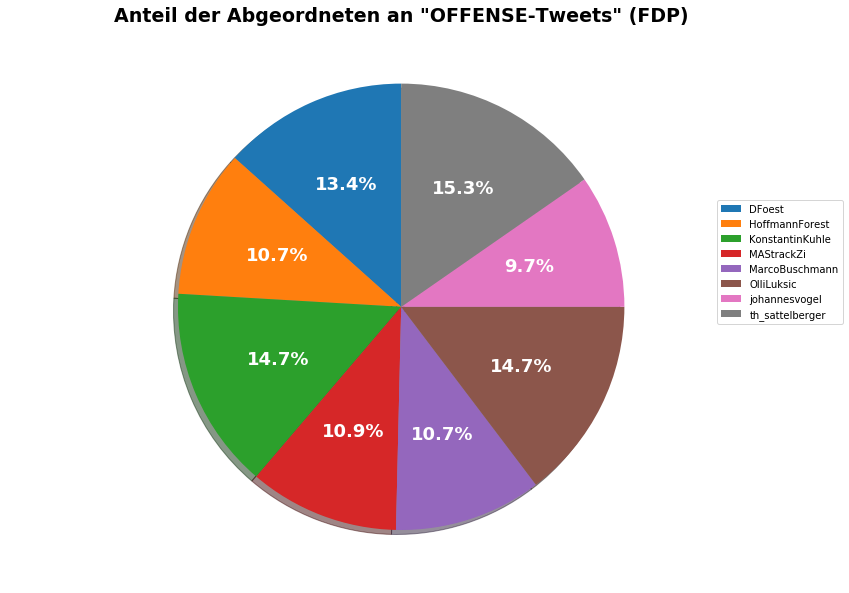

In [13]:
mdp_partei_OF = mdp_partei.loc[(mdp_partei['predict'] == 'OFFENSE')]
partei_piv_pie = pd.pivot_table(mdp_partei_OF, columns = ['user_party'], index = ['user_screen_name'], aggfunc = np.count_nonzero)
partei_piv_pie = partei_piv_pie['full_text'].fillna(0)

parteien = {}
parteien['AFD'] = partei_piv_pie[partei_piv_pie['AFD']>300]['AFD']
parteien['Gruene'] = partei_piv_pie[partei_piv_pie['Gruene']>100]['Gruene']
parteien['Linke'] = partei_piv_pie[partei_piv_pie['Linke']>150]['Linke']
parteien['SPD'] = partei_piv_pie[partei_piv_pie['SPD']>80]['SPD']
parteien['Union'] = partei_piv_pie[partei_piv_pie['Union']>80]['Union']
parteien['FDP'] = partei_piv_pie[partei_piv_pie['FDP']>100]['FDP']

fig1, ax1 = plt.subplots(figsize=(10, 15), subplot_kw=dict(aspect="equal"))

partei = 'FDP'
ax1.pie(parteien[partei],
        textprops=dict(color="w", size=18, weight="bold"),
        labels = parteien[partei].index, autopct='%1.1f%%', shadow=True, startangle=90)

ax1.legend(parteien[partei].index, bbox_to_anchor=(0.7, 0, 0.6, 0.7))
ax1.set_title('Anteil der Abgeordneten an "OFFENSE-Tweets" ('+ str(partei)+')', weight = 'bold', size = 19)

plt.show()

### Relative Übersicht

In [9]:
mdp_partei = sent_df_Wien[['user_party', 'week', 'date', 'user_screen_name', 'full_text', 'predict']]
#mdp_partei = mdp_partei.loc[(mdp_partei['predict'] == 'OFFENSE') & (mdp_partei['date'] >= datetime.date(2019,10,25))]
partei_piv = pd.pivot_table(mdp_partei, columns = ['user_party'], index = ['week'], aggfunc = np.count_nonzero)
# partei_piv['full_text']

In [10]:
mdp_partei = sent_df_Wien[['user_party', 'week', 'date', 'user_screen_name', 'full_text', 'predict']]

mdp_partei_nom = mdp_partei.loc[(mdp_partei['predict'] == 'OFFENSE') & (mdp_partei['date'] >= datetime.date(2019,10,25))]
partei_piv_nom = pd.pivot_table(mdp_partei_nom, columns = ['user_party'], index = ['week'], aggfunc = np.count_nonzero)
partei_piv_nom = partei_piv_nom['date']

mdp_partei_denom = mdp_partei.loc[(mdp_partei['date'] >= datetime.date(2019,10,25))]
partei_piv_denom = pd.pivot_table(mdp_partei_denom, columns = ['user_party'], index = ['week'], aggfunc = np.count_nonzero)
partei_piv_denom = partei_piv_denom['date']

partei_piv_rel = (partei_piv_nom/partei_piv_denom) * 100
partei_piv_rel = partei_piv_rel.round()
# partei_piv_rel

In [11]:
pd.set_option('display.max_rows', None)
fin_df.loc[(fin_df)['date'] == datetime.date(2020,2,19)][['date', 'week']]
#df = fin_df.loc[fin_df['week'] == '20-w25'][['date', 'week']]
#set(df['date'])

#fin_df.loc[(fin_df['week'] == '20-w25')][['full_text', 'user_party']]

,date,week
4,2020-02-19,20-w07
12,2020-02-19,20-w07
18,2020-02-19,20-w07
22,2020-02-19,20-w07
23,2020-02-19,20-w07
46,2020-02-19,20-w07
47,2020-02-19,20-w07
60,2020-02-19,20-w07
61,2020-02-19,20-w07
66,2020-02-19,20-w07


Text(0.85, 0.3, '20. auf 21.06.:\nKrawallnacht\nin Stuttgart')

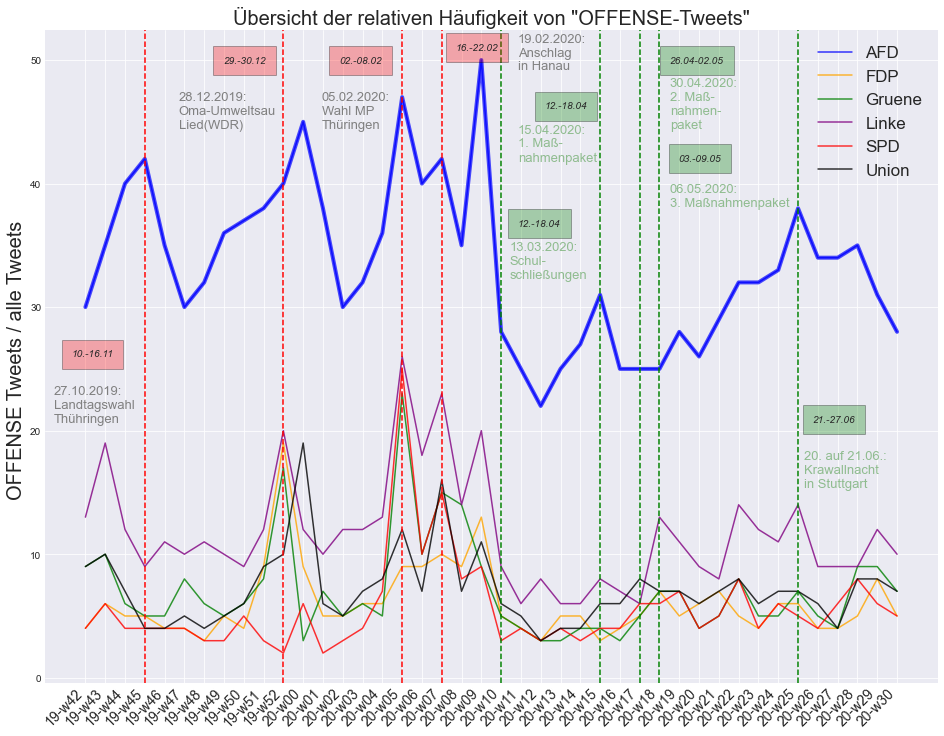

In [12]:
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import pandas as pd
import numpy as np

plt.style.use('seaborn-darkgrid')
my_palette = ['blue', 'orange', 'green', 'purple', 'red', 'black']

fig = plt.figure(figsize = (16, 12))
ax = fig.add_subplot(111)

num=0
for column in partei_piv_rel:
    ax.plot(partei_piv_rel.index, partei_piv_rel[column], color = my_palette[num], alpha=0.8, label = column)
    num+=1

ax.plot(partei_piv_rel.index, partei_piv_rel['AFD'], marker='', color='blue', linewidth=4, alpha=0.7)
#ax.plot(partei_piv_rel.index, partei_piv_rel['full_text']['SPD'], marker='', color='red', linewidth=4, alpha=0.7)
#ax.plot(partei_piv_rel.index, partei_piv_rel['full_text']['Linke'], marker='', color='purple', linewidth=4, alpha=0.7)
#ax.plot(partei_piv_rel.index, partei_piv_rel['full_text']['FDP'], marker='', color='orange', linewidth=4, alpha=0.7)

ax.set_title('Übersicht der relativen Häufigkeit von "OFFENSE-Tweets"', size = 20)
ylab = ax.set_ylabel('OFFENSE Tweets / alle Tweets ', size = 20)
# = ax.set_xlabel('Datum', size = 20)
plt.legend(loc = 1, ncol = 1, fontsize = 17)

#x_tags
x_tags = plt.xticks(partei_piv_rel.index, fontsize = 14, rotation = 45, ha = "right")



# Verdeutlichungen in der Grafik
ax.axvline('19-w45', ls='--', color='r')
ax.text(0.03, 0.5, '10.-16.11', style='italic', bbox={'facecolor': 'red', 'alpha': 0.3, 'pad': 10}, transform=ax.transAxes)
ax.text(0.01, 0.4, '27.10.2019:\nLandtagswahl\nThühringen', color='grey', fontsize=13, transform=ax.transAxes)

ax.axvline('19-w52', ls='--', color='r')
ax.text(0.2, 0.95, '29.-30.12', style='italic', bbox={'facecolor': 'red', 'alpha': 0.3, 'pad': 10}, transform=ax.transAxes)
ax.text(0.15, 0.85, '28.12.2019:\nOma-Umweltsau\nLied(WDR)', color='grey', fontsize=13, transform=ax.transAxes)

ax.axvline('20-w05', ls='--', color='r')
ax.text(0.33, 0.95, '02.-08.02', style='italic', bbox={'facecolor': 'red', 'alpha': 0.3, 'pad': 10}, transform=ax.transAxes)
ax.text(0.31, 0.85, '05.02.2020:\nWahl MP \nThüringen', color='grey', fontsize=13, transform=ax.transAxes)

ax.axvline('20-w07', ls='--', color='r')
ax.text(0.46, 0.97, '16.-22.02', style='italic', bbox={'facecolor': 'red', 'alpha': 0.3, 'pad': 10}, transform=ax.transAxes)
ax.text(0.53, 0.94, '19.02.2020:\nAnschlag \nin Hanau', color='grey', fontsize=13, transform=ax.transAxes)

############# Corona ######
ax.axvline('20-w10', ls='--', color='g')
ax.text(0.53, 0.7, '12.-18.04', style='italic', bbox={'facecolor': 'green', 'alpha': 0.3, 'pad': 10}, transform=ax.transAxes)
ax.text(0.52, 0.62, '13.03.2020:\nSchul-\nschließungen', color='darkseagreen', fontsize=13, transform=ax.transAxes)

ax.axvline('20-w15', ls='--', color='g')
ax.text(0.56, 0.88, '12.-18.04', style='italic', bbox={'facecolor': 'green', 'alpha': 0.3, 'pad': 10}, transform=ax.transAxes)
ax.text(0.53, 0.80, '15.04.2020:\n1. Maß- \nnahmenpaket', color='darkseagreen', fontsize=13, transform=ax.transAxes)

ax.axvline('20-w17', ls='--', color='g')
ax.text(0.7, 0.95, '26.04-02.05', style='italic', bbox={'facecolor': 'green', 'alpha': 0.3, 'pad': 10}, transform=ax.transAxes)
ax.text(0.7, 0.85, '30.04.2020:\n2. Maß- \nnahmen-\npaket', color='darkseagreen', fontsize=13, transform=ax.transAxes)

ax.axvline('20-w18', ls='--', color='g')
ax.text(0.71, 0.8, '03.-09.05', style='italic', bbox={'facecolor': 'green', 'alpha': 0.3, 'pad': 10}, transform=ax.transAxes)
ax.text(0.7, 0.73, '06.05.2020:\n3. Maßnahmenpaket', color='darkseagreen', fontsize=13, transform=ax.transAxes)

ax.axvline('20-w25', ls='--', color='g')
ax.text(0.86, 0.4, '21.-27.06', style='italic', bbox={'facecolor': 'green', 'alpha': 0.3, 'pad': 10}, transform=ax.transAxes)
ax.text(0.85, 0.3, '20. auf 21.06.:\nKrawallnacht\nin Stuttgart', color='darkseagreen', fontsize=13, transform=ax.transAxes)


### Absolute Übersicht

In [11]:
mdp_partei = sent_df_Wien[['user_party', 'week', 'date', 'user_screen_name', 'full_text', 'predict']]
mdp_partei = mdp_partei.loc[(mdp_partei['predict'] == 'OFFENSE') & (mdp_partei['date'] >= datetime.date(2019,10,25))]
partei_piv = pd.pivot_table(mdp_partei, columns = ['user_party'], index = ['week'], aggfunc = np.count_nonzero).fillna(0)
# partei_piv

Text(0.85, 0.35, '20. auf 21.06.:\nKrawallnacht\nin Stuttgart')

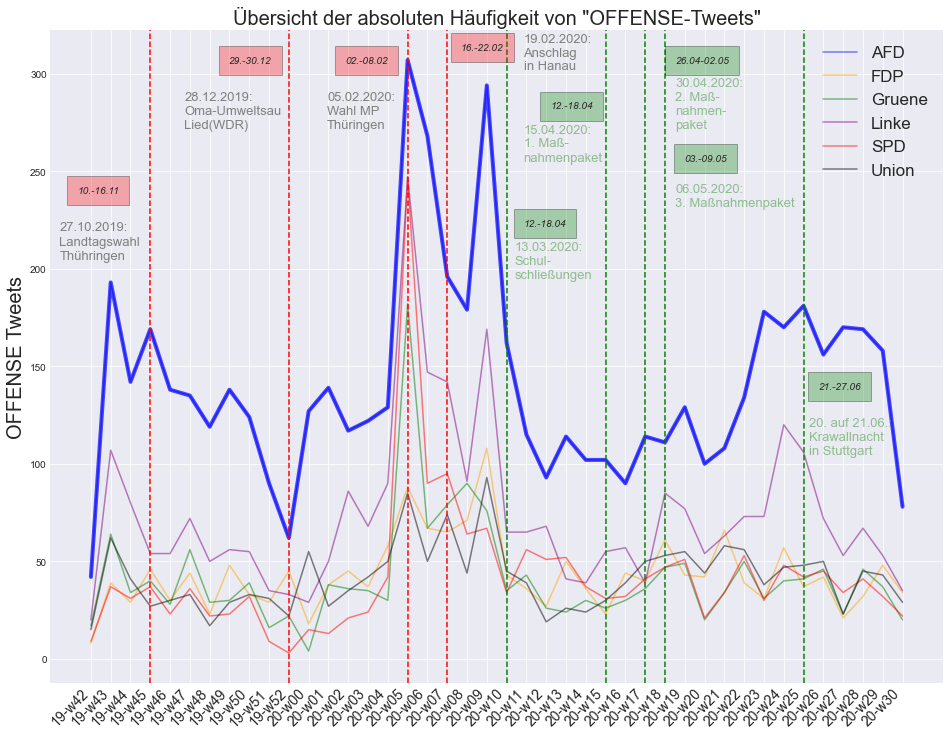

In [12]:
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import pandas as pd
import numpy as np

plt.style.use('seaborn-darkgrid')
my_palette = ['blue', 'orange', 'green', 'purple', 'red', 'black']

fig = plt.figure(figsize = (16, 12))
ax = fig.add_subplot(111)

num=0
for column in partei_piv['full_text']:
    ax.plot(partei_piv.index, partei_piv['full_text'][column], color = my_palette[num], alpha=0.5, label = column)
    num+=1

ax.plot(partei_piv.index, partei_piv['full_text']['AFD'], marker='', color='blue', linewidth=4, alpha=0.7)
#ax.plot(partei_piv.index, partei_piv['full_text']['SPD'], marker='', color='red', linewidth=4, alpha=0.7)
#ax.plot(partei_piv.index, partei_piv['full_text']['Linke'], marker='', color='purple', linewidth=4, alpha=0.7)
#ax.plot(partei_piv.index, partei_piv['full_text']['FDP'], marker='', color='orange', linewidth=4, alpha=0.7)
#ax.plot(partei_piv.index, partei_piv['full_text']['Union'], marker='', color='black', linewidth=4, alpha=0.7)
#ax.plot(partei_piv.index, partei_piv['full_text']['Gruene'], marker='', color='green', linewidth=4, alpha=0.7)

ax.set_title('Übersicht der absoluten Häufigkeit von "OFFENSE-Tweets"', size = 20)
ylab = ax.set_ylabel('OFFENSE Tweets', size = 20)
# = ax.set_xlabel('Datum', size = 20)
plt.legend(loc = 1, ncol = 1, fontsize = 17)

#x_tags
x_tags = plt.xticks(partei_piv.index, fontsize = 14, rotation = 45, ha = "right")


# Verdeutlichungen in der Grafik
ax.axvline('19-w45', ls='--', color='r')
ax.text(0.03, 0.75, '10.-16.11', style='italic', bbox={'facecolor': 'red', 'alpha': 0.3, 'pad': 10}, transform=ax.transAxes)
ax.text(0.01, 0.65, '27.10.2019:\nLandtagswahl\nThühringen', color='grey', fontsize=13, transform=ax.transAxes)

ax.axvline('19-w52', ls='--', color='r')
ax.text(0.2, 0.95, '29.-30.12', style='italic', bbox={'facecolor': 'red', 'alpha': 0.3, 'pad': 10}, transform=ax.transAxes)
ax.text(0.15, 0.85, '28.12.2019:\nOma-Umweltsau\nLied(WDR)', color='grey', fontsize=13, transform=ax.transAxes)

ax.axvline('20-w05', ls='--', color='r')
ax.text(0.33, 0.95, '02.-08.02', style='italic', bbox={'facecolor': 'red', 'alpha': 0.3, 'pad': 10}, transform=ax.transAxes)
ax.text(0.31, 0.85, '05.02.2020:\nWahl MP \nThüringen', color='grey', fontsize=13, transform=ax.transAxes)

ax.axvline('20-w07', ls='--', color='r')
ax.text(0.46, 0.97, '16.-22.02', style='italic', bbox={'facecolor': 'red', 'alpha': 0.3, 'pad': 10}, transform=ax.transAxes)
ax.text(0.53, 0.94, '19.02.2020:\nAnschlag \nin Hanau', color='grey', fontsize=13, transform=ax.transAxes)

ax.axvline('20-w10', ls='--', color='g')
ax.text(0.53, 0.7, '12.-18.04', style='italic', bbox={'facecolor': 'green', 'alpha': 0.3, 'pad': 10}, transform=ax.transAxes)
ax.text(0.52, 0.62, '13.03.2020:\nSchul-\nschließungen', color='darkseagreen', fontsize=13, transform=ax.transAxes)

ax.axvline('20-w15', ls='--', color='g')
ax.text(0.56, 0.88, '12.-18.04', style='italic', bbox={'facecolor': 'green', 'alpha': 0.3, 'pad': 10}, transform=ax.transAxes)
ax.text(0.53, 0.80, '15.04.2020:\n1. Maß- \nnahmenpaket', color='darkseagreen', fontsize=13, transform=ax.transAxes)

ax.axvline('20-w17', ls='--', color='g')
ax.text(0.7, 0.95, '26.04-02.05', style='italic', bbox={'facecolor': 'green', 'alpha': 0.3, 'pad': 10}, transform=ax.transAxes)
ax.text(0.7, 0.85, '30.04.2020:\n2. Maß- \nnahmen-\npaket', color='darkseagreen', fontsize=13, transform=ax.transAxes)

ax.axvline('20-w18', ls='--', color='g')
ax.text(0.71, 0.8, '03.-09.05', style='italic', bbox={'facecolor': 'green', 'alpha': 0.3, 'pad': 10}, transform=ax.transAxes)
ax.text(0.7, 0.73, '06.05.2020:\n3. Maßnahmenpaket', color='darkseagreen', fontsize=13, transform=ax.transAxes)

ax.axvline('20-w25', ls='--', color='g')
ax.text(0.86, 0.45, '21.-27.06', style='italic', bbox={'facecolor': 'green', 'alpha': 0.3, 'pad': 10}, transform=ax.transAxes)
ax.text(0.85, 0.35, '20. auf 21.06.:\nKrawallnacht\nin Stuttgart', color='darkseagreen', fontsize=13, transform=ax.transAxes)


In [5]:
sent_df_Wien.columns

Index(['_id', 'created_at', 'id', 'full_text', 'is_quote_status',
       'retweet_count', 'lang', 'created_at_datetime', 'user_id', 'user_name',
       'user_screen_name', 'user_location', 'user_description',
       'user_followers_count', 'user_friends_count', 'user_created_at',
       'partei', 'user_party', 'full_text_processed', 'Monat', 'Woche',
       'predict', 'date', 'month', 'week'],
      dtype='object')

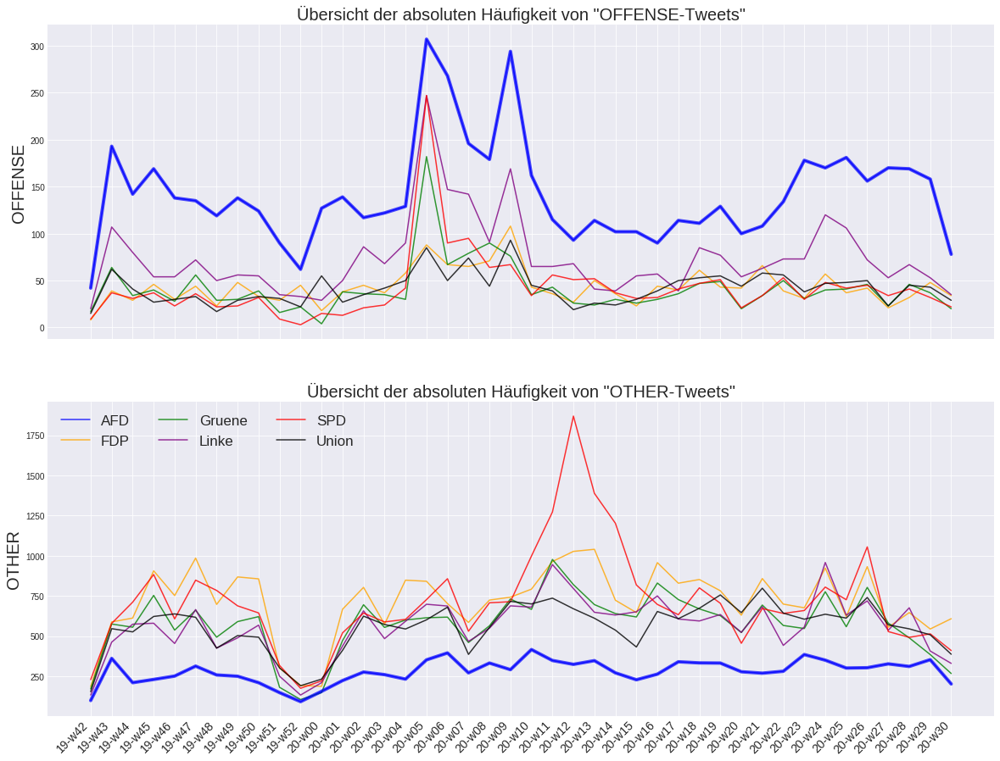

In [10]:
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import pandas as pd
import numpy as np

predict = ['OFFENSE', 'OTHER']
mdp_partei = sent_df_Wien[['user_party', 'month', 'week', 'date', 'user_screen_name', 'full_text', 'predict']]

plt.style.use('seaborn-darkgrid')
my_palette = ['blue', 'orange', 'green', 'purple', 'red', 'black']

fig = plt.figure(figsize = (20, 15))

mdp_partei_denom = mdp_partei.loc[(mdp_partei['date'] >= datetime.date(2019,10,25))]
partei_piv_TB_denom = pd.pivot_table(mdp_partei_denom, columns = ['user_party'], index = ['week'], aggfunc = np.count_nonzero)
partei_piv_TB_denom = partei_piv_TB_denom['date']

for cat, n in zip(predict, range(1,len(predict)+1)):
    mdp_partei_nom = mdp_partei.loc[(mdp_partei['predict'] == cat) & (mdp_partei['date'] >= datetime.date(2019,10,25))]
    partei_piv_TB_nom = pd.pivot_table(mdp_partei_nom, columns = ['user_party'], index = ['week'], aggfunc = np.count_nonzero)
    partei_piv_TB_nom = partei_piv_TB_nom['date']
    
    partei_piv_TB_rel = (partei_piv_TB_nom/partei_piv_TB_denom) * 100
    partei_piv_TB_rel = partei_piv_TB_rel.round()
    partei_piv_TB_rel = partei_piv_TB_nom



###############  plot #################
    ax = fig.add_subplot(2,1,n)

    num=0
    for column in partei_piv_TB_rel:
        ax.plot(partei_piv_TB_rel.index, partei_piv_TB_rel[column], color = my_palette[num], alpha=0.8, label = column)
        num+=1

    ax.plot(partei_piv_TB_rel.index, partei_piv_TB_rel['AFD'], marker='', color='blue', linewidth=4, alpha=0.7)

    ax.set_title('Übersicht der absoluten Häufigkeit von "' + cat + '-Tweets"', size = 20)
    ylab = ax.set_ylabel(cat, size = 20)
    if n <= 1:
        plt.setp(ax.get_xticklabels(), visible=False)
    else:
        x_tags = plt.xticks(partei_piv_TB_rel.index, fontsize = 14, rotation = 45, ha = "right")
        plt.legend(loc = 2, ncol = 3, fontsize = 17)




### Anteil der OFFENSE Tweets über den gesammten Datensatz hinweg

In [82]:
mdp_partei = sent_df_Wien[['user_party', 'month', 'user_screen_name', 'full_text', 'predict']]
# mdp_partei = mdp_partei[mdp_partei['predict'] == 'OFFENSE']
partei_piv_perc = pd.pivot_table(mdp_partei, columns = ['predict'], index = ['user_party'], aggfunc = np.count_nonzero).fillna(0)
partei_piv_perc['full_text']

predict,OFFENSE,OTHER
user_party,,
AFD,8836,17449
FDP,2652,43598
Gruene,2583,36349
Linke,4744,34716
SPD,2537,44067
Union,2588,36467


# Zeitraum Ansichten

### Oma Umweltsau Lied (WDR) am 28.12.2019

In [14]:
mdp_partei = sent_df_Wien[['user_party', 'week', 'date', 'user_screen_name', 'full_text', 'predict']]

# Zähler
mdp_WDR_nom = mdp_partei.loc[(mdp_partei['predict'] == 'OFFENSE') 
                                & (mdp_partei['date'] >= datetime.date(2019,12,24)) 
                                & (mdp_partei['date'] <= datetime.date(2020,1,11))]

WDR_piv_nom = pd.pivot_table(mdp_WDR_nom, columns = ['user_party'], index = ['date'], aggfunc = np.count_nonzero).fillna(0)
WDR_piv_nom = WDR_piv_nom['full_text']

# Nenner
mdp_WDR_denom = mdp_partei.loc[(mdp_partei['date'] >= datetime.date(2019,12,24)) 
                                  & (mdp_partei['date'] <= datetime.date(2020,1,11))]
WDR_piv_denom = pd.pivot_table(mdp_WDR_denom, columns = ['user_party'], index = ['date'], aggfunc = np.count_nonzero).fillna(0)
WDR_piv_denom = WDR_piv_denom['full_text']

# Relative Werte
WDR_piv_rel = (WDR_piv_nom/WDR_piv_denom) * 100
WDR_piv_rel = WDR_piv_rel.round()
#WDR_piv_rel = WDR_piv_nom

Text(0.5, 0.07, ' @FELIANNE1 @zardorak @ArminLaschet\nMan kann halt auch blind und taub sein.\nVor Ort wurde u. a. ein Lied mit antisem. Verschwörungen \n("Vereinigten Staaten die in Israels Auftrag die Welt versklaven") \nvorgetragen. \nUnd auf dem Bild unten sind keine Omas und Opas, \nsondern Nazi-Hooligans. \nhttps://t.co/ilbGy1ReKq')

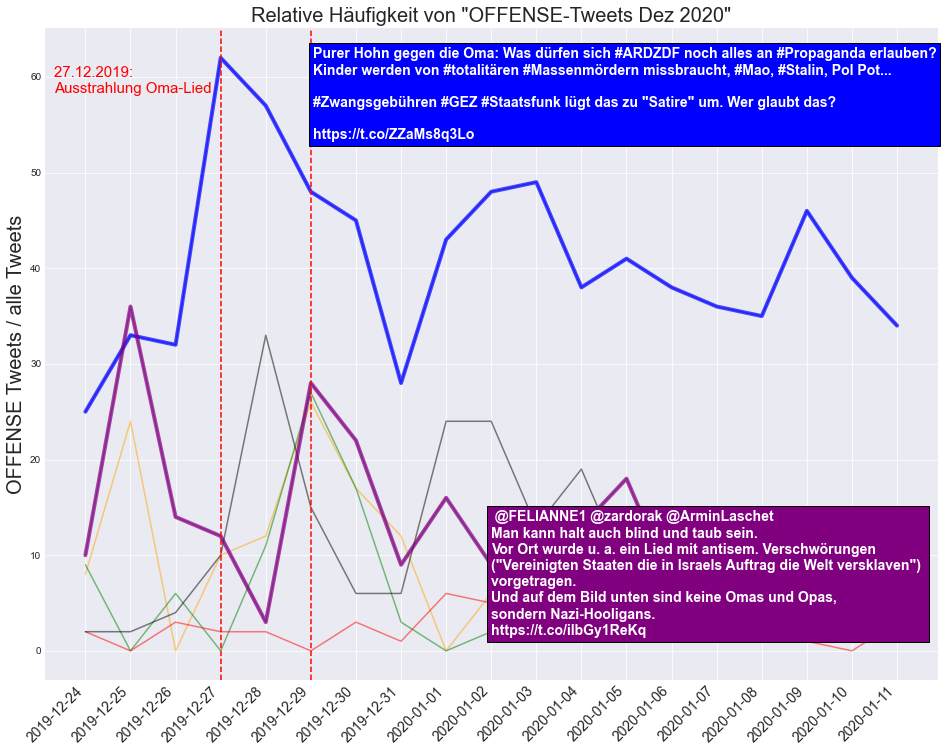

In [15]:
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import pandas as pd
import numpy as np

plt.style.use('seaborn-darkgrid')
my_palette = ['blue', 'orange', 'green', 'purple', 'red', 'black']

fig = plt.figure(figsize = (16, 12))
ax = fig.add_subplot(111)

num=0
for column in WDR_piv_rel:
    ax.plot(WDR_piv_rel.index, WDR_piv_rel[column], color = my_palette[num], alpha=0.5, label = column)
    num+=1

ax.plot(WDR_piv_rel.index, WDR_piv_rel['AFD'], marker='', color='blue', linewidth=4, alpha=0.7)
ax.plot(WDR_piv_rel.index, WDR_piv_rel['Linke'], marker='', color='purple', linewidth=4, alpha=0.7)

ax.set_title('Relative Häufigkeit von "OFFENSE-Tweets Dez 2020"', size = 20)
ylab = ax.set_ylabel('OFFENSE Tweets / alle Tweets', size = 20)
# = ax.set_xlabel('Datum', size = 20)
#plt.legend(loc = 1, ncol = 2, fontsize = 17)

#x_tags
x_tags = plt.xticks(WDR_piv_rel.index, fontsize = 14, rotation = 45, ha = "right")

# # Verdeutlichungen in der Grafik
ax.axvline(datetime.date(2019,12,27), ls='--', color='r')
ax.text(0.01, 0.9, '27.12.2019: \nAusstrahlung Oma-Lied', color='red', fontsize=15, transform=ax.transAxes)
ax.text(0.3, 0.83, 'Purer Hohn gegen die Oma: Was dürfen sich #ARDZDF noch alles an #Propaganda erlauben?\nKinder werden von #totalitären #Massenmördern missbraucht, #Mao, #Stalin, Pol Pot...\n\n#Zwangsgebühren #GEZ #Staatsfunk lügt das zu "Satire" um. Wer glaubt das?\n\nhttps://t.co/ZZaMs8q3Lo', 
        color='w', weight = 'bold', fontsize = 14, bbox={'facecolor': 'blue'}, transform=ax.transAxes)


ax.axvline(datetime.date(2019,12,29), ls='--', color='r')
ax.text(0.5, 0.07, ' @FELIANNE1 @zardorak @ArminLaschet\nMan kann halt auch blind und taub sein.\nVor Ort wurde u. a. ein Lied mit antisem. Verschwörungen \n("Vereinigten Staaten die in Israels Auftrag die Welt versklaven") \nvorgetragen. \nUnd auf dem Bild unten sind keine Omas und Opas, \nsondern Nazi-Hooligans. \nhttps://t.co/ilbGy1ReKq', 
        color='w', weight = 'bold', fontsize = 14, bbox={'facecolor': 'purple'}, transform=ax.transAxes)


In [18]:
##### pd.set_option('display.max_rows', None)
pd.set_option('display.max_colwidth', None)
sent_df_Wien.loc[
    #(sent_df_Wien['week'] == '20-w09') 
                (sent_df_Wien['date'] <= datetime.date(2019,1,1)) 
                #&(sent_df_Wien['date'] < datetime.date(2018,1,3)) 
                & (sent_df_Wien['user_name'] == 'Beatrix von Storch')
                 & (sent_df_Wien['user_party'] == 'AFD')
                 #& (sent_df_Wien['predict'] == 'OFFENSE')
                ][['user_name', 'created_at_datetime', 'full_text', 'predict']]

,user_name,created_at_datetime,full_text,predict


### Thüringen MP Wahl am 05.02.2020

In [16]:
mdp_partei = sent_df_Wien[['user_party', 'week', 'date', 'user_screen_name', 'full_text', 'predict']]

# Zähler
mdp_TW_nom = mdp_partei.loc[(mdp_partei['predict'] == 'OFFENSE') 
                                & (mdp_partei['date'] >= datetime.date(2020,1,13)) 
                                & (mdp_partei['date'] <= datetime.date(2020,2,14))]

TW_piv_nom = pd.pivot_table(mdp_TW_nom, columns = ['user_party'], index = ['date'], aggfunc = np.count_nonzero).fillna(0)
TW_piv_nom = TW_piv_nom['full_text']

# Nenner
mdp_TW_denom = mdp_partei.loc[(mdp_partei['date'] >= datetime.date(2020,1,13)) 
                                  & (mdp_partei['date'] <= datetime.date(2020,2,14))]
TW_piv_denom = pd.pivot_table(mdp_TW_denom, columns = ['user_party'], index = ['date'], aggfunc = np.count_nonzero).fillna(0)
TW_piv_denom = TW_piv_denom['full_text']

# Relative Werte
TW_piv_rel = (TW_piv_nom/TW_piv_denom) * 100
TW_piv_rel = TW_piv_rel.round()
#TW_piv_rel = TW_piv_nom

Text(0.71, 0.75, '05.02.2020:\nWahl MP \nThüringen')

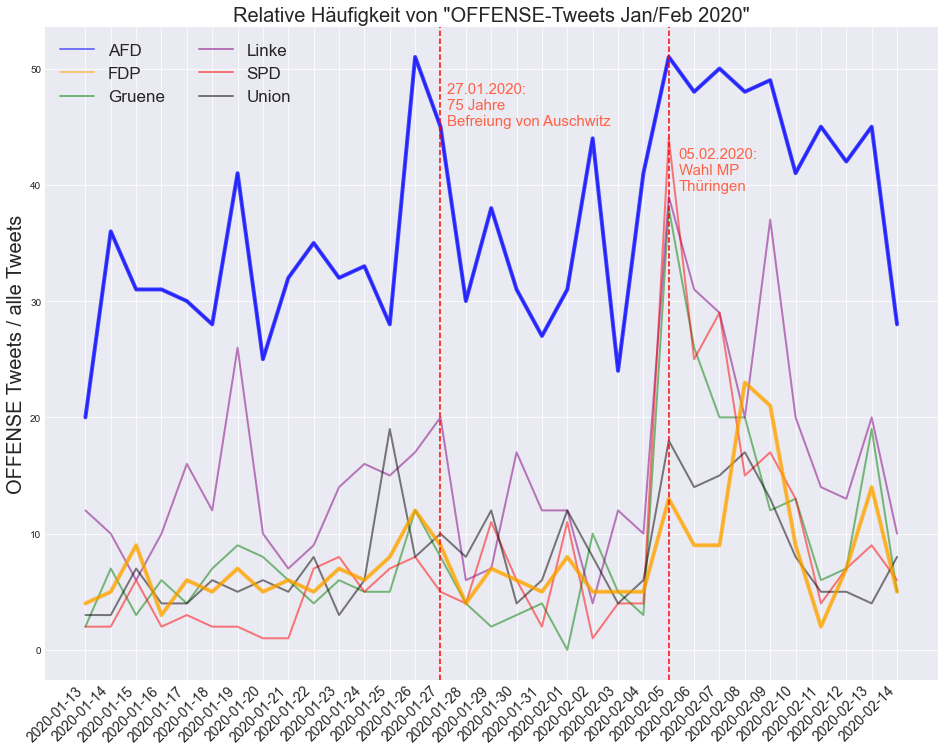

In [17]:
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import pandas as pd
import numpy as np

plt.style.use('seaborn-darkgrid')
my_palette = ['blue', 'orange', 'green', 'purple', 'red', 'black']

fig = plt.figure(figsize = (16, 12))
ax = fig.add_subplot(111)

num=0
for column in TW_piv_rel:
    ax.plot(TW_piv_rel.index, TW_piv_rel[column], color = my_palette[num], linewidth=2, alpha=0.5, label = column)
    num+=1

ax.plot(TW_piv_rel.index, TW_piv_rel['AFD'], marker='', color='blue', linewidth=4, alpha=0.7)
ax.plot(TW_piv_rel.index, TW_piv_rel['FDP'], marker='', color='orange', linewidth=4, alpha=0.7)

ax.set_title('Relative Häufigkeit von "OFFENSE-Tweets Jan/Feb 2020"', size = 20)
ylab = ax.set_ylabel('OFFENSE Tweets / alle Tweets', size = 20)
# = ax.set_xlabel('Datum', size = 20)
plt.legend(loc = 2, ncol = 2, fontsize = 17)

#x_tags
x_tags = plt.xticks(TW_piv_rel.index, fontsize = 14, rotation = 45, ha = "right")

# # Verdeutlichungen in der Grafik
ax.axvline(datetime.date(2020,1,27), ls='--', color='r')
ax.text(0.45, 0.85, '27.01.2020: \n75 Jahre \nBefreiung von Auschwitz', color='tomato', fontsize=15, transform=ax.transAxes)

ax.axvline(datetime.date(2020,2,5), ls='--', color='r')
ax.text(0.71, 0.75, '05.02.2020:\nWahl MP \nThüringen', color='tomato', fontsize=15, transform=ax.transAxes)


In [87]:
mdp_partei = sent_df_Wien[['user_party', 'week', 'date', 'user_screen_name', 'full_text', 'predict']]
mdp_TW_nom = mdp_partei.loc[(mdp_partei['predict'] == 'OFFENSE') 
                                & (mdp_partei['date'] >= datetime.date(2020,1,13)) 
                                & (mdp_partei['date'] <= datetime.date(2020,2,14))]
TW_piv_nom = pd.pivot_table(mdp_TW_nom, columns = ['user_party'], index = ['date'], aggfunc = np.count_nonzero).fillna(0)
TW_piv_nom = TW_piv_nom['full_text']

Text(0.72, 0.77, '05.02.2020:\nWahl MP \nThüringen')

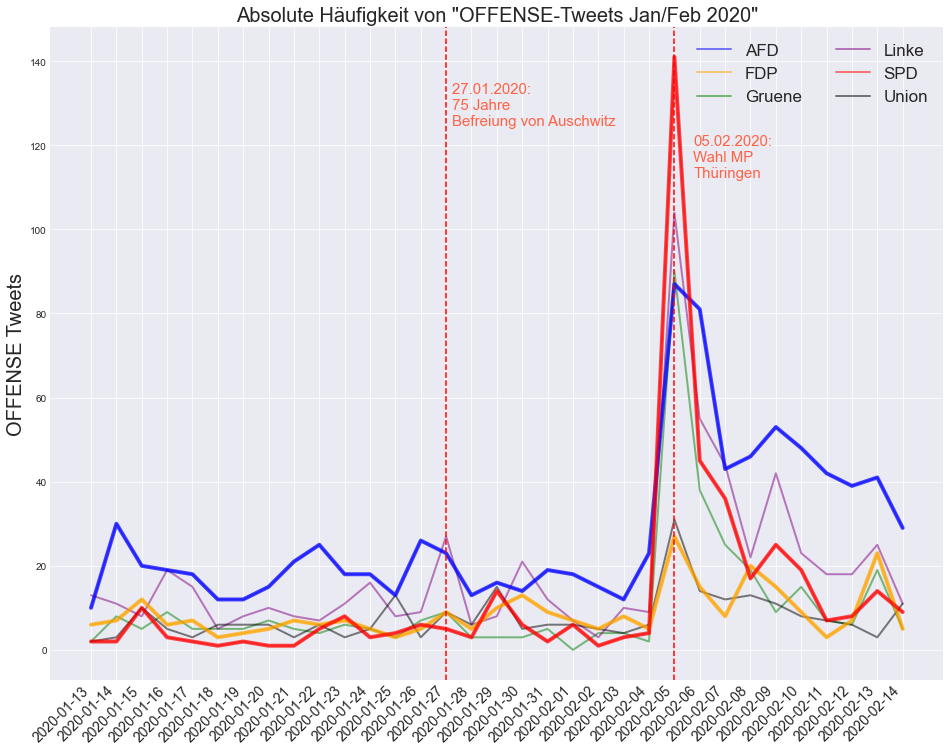

In [18]:
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import pandas as pd
import numpy as np

plt.style.use('seaborn-darkgrid')
my_palette = ['blue', 'orange', 'green', 'purple', 'red', 'black']

fig = plt.figure(figsize = (16, 12))
ax = fig.add_subplot(111)

num=0
for column in TW_piv_nom:
    ax.plot(TW_piv_nom.index, TW_piv_nom[column], color = my_palette[num], linewidth=2, alpha=0.5, label = column)
    num+=1

ax.plot(TW_piv_nom.index, TW_piv_nom['AFD'], marker='', color='blue', linewidth=4, alpha=0.7)
ax.plot(TW_piv_nom.index, TW_piv_nom['FDP'], marker='', color='orange', linewidth=4, alpha=0.7)
ax.plot(TW_piv_nom.index, TW_piv_nom['SPD'], marker='', color='red', linewidth=4, alpha=0.7)

ax.set_title('Absolute Häufigkeit von "OFFENSE-Tweets Jan/Feb 2020"', size = 20)
ylab = ax.set_ylabel('OFFENSE Tweets', size = 20)
# = ax.set_xlabel('Datum', size = 20)
plt.legend(loc = 1, ncol = 2, fontsize = 17)

#x_tags
x_tags = plt.xticks(TW_piv_nom.index, fontsize = 14, rotation = 45, ha = "right")

# # Verdeutlichungen in der Grafik
ax.axvline(datetime.date(2020,1,27), ls='--', color='r')
ax.text(0.45, 0.85, '27.01.2020: \n75 Jahre \nBefreiung von Auschwitz', color='tomato', fontsize=15, transform=ax.transAxes)

ax.axvline(datetime.date(2020,2,5), ls='--', color='r')
ax.text(0.72, 0.77, '05.02.2020:\nWahl MP \nThüringen', color='tomato', fontsize=15, transform=ax.transAxes)


(0.0, 160.0)

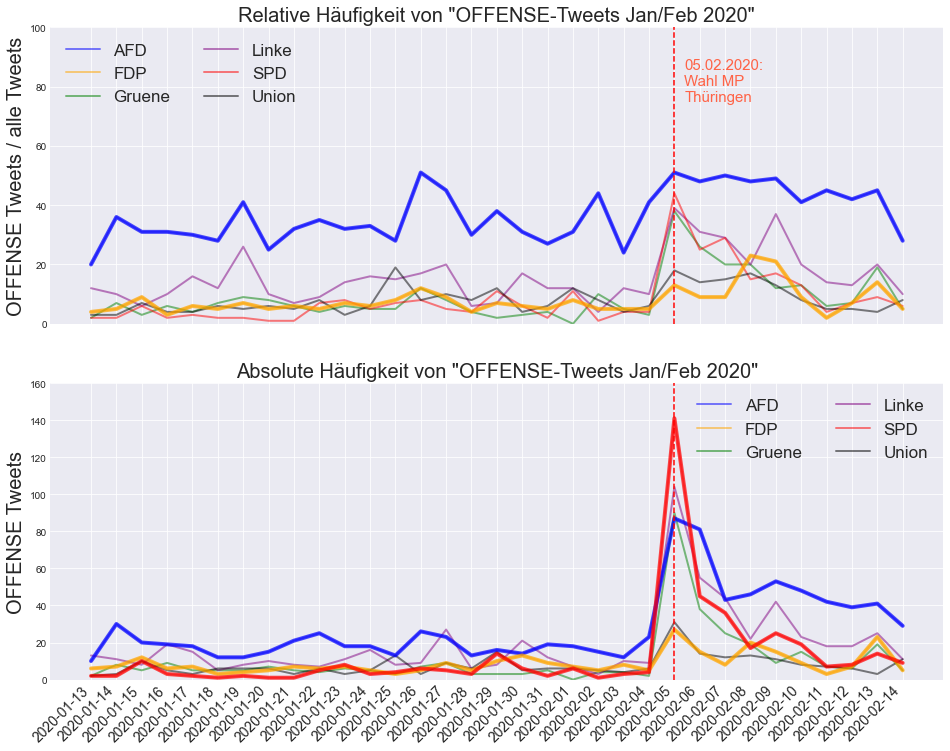

In [20]:
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import pandas as pd
import numpy as np

plt.style.use('seaborn-darkgrid')
my_palette = ['blue', 'orange', 'green', 'purple', 'red', 'black']
fig = plt.figure(figsize = (16, 12))
ax = fig.add_subplot(211)

num=0
for column in TW_piv_rel:
    ax.plot(TW_piv_rel.index, TW_piv_rel[column], color = my_palette[num], linewidth=2, alpha=0.5, label = column)
    num+=1

ax.plot(TW_piv_rel.index, TW_piv_rel['AFD'], marker='', color='blue', linewidth=4, alpha=0.7)
ax.plot(TW_piv_rel.index, TW_piv_rel['FDP'], marker='', color='orange', linewidth=4, alpha=0.7)

ax.set_title('Relative Häufigkeit von "OFFENSE-Tweets Jan/Feb 2020"', size = 20)
ylab = ax.set_ylabel('OFFENSE Tweets / alle Tweets', size = 20)
# = ax.set_xlabel('Datum', size = 20)
plt.legend(loc = 2, ncol = 2, fontsize = 17)

#x_tags
x_tags = plt.xticks(TW_piv_rel.index, fontsize = 14, rotation = 45, ha = "right")

# # Verdeutlichungen in der Grafik
ax.axvline(datetime.date(2020,2,5), ls='--', color='r')
ax.text(0.71, 0.75, '05.02.2020:\nWahl MP \nThüringen', color='tomato', fontsize=15, transform=ax.transAxes)

#x_tags
plt.setp(ax.get_xticklabels(), visible=False)
plt.ylim((0, 100))

######## Second graph

ax = fig.add_subplot(212)

num=0
for column in TW_piv_nom:
    ax.plot(TW_piv_nom.index, TW_piv_nom[column], color = my_palette[num], linewidth=2, alpha=0.5, label = column)
    num+=1

ax.plot(TW_piv_nom.index, TW_piv_nom['AFD'], marker='', color='blue', linewidth=4, alpha=0.7)
ax.plot(TW_piv_nom.index, TW_piv_nom['FDP'], marker='', color='orange', linewidth=4, alpha=0.7)
ax.plot(TW_piv_nom.index, TW_piv_nom['SPD'], marker='', color='red', linewidth=4, alpha=0.7)

ax.set_title('Absolute Häufigkeit von "OFFENSE-Tweets Jan/Feb 2020"', size = 20)
ylab = ax.set_ylabel('OFFENSE Tweets', size = 20)
# = ax.set_xlabel('Datum', size = 20)
plt.legend(loc = 1, ncol = 2, fontsize = 17)

#x_tags
x_tags = plt.xticks(TW_piv_nom.index, fontsize = 14, rotation = 45, ha = "right")

# # Verdeutlichungen in der Grafik
ax.axvline(datetime.date(2020,2,5), ls='--', color='r')

plt.ylim((0, 160))

In [29]:
pd.set_option('display.max_colwidth', None)
sent_df_Wien.loc[(sent_df_Wien['date'] == datetime.date(2019,12,21)) 
                 & (sent_df_Wien['user_party'] == 'FDP')
                 & (sent_df_Wien['predict'] == 'OTHER')
                ]['full_text']

2916                                                      „Es geht nicht um den Klimaschutz, sondern um eine Unterversorgung von Vernunft“ ⁦@c_lindner⁩ in einem starken Interview im ⁦@DerSPIEGEL⁩ Herausforderungen lösen wir nicht mit Verzicht, sondern nur mit Innovationen #lindner #Deutschland  https://t.co/qBs1pkeO90
2983                                                                                                                                                                                                                                  Die Deutsche Bahn weiß nicht, wohin mit ihrem Geld | SPIEGEL Plus https://t.co/4WtyFeAuiu
2984                                       „Sein Buch ist ein Plädoyer für Rationalität und gegen die Moralisierung der Politik. Symptomatisch für die Moralisierung des öffentlichen Diskurses stehe die Greta-Thunberg-Bewegung, die „vor allem bei Deutschen quasi-religiöse Züge“ angenommen habe“  https://t.co/9byt1DoMrc
2985                                    

### Anschlag in Hanau am 19.02.2020

In [22]:
mdp_partei = sent_df_Wien[['user_party', 'week', 'date', 'user_screen_name', 'full_text', 'predict']]

# Zähler
mdp_Hanau_nom = mdp_partei.loc[(mdp_partei['predict'] == 'OFFENSE') 
                                & (mdp_partei['date'] >= datetime.date(2020,2,15)) 
                                & (mdp_partei['date'] <= datetime.date(2020,3,1))]

Hanau_piv_nom = pd.pivot_table(mdp_Hanau_nom, columns = ['user_party'], index = ['date'], aggfunc = np.count_nonzero).fillna(0)
Hanau_piv_nom = Hanau_piv_nom['full_text']

# Nenner
mdp_Hanau_denom = mdp_partei.loc[(mdp_partei['date'] >= datetime.date(2020,2,15)) 
                                  & (mdp_partei['date'] <= datetime.date(2020,3,1))]
Hanau_piv_denom = pd.pivot_table(mdp_Hanau_denom, columns = ['user_party'], index = ['date'], aggfunc = np.count_nonzero).fillna(0)
Hanau_piv_denom = Hanau_piv_denom['full_text']

# Relative Werte
Hanau_piv_rel = (Hanau_piv_nom/Hanau_piv_denom) * 100
Hanau_piv_rel = Hanau_piv_rel.round()
# Hanau_piv_rel

In [23]:
# pd.set_option('display.max_colwidth', None)
mdp_partei.loc[(mdp_partei['predict'] == 'OFFENSE') 
                                & (mdp_partei['date'] >= datetime.date(2020,2,15)) 
                                & (mdp_partei['date'] <= datetime.date(2020,3,1))]['full_text']

set(mdp_partei.loc[(mdp_partei['predict'] == 'OFFENSE') 
                                & (mdp_partei['date'] >= datetime.date(2020,2,15)) 
                                & (mdp_partei['date'] <= datetime.date(2020,3,1))]['week'])

{'20-w06', '20-w07', '20-w08', '20-w09'}

(0.0, 100.0)

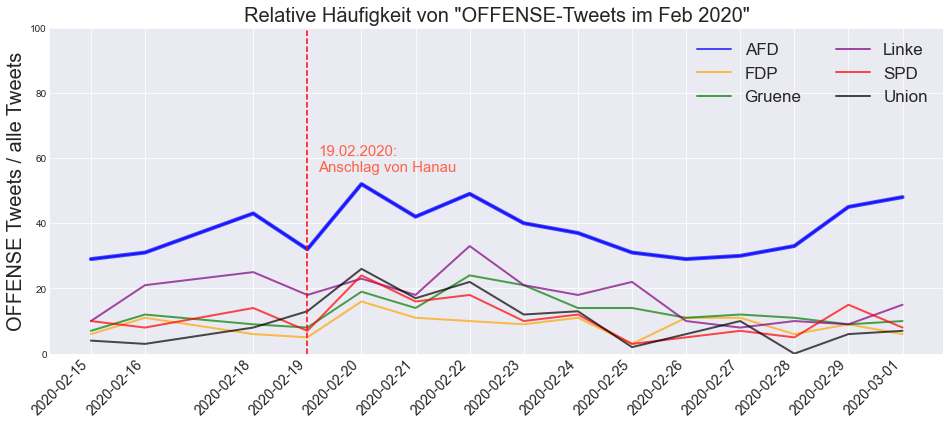

In [24]:
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import pandas as pd
import numpy as np

plt.style.use('seaborn-darkgrid')
my_palette = ['blue', 'orange', 'green', 'purple', 'red', 'black']

fig = plt.figure(figsize = (16, 6))
ax = fig.add_subplot(111)

num=0
for column in Hanau_piv_rel:
    ax.plot(Hanau_piv_rel.index, Hanau_piv_rel[column], color = my_palette[num], linewidth=2, alpha=0.7, label = column)
    num+=1

ax.plot(Hanau_piv_rel.index, Hanau_piv_rel['AFD'], marker='', color='blue', linewidth=4, alpha=0.7)
ax.set_title('Relative Häufigkeit von "OFFENSE-Tweets im Feb 2020"', size = 20)

ylab = ax.set_ylabel('OFFENSE Tweets / alle Tweets', size = 20)

# = ax.set_xlabel('Datum', size = 20)
plt.legend(loc = 1, ncol = 2, fontsize = 17)

#x_tags
x_tags = plt.xticks(Hanau_piv_rel.index, fontsize = 14, rotation = 45, ha = "right")

ax.axvline(datetime.date(2020,2,19), ls='--', color='r')
ax.text(0.3, 0.56, '19.02.2020:\nAnschlag von Hanau', color='tomato', fontsize=15, transform=ax.transAxes)
plt.ylim((0, 100))

Text(0.12, 0.85, '19.02.2020:\nAnschlag von Hanau')

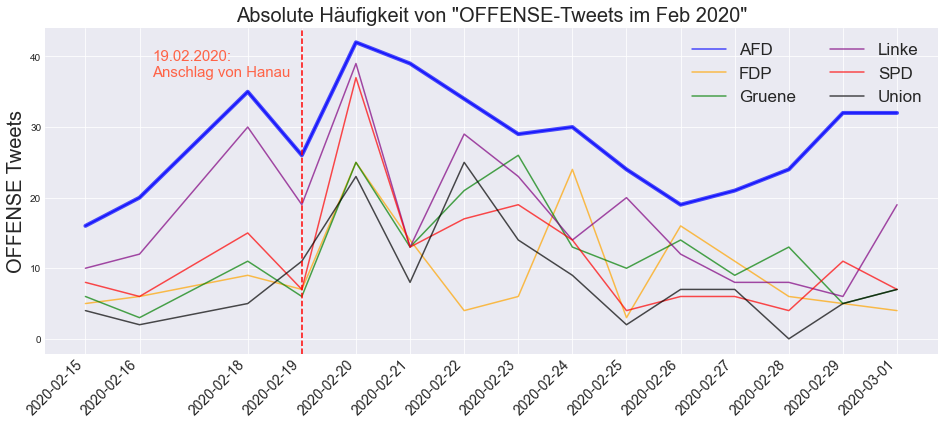

In [59]:
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import pandas as pd
import numpy as np

plt.style.use('seaborn-darkgrid')
my_palette = ['blue', 'orange', 'green', 'purple', 'red', 'black']

fig = plt.figure(figsize = (16, 6))
ax = fig.add_subplot(111)

num=0
for column in Hanau_piv_nom:
    ax.plot(Hanau_piv_nom.index, Hanau_piv_nom[column], color = my_palette[num], alpha=0.7, label = column)
    num+=1

ax.plot(Hanau_piv_nom.index, Hanau_piv_nom['AFD'], marker='', color='blue', linewidth=4, alpha=0.7)

ax.set_title('Absolute Häufigkeit von "OFFENSE-Tweets im Feb 2020"', size = 20)
ylab = ax.set_ylabel('OFFENSE Tweets', size = 20)
# = ax.set_xlabel('Datum', size = 20)
plt.legend(loc = 1, ncol = 2, fontsize = 17)

#x_tags
x_tags = plt.xticks(Hanau_piv_nom.index, fontsize = 14, rotation = 45, ha = "right")

ax.axvline(datetime.date(2020,2,19), ls='--', color='r')
ax.text(0.12, 0.85, '19.02.2020:\nAnschlag von Hanau', color='tomato', fontsize=15, transform=ax.transAxes)


## Corona

In [177]:
# pd.set_option('display.max_colwidth', None)
# sent_df_Wien.loc[(sent_df_Wien['date'] == datetime.date(2020,2,20)) 
#                  & (sent_df_Wien['user_party'] == 'AFD')
#                  & (sent_df_Wien['predict'] == 'OFFENSE')
#                 ]['full_text']

In [26]:
mdp_partei = sent_df_Wien[['user_party', 'week', 'date', 'user_screen_name', 'full_text', 'predict']]

# Zähler
mdp_Corona_nom = mdp_partei.loc[(mdp_partei['predict'] == 'OFFENSE') 
                                & (mdp_partei['date'] >= datetime.date(2020,3,1)) 
                                & (mdp_partei['date'] <= datetime.date(2020,5,10))]

Corona_piv_nom = pd.pivot_table(mdp_Corona_nom, columns = ['user_party'], index = ['date'], aggfunc = np.count_nonzero).fillna(0)
Corona_piv_nom = Corona_piv_nom['full_text']

# Nenner
mdp_Corona_denom = mdp_partei.loc[(mdp_partei['date'] >= datetime.date(2020,3,1)) 
                                  & (mdp_partei['date'] <= datetime.date(2020,5,10))]
Corona_piv_denom = pd.pivot_table(mdp_Corona_denom, columns = ['user_party'], index = ['date'], aggfunc = np.count_nonzero).fillna(0)
Corona_piv_denom = Corona_piv_denom['full_text']

# Relative Werte
Corona_piv_rel = (Corona_piv_nom/Corona_piv_denom) * 100
Corona_piv_rel = Corona_piv_rel.round()
# Corona_piv_rel

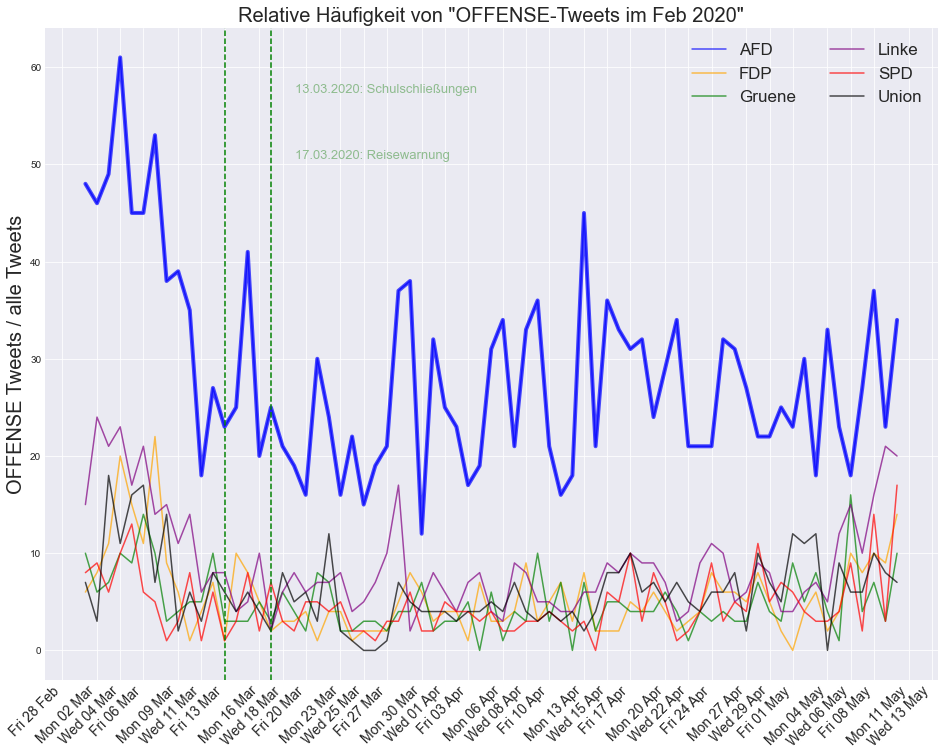

In [27]:
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
from matplotlib.dates import MO, TU, WE, TH, FR, SA, SU
import pandas as pd
import numpy as np

plt.style.use('seaborn-darkgrid')
my_palette = ['blue', 'orange', 'green', 'purple', 'red', 'black']

fig = plt.figure(figsize = (16, 12))
ax = fig.add_subplot(111)

num=0
for column in Corona_piv_rel:
    ax.plot(Corona_piv_rel.index, Corona_piv_rel[column], color = my_palette[num], alpha=0.7, label = column)
    num+=1

ax.plot(Corona_piv_rel.index, Corona_piv_rel['AFD'], marker='', color='blue', linewidth=4, alpha=0.7)

ax.set_title('Relative Häufigkeit von "OFFENSE-Tweets im Feb 2020"', size = 20)
ylab = ax.set_ylabel('OFFENSE Tweets / alle Tweets', size = 20)
# = ax.set_xlabel('Datum', size = 20)
plt.legend(loc = 1, ncol = 2, fontsize = 17)

#x_tags
x_tags = plt.xticks(Corona_piv_rel.index, fontsize = 14, rotation = 45, ha = "right")

ax.axvline(datetime.date(2020,3,13), ls='--', color='g')
ax.text(0.28, 0.9, '13.03.2020: Schulschließungen', color='darkseagreen', fontsize=13, transform=ax.transAxes)

ax.axvline(datetime.date(2020,3,17), ls='--', color='g')
ax.text(0.28, 0.8, '17.03.2020: Reisewarnung', color='darkseagreen', fontsize=13, transform=ax.transAxes)

# x-tags
weekdays = mdates.WeekdayLocator(byweekday=(MO, WE, FR), interval=1)
weekdays_fmt = mdates.DateFormatter('%a %d %b')


ax.xaxis.set_major_locator(weekdays)
ax.xaxis.set_major_formatter(weekdays_fmt)



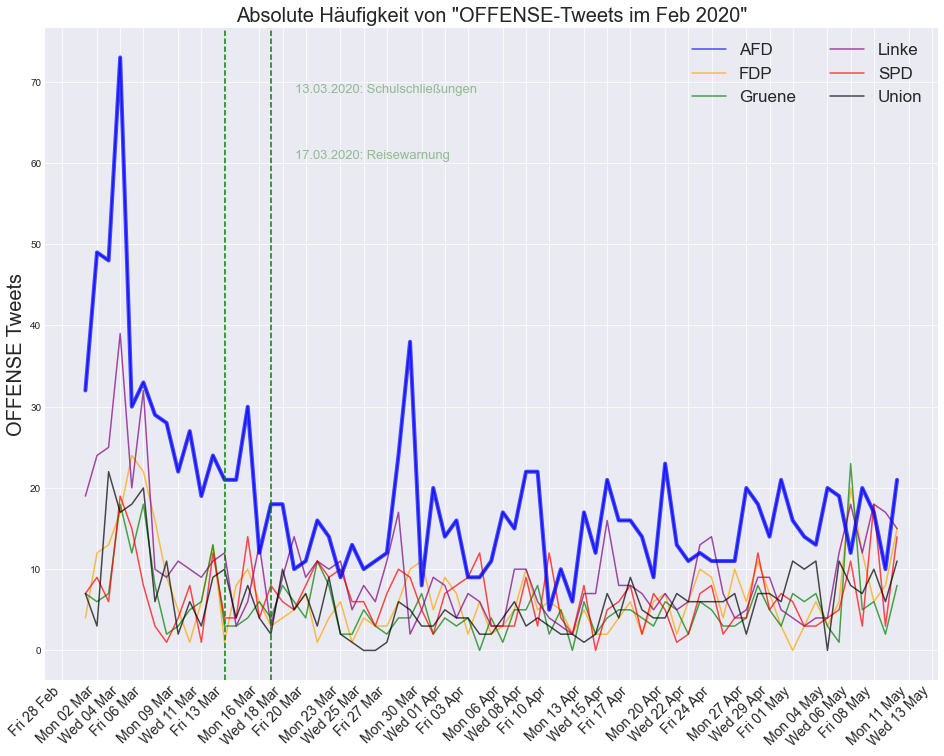

In [28]:
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import pandas as pd
import numpy as np

plt.style.use('seaborn-darkgrid')
my_palette = ['blue', 'orange', 'green', 'purple', 'red', 'black']

fig = plt.figure(figsize = (16, 12))
ax = fig.add_subplot(111)

num=0
for column in Corona_piv_nom:
    ax.plot(Corona_piv_nom.index, Corona_piv_nom[column], color = my_palette[num], alpha=0.7, label = column)
    num+=1

ax.plot(Corona_piv_nom.index, Corona_piv_nom['AFD'], marker='', color='blue', linewidth=4, alpha=0.7)

ax.set_title('Absolute Häufigkeit von "OFFENSE-Tweets im Feb 2020"', size = 20)
ylab = ax.set_ylabel('OFFENSE Tweets', size = 20)
# = ax.set_xlabel('Datum', size = 20)
plt.legend(loc = 1, ncol = 2, fontsize = 17)

#x_tags
x_tags = plt.xticks(Corona_piv_nom.index, fontsize = 14, rotation = 45, ha = "right")

ax.axvline(datetime.date(2020,3,13), ls='--', color='g')
ax.text(0.28, 0.9, '13.03.2020: Schulschließungen', color='darkseagreen', fontsize=13, transform=ax.transAxes)

ax.axvline(datetime.date(2020,3,17), ls='--', color='g')
ax.text(0.28, 0.8, '17.03.2020: Reisewarnung', color='darkseagreen', fontsize=13, transform=ax.transAxes)


# x-tags
weekdays = mdates.WeekdayLocator(byweekday=(MO, WE, FR), interval=1)
weekdays_fmt = mdates.DateFormatter('%a %d %b')


ax.xaxis.set_major_locator(weekdays)
ax.xaxis.set_major_formatter(weekdays_fmt)



In [66]:
sent_Corona = mdp_partei.loc[(mdp_partei['date'] >= datetime.date(2020,2,16)) 
                                & (mdp_partei['date'] <= datetime.date(2020,5,16))
                            & (mdp_partei['user_screen_name'] != 'kahrs')]
sent_Corona_OF = sent_Corona.loc[
                             (sent_Corona['predict'] == 'OFFENSE')
                             ]

sent_Corona_piv_OF = pd.pivot_table(sent_Corona_OF, columns = ['user_party'], index = ['week'], aggfunc = np.count_nonzero).fillna(0)
sent_Corona_piv_OF = sent_Corona_piv_OF['full_text']


sent_Corona_OT = sent_Corona.loc[
                              (sent_Corona['predict'] == 'OTHER')
                             ]

sent_Corona_piv_OT = pd.pivot_table(sent_Corona_OT, columns = ['user_party'], index = ['week'], aggfunc = np.count_nonzero).fillna(0)
sent_Corona_piv_OT = sent_Corona_piv_OT['full_text']

In [6]:
sent_Corona_piv_OT

user_party,AFD,FDP,Gruene,Linke,SPD,Union
week,,,,,,
20-w09,291,742,731,688,714,716
20-w10,416,792,666,680,998,700
20-w11,348,964,977,945,1272,736
20-w12,324,1027,820,796,1869,670
20-w13,347,1040,696,648,1388,611
20-w14,218,654,572,562,1076,467


In [9]:
#pd.set_option('display.max_rows', None)
#fin_df.loc[(fin_df)['date'] == datetime.date(2020,3,17)][['date', 'week']]

(0.0, 1150.0)

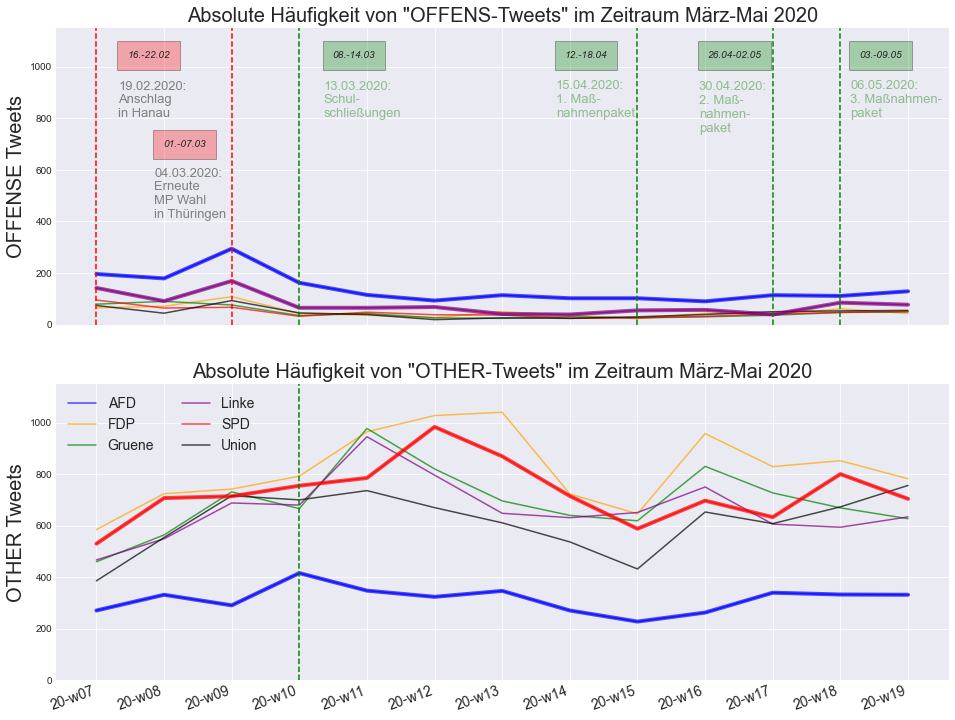

In [88]:
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import pandas as pd
import numpy as np

plt.style.use('seaborn-darkgrid')
my_palette = ['blue', 'orange', 'green', 'purple', 'red', 'black']
fig = plt.figure(figsize = (16, 12))


ax = fig.add_subplot(211)

num=0
for column in sent_Corona_piv_OF:
    ax.plot(sent_Corona_piv_OF.index, sent_Corona_piv_OF[column], color = my_palette[num], alpha=0.7, label = column)
    num+=1

ax.plot(sent_Corona_piv_OF.index, sent_Corona_piv_OF['AFD'], marker='', color='blue', linewidth=4, alpha=0.7)
ax.plot(sent_Corona_piv_OF.index, sent_Corona_piv_OF['Linke'], marker='', color='purple', linewidth=4, alpha=0.7)
# ax.plot(sent_Corona_piv.index, sent_Corona_piv['Linke'], marker='', color='purple', linewidth=4, alpha=0.7)

ax.set_title('Absolute Häufigkeit von "OFFENS-Tweets" im Zeitraum März-Mai 2020', size = 20)
ylab = ax.set_ylabel('OFFENSE Tweets', size = 20)

ax.axvline('20-w07', ls='--', color='r')
ax.text(0.08, 0.9, '16.-22.02', style='italic', bbox={'facecolor': 'red', 'alpha': 0.3, 'pad': 10}, transform=ax.transAxes)
ax.text(0.07, 0.7, '19.02.2020:\nAnschlag \nin Hanau', color='grey', fontsize=13, transform=ax.transAxes)

ax.axvline('20-w09', ls='--', color='r')
ax.text(0.12, 0.6, '01.-07.03', style='italic', bbox={'facecolor': 'red', 'alpha': 0.3, 'pad': 10}, transform=ax.transAxes)
ax.text(0.11, 0.36, '04.03.2020:\nErneute \nMP Wahl \nin Thüringen', color='grey', fontsize=13, transform=ax.transAxes)


ax.axvline('20-w10', ls='--', color='g')
ax.text(0.31, 0.9, '08.-14.03', style='italic', bbox={'facecolor': 'green', 'alpha': 0.3, 'pad': 10}, transform=ax.transAxes)
ax.text(0.3, 0.7, '13.03.2020:\nSchul-\nschließungen', color='darkseagreen', fontsize=13, transform=ax.transAxes)

ax.axvline('20-w15', ls='--', color='g')
ax.text(0.57, 0.9, '12.-18.04', style='italic', bbox={'facecolor': 'green', 'alpha': 0.3, 'pad': 10}, transform=ax.transAxes)
ax.text(0.56, 0.7, '15.04.2020:\n1. Maß- \nnahmenpaket', color='darkseagreen', fontsize=13, transform=ax.transAxes)

ax.axvline('20-w17', ls='--', color='g')
ax.text(0.73, 0.9, '26.04-02.05', style='italic', bbox={'facecolor': 'green', 'alpha': 0.3, 'pad': 10}, transform=ax.transAxes)
ax.text(0.72, 0.65, '30.04.2020:\n2. Maß- \nnahmen-\npaket', color='darkseagreen', fontsize=13, transform=ax.transAxes)

ax.axvline('20-w18', ls='--', color='g')
ax.text(0.9, 0.9, '03.-09.05', style='italic', bbox={'facecolor': 'green', 'alpha': 0.3, 'pad': 10}, transform=ax.transAxes)
ax.text(0.89, 0.7, '06.05.2020:\n3. Maßnahmen-\npaket', color='darkseagreen', fontsize=13, transform=ax.transAxes)
plt.ylim((0, 1150))

#x_tags
plt.setp(ax.get_xticklabels(), visible=False)

ax = fig.add_subplot(212)

num=0
for column in sent_Corona_piv_OT:
    ax.plot(sent_Corona_piv_OT.index, sent_Corona_piv_OT[column], color = my_palette[num], alpha=0.7, label = column)
    num+=1

ax.plot(sent_Corona_piv_OT.index, sent_Corona_piv_OT['AFD'], marker='', color='blue', linewidth=4, alpha=0.7)
ax.plot(sent_Corona_piv_OT.index, sent_Corona_piv_OT['SPD'], marker='', color='red', linewidth=4, alpha=0.7)
#ax.axvline(datetime.date(2020,3,13), ls='--', color='g')
#ax.axvline(datetime.date(2020,3,17), ls='--', color='g')
ax.axvline('20-w10', ls='--', color='g')

ax.set_title('Absolute Häufigkeit von "OTHER-Tweets" im Zeitraum März-Mai 2020', size = 20)
ylab = ax.set_ylabel('OTHER Tweets', size = 20)

plt.legend(loc = 2, ncol = 2, fontsize = 14)

#x_tags
x_tags = plt.xticks(sent_Corona_piv_OT.index, fontsize = 14, rotation = 20, ha = 'right')
plt.ylim((0, 1150))

In [6]:
pd.set_option('display.max_colwidth', None)
pd.set_option('display.max_rows', None)
sent_df_Wien.loc[(sent_df_Wien['date'] == datetime.date(2020,3,9)) 
                 & (sent_df_Wien['user_party'] == 'Gruene')
                 & (sent_df_Wien['predict'] == 'OFFENSE')
                ][['full_text', 'user_screen_name']]

,full_text,user_screen_name
2817,"@AchWendler @Die_Gruenen @BR24 Jedes Kind, das aus den unmenschlichen Bedingungen gerettet werden kann, zählt! Der Koalitionsbeschluss greift aber zu kurz. Kommunen haben sich zu wesentlich mehr bereit erklärt. Außerdem kein Wort zur Situation an der griechisch-türkischen Grenze. Das ist enttäuschend!",ekindeligoez
33217,"Kindern zu helfen ist wichtig, aber es braucht Hilfe für alle besonders Schutzbedürftigen in den Elendslagern.\n\nDass nur 1.000 bis 1.500, v.a. kranke Mädchen unter 14 kommen dürfen, wenn EU Partner wollen, ist humanitär und menschenrechtlich zu wenig.\n#Groko #Griechenland #Lesbos",KaiGehring
73023,"Danke dafür! „ Es geht nicht mehr um #Fussballspiele, es geht um alte und kranke Menschen“. #Corona + bitte etwas mehr Rücksicht statt Egoismus. https://t.co/Z3icvYnrpK",RenateKuenast


In [43]:
# pd.set_option('display.max_colwidth', None)
# sent_df_Wien.loc[(sent_df_Wien['date'] == datetime.date(2020,3,13)) 
#                  & (sent_df_Wien['user_party'] == 'AFD')
#                  & (sent_df_Wien['predict'] == 'OTHER')
#                 ]

# Stichwortsuchen im Datensatz

### Topic: Thüringen MP

In [118]:
sent_Kem = sent_df_Wien[sent_df_Wien['full_text_processed'].str.match(r'(.*Kemmerich.*|.*Thüringen.*|.*Thueringen.*)(?i)')==True]

sent_Kem_piv = pd.pivot_table(sent_Kem, columns = ['user_party'], index = ['predict'], aggfunc = np.count_nonzero)
sent_Kem_piv['full_text_processed']

user_party,AFD,FDP,Gruene,Linke,SPD,Union
predict,,,,,,
OFFENSE,485,109,178,308,236,142
OTHER,569,602,252,411,331,611


In [31]:
sent_Kem = sent_df_Wien[sent_df_Wien['full_text_processed'].str.match(r'(.*Kemmerich.*|.*Thüringen.*|.*Thueringen.*)(?i)')==True]

sent_Kem_OF = sent_Kem.loc[
                             (sent_Kem['predict'] == 'OFFENSE')
                            &
                            (sent_Kem['date'] >= datetime.date(2019, 9, 1))
                            &
                            (sent_Kem['date'] < datetime.date(2020, 5, 1))
    
                             ]

sent_Kem_piv_OF = pd.pivot_table(sent_Kem_OF, columns = ['user_party'], index = ['week'], aggfunc = np.count_nonzero).fillna(0)
sent_Kem_piv_OF = sent_Kem_piv_OF['full_text']


sent_Kem_OT = sent_Kem.loc[
                              (sent_Kem['predict'] == 'OTHER')
                                &
                            (sent_Kem['date'] >= datetime.date(2019, 9, 1))
                                &
                            (sent_Kem['date'] < datetime.date(2020, 5, 1))
                             ]

sent_Kem_piv_OT = pd.pivot_table(sent_Kem_OT, columns = ['user_party'], index = ['week'], aggfunc = np.count_nonzero).fillna(0)
sent_Kem_piv_OT = sent_Kem_piv_OT['full_text']

(0.0, 160.0)

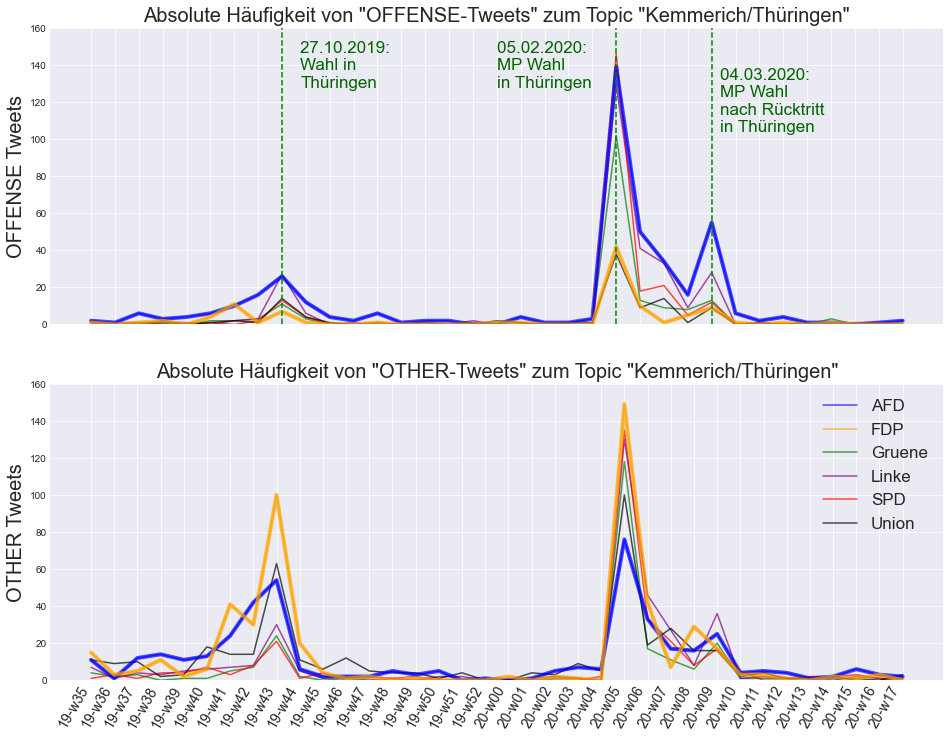

In [32]:
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import pandas as pd
import numpy as np

plt.style.use('seaborn-darkgrid')
my_palette = ['blue', 'orange', 'green', 'purple', 'red', 'black']
fig = plt.figure(figsize = (16, 12))


ax = fig.add_subplot(211)

num=0
for column in sent_Kem_piv_OF:
    ax.plot(sent_Kem_piv_OF.index, sent_Kem_piv_OF[column], color = my_palette[num], alpha=0.7, label = column)
    num+=1

ax.plot(sent_Kem_piv_OF.index, sent_Kem_piv_OF['AFD'], marker='', color='blue', linewidth=4, alpha=0.7)
ax.plot(sent_Kem_piv_OF.index, sent_Kem_piv_OF['FDP'], marker='', color='orange', linewidth=4, alpha=0.7)

ax.set_title('Absolute Häufigkeit von "OFFENSE-Tweets" zum Topic "Kemmerich/Thüringen"', size = 20)
ylab = ax.set_ylabel('OFFENSE Tweets', size = 20)

ax.axvline('19-w43', ls='--', color='g')
ax.text(0.28, 0.8, '27.10.2019: \nWahl in \nThüringen', color='darkgreen', fontsize=17, transform=ax.transAxes)
ax.axvline('20-w05', ls='--', color='g')
ax.text(0.5, 0.8, '05.02.2020: \nMP Wahl\nin Thüringen', color='darkgreen', fontsize=17, transform=ax.transAxes)
plt.ylim((0, 160))
ax.axvline('20-w09', ls='--', color='g')
ax.text(0.75, 0.65, '04.03.2020: \nMP Wahl\nnach Rücktritt\nin Thüringen', color='darkgreen', fontsize=17, transform=ax.transAxes)
plt.ylim((0, 160))

#x_tags
plt.setp(ax.get_xticklabels(), visible=False)

ax = fig.add_subplot(212)

num=0
for column in sent_Kem_piv_OT:
    ax.plot(sent_Kem_piv_OT.index, sent_Kem_piv_OT[column], color = my_palette[num], alpha=0.7, label = column)
    num+=1

ax.plot(sent_Kem_piv_OT.index, sent_Kem_piv_OT['AFD'], marker='', color='blue', linewidth=4, alpha=0.7)
ax.plot(sent_Kem_piv_OT.index, sent_Kem_piv_OT['FDP'], marker='', color='orange', linewidth=4, alpha=0.7)

ax.set_title('Absolute Häufigkeit von "OTHER-Tweets" zum Topic "Kemmerich/Thüringen"', size = 20)
ylab = ax.set_ylabel('OTHER Tweets', size = 20)

plt.legend(loc = 1, ncol = 1, fontsize = 17)

#x_tags
x_tags = plt.xticks(sent_Kem_piv_OT.index, fontsize = 14, rotation = 60, ha = 'right')
plt.ylim((0, 160))

### Topic: Hanau

In [36]:
sent_Hanau = sent_df_Wien[sent_df_Wien['full_text_processed'].str.match(r'(.*Hanau.*|.*Amoklauf.*|.*Rassis.*|.*Attentat.*)(?i)')==True]

#sent_Hanau = sent_Hanau[sent_Hanau['full_text_processed'].str.match(r'(.*Betroffene.*|.*Angehörige.*|.*zusammen.*|.*Mitgefühl.*)(?i)')==True]

sent_Hanau_OF = sent_Hanau.loc[
                             (sent_Hanau['predict'] == 'OFFENSE')
                            &
                            (sent_Hanau['date'] >= datetime.date(2020, 2, 18))
                            &
                            (sent_Hanau['date'] < datetime.date(2020, 3, 5))
    
                             ]

sent_Hanau_piv_OF = pd.pivot_table(sent_Hanau_OF, columns = ['user_party'], index = ['date'], aggfunc = np.count_nonzero).fillna(0)
sent_Hanau_piv_OF = sent_Hanau_piv_OF['full_text']


sent_Hanau_OT = sent_Hanau.loc[
                              (sent_Hanau['predict'] == 'OTHER')
                                &
                            (sent_Hanau['date'] >= datetime.date(2020, 2, 18))
                            &
                            (sent_Hanau['date'] < datetime.date(2020, 3, 5))
                             ]

sent_Hanau_piv_OT = pd.pivot_table(sent_Hanau_OT, columns = ['user_party'], index = ['date'], aggfunc = np.count_nonzero).fillna(0)
sent_Hanau_piv_OT = sent_Hanau_piv_OT['full_text']

sent_Hanau_piv_rel = (sent_Hanau_piv_OF/(sent_Hanau_piv_OT+sent_Hanau_piv_OT))*100

In [142]:
sent_Hanau_piv_rel.loc[(sent_Hanau_piv_rel.index == datetime.date(2020,2,20))|
                      (sent_Hanau_piv_rel.index == datetime.date(2020,2,21))].round(0)
#sent_Hanau_piv_rel

user_party,AFD,FDP,Gruene,Linke,SPD,Union
date,,,,,,
2020-02-20,69.0,18.0,17.0,34.0,20.0,29.0
2020-02-21,42.0,28.0,12.0,62.0,50.0,29.0


In [37]:
#sent_Hanau_detail = sent_Hanau[sent_Hanau['full_text_processed'].str.match(r'(.*Betroffene.*|.*Angehörige.*|.*zusammen.*|.*Mitgefühl.*)(?i)')==True]
#sent_Hanau_detail = sent_Hanau[sent_Hanau['full_text_processed'].str.match(r'(.*haluzi.*|.*geistesgest.*|.*psychisch.*|.*störung.*|.*instrumentalis.*|.*zweck.*)(?i)')==True]
sent_Hanau_detail = sent_Hanau[sent_Hanau['full_text_processed'].str.match(r'(.*migrant.*|.*ausl.*|.*fremd.*|.*flücht.*)(?i)')==True]
#sent_Hanau_detail = sent_Hanau

sent_Hanau_detail.loc[
                            #(sent_Hanau_detail['predict'] == 'OTHER')
                            #   &
                            #(sent_Hanau_detail['user_party'] == 'AFD')
                            #    &
                            (sent_Hanau_detail['date'] >= datetime.date(2020, 2, 19))
                            &
                            (sent_Hanau_detail['date'] < datetime.date(2020, 2, 25))
                             ]

#pd.pivot_table(sent_Hanau_detail, columns = ['user_party', 'predict'], index = ['date'], aggfunc = np.count_nonzero).fillna(0)['Woche']

,_id,created_at,id,full_text,is_quote_status,retweet_count,lang,created_at_datetime,user_id,user_name,...,user_created_at,partei,user_party,full_text_processed,Monat,Woche,predict,date,month,week
173,5e9555de21dec1d53689688e,Thu Feb 20 09:37:52 +0000 2020,1230426332397547522,"Der hessische Innenminister und die meisten Medien sprechen von einem möglicherweise „fremdenfeindlichen Hintergrund“.\n\nIch kann es nicht mehr hören! Menschen in Deutschland, die von rechten Terroristen ermordet werden, sind keine „Fremden“! \n\n#Hanau",False,131,de,2020-02-20 09:37:52,16706236,Sven Lehmann 🏳️‍🌈,...,Sun Oct 12 09:09:29 +0000 2008,"{'_id': 5ed7e2502efe72dc73343d4b, 'Name': 'svenlehmann', 'Partei': 'Gruene'}",Gruene,Der hessische Innenminister und die meisten Medien sprechen von einem möglicherweise fremdenfeindlichen HintergrundIch kann es nicht mehr hören Menschen in Deutschland die von rechten Terroristen ermordet werden sind keine Fremden Hanau,20-02,20-w07,OFFENSE,2020-02-20,20-02,20-w07
228,5e958eb215abae9d9d4d457c,Thu Feb 20 15:00:57 +0000 2020,1230507639496478720,"#Hanau ist die Fortsetzung einer rechtsterroristischen Mordserie. Gesellschaft und Staat dürfen nicht hinnehmen, dass MigrantInnen, JüdInnen und alle, die sich Rassismus entgegenstellen, Angst um ihr Leben haben. Bund und Länder müssen Nazi-Strukturen systematisch entwaffnen.",False,13,de,2020-02-20 15:00:57,3350681139,Victor Perli MdB 🍎,...,Mon Jun 29 13:33:18 +0000 2015,"{'_id': 5ed7e2502efe72dc73343d84, 'Name': 'victorperli', 'Partei': 'Linke'}",Linke,Hanau ist die Fortsetzung einer rechtsterroristischen Mordserie Gesellschaft und Staat dürfen nicht hinnehmen dass MigrantInnen JüdInnen und alle die sich Rassismus entgegenstellen Angst um ihr Leben haben Bund und Länder müssen Nazi-Strukturen systematisch entwaffnen,20-02,20-w07,OFFENSE,2020-02-20,20-02,20-w07
242,5e958ee215abae9d9d4d6659,Thu Feb 20 09:48:24 +0000 2020,1230428983977791488,"Das Problem fängt da an, wo Menschen aufgrund ihrer Herkunft, ihrer Religion aus unserer Gesellschaft hinaus-definiert werden. Wenn dem Hass auf sie irgendeine ratio zugemessen wird, weil sie ja 'Fremde', 'Ausländer' sind. Das Problem heißt #Rassismus. #Hanau https://t.co/rYbqqvhdaL",False,2,de,2020-02-20 09:48:24,136266976,Lorenz Gösta Beutin,...,Fri Apr 23 13:11:41 +0000 2010,"{'_id': 5ed7e2502efe72dc73343d87, 'Name': 'lgbeutin', 'Partei': 'Linke'}",Linke,Das Problem fängt da an wo Menschen aufgrund ihrer Herkunft ihrer Religion aus unserer Gesellschaft hinaus-definiert werden Wenn dem Hass auf sie irgendeine ratio zugemessen wird weil sie ja 'Fremde' 'Ausländer' sind Das Problem heißt Rassismus Hanau,20-02,20-w07,OFFENSE,2020-02-20,20-02,20-w07
247,5e958efe15abae9d9d4d7e97,Thu Feb 20 14:44:41 +0000 2020,1230503543842492418,"Menschen, die vermeintlich „fremd“ sind, müssen in Deutschland Angst um ihr Leben haben. Das darf nicht sein! Wir alle sind aufgefordert, nicht zur Tagesordnung überzugehen. #hanau https://t.co/uPWwQUMYRP https://t.co/kWlxKadwbG",False,26,de,2020-02-20 14:44:41,2320519958,Dietmar Bartsch,...,Fri Jan 31 09:25:36 +0000 2014,"{'_id': 5ed7e2502efe72dc73343d89, 'Name': 'DietmarBartsch', 'Partei': 'Linke'}",Linke,Menschen die vermeintlich fremd sind müssen in Deutschland Angst um ihr Leben haben Das darf nicht sein Wir alle sind aufgefordert nicht zur Tagesordnung überzugehen hanau,20-02,20-w07,OTHER,2020-02-20,20-02,20-w07
424,5eb7143a4f4fda7c5d610a23,Thu Feb 20 17:40:49 +0000 2020,1230547870442557441,"mitverantwortlich sind für diese Entwicklung.\nWir sind in tiefer Trauer. Unser Mitgefühl gilt den Familien und Angehörigen der Opfer. \nLasst uns bei jeder Gelegenheit zeigen, daß wir Fremdenfeindlichkeit, Rassismus und Antisemitismus eine klare Absage erteilen. (2/3)",False,0,de,2020-02-20 17:40:49,409258073,Michael Thews (MdB),...,Thu Nov 10 13:55:11 +0000 2011,"{'_id': 5ed7e2502efe72dc73343cbd, 'Name': 'michael_thews', 'Partei': 'SPD'}",SPD,mitverantwortlich sind für diese EntwicklungWir sind in tiefer Trauer Unse

In [39]:
from stop_words import get_stop_words
stop_words_one = get_stop_words('de')

import stopwordsiso as stopwords
stop_words_two = list(stopwords.stopwords(["de"])) 

for word in stop_words_two:
    if word in stop_words_one:
        continue
    else:
       # print(word)
        stop_words_one.append(word)


mehr_sw = ['cducsubt','GrueneBundestag','the', 'and', 'for', 'tb', 'cducsubt', 'spdbt', 
           'fdpbt', 'sdpde', 'gruenebundestag', 'linksfraktion', 'dielinke', 'bundestag', 'afdimbundestag'
          'csu_bt', 'spdde', 'Hanau']

for word in mehr_sw:
    stop_words_one.append(word)
    

Text(0.5, 1.05, 'Hanau 19.02.2020 - Wordcloud 21.02.2020')

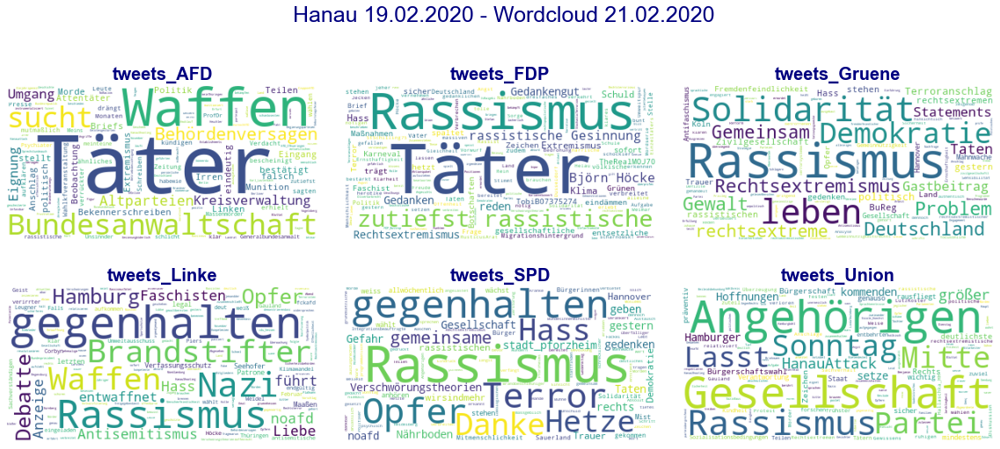

In [40]:
%matplotlib inline
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from wordcloud import WordCloud

sent_Hanau_detail = sent_Hanau
sample_df_date = sent_Hanau_detail.loc[
                            #(sent_Hanau_detail['predict'] == 'OFFENSE')
                            #   &
                            #(sent_Hanau_detail['user_party'] == 'AFD')
                            #    &
                            (sent_Hanau_detail['date'] == datetime.date(2020, 2, 21))
                           # (sent_Hanau_detail['date'] >= datetime.date(2020, 2, 18))
                           # &
                           # (sent_Hanau_detail['date'] < datetime.date(2020, 2, 22))
                             ]

partei_dic_date = {}
for partei in sent_Hanau_piv_OT.columns:
    partei_dic_date['tweets_'+ partei] = sample_df_date[sample_df_date['user_party'] == partei]  


def FktWordCloud(clen_string):
    wordcloud = WordCloud(background_color="white", max_words=5000, contour_width=3, contour_color='steelblue', stopwords=stop_words_one, min_word_length=4)
    wordcloud.generate(clean_string)
    wordcloud.to_image()
    return wordcloud

fig = plt.figure(figsize = (16, 16))
#fig.subplots_adjust(top=0.8)

for partei, n in zip(partei_dic_date, range(1,7)):
    title = str(partei)
    
    ax = fig.add_subplot(5,3,n)
    ax.set_title(title,fontweight="bold", color='navy', size=20)
    fig.tight_layout()
    sample_df_partei=partei_dic_date[partei]
    long_string = ','.join(sample_df_partei['full_text_processed'])
    clean_text = [word for word in long_string.split() if word not in stop_words_one]
    clean_string = ','.join(clean_text)
    wordcloud = FktWordCloud(clean_string)
    ax.imshow(wordcloud)
    ax.axis('off')
fig.suptitle('Hanau 19.02.2020 - Wordcloud 21.02.2020', fontsize=25, color='navy', y=1.05)

In [41]:
pd.set_option('display.max_rows', None)
pd.set_option('display.max_colwidth', None)
sent_Hanau_OF['full_text_processed']
sent_Hanau.loc[
                              (sent_Hanau['predict'] == 'OTHER')
                                &
                            (sent_Hanau['user_party'] == 'Gruene')
                                &
                            (sent_Hanau['date'] >= datetime.date(2020, 2, 18))
                            &
                            (sent_Hanau['date'] < datetime.date(2020, 3, 5))
                             ]

,_id,created_at,id,full_text,is_quote_status,retweet_count,lang,created_at_datetime,user_id,user_name,...,user_created_at,partei,user_party,full_text_processed,Monat,Woche,predict,date,month,week
142,5e95539c21dec1d53687fcdf,Sat Feb 22 14:03:31 +0000 2020,1231217960100007936,"Gerade einmal vier Monate ist es her, dass ich an den Anschlagsorten in Halle Blumen niederlegte. Heute knie ich in Hanau und spreche mit den Betroffenen, den Angehörigen im Kulturzentrum und an einem der Tatorte in der Kesselstadt. #Hanau https://t.co/DCGa5395o6",False,19,de,2020-02-22 14:03:31,626287930,Katrin Göring-Eckardt MdB,...,Wed Jul 04 08:28:33 +0000 2012,"{'_id': 5ed7e2502efe72dc73343d28, 'Name': 'GoeringEckardt', 'Partei': 'Gruene'}",Gruene,Gerade einmal vier Monate ist es her dass ich an den Anschlagsorten in Halle Blumen niederlegte Heute knie ich in Hanau und spreche mit den Betroffenen den Angehörigen im Kulturzentrum und an einem der Tatorte in der Kesselstadt Hanau,20-02,20-w07,OTHER,2020-02-22,20-02,20-w07
152,5e9554b421dec1d53688b600,Thu Feb 20 14:14:02 +0000 2020,1230495832744562689,Meine Gedanken sind heute bei den Menschen in Hanau. Der gesäte Hass trägt Früchte. Dagegen müssen wir uns alle zusammen stellen. Es reicht nicht mehr aus nur dagegen zu sein. Wir müssen handeln! Beteiligt euch deshalb an den heute bundesweit stattfindenden Mahnwachen! \n#Hanau https://t.co/mUmIjaQMIH,False,5,de,2020-02-20 14:14:02,17870195,Kordula Schulz-Asche,...,Thu Dec 04 15:40:59 +0000 2008,"{'_id': 5ed7e2502efe72dc73343d3c, 'Name': 'K_SA', 'Partei': 'Gruene'}",Gruene,Meine Gedanken sind heute bei den Menschen in Hanau Der gesäte Hass trägt Früchte Dagegen müssen wir uns alle zusammen stellen Es reicht nicht mehr aus nur dagegen zu sein Wir müssen handeln Beteiligt euch deshalb an den heute bundesweit stattfindenden Mahnwachen Hanau,20-02,20-w07,OTHER,2020-02-20,20-02,20-w07
167,5e95556621dec1d536891d1f,Thu Feb 20 05:52:28 +0000 2020,1230369606755377153,"Ich kenne die Identität und die Motive des Täters noch nicht. Ich weiß nur, dass entsetzliches passiert ist. Dass Menschen gestorben sind. Dass Familien schlimme Verluste erlitten haben. Dass es jetzt Zeit ist für Trauer. Und für Zusammenstehen. Für die Opfer. Für #Hanau.\n#Tränen",False,46,de,2020-02-20 05:52:28,16674128,Omid Nouripour,...,Thu Oct 09 21:23:15 +0000 2008,"{'_id': 5ed7e2502efe72dc73343d45, 'Name': 'nouripour', 'Partei': 'Gruene'}",Gruene,Ich kenne die Identität und die Motive des Täters noch nicht Ich weiß nur dass entsetzliches passiert ist Dass Menschen gestorben sind Dass Familien schlimme Verluste erlitten haben Dass es jetzt Zeit ist für Trauer Und für Zusammenstehen Für die Opfer Für HanauTränen,20-02,20-w07,OTHER,2020-02-20,20-02,20-w07
168,5e95558121dec1d53689297b,Sat Feb 22 10:19:54 +0000 2020,1231161684766732289,"Über 1000 Menschen sind gestern in #Reutlingen aufgestanden - gegen #Hass, #Hetze und #Rassismus - gegen den Neujahrsempfang der #noafd #wirsindmehr https://t.co/K322bvUSKY",False,0,de,2020-02-22 10:19:54,53426644,Beate Müller-Gemmeke,...,Fri Jul 03 16:20:17 +0000 2009,"{'_id': 5ed7e2502efe72dc73343d46, 'Name': 'GrueneBeate', 'Partei': 'Gruene'}",Gruene,Über 1000 Menschen sind gestern in Reutlingen aufgestanden - gegen Hass Hetze und Rassismus - gegen den Neujahrsempfang der noafd wirsindmehr,20-02,20-w07,OTHER,2020-02-22,20-02,20-w07
169,5e9555bd21dec1d536894ee8,Fri Feb 21 17:32:16 +0000 2020,1230908105237630976,"Die Sensibilität hinsichtlich rechtsextremistischer Taten hat sich seit #NSU zwar etwas verbessert, dennoch gibt es noch viele Defizite in der Analyse rechter Terrorsysteme. Mein Gastbeitrag auf @focusonline #Hanau\n\nhttps://t.co/m2Bg4hI4ox",False,21,de,2020-02-21 17:32:16,143000381,Irene Mihalic,...,Wed May 12 09:15:53 +0000 2010,"{'_id': 5ed7e2502efe72dc73343d49, 'Name': 'IreneMihalic', 'Partei': 'Gruene'}",Gruene,Die Sensibilität hinsichtlich rechtsextremistischer Taten hat sich seit NSU zwar etwas verbessert dennoch gibt es noch viele Defizite in der A

/usr/local/lib/python3.6/dist-packages/matplotlib/backends/backend_agg.py:238: RuntimeWarning: Glyph 128545 missing from current font.
  font.set_text(s, 0.0, flags=flags)
/usr/local/lib/python3.6/dist-packages/matplotlib/backends/backend_agg.py:201: RuntimeWarning: Glyph 128545 missing from current font.
  font.set_text(s, 0, flags=flags)


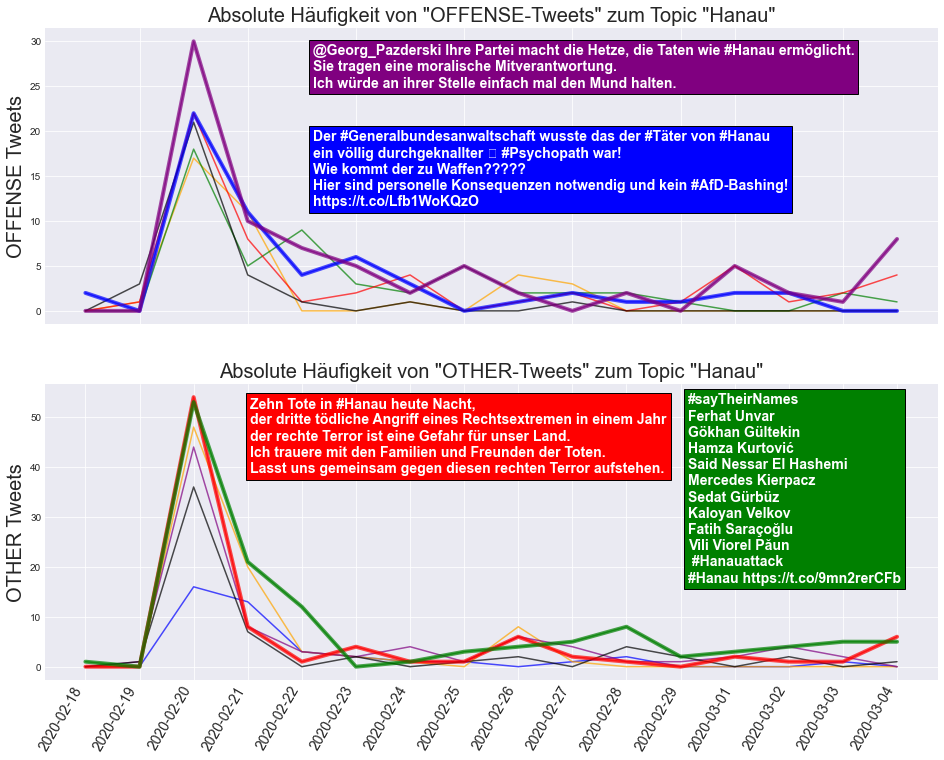

In [42]:
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import pandas as pd
import numpy as np

plt.style.use('seaborn-darkgrid')
my_palette = ['blue', 'orange', 'green', 'purple', 'red', 'black']
fig = plt.figure(figsize = (16, 12))


ax = fig.add_subplot(211)

num=0
for column in sent_Hanau_piv_OF:
    ax.plot(sent_Hanau_piv_OF.index, sent_Hanau_piv_OF[column], color = my_palette[num], alpha=0.7, label = column)
    num+=1

ax.plot(sent_Hanau_piv_OF.index, sent_Hanau_piv_OF['AFD'], marker='', color='blue', linewidth=4, alpha=0.7)
ax.plot(sent_Hanau_piv_OF.index, sent_Hanau_piv_OF['Linke'], marker='', color='purple', linewidth=4, alpha=0.7)

ax.set_title('Absolute Häufigkeit von "OFFENSE-Tweets" zum Topic "Hanau"', size = 20)
ylab = ax.set_ylabel('OFFENSE Tweets', size = 20)

#ax.axvline(datetime.date(2020,2,19), ls='--', color='g')
#ax.text(0.25, 0.8, 'Nacht 19.02. \nauf 20.02.2020:\nHanau Attentat', color='darkgreen', fontsize=17, transform=ax.transAxes)

ax.text(0.3, 0.4, 'Der #Generalbundesanwaltschaft wusste das der #Täter von #Hanau\nein völlig durchgeknallter 😡 #Psychopath war! \nWie kommt der zu Waffen?????\nHier sind personelle Konsequenzen notwendig und kein #AfD-Bashing!\nhttps://t.co/Lfb1WoKQzO', 
        color='w', weight = 'bold', fontsize = 14, bbox={'facecolor': 'blue'}, transform=ax.transAxes)
ax.text(0.3, 0.8, '@Georg_Pazderski Ihre Partei macht die Hetze, die Taten wie #Hanau ermöglicht.\nSie tragen eine moralische Mitverantwortung.\nIch würde an ihrer Stelle einfach mal den Mund halten.', 
        color='w', weight = 'bold', fontsize = 14, bbox={'facecolor': 'purple'}, transform=ax.transAxes)


#x_tags
plt.setp(ax.get_xticklabels(), visible=False)

ax = fig.add_subplot(212)

num=0
for column in sent_Hanau_piv_OT:
    ax.plot(sent_Hanau_piv_OT.index, sent_Hanau_piv_OT[column], color = my_palette[num], alpha=0.7, label = column)
    num+=1

ax.plot(sent_Hanau_piv_OT.index, sent_Hanau_piv_OT['SPD'], marker='', color='red', linewidth=4, alpha=0.7)
ax.plot(sent_Hanau_piv_OT.index, sent_Hanau_piv_OT['Gruene'], marker='', color='green', linewidth=4, alpha=0.7)

ax.set_title('Absolute Häufigkeit von "OTHER-Tweets" zum Topic "Hanau"', size = 20)
ylab = ax.set_ylabel('OTHER Tweets', size = 20)

#plt.legend(loc = 1, ncol = 1, fontsize = 17)

ax.text(0.23, 0.7, 'Zehn Tote in #Hanau heute Nacht,\nder dritte tödliche Angriff eines Rechtsextremen in einem Jahr\nder rechte Terror ist eine Gefahr für unser Land.\nIch trauere mit den Familien und Freunden der Toten.\nLasst uns gemeinsam gegen diesen rechten Terror aufstehen.', 
        color='w', weight = 'bold', fontsize = 14, bbox={'facecolor': 'red'}, transform=ax.transAxes)
ax.text(0.72, 0.33, '#sayTheirNames\nFerhat Unvar\nGökhan Gültekin\nHamza Kurtović\nSaid Nessar El Hashemi\nMercedes Kierpacz\nSedat Gürbüz\nKaloyan Velkov\nFatih Saraçoğlu\nVili Viorel Păun\n #Hanauattack\n#Hanau https://t.co/9mn2rerCFb', 
        color='w', weight = 'bold', fontsize = 14, bbox={'facecolor': 'green'}, transform=ax.transAxes)

#x_tags
x_tags = plt.xticks(sent_Hanau_piv_OT.index, fontsize = 14, rotation = 60, ha = 'right')
#plt.ylim((0, 60))

### Topic: Merkel

In [120]:
sent_Merkel = sent_df_Wien[sent_df_Wien['full_text_processed'].str.match(r'(.*Merkel.*)(?i)')==True]

sent_Merkel_piv = pd.pivot_table(sent_Merkel, columns = ['user_party'], index = ['predict'], aggfunc = np.count_nonzero)
sent_Merkel_piv['full_text_processed']

user_party,AFD,FDP,Gruene,Linke,SPD,Union
predict,,,,,,
OFFENSE,712,54,53,70,43,33
OTHER,497,276,224,179,110,254


In [43]:
sent_Merkel = sent_df_Wien[sent_df_Wien['full_text_processed'].str.match(r'(.*Merkel.*)(?i)')==True]

sent_Merkel = sent_Merkel.loc[
                            #(sent_Merkel['date']>=datetime.date(2020,1,1))
                              (sent_Merkel['predict'] == 'OFFENSE')
                             ]

sent_Merkel_piv = pd.pivot_table(sent_Merkel, columns = ['user_party'], index = ['week'], aggfunc = np.count_nonzero).fillna(0)
sent_Merkel_piv = sent_Merkel_piv['full_text']

Text(0.42, 0.9, 'Anfang Februar: MP Wahl in \nThüringen und die Folgen')

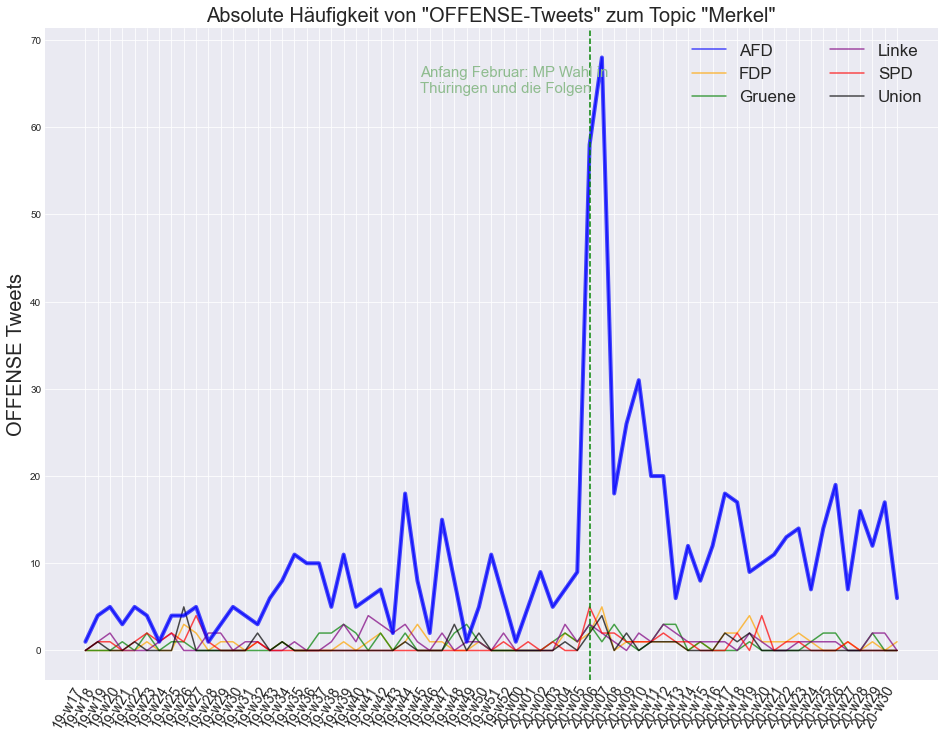

In [44]:
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import pandas as pd
import numpy as np

plt.style.use('seaborn-darkgrid')
my_palette = ['blue', 'orange', 'green', 'purple', 'red', 'black']

fig = plt.figure(figsize = (16, 12))
ax = fig.add_subplot(111)

num=0
for column in sent_Merkel_piv:
    ax.plot(sent_Merkel_piv.index, sent_Merkel_piv[column], color = my_palette[num], alpha=0.7, label = column)
    num+=1

ax.plot(sent_Merkel_piv.index, sent_Merkel_piv['AFD'], marker='', color='blue', linewidth=4, alpha=0.7)

ax.set_title('Absolute Häufigkeit von "OFFENSE-Tweets" zum Topic "Merkel"', size = 20)
ylab = ax.set_ylabel('OFFENSE Tweets', size = 20)
# = ax.set_xlabel('Datum', size = 20)
plt.legend(loc = 1, ncol = 2, fontsize = 17)

#x_tags
x_tags = plt.xticks(sent_Merkel_piv.index, fontsize = 14, rotation = 60, ha = "right")

ax.axvline('20-w05', ls='--', color='g')
ax.text(0.42, 0.9, 'Anfang Februar: MP Wahl in \nThüringen und die Folgen', color='darkseagreen', fontsize=15, transform=ax.transAxes)


### Topic: Migration

In [12]:
sent_Mig = sent_df_Wien[sent_df_Wien['full_text_processed'].str.match(r'(.*Lesbos.*|.*Griechenland.*|.*Migration.*|.*Migrant.*|.*Flücht.*|.*Asyl.*|.*Zuwander.*)(?i)')==True]

sent_Mig_piv = pd.pivot_table(sent_Mig, columns = ['user_party'], index = ['predict'], aggfunc = np.count_nonzero)
sent_Mig_piv['full_text_processed']

user_party,AFD,FDP,Gruene,Linke,SPD,Union
predict,,,,,,
OFFENSE,774,48,88,272,72,41
OTHER,562,313,345,648,460,327


In [45]:
sent_Mig = sent_df_Wien[sent_df_Wien['full_text_processed'].str.match(r'(.*Migration.*|.*Migrant.*|.*Flücht.*|.*Asyl.*|.*Zuwander.*)(?i)')==True]

sent_Mig_OF = sent_Mig.loc[
                             (sent_Mig['predict'] == 'OFFENSE')
                             ]

sent_Mig_piv_OF = pd.pivot_table(sent_Mig_OF, columns = ['user_party'], index = ['week'], aggfunc = np.count_nonzero).fillna(0)
sent_Mig_piv_OF = sent_Mig_piv_OF['full_text']


sent_Mig_OT = sent_Mig.loc[
                              (sent_Mig['predict'] == 'OTHER')
                             ]

sent_Mig_piv_OT = pd.pivot_table(sent_Mig_OT, columns = ['user_party'], index = ['week'], aggfunc = np.count_nonzero).fillna(0)
sent_Mig_piv_OT = sent_Mig_piv_OT['full_text']

(0.0, 70.0)

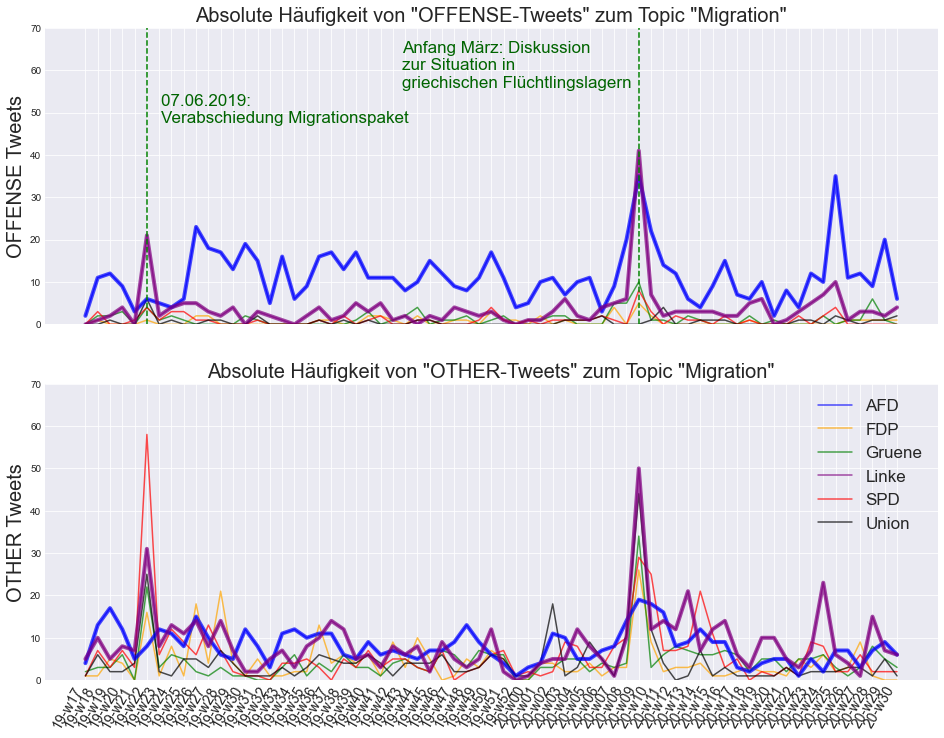

In [46]:
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import pandas as pd
import numpy as np

plt.style.use('seaborn-darkgrid')
my_palette = ['blue', 'orange', 'green', 'purple', 'red', 'black']
fig = plt.figure(figsize = (16, 12))


ax = fig.add_subplot(211)

num=0
for column in sent_Mig_piv_OF:
    ax.plot(sent_Mig_piv_OF.index, sent_Mig_piv_OF[column], color = my_palette[num], alpha=0.7, label = column)
    num+=1

ax.plot(sent_Mig_piv_OF.index, sent_Mig_piv_OF['AFD'], marker='', color='blue', linewidth=4, alpha=0.7)
ax.plot(sent_Mig_piv_OF.index, sent_Mig_piv_OF['Linke'], marker='', color='purple', linewidth=4, alpha=0.7)
# ax.plot(sent_Mig_piv.index, sent_Mig_piv['Linke'], marker='', color='purple', linewidth=4, alpha=0.7)

ax.set_title('Absolute Häufigkeit von "OFFENSE-Tweets" zum Topic "Migration"', size = 20)
ylab = ax.set_ylabel('OFFENSE Tweets', size = 20)

ax.axvline('19-w22', ls='--', color='g')
ax.text(0.13, 0.68, '07.06.2019: \nVerabschiedung Migrationspaket', color='darkgreen', fontsize=17, transform=ax.transAxes)
ax.axvline('20-w09', ls='--', color='g')
ax.text(0.4, 0.8, 'Anfang März: Diskussion\nzur Situation in\ngriechischen Flüchtlingslagern', color='darkgreen', fontsize=17, transform=ax.transAxes)
plt.ylim((0, 70))

#x_tags
plt.setp(ax.get_xticklabels(), visible=False)

ax = fig.add_subplot(212)

num=0
for column in sent_Mig_piv_OT:
    ax.plot(sent_Mig_piv_OT.index, sent_Mig_piv_OT[column], color = my_palette[num], alpha=0.7, label = column)
    num+=1

ax.plot(sent_Mig_piv_OT.index, sent_Mig_piv_OT['AFD'], marker='', color='blue', linewidth=4, alpha=0.7)
ax.plot(sent_Mig_piv_OT.index, sent_Mig_piv_OT['Linke'], marker='', color='purple', linewidth=4, alpha=0.7)

ax.set_title('Absolute Häufigkeit von "OTHER-Tweets" zum Topic "Migration"', size = 20)
ylab = ax.set_ylabel('OTHER Tweets', size = 20)

plt.legend(loc = 1, ncol = 1, fontsize = 17)

#x_tags
x_tags = plt.xticks(sent_Mig_piv_OT.index, fontsize = 14, rotation = 60, ha = 'right')
plt.ylim((0, 70))

### Topic: Klima

In [121]:
sent_Klima = sent_df_Wien[sent_df_Wien['full_text_processed'].str.match(r'(.*Klima.*|.*Greta.*|.*Friday.*)(?i)')==True]

sent_Klima_piv = pd.pivot_table(sent_Klima, columns = ['user_party'], index = ['predict'], aggfunc = np.count_nonzero)
sent_Klima_piv['full_text_processed']

user_party,AFD,FDP,Gruene,Linke,SPD,Union
predict,,,,,,
OFFENSE,437,80,119,142,58,59
OTHER,598,1602,2630,1410,1253,925


In [47]:
sent_Klima = sent_df_Wien[sent_df_Wien['full_text_processed'].str.match(r'(.*Klima.*|.*Greta.*|.*Friday.*)(?i)')==True]

sent_Klima_OF = sent_Klima.loc[
                            #(sent_Klima['date']>=datetime.date(2020,1,1))
                              (sent_Klima['predict'] == 'OFFENSE')
                             ]

sent_Klima_piv_OF = pd.pivot_table(sent_Klima_OF, columns = ['user_party'], index = ['week'], aggfunc = np.count_nonzero).fillna(0)
sent_Klima_piv_OF = sent_Klima_piv_OF['full_text']


sent_Klima_OT = sent_Klima.loc[
                            #(sent_Klima['date']>=datetime.date(2020,1,1))
                              (sent_Klima['predict'] == 'OTHER')
                             ]

sent_Klima_piv_OT = pd.pivot_table(sent_Klima_OT, columns = ['user_party'], index = ['week'], aggfunc = np.count_nonzero).fillna(0)
sent_Klima_piv_OT = sent_Klima_piv_OT['full_text']

(0.0, 165.0)

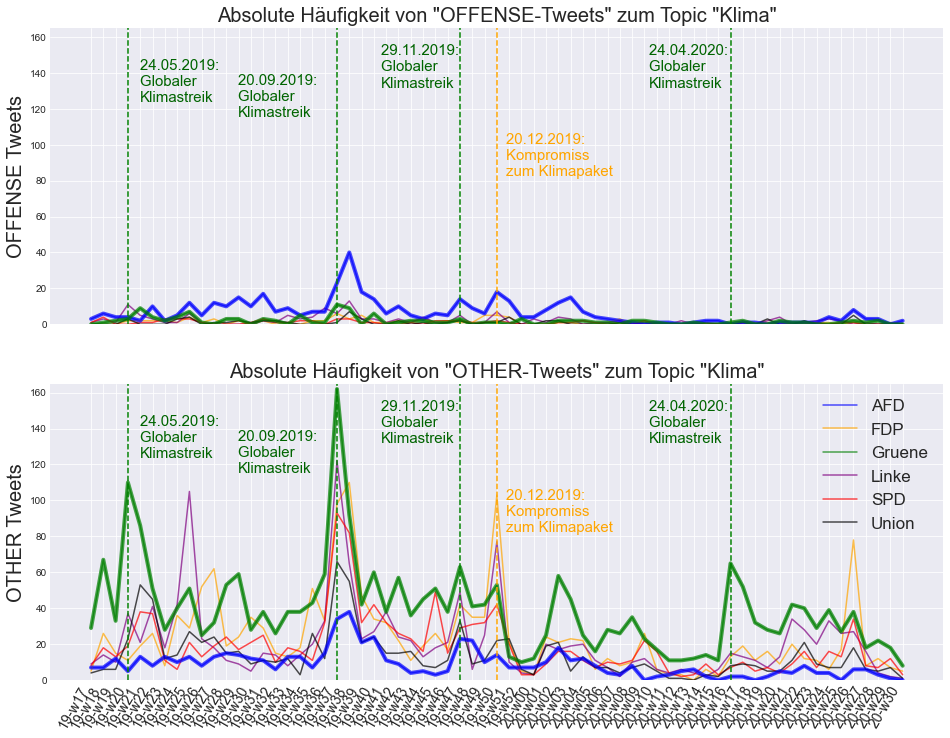

In [48]:
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import pandas as pd
import numpy as np

plt.style.use('seaborn-darkgrid')
my_palette = ['blue', 'orange', 'green', 'purple', 'red', 'black']
fig = plt.figure(figsize = (16, 12))


ax = fig.add_subplot(211)

num=0
for column in sent_Klima_piv_OF:
    ax.plot(sent_Klima_piv_OF.index, sent_Klima_piv_OF[column], color = my_palette[num], alpha=0.7, label = column)
    num+=1

ax.plot(sent_Klima_piv_OF.index, sent_Klima_piv_OF['AFD'], marker='', color='blue', linewidth=4, alpha=0.7)
ax.plot(sent_Klima_piv_OF.index, sent_Klima_piv_OF['Gruene'], marker='', color='green', linewidth=4, alpha=0.7)
# ax.plot(sent_Klima_piv.index, sent_Klima_piv['Linke'], marker='', color='purple', linewidth=4, alpha=0.7)

ax.set_title('Absolute Häufigkeit von "OFFENSE-Tweets" zum Topic "Klima"', size = 20)
ylab = ax.set_ylabel('OFFENSE Tweets', size = 20)

#x_tags
plt.setp(ax.get_xticklabels(), visible=False)
ax.axvline('19-w20', ls='--', color='g')
ax.text(0.1, 0.75, '24.05.2019: \nGlobaler \nKlimastreik', color='darkgreen', fontsize=15, transform=ax.transAxes)
ax.axvline('19-w37', ls='--', color='g')
ax.text(0.21, 0.7, '20.09.2019: \nGlobaler \nKlimastreik', color='darkgreen', fontsize=15, transform=ax.transAxes)
ax.axvline('19-w47', ls='--', color='g')
ax.text(0.37, 0.8, '29.11.2019: \nGlobaler \nKlimastreik', color='darkgreen', fontsize=15, transform=ax.transAxes)
ax.axvline('20-w16', ls='--', color='g')
ax.text(0.67, 0.8, '24.04.2020: \nGlobaler \nKlimastreik', color='darkgreen', fontsize=15, transform=ax.transAxes)
ax.axvline('19-w50', ls='--', color='orange')
ax.text(0.51, 0.5, '20.12.2019: \nKompromiss \nzum Klimapaket', color='orange', fontsize=15, transform=ax.transAxes)
plt.ylim((0, 165))

ax = fig.add_subplot(212)

num=0
for column in sent_Klima_piv_OT:
    ax.plot(sent_Klima_piv_OT.index, sent_Klima_piv_OT[column], color = my_palette[num], alpha=0.7, label = column)
    num+=1

ax.plot(sent_Klima_piv_OT.index, sent_Klima_piv_OT['AFD'], marker='', color='blue', linewidth=4, alpha=0.7)
ax.plot(sent_Klima_piv_OT.index, sent_Klima_piv_OT['Gruene'], marker='', color='green', linewidth=4, alpha=0.7)

ax.set_title('Absolute Häufigkeit von "OTHER-Tweets" zum Topic "Klima"', size = 20)
ylab = ax.set_ylabel('OTHER Tweets', size = 20)
plt.legend(loc = 1, ncol = 1, fontsize = 17)

#x_tags
x_tags = plt.xticks(sent_Klima_piv_OT.index, fontsize = 14, rotation = 60, ha = 'right')



ax.axvline('19-w20', ls='--', color='g')
ax.text(0.1, 0.75, '24.05.2019: \nGlobaler \nKlimastreik', color='darkgreen', fontsize=15, transform=ax.transAxes)
ax.axvline('19-w37', ls='--', color='g')
ax.text(0.21, 0.7, '20.09.2019: \nGlobaler \nKlimastreik', color='darkgreen', fontsize=15, transform=ax.transAxes)
ax.axvline('19-w47', ls='--', color='g')
ax.text(0.37, 0.8, '29.11.2019: \nGlobaler \nKlimastreik', color='darkgreen', fontsize=15, transform=ax.transAxes)
ax.axvline('20-w16', ls='--', color='g')
ax.text(0.67, 0.8, '24.04.2020: \nGlobaler \nKlimastreik', color='darkgreen', fontsize=15, transform=ax.transAxes)
ax.axvline('19-w50', ls='--', color='orange')
ax.text(0.51, 0.5, '20.12.2019: \nKompromiss \nzum Klimapaket', color='orange', fontsize=15, transform=ax.transAxes)
plt.ylim((0, 165))

### Topic: Öffentlich-rechtlicher Rundfunk

In [49]:
sent_GEZ = sent_df_Wien[sent_df_Wien['full_text_processed'].str.match(r'(.*ARD.*|.*ZDF.*|.*WDR.*|.*GEZ.*|.*ÖRR.*|.*Rundfunk.*|.*Staatsfunk.*)(?i)')==True]

sent_GEZ_piv = pd.pivot_table(sent_GEZ, columns = ['user_party'], index = ['predict'], aggfunc = np.count_nonzero)
sent_GEZ_piv['full_text_processed']

user_party,AFD,FDP,Gruene,Linke,SPD,Union
predict,,,,,,
OFFENSE,1050,138,145,217,98,121
OTHER,860,1850,2114,1880,1697,1426


In [50]:
sent_GEZ = sent_df_Wien[sent_df_Wien['full_text_processed'].str.match(r'(.*ARD.*|.*ZDF.*|.*WDR.*|.*GEZ.*|.*ÖRR.*|.*Rundfunk.*|.*Staatsfunk.*)')==True]

sent_GEZ_OF = sent_GEZ.loc[
                            #(sent_GEZ['date']>=datetime.date(2020,1,1))
                              (sent_GEZ['predict'] == 'OFFENSE')
                             ]

sent_GEZ_piv_OF = pd.pivot_table(sent_GEZ_OF, columns = ['user_party'], index = ['month'], aggfunc = np.count_nonzero).fillna(0)
sent_GEZ_piv_OF = sent_GEZ_piv_OF['full_text']


sent_GEZ_OT = sent_GEZ.loc[
                            #(sent_GEZ['date']>=datetime.date(2020,1,1))
                              (sent_GEZ['predict'] == 'OTHER')
                             ]

sent_GEZ_piv_OT = pd.pivot_table(sent_GEZ_OT, columns = ['user_party'], index = ['month'], aggfunc = np.count_nonzero).fillna(0)
sent_GEZ_piv_OT = sent_GEZ_piv_OT['full_text']

In [47]:
sent_GEZ.loc[
                            (sent_GEZ['date']>=datetime.date(2019,12,1))&
    (sent_GEZ['date']<datetime.date(2019,12,20))&
                            #(sent_GEZ['predict'] == 'OFFENSE')&
    (sent_GEZ['user_party'] == 'AFD')
                             ]


,_id,created_at,id,full_text,is_quote_status,retweet_count,lang,created_at_datetime,user_id,user_name,...,user_created_at,partei,user_party,full_text_processed,Monat,Woche,predict,date,month,week
39332,5ed76975dd27a997c2694c8a,Sun Dec 01 18:49:44 +0000 2019,1201211796734054400,"Ja, Ihren Bericht habe ich mit wenig Begeisterung gelesen. Linksradikale, die teilweise vermummt ein Kraftwerksgelände stürmen und Polizisten verletzen, verniedlichend als „Klima-Aktivisten“ zu bezeichnen, könnte auch aus dem Framing-Manual der ARD stammen. https://t.co/pWxQhTVZy7",True,2,de,2019-12-01 18:49:44,831541837965967361,René Springer,...,Tue Feb 14 16:33:18 +0000 2017,"{'_id': 5ed7e2502efe72dc73343cdc, 'Name': 'Rene_Springer', 'Partei': 'AFD'}",AFD,Ja Ihren Bericht habe ich mit wenig Begeisterung gelesen Linksradikale die teilweise vermummt ein Kraftwerksgelände stürmen und Polizisten verletzen verniedlichend als Klima-Aktivisten zu bezeichnen könnte auch aus dem Framing-Manual der ARD stammen,19-12,19-w48,OFFENSE,2019-12-01,19-12,19-w48
39583,5ed769e4dd27a997c2698319,Thu Dec 05 08:20:24 +0000 2019,1202502971063459840,"Wenn die ""Regierenden""🧐 und ihre Helfershelfer die #Meinungsfreiheit nicht mehr ertragen, kommt sowas\ndabei raus!😡 Mit Riesenschritten\nhin zum #Sozialismus!\n#CDU #CSU #SPD #GRÜNE #Linke \n#ÖRR #GEZ #GEZabschaffen #AfD https://t.co/XTimviFKcy",False,25,de,2019-12-05 08:20:24,849060114388705280,"Udo Hemmelgarn, MdB",...,Tue Apr 04 00:44:40 +0000 2017,"{'_id': 5ed7e2502efe72dc73343ce6, 'Name': 'UdoHemmelgarn', 'Partei': 'AFD'}",AFD,Wenn die Regierenden🧐 und ihre Helfershelfer die Meinungsfreiheit nicht mehr ertragen kommt sowasdabei raus😡 Mit Riesenschrittenhin zum SozialismusCDU CSU SPD GRÜNE Linke ÖRR GEZ GEZabschaffen AfD,19-12,19-w48,OFFENSE,2019-12-05,19-12,19-w48
40621,5ed76bbedd27a997c269c653,Wed Dec 04 14:34:14 +0000 2019,1202234662543859712,Kritik am öffentlich-rechtlichen Rundfunk? Geht gar nicht! #UweSteimle #SteimlesWelt https://t.co/myCJuZMhbZ,False,13,de,2019-12-04 14:34:14,917756296555892736,"Jürgen Braun, MdB",...,Tue Oct 10 14:18:46 +0000 2017,"{'_id': 5ed7e2502efe72dc73343cf3, 'Name': 'JuergenBraunAfD', 'Partei': 'AFD'}",AFD,Kritik am öffentlich-rechtlichen Rundfunk Geht gar nicht UweSteimle SteimlesWelt,19-12,19-w48,OTHER,2019-12-04,19-12,19-w48
40622,5ed76bbedd27a997c269c65f,Mon Dec 02 19:48:46 +0000 2019,1201589041730326528,"Auch deutsche Linke waren schon mal intelligenter als heute:\nEckhardt #Henscheid 1993 in ""#Dummdeutsch"":\n""#Antifaschistisch - wahllos eingesetztes einstiges DDR-Dummdeutsch""\n\n#dummeLinke #Antifa #NiewiederDiktatur #NiewiederSozialismus #Kahrs \n#AfD #SPD \n#ARDZDF #GEZ #Bundestag https://t.co/UQIiemsTUQ",False,4,de,2019-12-02 19:48:46,917756296555892736,"Jürgen Braun, MdB",...,Tue Oct 10 14:18:46 +0000 2017,"{'_id': 5ed7e2502efe72dc73343cf3, 'Name': 'JuergenBraunAfD', 'Partei': 'AFD'}",AFD,Auch deutsche Linke waren schon mal intelligenter als heuteEckhardt Henscheid 1993 in DummdeutschAntifaschistisch - wahllos eingesetztes einstiges DDR-DummdeutschdummeLinke Antifa NiewiederDiktatur NiewiederSozialismus Kahrs AfD SPD ARDZDF GEZ Bundestag,19-12,19-w48,OFFENSE,2019-12-02,19-12,19-w48
42020,5ed76c3cdd27a997c269f035,Thu Dec 05 11:58:01 +0000 2019,1202557735411298310,"Warum #Steimle den @mdrde verlassen muss, aber @janboehm bei @ZDF neue Sendung bekommen soll? Weil Steimle Regierungskritiker ist und Böhmermann nützlicher Hofnarr der Regierung. Nein zu dieser linken Personalpolitik: genug GEZahlt, Rundfunkgebühren abschaffen! #AfDimBundestag https://t.co/dfYmPoIsjD",False,154,de,2019-12-05 11:58:01,872663038805016576,Martin Hess,...,Thu Jun 08 03:54:16 +0000 2017,"{'_id': 5ed7e2502efe72dc73343d01, 'Name': 'Martin_Hess_AfD', 'Partei': 'AFD'}",AFD,Warum Steimle den mdrde verlassen muss aber janboehm bei ZDF neue Sendung bekommen soll Weil Steimle Regierungskritiker ist und Böhmermann nützlicher Hofnarr der Regierung Nein zu dieser linken Personalpolitik genug GEZahlt Rundfunkgebühren 

(0.0, 110.0)

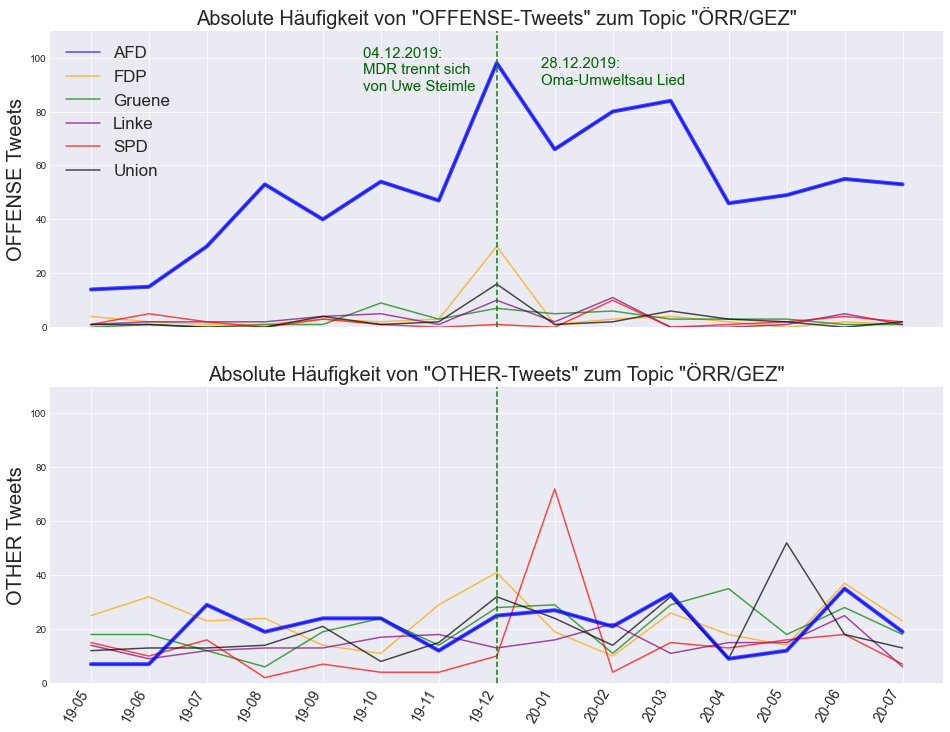

In [51]:
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import pandas as pd
import numpy as np

plt.style.use('seaborn-darkgrid')
my_palette = ['blue', 'orange', 'green', 'purple', 'red', 'black']
fig = plt.figure(figsize = (16, 12))


ax = fig.add_subplot(211)

num=0
for column in sent_GEZ_piv_OF:
    ax.plot(sent_GEZ_piv_OF.index, sent_GEZ_piv_OF[column], color = my_palette[num], alpha=0.7, label = column)
    num+=1

ax.plot(sent_GEZ_piv_OF.index, sent_GEZ_piv_OF['AFD'], marker='', color='blue', linewidth=4, alpha=0.7)
ax.axvline('19-12', ls='--', color='g')
ax.text(0.35, 0.8, '04.12.2019: \nMDR trennt sich \nvon Uwe Steimle', color='darkgreen', fontsize=15, transform=ax.transAxes)
ax.text(0.55, 0.82, '28.12.2019: \nOma-Umweltsau Lied', color='darkgreen', fontsize=15, transform=ax.transAxes)



ax.set_title('Absolute Häufigkeit von "OFFENSE-Tweets" zum Topic "ÖRR/GEZ"', size = 20)
ylab = ax.set_ylabel('OFFENSE Tweets', size = 20)
plt.legend(loc = 2, ncol = 1, fontsize = 17)

#x_tags
plt.setp(ax.get_xticklabels(), visible=False)
plt.ylim((0, 110))

ax = fig.add_subplot(212)

num=0
for column in sent_GEZ_piv_OT:
    ax.plot(sent_GEZ_piv_OT.index, sent_GEZ_piv_OT[column], color = my_palette[num], alpha=0.7, label = column)
    num+=1

ax.plot(sent_GEZ_piv_OT.index, sent_GEZ_piv_OT['AFD'], marker='', color='blue', linewidth=4, alpha=0.7)
ax.axvline('19-12', ls='--', color='g')

ax.set_title('Absolute Häufigkeit von "OTHER-Tweets" zum Topic "ÖRR/GEZ"', size = 20)
ylab = ax.set_ylabel('OTHER Tweets', size = 20)

#x_tags
x_tags = plt.xticks(sent_GEZ_piv_OT.index, fontsize = 14, rotation = 60, ha = 'right')
plt.ylim((0, 110))

### Topic: Corona

In [52]:
sent_Corona = sent_df_Wien[sent_df_Wien['full_text_processed'].str.match(r'(.*Corona.*|.*Covid.*)(?i)')==True]

sent_Corona_piv = pd.pivot_table(sent_Corona, columns = ['user_party'], index = ['predict'], aggfunc = np.count_nonzero)
sent_Corona_piv['full_text_processed']

user_party,AFD,FDP,Gruene,Linke,SPD,Union
predict,,,,,,
OFFENSE,363,74,88,159,73,75
OTHER,1232,2438,2565,2600,1974,2012


In [123]:
sent_Corona['full_text_processed']

58812                                                                                                                                                                                       Herzlichen Glückwunsch an das Forscherteam und natürlich an Manouchehr Sarshar für den erfolgreichen TestTB
5636                                                                                                                                                                                                           KommissarSvens1 NowaboFM KuehniKev Herzlich willkommen freut uns sehr dass Du dabei bist
5628                                                                                                                                      rotquadrat irminsul772 mreasy666 sarschick Obendrein ist die Fahrt im NJ selbst mit der BahnCard nicht kostenfrei Da ist jemand sehr sehr schlecht informiert
104315                                     Coronavirus könnte sich verändern in den nächsten Wochen schneller üb

In [53]:
sent_Corona = sent_df_Wien[sent_df_Wien['full_text_processed'].str.match(r'(.*Corona.*|.*Covid.*)(?i)')==True]

sent_Corona_OF = sent_Corona.loc[
                            #(sent_Corona['date']>=datetime.date(2020,1,1))
                              (sent_Corona['predict'] == 'OFFENSE')
                             ]

sent_Corona_piv_OF = pd.pivot_table(sent_Corona_OF, columns = ['user_party'], index = ['week'], aggfunc = np.count_nonzero).fillna(0)
sent_Corona_piv_OF = sent_Corona_piv_OF['full_text']


sent_Corona_OT = sent_Corona.loc[
                            #(sent_Corona['date']>=datetime.date(2020,1,1))
                              (sent_Corona['predict'] == 'OTHER')
                             ]

sent_Corona_piv_OT = pd.pivot_table(sent_Corona_OT, columns = ['user_party'], index = ['week'], aggfunc = np.count_nonzero).fillna(0)
sent_Corona_piv_OT = sent_Corona_piv_OT['full_text']

(0.0, 310.0)

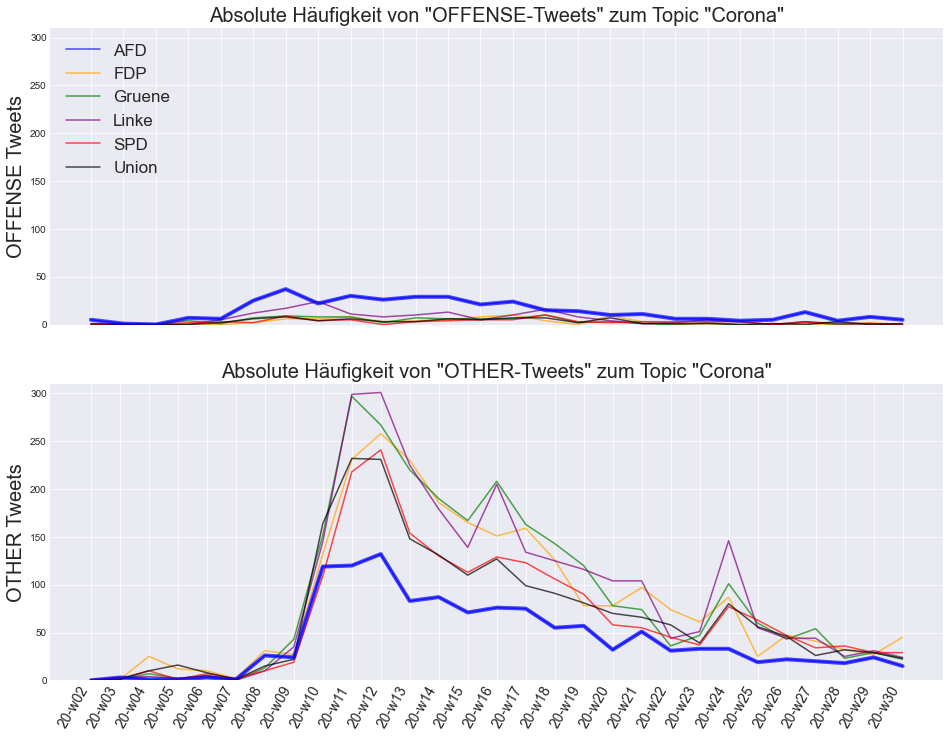

In [54]:
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import pandas as pd
import numpy as np

plt.style.use('seaborn-darkgrid')
my_palette = ['blue', 'orange', 'green', 'purple', 'red', 'black']
fig = plt.figure(figsize = (16, 12))


ax = fig.add_subplot(211)

num=0
for column in sent_Corona_piv_OF:
    ax.plot(sent_Corona_piv_OF.index, sent_Corona_piv_OF[column], color = my_palette[num], alpha=0.7, label = column)
    num+=1

ax.plot(sent_Corona_piv_OF.index, sent_Corona_piv_OF['AFD'], marker='', color='blue', linewidth=4, alpha=0.7)
x_tags = plt.xticks(sent_Corona_piv_OF.index, fontsize = 14)


ax.set_title('Absolute Häufigkeit von "OFFENSE-Tweets" zum Topic "Corona"', size = 20)
ylab = ax.set_ylabel('OFFENSE Tweets', size = 20)
plt.legend(loc = 2, ncol = 1, fontsize = 17)

#x_tags
plt.setp(ax.get_xticklabels(), visible=False)
plt.ylim((0, 310))

ax = fig.add_subplot(212)

num=0
for column in sent_Corona_piv_OT:
    ax.plot(sent_Corona_piv_OT.index, sent_Corona_piv_OT[column], color = my_palette[num], alpha=0.7, label = column)
    num+=1

ax.plot(sent_Corona_piv_OT.index, sent_Corona_piv_OT['AFD'], marker='', color='blue', linewidth=4, alpha=0.7)

ax.set_title('Absolute Häufigkeit von "OTHER-Tweets" zum Topic "Corona"', size = 20)
ylab = ax.set_ylabel('OTHER Tweets', size = 20)

#x_tags
x_tags = plt.xticks(sent_Corona_piv_OT.index, fontsize = 14, rotation = 60, ha = 'right')
plt.ylim((0, 310))

### Topic: Verschwörungstheorien und Fake News

In [157]:
sent_ALU = sent_df_Wien[sent_df_Wien['full_text_processed'].str.match(r'(.*Verschwö.*|.*Aluhut.*|.*Hildmann.*|.*Impfpflicht.*|.*Widerstand2020.*|.*Hygienedemos.*|.*Fake News*|.*FakeNews.*)(?i)')==True]

sent_ALU_piv = pd.pivot_table(sent_ALU, columns = ['user_party'], index = ['predict'], aggfunc = np.count_nonzero)
sent_ALU_piv['full_text_processed']
sent_ALU

,_id,created_at,id,full_text,is_quote_status,retweet_count,lang,created_at_datetime,user_id,user_name,...,user_created_at,partei,user_party,full_text_processed,Monat,Woche,predict,date,month,week
11466,5e958eff15abae9d9d4d8295,Fri May 03 11:05:00 +0000 2019,1124268616252297216,"Ich bin für eine #Impfpflicht, die Eltern verpflichtet, ihre Kinder impfen zu lassen, solange keine medizinischen Anhaltspunkte dagegen sprechen, UND die Gesundheitspolitik, nötige Ressourcen bereitzustellen und aufzuklären. Meine Kolumne #Freitagumeins: https://t.co/L5YCF1rl7g https://t.co/fLFIuuweou",False,12,de,2019-05-03 11:05:00,2320519958,Dietmar Bartsch,...,Fri Jan 31 09:25:36 +0000 2014,"{'_id': 5ed7e2502efe72dc73343d89, 'Name': 'DietmarBartsch', 'Partei': 'Linke'}",Linke,Ich bin für eine Impfpflicht die Eltern verpflichtet ihre Kinder impfen zu lassen solange keine medizinischen Anhaltspunkte dagegen sprechen UND die Gesundheitspolitik nötige Ressourcen bereitzustellen und aufzuklären Meine Kolumne Freitagumeins,19-05,19-w17,OTHER,2019-05-03,19-05,19-w17
74430,5f27dc29b971ae79d7bc614f,Thu May 02 13:36:30 +0000 2019,1123944352827490304,"Reaktionäre Schulbücher haben an unseren Schulen nichts verloren! Gerne türkisch/kurdischen/arabischen Sprachunterricht als zusätzliches Wahlfach. Frei von Antisemitismus, Frauenfeindlichkeit &amp; Verschwörungstheorien. Recherche von @ConstSchreiber macht nachdenklich. https://t.co/RRvm5h0iea",False,70,de,2019-05-02 13:36:30,19108766,Cem Özdemir,...,Sat Jan 17 12:30:36 +0000 2009,"{'_id': 5ed7e2502efe72dc73343d44, 'Name': 'cem_oezdemir', 'Partei': 'Gruene'}",Gruene,Reaktionäre Schulbücher haben an unseren Schulen nichts verloren Gerne türkisch/kurdischen/arabischen Sprachunterricht als zusätzliches Wahlfach Frei von Antisemitismus Frauenfeindlichkeit Verschwörungstheorien Recherche von ConstSchreiber macht nachdenklich,19-05,19-w17,OFFENSE,2019-05-02,19-05,19-w17
105857,5f27f599f97a3f33284bc67d,Fri May 03 16:59:56 +0000 2019,1124357937386991616,"Und gerade und erst recht ist eine unabhängige Presse heute notwendig, wenn über soziale Medien oftmals Fakenews verbreitet werden. Gerade hier ordnet die Presse Themen wieder richtig ein. https://t.co/GM2a6vDPVS",True,0,de,2019-05-03 16:59:56,829056811974144001,Alexander Throm,...,Tue Feb 07 19:58:41 +0000 2017,"{'_id': 5ed7e2502efe72dc73343c40, 'Name': 'alexander_throm', 'Partei': 'Union'}",Union,Und gerade und erst recht ist eine unabhängige Presse heute notwendig wenn über soziale Medien oftmals Fakenews verbreitet werden Gerade hier ordnet die Presse Themen wieder richtig ein,19-05,19-w17,OTHER,2019-05-03,19-05,19-w17
6405,5e9554b521dec1d53688bd40,Sun May 05 17:15:44 +0000 2019,1125086689737756673,Vielen Dank. Gute Arbeit gegen #Populismus #Impfpflicht https://t.co/deK7PsmUiK,True,0,de,2019-05-05 17:15:44,17870195,Kordula Schulz-Asche,...,Thu Dec 04 15:40:59 +0000 2008,"{'_id': 5ed7e2502efe72dc73343d3c, 'Name': 'K_SA', 'Partei': 'Gruene'}",Gruene,Vielen Dank Gute Arbeit gegen Populismus Impfpflicht,19-05,19-w18,OTHER,2019-05-05,19-05,19-w18
7602,5e95565121dec1d53689af5c,Mon May 06 07:12:42 +0000 2019,1125297318998233088,"Bemerkenswert: am gleichen Tag,an dem Parlamentariergruppe einen Antrag zur gut informierten, freiwilligen #Organspende öffentlich vorstellt, bestimmt @jensspahn die Schlagzeilen mit seiner zuvor lancierten Initiative zur #Impfpflicht. Das zum Thema Respekt bei ethischen Debatten",False,5,de,2019-05-06 07:12:42,18103366,Maria Klein-Schmeink,...,Sat Dec 13 19:27:20 +0000 2008,"{'_id': 5ed7e2502efe72dc73343d51, 'Name': 'MariaKlSchmeink', 'Partei': 'Gruene'}",Gruene,Bemerkenswert am gleichen Tagan dem Parlamentariergruppe einen Antrag zur gut informierten freiwilligen Organspende öffentlich vorstellt bestimmt jensspahn die Schlagzeilen mit seiner zuvor lancierten Initiative zur Impfpflicht Das zum Thema Respekt bei ethischen Debatten,19-05,19-w18,OTHER,2019-05-06,19-05,19-w18
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,.

In [55]:
sent_ALU = sent_df_Wien[sent_df_Wien['full_text_processed'].str.match(r'(.*Verschwö.*|.*Aluhut.*|.*Hildmann.*|.*Impfpflicht.*|.*Widerstand2020.*|.*Hygienedemos.*|.*Fake News*|.*FakeNews.*)(?i)')==True]

sent_ALU_OF = sent_ALU.loc[
                             (sent_ALU['date']>=datetime.date(2020,1,1))&
                              (sent_ALU['predict'] == 'OFFENSE')
                             ]

sent_ALU_piv_OF = pd.pivot_table(sent_ALU_OF, columns = ['user_party'], index = ['week'], aggfunc = np.count_nonzero).fillna(0)
sent_ALU_piv_OF = sent_ALU_piv_OF['full_text']


sent_ALU_OT = sent_ALU.loc[
                             (sent_ALU['date']>=datetime.date(2020,1,1))&
                              (sent_ALU['predict'] == 'OTHER')
                             ]

sent_ALU_piv_OT = pd.pivot_table(sent_ALU_OT, columns = ['user_party'], index = ['week'], aggfunc = np.count_nonzero).fillna(0)
sent_ALU_piv_OT = sent_ALU_piv_OT['full_text']

(0.0, 50.0)

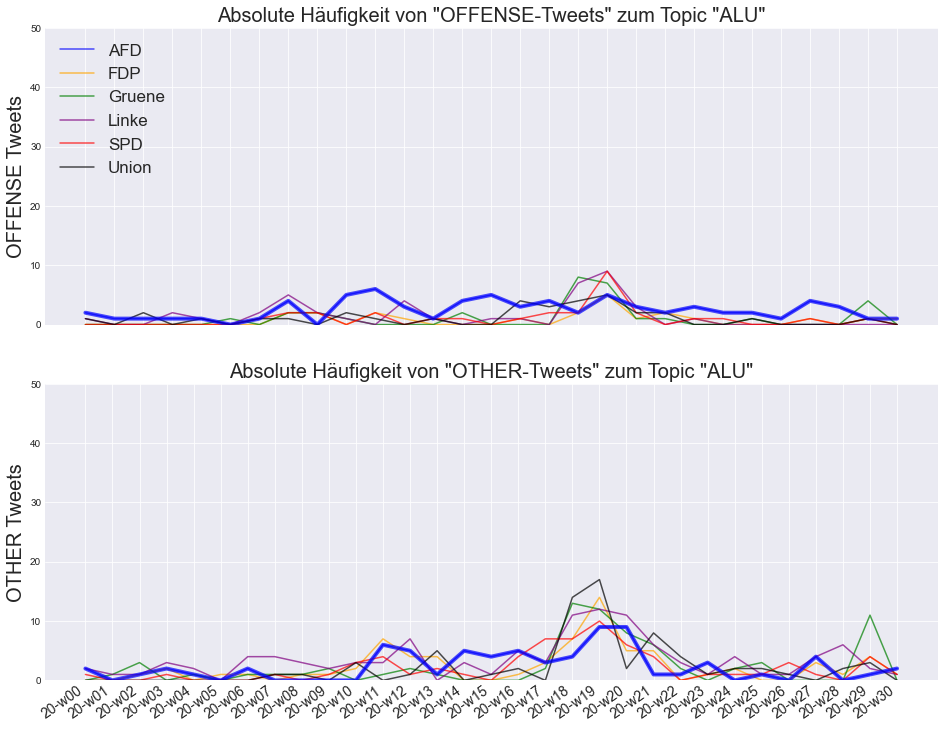

In [56]:
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import pandas as pd
import numpy as np

plt.style.use('seaborn-darkgrid')
my_palette = ['blue', 'orange', 'green', 'purple', 'red', 'black']
fig = plt.figure(figsize = (16, 12))


ax = fig.add_subplot(211)

num=0
for column in sent_ALU_piv_OF:
    ax.plot(sent_ALU_piv_OF.index, sent_ALU_piv_OF[column], color = my_palette[num], alpha=0.7, label = column)
    num+=1

ax.plot(sent_ALU_piv_OF.index, sent_ALU_piv_OF['AFD'], marker='', color='blue', linewidth=4, alpha=0.7)
#x_tags = plt.xticks(sent_ALU_piv_OF.index, fontsize = 12, rotation = 35, ha = 'right')
plt.setp(ax.get_xticklabels(), visible=False)


ax.set_title('Absolute Häufigkeit von "OFFENSE-Tweets" zum Topic "ALU"', size = 20)
ylab = ax.set_ylabel('OFFENSE Tweets', size = 20)
plt.legend(loc = 2, ncol = 1, fontsize = 17)
plt.ylim((0, 50))


ax = fig.add_subplot(212)

num=0
for column in sent_ALU_piv_OT:
    ax.plot(sent_ALU_piv_OT.index, sent_ALU_piv_OT[column], color = my_palette[num], alpha=0.7, label = column)
    num+=1

ax.plot(sent_ALU_piv_OT.index, sent_ALU_piv_OT['AFD'], marker='', color='blue', linewidth=4, alpha=0.7)

ax.set_title('Absolute Häufigkeit von "OTHER-Tweets" zum Topic "ALU"', size = 20)
ylab = ax.set_ylabel('OTHER Tweets', size = 20)

#x_tags
x_tags = plt.xticks(sent_ALU_piv_OT.index, fontsize = 14, rotation = 35, ha = 'right')
plt.ylim((0, 50))

### Topic: Islam 

In [160]:
sent_Islam = sent_df_Wien[sent_df_Wien['full_text_processed'].str.match(r'(.*Islam.*|.*Moslem.*|.*Muslim.*|.*Kopftuch.*|.*Koran.*|.*Mosche.*|.*Arab.*|.*Imam.*)(?i)')==True]

sent_Islam_piv = pd.pivot_table(sent_Islam, columns = ['user_party'], index = ['predict'], aggfunc = np.count_nonzero)
# sent_Islam_piv['full_text_processed']

In [161]:
sent_Islam = sent_df_Wien[sent_df_Wien['full_text_processed'].str.match(r'(.*Islam.*|.*Moslem.*|.*Muslim.*|.*Kopftuch.*|.*Koran.*|.*Mosche.*|.*Arab.*|.*Imam.*)(?i)')==True]

sent_Islam_OF = sent_Islam.loc[
                            #(sent_Islam['date']>=datetime.date(2020,1,1))
                              (sent_Islam['predict'] == 'OFFENSE')
                             ]

sent_Islam_piv_OF = pd.pivot_table(sent_Islam_OF, columns = ['user_party'], index = ['week'], aggfunc = np.count_nonzero).fillna(0)
sent_Islam_piv_OF = sent_Islam_piv_OF['full_text']


sent_Islam_OT = sent_Islam.loc[
                            #(sent_Islam['date']>=datetime.date(2020,1,1))
                              (sent_Islam['predict'] == 'OTHER')
                             ]

sent_Islam_piv_OT = pd.pivot_table(sent_Islam_OT, columns = ['user_party'], index = ['week'], aggfunc = np.count_nonzero).fillna(0)
sent_Islam_piv_OT = sent_Islam_piv_OT['full_text']

(0, 18)

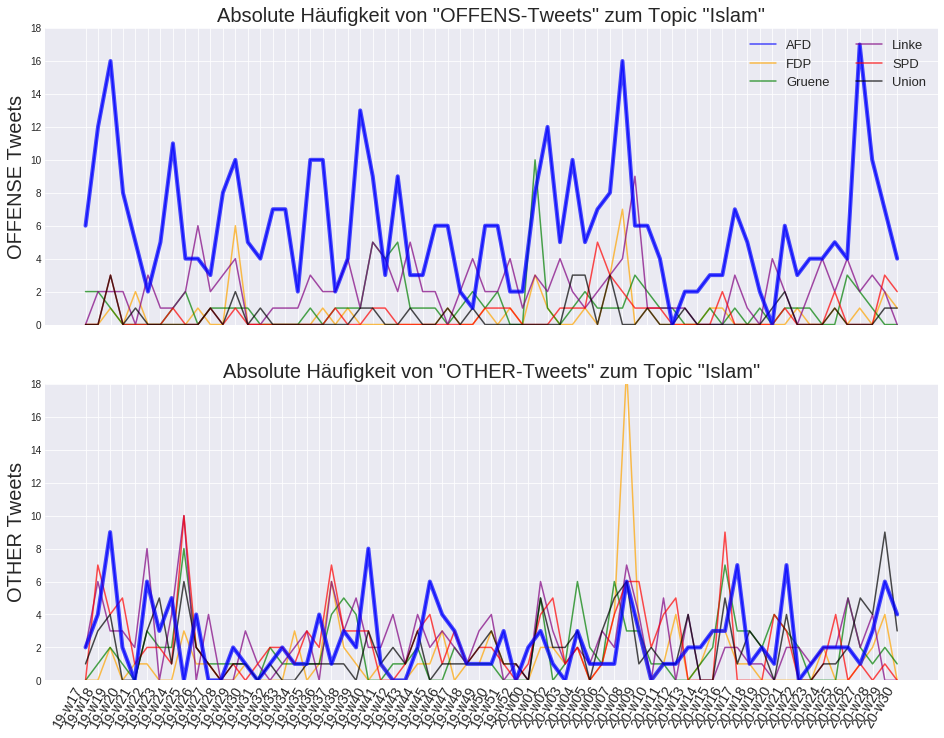

In [174]:
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import pandas as pd
import numpy as np

plt.style.use('seaborn-darkgrid')
my_palette = ['blue', 'orange', 'green', 'purple', 'red', 'black']
fig = plt.figure(figsize = (16, 12))


ax = fig.add_subplot(211)

num=0
for column in sent_Islam_piv_OF:
    ax.plot(sent_Islam_piv_OF.index, sent_Islam_piv_OF[column], color = my_palette[num], alpha=0.7, label = column)
    num+=1

ax.plot(sent_Islam_piv_OF.index, sent_Islam_piv_OF['AFD'], marker='', color='blue', linewidth=4, alpha=0.7)
#x_tags = plt.xticks(sent_Islam_piv_OF.index, fontsize = 12, rotation = 35, ha = 'right')
plt.setp(ax.get_xticklabels(), visible=False)


ax.set_title('Absolute Häufigkeit von "OFFENSE-Tweets" zum Topic "Islam"', size = 20)
ylab = ax.set_ylabel('OFFENSE Tweets', size = 20)
plt.legend(loc = 1, ncol = 2, fontsize = 13)
plt.ylim((0, 18))


ax = fig.add_subplot(212)

num=0
for column in sent_Islam_piv_OT:
    ax.plot(sent_Islam_piv_OT.index, sent_Islam_piv_OT[column], color = my_palette[num], alpha=0.7, label = column)
    num+=1

ax.plot(sent_Islam_piv_OT.index, sent_Islam_piv_OT['AFD'], marker='', color='blue', linewidth=4, alpha=0.7)

ax.set_title('Absolute Häufigkeit von "OTHER-Tweets" zum Topic "Islam"', size = 20)
ylab = ax.set_ylabel('OTHER Tweets', size = 20)

#x_tags
x_tags = plt.xticks(sent_Islam_piv_OT.index, fontsize = 14, rotation = 60, ha = 'right')
plt.ylim((0, 18))

### Topic: Links- und Rechtsextremismus

In [57]:

sent_LiEx = sent_df_Wien[sent_df_Wien['full_text_processed'].str.match(r'(.*Linksextrem.*)(?i)')==True]

sent_LiEx_OF = sent_LiEx.loc[
                            #(sent_LiEx['date']>=datetime.date(2020,1,1))
                              (sent_LiEx['predict'] == 'OFFENSE')
                             ]

sent_LiEx_piv_OF = pd.pivot_table(sent_LiEx_OF, columns = ['user_party'], index = ['month'], aggfunc = np.count_nonzero).fillna(0)
sent_LiEx_piv_OF = sent_LiEx_piv_OF['full_text']


sent_LiEx_OT = sent_LiEx.loc[
                            #(sent_LiEx['date']>=datetime.date(2020,1,1))
                              (sent_LiEx['predict'] == 'OTHER')
                             ]

sent_LiEx_piv_OT = pd.pivot_table(sent_LiEx_OT, columns = ['user_party'], index = ['month'], aggfunc = np.count_nonzero).fillna(0)
sent_LiEx_piv_OT = sent_LiEx_piv_OT['full_text']


In [58]:
sent_ReEx = sent_df_Wien[sent_df_Wien['full_text_processed'].str.match(r'(.*Rechtsextrem.*)(?i)')==True]

sent_ReEx_OF = sent_ReEx.loc[
                            #(sent_ReEx['date']>=datetime.date(2020,1,1))
                              (sent_ReEx['predict'] == 'OFFENSE')
                             ]

sent_ReEx_piv_OF = pd.pivot_table(sent_ReEx_OF, columns = ['user_party'], index = ['month'], aggfunc = np.count_nonzero).fillna(0)
sent_ReEx_piv_OF = sent_ReEx_piv_OF['full_text']

sent_ReEx_OT = sent_ReEx.loc[
                            #(sent_ReEx['date']>=datetime.date(2020,1,1))
                              (sent_ReEx['predict'] == 'OTHER')
                             ]

sent_ReEx_piv_OT = pd.pivot_table(sent_ReEx_OT, columns = ['user_party'], index = ['month'], aggfunc = np.count_nonzero).fillna(0)
sent_ReEx_piv_OT = sent_ReEx_piv_OT['full_text']

In [44]:
sent_ReEx.loc[(sent_ReEx['user_party'] == 'FDP')
              &(sent_ReEx['predict'] == 'OTHER')
              &(sent_ReEx['month'] == '19-10')]

sent_LiEx.loc[(sent_LiEx['user_party'] == 'AFD')
              &(sent_LiEx['predict'] == 'OFFENSE')
              &(sent_LiEx['month'] == '20-01')]

,_id,created_at,id,full_text,is_quote_status,retweet_count,lang,created_at_datetime,user_id,user_name,...,user_created_at,partei,user_party,full_text_processed,Monat,Woche,predict,date,month,week
484,5e954e7b7973ce3573488207,Wed Jan 01 21:09:55 +0000 2020,1212481099919704070,"Aus gegebenem Anlass, nochmal unser Antrag gegen #Linksextremismus. Die Altparteien haben ihn abgelehnt, auch die, die angesichts der neusten Gewalttaten und Drohungen von links, nun völlig schockiert sind. #AfD #Linksterrorismus #Connewitz \n\nhttps://t.co/Jek14k5xOU",False,410,de,2020-01-01 21:09:55,814970546366611457,"Joana Cotar, MdB",...,Fri Dec 30 23:04:54 +0000 2016,"{'_id': 5ed7e2502efe72dc73343cef, 'Name': 'JoanaCotar', 'Partei': 'AFD'}",AFD,Aus gegebenem Anlass nochmal unser Antrag gegen Linksextremismus Die Altparteien haben ihn abgelehnt auch die die angesichts der neusten Gewalttaten und Drohungen von links nun völlig schockiert sind AfD Linksterrorismus Connewitz,20-01,20-w00,OFFENSE,2020-01-01,20-01,20-w00
25712,5ed76923dd27a997c2693369,Thu Jan 02 14:36:51 +0000 2020,1212744568258646018,"„Jeder bürgerliche Demokrat ist ein potenzieller Nazi, jeder Linksextremist ein guter Kerl: Im «Kampf gegen rechts» bleiben Vernunft und Verhältnismässigkeit zunehmend auf der Strecke.“ https://t.co/UmnWsBIbY3",False,32,de,2020-01-02 14:36:51,713361366858481664,🇩🇪Stephan Brandner🇩🇪,...,Fri Mar 25 13:46:18 +0000 2016,"{'_id': 5ed7e2502efe72dc73343cd6, 'Name': 'StBrandner', 'Partei': 'AFD'}",AFD,Jeder bürgerliche Demokrat ist ein potenzieller Nazi jeder Linksextremist ein guter Kerl Im «Kf gegen rechts» bleiben Vernunft und Verhältnismässigkeit zunehmend auf der Strecke,20-01,20-w00,OFFENSE,2020-01-02,20-01,20-w00
26566,5ed769e3dd27a997c2698151,Fri Jan 03 20:59:41 +0000 2020,1213203299303854081,"@Reporter_Flash @StSchilling75 Die sollen diese von #Linksextremen\nbegangenen ""Schweinereien🤮""\ngegen unsere Polizeibeamten \nmal in Ihrer eigenen linken ""Blase""\nabarbeiten! 😎 Daher kommen die Täter!😡\n#SPD #Polizei #Gewalt #Leipzig",False,1,de,2020-01-03 20:59:41,849060114388705280,"Udo Hemmelgarn, MdB",...,Tue Apr 04 00:44:40 +0000 2017,"{'_id': 5ed7e2502efe72dc73343ce6, 'Name': 'UdoHemmelgarn', 'Partei': 'AFD'}",AFD,Reporter_Flash StSchilling75 Die sollen diese von Linksextremenbegangenen Schweinereien🤮gegen unsere Polizeibeamten mal in Ihrer eigenen linken Blaseabarbeiten 😎 Daher kommen die Täter😡SPD Polizei Gewalt Leipzig,20-01,20-w00,OFFENSE,2020-01-03,20-01,20-w00
27658,5ed76bbedd27a997c269c5b7,Sat Jan 04 16:52:50 +0000 2020,1213503565869801479,"#Linksextremisten dürfen sich offenbar alles erlauben. Ob #Connewitz oder #Berlin, nachher attackieren die ""#linksradikalenKräfte in der #SPD"" wie Saskia #Esken die #Polizei, nicht die Täter. \nNur wir sagen klar nein zu jedem #Extremismus, egal ob links, rechts oder islamisch! https://t.co/u64oTETwiN",True,4,de,2020-01-04 16:52:50,917756296555892736,"Jürgen Braun, MdB",...,Tue Oct 10 14:18:46 +0000 2017,"{'_id': 5ed7e2502efe72dc73343cf3, 'Name': 'JuergenBraunAfD', 'Partei': 'AFD'}",AFD,Linksextremisten dürfen sich offenbar alles erlauben Ob Connewitz oder Berlin nachher attackieren die linksradikalenKräfte in der SPD wie Saskia Esken die Polizei nicht die Täter Nur wir sagen klar nein zu jedem Extremismus egal ob links rechts oder islamisch,20-01,20-w00,OFFENSE,2020-01-04,20-01,20-w00
27662,5ed76bbedd27a997c269c5c3,Thu Jan 02 08:11:44 +0000 2020,1212647650211831808,#Linksextremismus: Zum zweiten Mal innerhalb weniger Tage wurde ein Auto des bekannten B.Z.-Journalisten Gunnar #Schupelius angezündet. Wo bleibt hier der Aufschrei in Politik und Medien? https://t.co/smDWEAzBGC,False,2,de,2020-01-02 08:11:44,917756296555892736,"Jürgen Braun, MdB",...,Tue Oct 10 14:18:46 +0000 2017,"{'_id': 5ed7e2502efe72dc73343cf3, 'Name': 'JuergenBraunAfD', 'Partei': 'AFD'}",AFD,Linksextremismus Zum zweiten Mal innerhalb weniger Tage wurde ein Auto des bekannten BZ-Journalisten Gunnar Schupelius angezündet Wo bleibt hier der Aufsch

Text(0.7, 0.8, '19.02.2020: \nAnschlag \nHanau')

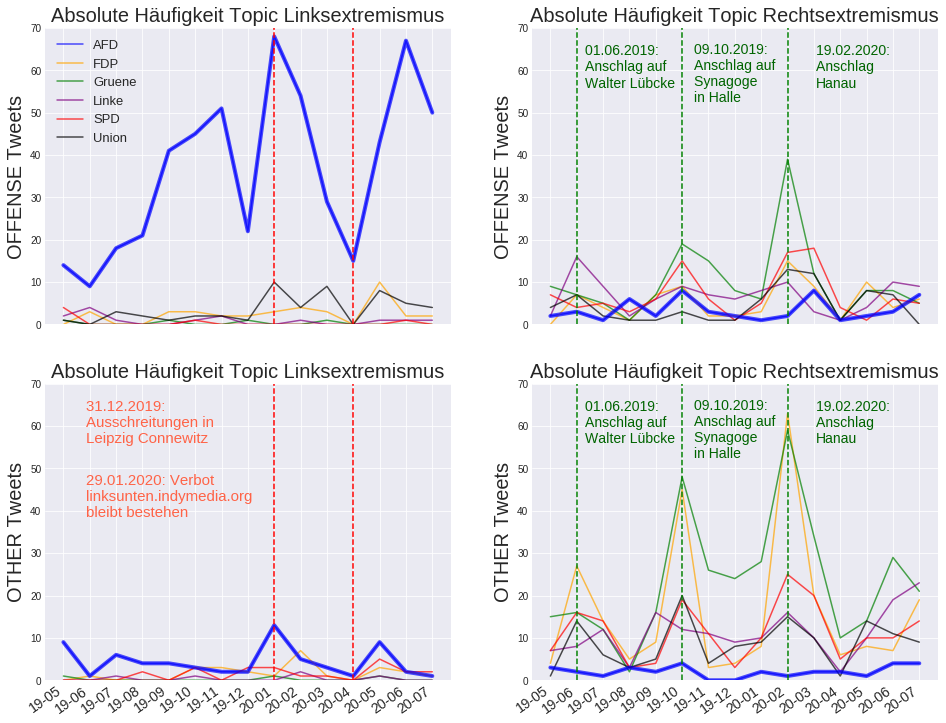

In [209]:

import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import pandas as pd
import numpy as np

plt.style.use('seaborn-darkgrid')
my_palette = ['blue', 'orange', 'green', 'purple', 'red', 'black']
fig = plt.figure(figsize = (16, 12))

#######

ax = fig.add_subplot(221)

num=0
for column in sent_LiEx_piv_OF:
    ax.plot(sent_LiEx_piv_OF.index, sent_LiEx_piv_OF[column], color = my_palette[num], alpha=0.7, label = column)
    num+=1

ax.plot(sent_LiEx_piv_OF.index, sent_LiEx_piv_OF['AFD'], marker='', color='blue', linewidth=4, alpha=0.7)
#x_tags = plt.xticks(sent_LiEx_piv_OF.index, fontsize = 12, rotation = 35, ha = 'right')
plt.setp(ax.get_xticklabels(), visible=False)


ax.set_title('Absolute Häufigkeit Topic Linksextremismus', size = 20)
ylab = ax.set_ylabel('OFFENSE Tweets', size = 20)
ax.axvline('20-01', ls='--', color='r')
ax.axvline('20-04', ls='--', color='r')

plt.legend(loc = 2, ncol = 1, fontsize = 13)
plt.ylim((0, 70))

ax = fig.add_subplot(223)

num=0
for column in sent_LiEx_piv_OT:
    ax.plot(sent_LiEx_piv_OT.index, sent_LiEx_piv_OT[column], color = my_palette[num], alpha=0.7, label = column)
    num+=1

ax.plot(sent_LiEx_piv_OT.index, sent_LiEx_piv_OT['AFD'], marker='', color='blue', linewidth=4, alpha=0.7)

ax.set_title('Absolute Häufigkeit Topic Linksextremismus', size = 20)
ylab = ax.set_ylabel('OTHER Tweets', size = 20)

#x_tags
x_tags = plt.xticks(sent_LiEx_piv_OT.index, fontsize = 14, rotation = 35, ha = 'right')

ax.axvline('20-01', ls='--', color='r')
ax.text(0.1, 0.8, '31.12.2019: \nAusschreitungen in \nLeipzig Connewitz', color='tomato', fontsize=15, transform=ax.transAxes)
ax.axvline('20-04', ls='--', color='r')
ax.text(0.1, 0.55, '29.01.2020: Verbot \nlinksunten.indymedia.org \nbleibt bestehen', color='tomato', fontsize=15, transform=ax.transAxes)
plt.ylim((0, 70))

######


ax = fig.add_subplot(222)

num=0
for column in sent_ReEx_piv_OF:
    ax.plot(sent_ReEx_piv_OF.index, sent_ReEx_piv_OF[column], color = my_palette[num], alpha=0.7, label = column)
    num+=1

ax.plot(sent_ReEx_piv_OF.index, sent_ReEx_piv_OF['AFD'], marker='', color='blue', linewidth=4, alpha=0.7)
#x_tags = plt.xticks(sent_ReEx_piv_OF.index, fontsize = 12, rotation = 35, ha = 'right')
plt.setp(ax.get_xticklabels(), visible=False)
plt.ylim((0, 70))

ax.set_title('Absolute Häufigkeit Topic Rechtsextremismus', size = 20)
ylab = ax.set_ylabel('OFFENSE Tweets', size = 20)
ax.axvline('19-10', ls='--', color='g')
ax.text(0.4, 0.75, '09.10.2019: \nAnschlag auf \nSynagoge \nin Halle', color='darkgreen', fontsize=14, transform=ax.transAxes)
ax.axvline('19-06', ls='--', color='g')
ax.text(0.13, 0.8, '01.06.2019: \nAnschlag auf \nWalter Lübcke', color='darkgreen', fontsize=14, transform=ax.transAxes)
ax.axvline('20-02', ls='--', color='g')
ax.text(0.7, 0.8, '19.02.2020: \nAnschlag \nHanau', color='darkgreen', fontsize=14, transform=ax.transAxes)



ax = fig.add_subplot(224)

num=0
for column in sent_ReEx_piv_OT:
    ax.plot(sent_ReEx_piv_OT.index, sent_ReEx_piv_OT[column], color = my_palette[num], alpha=0.7, label = column)
    num+=1

ax.plot(sent_ReEx_piv_OT.index, sent_ReEx_piv_OT['AFD'], marker='', color='blue', linewidth=4, alpha=0.7)

ax.set_title('Absolute Häufigkeit Topic Rechtsextremismus', size = 20)
ylab = ax.set_ylabel('OTHER Tweets', size = 20)
plt.ylim((0, 70))

#x_tags
x_tags = plt.xticks(sent_ReEx_piv_OT.index, fontsize = 14, rotation = 35, ha = 'right')

ax.axvline('19-10', ls='--', color='g')
ax.text(0.4, 0.75, '09.10.2019: \nAnschlag auf \nSynagoge \nin Halle', color='darkgreen', fontsize=14, transform=ax.transAxes)
ax.axvline('19-06', ls='--', color='g')
ax.text(0.13, 0.8, '01.06.2019: \nAnschlag auf \nWalter Lübcke', color='darkgreen', fontsize=14, transform=ax.transAxes)
ax.axvline('20-02', ls='--', color='g')
ax.text(0.7, 0.8, '19.02.2020: \nAnschlag \nHanau', color='darkgreen', fontsize=14, transform=ax.transAxes)




### Topic: Black Lives Matter

In [61]:
sent_BLM = sent_df_Wien[sent_df_Wien['full_text_processed'].str.match(r'(.*Minneapolis.*|.*BLM.*|.*George Floyd.*|.*Black_Lives.*|.*rassismus.*|.*POC.*)(?i)')==True]
#sent_BLM = sent_df_Wien[sent_df_Wien['full_text_processed'].str.match(r'(.*Polizei.*|.*Polizeigewalt.*)(?i)')==True]
#sent_BLM = sent_df_Wien[sent_df_Wien['full_text_processed'].str.match(r'(.*Minneapolis.*|.*BLM.*|.*George Floyd.*|.*Black_Lives.*|.*rassismus.*|.*POC.*|.*Polizei.*|.*Polizeigewalt.*)(?i)')==True]

sent_BLM_OF = sent_BLM.loc[
                             (sent_BLM['date']>=datetime.date(2020,5,15))
                             & (sent_BLM['predict'] == 'OFFENSE')
                             ]

sent_BLM_piv_OF = pd.pivot_table(sent_BLM_OF, columns = ['user_party'], index = ['week'], aggfunc = np.count_nonzero).fillna(0)
sent_BLM_piv_OF = sent_BLM_piv_OF['full_text']

sent_BLM_OT = sent_BLM.loc[
                              (sent_BLM['date']>=datetime.date(2020,5,15))
                              &(sent_BLM['predict'] == 'OTHER')
                             ]

sent_BLM_piv_OT = pd.pivot_table(sent_BLM_OT, columns = ['user_party'], index = ['week'], aggfunc = np.count_nonzero).fillna(0)
sent_BLM_piv_OT = sent_BLM_piv_OT['full_text']

In [184]:
pd.set_option('display.max_rows', None)
pd.set_option('display.max_colwidth', None)

sent_BLM[['full_text', 'predict', 'user_party']]

,full_text,predict,user_party
9167,Aufstehen gegen Rassismus auf der Demos #zusammenstehen und #diy0105 tolle Stimmung! AfD hatte ursprünglich 10.000 angekündigt - jetzt nur 500. ✊🏽@aufstehengegen https://t.co/KoPg5YkXnk,OTHER,Linke
11004,"Danke @SusanneHennig, @ChristianSchaft, @schirdewan Keinen Fußbreit, keine Straße, kein Parlament der rechtsradikalen AfD. Rassismus &amp; Nationalismus sind keine Alternative, sondern zu bekämpfen ✊ #linke #ef0105 #1Mai #noafd #nonazis #erstermai #europasolidarisch #Erfurt https://t.co/ej1DAm0iKP",OTHER,Linke
11006,"Kein Klima für Rassismus ✊ @Ende__Gelaende blockiert heute in #Erfurt Höcke &amp; sein braunes Pack. Meine solidarischen Grüße aus dem Norden, viel Erfolg 🤩 #1Mai #noafd #nonazis #endegelände #Klimaschutz #Klimagerechtigkeit https://t.co/XwQty1eSxj",OFFENSE,Linke
22679,"Kein #Klima für Rassismus, nicht in #Erfurt, nicht anderswo. Danke an @Ende__Gelaende &amp; alle Antifaschist*innen, die das heute am #1Mai deutlich machen ✊\n\n#Linke #europasolidarisch #endegelände #MayDay #FridaysForFuture #ExtinctionRebellion #Klimaschutz #Europawahl2019 https://t.co/fLXHuiZ2ue",OTHER,Linke
81469,Auf gehts zur Mai-Demo. Für ein soziales Europa und gegen Rassismus. #Duisburg #DGB #erstermai https://t.co/PzJj3Xh5u1,OTHER,SPD
83025,Abschluss der Woche gegen Rassismus in Bielefeld. Ich bin dabei!#keinRassismus https://t.co/7ngngKXgvj,OTHER,Linke
88240,#1Mai mit Tausenden für #BesseresLeben gegen Rassismus demonstriert. Nun gilt: DIE Stimme für #Mindestlohn #Mitbestimmung #Menschenrechte im #EP stärken. Am #26Mai @dieLinke wählen #EuropaSolidarisch https://t.co/88OxouWVlR,OTHER,Linke
101212,"#EF0105 #zusammenstehen #ammsm0105 @Linksfraktion hier kommen Tausende zusammen für unteilbare Menschenrechte, für soziale und ökologische Gerechtigkeit, gegen Rassismus und die #FCKAFD :) wir unterstützen mit Äpfeln und Dabei sein @ch_buchholz @MartinaRenner https://t.co/K9DfEHmGIw",OTHER,Linke
105161,Von insgesamt 24.000 Rechtsextremisten in Deutschland werden 12.700 als gewaltorientiert eingeschätzt! Das @BMI_Bund warnt zudem vor Radikalisierungsgefahr. Wir müssen diese Gefahr ernst nehmen! #Rechtsextremismus #Rassismus\nhttps://t.co/q6lnuWq2R8,OTHER,Linke
112347,Körperliche Strafen. #Kopftuch. #Intoleranz. Der echte #Islam. Nur zur Erinnerung. \nIst Kritik an dieser Religion #Rassismus? https://t.co/oyU0Mg2uUv,OFFENSE,AFD


(0.0, 60.0)

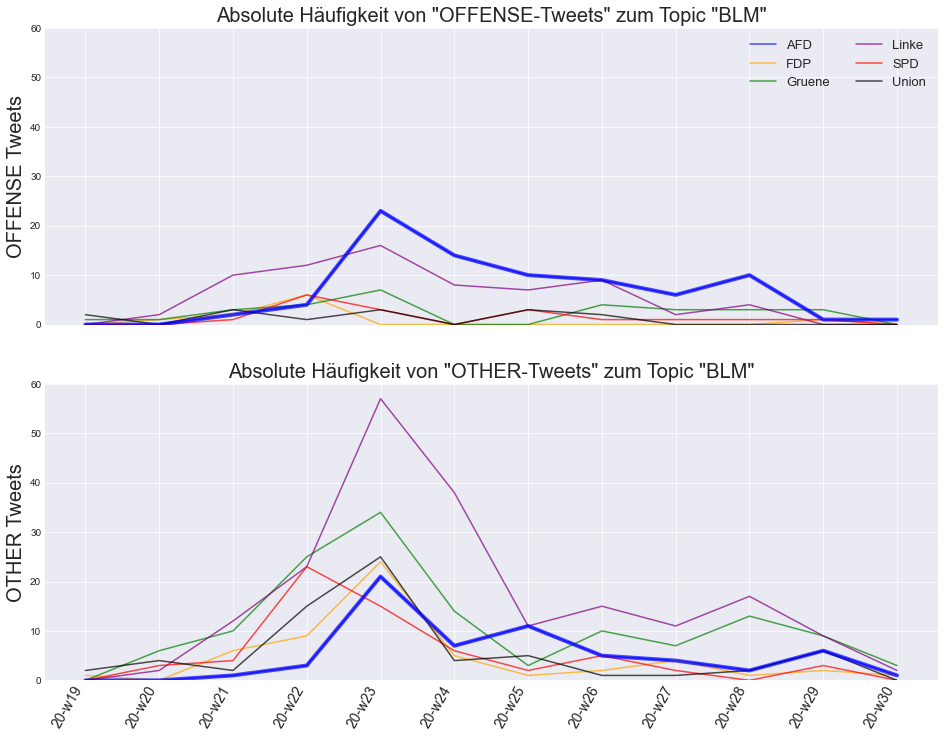

In [62]:
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import pandas as pd
import numpy as np

plt.style.use('seaborn-darkgrid')
my_palette = ['blue', 'orange', 'green', 'purple', 'red', 'black']
fig = plt.figure(figsize = (16, 12))


ax = fig.add_subplot(211)

num=0
for column in sent_BLM_piv_OF:
    ax.plot(sent_BLM_piv_OF.index, sent_BLM_piv_OF[column], color = my_palette[num], alpha=0.7, label = column)
    num+=1

ax.plot(sent_BLM_piv_OF.index, sent_BLM_piv_OF['AFD'], marker='', color='blue', linewidth=4, alpha=0.7)
#x_tags = plt.xticks(sent_BLM_piv_OF.index, fontsize = 12, rotation = 35, ha = 'right')
plt.setp(ax.get_xticklabels(), visible=False)


ax.set_title('Absolute Häufigkeit von "OFFENSE-Tweets" zum Topic "BLM"', size = 20)
ylab = ax.set_ylabel('OFFENSE Tweets', size = 20)
plt.legend(loc = 1, ncol = 2, fontsize = 13)
plt.ylim((0, 60))


ax = fig.add_subplot(212)

num=0
for column in sent_BLM_piv_OT:
    ax.plot(sent_BLM_piv_OT.index, sent_BLM_piv_OT[column], color = my_palette[num], alpha=0.7, label = column)
    num+=1

ax.plot(sent_BLM_piv_OT.index, sent_BLM_piv_OT['AFD'], marker='', color='blue', linewidth=4, alpha=0.7)

ax.set_title('Absolute Häufigkeit von "OTHER-Tweets" zum Topic "BLM"', size = 20)
ylab = ax.set_ylabel('OTHER Tweets', size = 20)

#x_tags
x_tags = plt.xticks(sent_BLM_piv_OT.index, fontsize = 14, rotation = 60, ha = 'right')
plt.ylim((0, 60))

### Topic: Antifa

In [63]:
sent_Antifa = sent_df_Wien[sent_df_Wien['full_text_processed'].str.match(r'(.*Antifa.*|.*gegen Faschismus.*)(?i)')==True]

sent_Antifa_piv = pd.pivot_table(sent_Antifa, columns = ['user_party'], index = ['predict'], aggfunc = np.count_nonzero)
sent_Antifa_piv['full_text_processed']
#sent_Antifa

user_party,AFD,FDP,Gruene,Linke,SPD,Union
predict,,,,,,
OFFENSE,467,32,49,228,15,51
OTHER,53,7,38,192,28,10


In [64]:
sent_BLM = sent_df_Wien[sent_df_Wien['full_text_processed'].str.match(r'(.*Wirecard.*|.*CumEx.*|.*Lufthansa.*)(?i)')==True]

sent_BLM_OF = sent_BLM.loc[
                             (sent_BLM['date']>=datetime.date(2019,5,10))
                             & (sent_BLM['date']<=datetime.date(2020,8,1))
                             & (sent_BLM['predict'] == 'OFFENSE')
                             ]

sent_BLM_piv_OF = pd.pivot_table(sent_BLM_OF, columns = ['user_party'], index = ['month'], aggfunc = np.count_nonzero).fillna(0)
sent_BLM_piv_OF = sent_BLM_piv_OF['full_text']

sent_BLM_OT = sent_BLM.loc[
                              (sent_BLM['date']>=datetime.date(2019,5,10))
                             & (sent_BLM['date']<=datetime.date(2020,8,1))
                              &(sent_BLM['predict'] == 'OTHER')
                             ]

sent_BLM_piv_OT = pd.pivot_table(sent_BLM_OT, columns = ['user_party'], index = ['month'], aggfunc = np.count_nonzero).fillna(0)
sent_BLM_piv_OT = sent_BLM_piv_OT['full_text']

In [189]:
pd.set_option('display.max_rows', None)
pd.set_option('display.max_colwidth', None)

sent_BLM[['full_text', 'predict', 'user_party']]

,full_text,predict,user_party
6661,"Es wird Zeit, dass in Sachen #CumEx endlich mal ein Prozess eröffnet wird &amp; die Schuldigen zur Verantwortung gezogen werden. \n\nStatt Einsicht &amp; Reue wird sich immer noch mit allen Mitteln gegen solche Verfahren gewehrt.\n\nhttps://t.co/VLmH6p9k9u",OTHER,Gruene
9455,"Heute war Prof. Eckart Seith bei mir im Büro. Ein Wirtschaftsanwalt, der wegen Spionage in der #Schweiz angeklagt wurde, weil er deutschen Behörden Beweise bei der #CumEx-Abzocke lieferte. Er bedankte sich bei allen für die große Unterstützung vor Gericht https://t.co/pizeYwj9eU https://t.co/6mTo7AEZCY",OTHER,Linke
51739,"💥 Während die Behörden noch mit Aufarbeitung von #CumEx beschäftigt sind, folgt der nächste #Steuerraub. \n\nWas man alles Gute in der Welt mit den Steuergeldern machen könnte... 😡\n\n#GrandTheftEurope https://t.co/VlF0XGX16G",OTHER,Gruene
95927,"@MaxFassbrause @mwmosen @KuehniKev @BMW @wirecard Völlig richtig. Aber @wirecard steht auch nicht auf der Verstaatlichungsliste von @KuehniKev, noch nicht?",OTHER,Union
6659,"Die #DeutscheBank schafft es einfach nicht aus den Schlagzeilen: jetzt auch noch #CumFake. \n\n#US Aufsicht hat in diesem Zsh. schon Strafen verhängt, während die DEU Behörden noch ermitteln. \n\n#CumEx https://t.co/EUJnVp094R",OFFENSE,Gruene
9446,Die #BaFin Vize Chefin Roegele behauptet immer bei den Deals der Dekabank sei es um CumCum nicht um #CumEx gegangen. Gericht hat das anders gesehen. Und jetzt kommt raus: Roegele wusste es! Untragbar for Finanzaufsicht https://t.co/yetwbU5VqD,OTHER,Linke
9072,"#CumEx-Betrug ist eine ""Plünderung der Staatskasse"", meint @NowaboFM in meiner letzten Folge #Steuerkaraoke. Das ganze Video: https://t.co/nToVDYNCKe\n📺Anschauen ✍️ Kommentieren ✅ Retweeten 👍 https://t.co/b5QlNvhdy4",OTHER,Linke
26271,"Leider geil: Nicht so gut wie @rezomusik Aber gut! Mein #Steuerkaraoke mit @NowaboFM zu #CumEx &amp; Co. Etwa 1/3 der Leute die es gesehen haben, haben sich die 17 min in voller Länge angesehen ! Von wegen Steuergerechtigkeit ist kein Thema. Danke ! https://t.co/C7detVlsXH",OTHER,Linke
1775,Auf die Verspätung der @Lufthansa_DE und die phrasenhafte Entschuldigung kann man sich verlassen.,OTHER,FDP
87599,Um 15.30 Uhr habe ich das Büro in Berlin verlassen - jetzt (22.40 Uhr)bin ich in Frankfurt (!) gelandet. Unfassbar! @Lufthansa_DE @eurowings @easyJet_DE,OTHER,Union


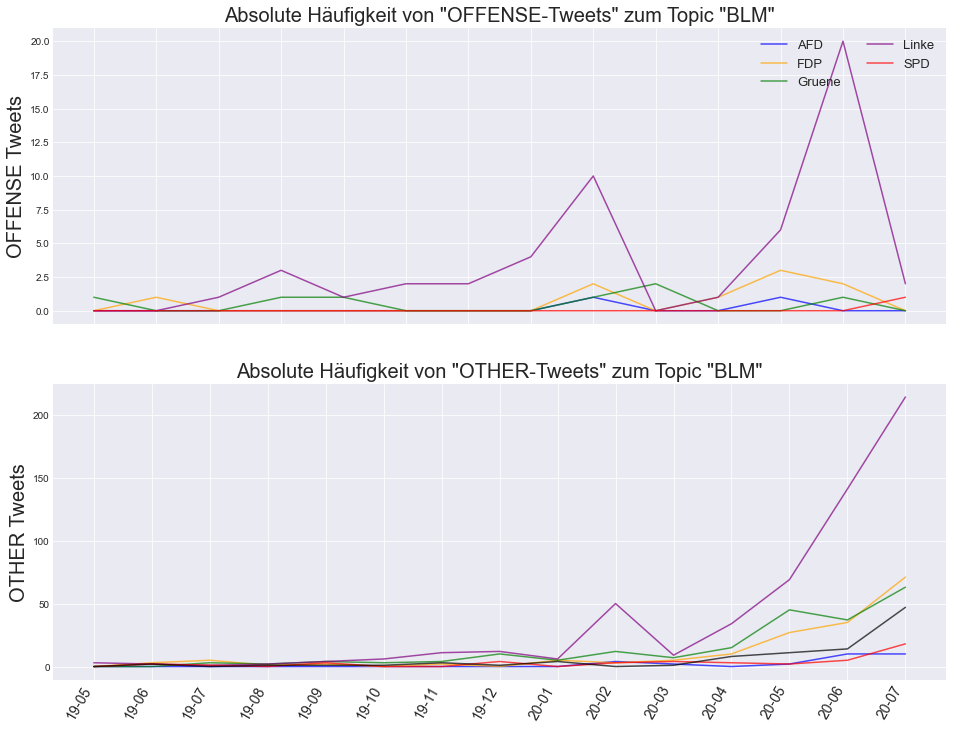

In [65]:
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import pandas as pd
import numpy as np

plt.style.use('seaborn-darkgrid')
my_palette = ['blue', 'orange', 'green', 'purple', 'red', 'black']
fig = plt.figure(figsize = (16, 12))


ax = fig.add_subplot(211)

num=0
for column in sent_BLM_piv_OF:
    ax.plot(sent_BLM_piv_OF.index, sent_BLM_piv_OF[column], color = my_palette[num], alpha=0.7, label = column)
    num+=1

#ax.plot(sent_BLM_piv_OF.index, sent_BLM_piv_OF['AFD'], marker='', color='blue', linewidth=4, alpha=0.7)
#x_tags = plt.xticks(sent_BLM_piv_OF.index, fontsize = 12, rotation = 35, ha = 'right')
plt.setp(ax.get_xticklabels(), visible=False)


ax.set_title('Absolute Häufigkeit von "OFFENSE-Tweets" zum Topic "BLM"', size = 20)
ylab = ax.set_ylabel('OFFENSE Tweets', size = 20)
plt.legend(loc = 1, ncol = 2, fontsize = 13)


ax = fig.add_subplot(212)

num=0
for column in sent_BLM_piv_OT:
    ax.plot(sent_BLM_piv_OT.index, sent_BLM_piv_OT[column], color = my_palette[num], alpha=0.7, label = column)
    num+=1

#ax.plot(sent_BLM_piv_OT.index, sent_BLM_piv_OT['AFD'], marker='', color='blue', linewidth=4, alpha=0.7)

ax.set_title('Absolute Häufigkeit von "OTHER-Tweets" zum Topic "BLM"', size = 20)
ylab = ax.set_ylabel('OTHER Tweets', size = 20)

#x_tags
x_tags = plt.xticks(sent_BLM_piv_OT.index, fontsize = 14, rotation = 60, ha = 'right')

## Anteil von OFFENSE-Tweets

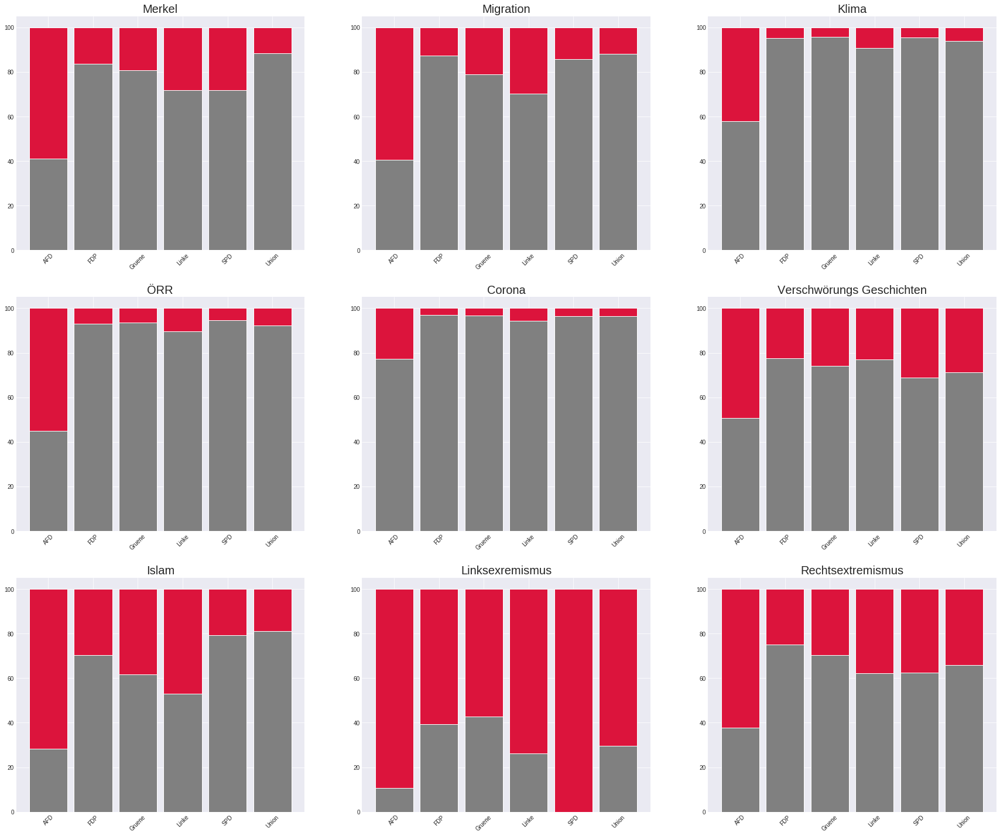

In [191]:
sent_Merkel = sent_df_Wien[sent_df_Wien['full_text_processed'].str.match(r'(.*Merkel.*)(?i)')==True]
sent_Mig = sent_df_Wien[sent_df_Wien['full_text_processed'].str.match(r'(.*Migration.*|.*Migrant.*|.*Flücht.*|.*Asyl.*)(?i)')==True]
sent_Klima = sent_df_Wien[sent_df_Wien['full_text_processed'].str.match(r'(.*Klima.*|.*Greta.*|.*Friday.*)(?i)')==True]
sent_GEZ = sent_df_Wien[sent_df_Wien['full_text_processed'].str.match(r'(.*ARD.*|.*ZDF.*|.*WDR.*|.*GEZ.*|.*ÖRR.*|.*Rundfunk.*|.*Staatsfunk.*)(?i)')==True]
sent_Corona = sent_df_Wien[sent_df_Wien['full_text_processed'].str.match(r'(.*Corona.*|.*Covid.*|.*Sars.*)(?i)')==True]
sent_ALU = sent_df_Wien[sent_df_Wien['full_text_processed'].str.match(r'(.*Verschwö.*|.*Aluhut.*|.*Hildmann.*|.*Impfpflicht.*|.*Widerstand2020.*|.*Hygienedemos.*|.*Fake News*|.*FakeNews.*)(?i)')==True]
sent_Islam = sent_df_Wien[sent_df_Wien['full_text_processed'].str.match(r'(.*Islam.*|.*Moslem.*|.*Muslim.*|.*Kopftuch.*|.*Koran.*|.*Mosche.*|.*Arab.*|.*Imam.*)(?i)')==True]
sent_LiEx = sent_df_Wien[sent_df_Wien['full_text_processed'].str.match(r'(.*Linksextrem.*)(?i)')==True]
sent_ReEx = sent_df_Wien[sent_df_Wien['full_text_processed'].str.match(r'(.*Rechtsextrem.*)(?i)')==True]

Topics = {}
#[sent_LiEx, sent_ReEx]
Topics['Merkel'] = sent_Merkel
Topics['Migration'] = sent_Mig
Topics['Klima'] = sent_Klima
Topics['ÖRR'] = sent_GEZ
Topics['Corona'] = sent_Corona
Topics['Verschwörungs Geschichten'] = sent_ALU
Topics['Islam'] = sent_Islam
Topics['Linksexremismus'] = sent_LiEx
Topics['Rechtsextremismus'] = sent_ReEx


barWidth = 0.85
fig = plt.figure(figsize = (30, 25))
    
for Topic, n in zip(Topics, range(1, len(Topics)+1)):

    pivot = pd.pivot_table(Topics[Topic], columns = ['predict'], index = ['user_party'], aggfunc = np.count_nonzero).fillna(0)


    # Data
    raw_data = {'greenBars': pivot['full_text']['OTHER'].values, 'orangeBars': pivot['full_text']['OFFENSE'].values}
    df = pd.DataFrame(raw_data)
 
    # From raw value to percentage
    totals = [i+j for i,j in zip(df['greenBars'], df['orangeBars'])]
    greenBars = [i / j * 100 for i,j in zip(df['greenBars'], totals)]
    orangeBars = [i / j * 100 for i,j in zip(df['orangeBars'], totals)]

    # plot
    ax = fig.add_subplot(3,3,n)

    # Create green Bars
    ax.bar(pivot['full_text'].index, greenBars, color='grey', edgecolor='white', width=barWidth)
    # Create orange Bars
    ax.bar(pivot['full_text'].index, orangeBars, bottom=greenBars, color='crimson', edgecolor='white', width=barWidth)
    ax.set_title(str(Topic), size = 20)
    
    # Custom x axis
    plt.xticks(pivot['full_text'].index, rotation =45)
    
    

### Anteil von Abgeordneten an 'OFFENSE-Tweets' zu besimmtem Topic

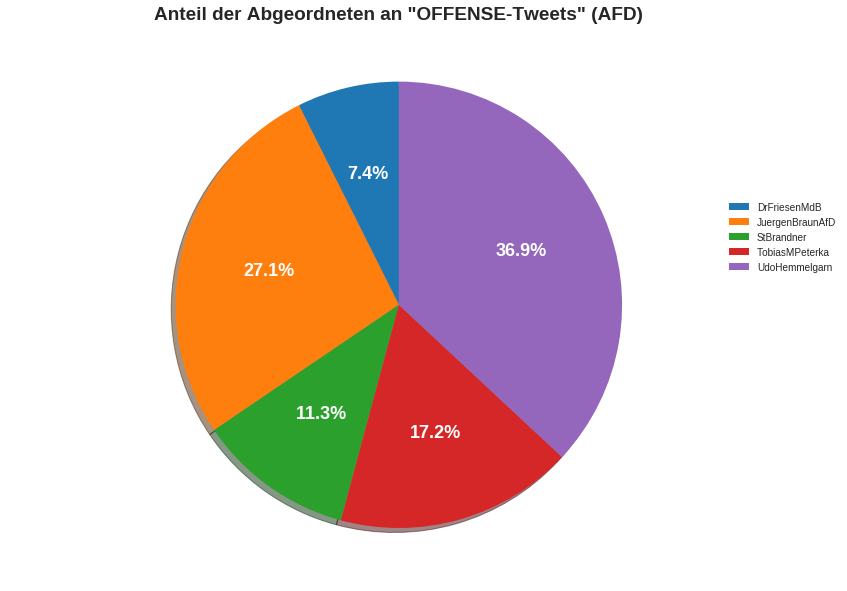

In [195]:
Topic = 'Corona'
partei = 'AFD'
T = 15

   
pivot = pd.pivot_table(Topics[Topic], columns = ['user_party', 'predict'], index = ['user_screen_name'], aggfunc = np.count_nonzero).fillna(0)
pivot_party = pivot['full_text'][partei]['OFFENSE']
pivot_party = pivot_party[pivot_party >= T]
pivot_party

fig1, ax1 = plt.subplots(figsize=(10, 15), subplot_kw=dict(aspect="equal"))
ax1.pie(pivot_party,
        textprops=dict(color="w", size=18, weight="bold"),
        labels = pivot_party.index, autopct='%1.1f%%', shadow=True, startangle=90)

ax1.legend(pivot_party.index, bbox_to_anchor=(0.7, 0, 0.6, 0.7))
ax1.set_title('Anteil der Abgeordneten an "OFFENSE-Tweets" ('+ str(partei)+')', weight = 'bold', size = 19)

plt.show()

In [197]:
pivot = pd.pivot_table(Topics[Topic], columns = ['user_party', 'predict'], index = ['user_screen_name'], aggfunc = np.count_nonzero).fillna(0)
pivot_party = pivot['full_text']['AFD']['OFFENSE']
pivot_party = pivot_party[pivot_party >= 5]
pivot_party

user_screen_name
AfDProtschka       11.0
Alice_Weidel        7.0
Beatrix_vStorch    14.0
DrFriesenMdB       15.0
DrMEspendiller     10.0
JensMaierAfD        5.0
JoanaCotar         13.0
JuergenBraunAfD    55.0
M_Reichardt_AfD    10.0
Martin_Sichert      5.0
S_Muenzenmaier     13.0
StBrandner         23.0
TobiasMPeterka     35.0
UdoHemmelgarn      75.0
WolfgangWiehle     10.0
Name: OFFENSE, dtype: float64

In [298]:
Topics['Migration']

,_id,created_at,id,full_text,is_quote_status,retweet_count,lang,created_at_datetime,user_id,user_name,...,user_followers_count,user_friends_count,user_created_at,partei,user_party,full_text_processed,date,month,week,predict
31,5e954d8b7973ce357348274c,Wed May 22 12:43:27 +0000 2019,1131178760655560705,Die Pressefreiheit wurde auf dem Altar der Mig...,False,452,de,2019-05-22 12:43:27,833398209053605888,Alice Weidel,...,99892,592,Sun Feb 19 19:29:51 +0000 2017,"{'_id': 5ed7e2502efe72dc73343cdd, 'Name': 'Ali...",AFD,Die Pressefreiheit wurde auf dem Altar der Mig...,2019-05-22,19-05,19-w20,OFFENSE
44,5e954dc47973ce3573483fcc,Mon May 20 07:12:32 +0000 2019,1130370705902755840,Vor einem Jahr antwortete die Bundesregierung ...,False,24,de,2019-05-20 07:12:32,868762469115846657,"Corinna Miazga, MdB",...,6486,108,Sun May 28 09:34:48 +0000 2017,"{'_id': 5ed7e2502efe72dc73343ce3, 'Name': 'Cor...",AFD,Vor einem Jahr antwortete die Bundesregierung ...,2019-05-20,19-05,19-w20,OTHER
70,5e954da87973ce357348332f,Thu May 16 07:11:44 +0000 2019,1128920954460102656,"Es ist schier unglaublich, was sich im #Seehof...",False,29,de,2019-05-16 07:11:44,1412287272,Stephan Protschka MdB,...,3976,1736,Wed May 08 08:33:07 +0000 2013,"{'_id': 5ed7e2502efe72dc73343ce0, 'Name': 'AfD...",AFD,Es ist schier unglaublich was sich im Seehofer...,2019-05-16,19-05,19-w19,OTHER
108,5e954e247973ce3573486784,Wed May 15 20:36:25 +0000 2019,1128761073627271169,"""Flüchtlinge"" reisen bequem mit dem Flugzeug i...",False,70,de,2019-05-15 20:36:25,809895794,"Götz Frömming, MdB",...,13829,2590,Sat Sep 08 00:53:26 +0000 2012,"{'_id': 5ed7e2502efe72dc73343cfb, 'Name': 'Gtz...",AFD,Flüchtlinge reisen bequem mit dem Flugzeug ins...,2019-05-15,19-05,19-w19,OTHER
129,5e954e637973ce3573487eb6,Wed May 29 19:41:38 +0000 2019,1133820717135466496,Herzliche Einladung zum Bürgerabend am Freitag...,False,56,de,2019-05-29 19:41:38,848618993015500802,Dr. Gottfried Curio,...,29130,3249,Sun Apr 02 19:31:49 +0000 2017,"{'_id': 5ed7e2502efe72dc73343cee, 'Name': 'Got...",AFD,Herzliche Einladung zum Bürgerabend am Freitag...,2019-05-29,19-05,19-w21,OTHER
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15814,5ed7829d0af7ab1cc9893ca1,Tue May 05 15:28:03 +0000 2020,1257693550654914561,Entwicklungszusammenarbeit darf nicht weiter z...,False,0,de,2020-05-05 15:28:03,46480553,Uwe Kekeritz,...,2833,652,Thu Jun 11 20:22:05 +0000 2009,"{'_id': 5ed7e2502efe72dc73343d54, 'Name': 'Uwe...",Gruene,Entwicklungszusammenarbeit darf nicht weiter z...,2020-05-05,20-05,20-w18,OTHER
15843,5ed782a00af7ab1cc989473f,Fri May 15 15:23:19 +0000 2020,1261316235452723200,"@BMZ_Bund lösen Sie die Sonderinitiativen auf,...",False,1,de,2020-05-15 15:23:19,2357675876,Ottmar von Holtz,...,1251,387,Sun Feb 23 08:22:18 +0000 2014,"{'_id': 5ed7e2502efe72dc73343d55, 'Name': 'OWv...",Gruene,BMZ_Bund lösen Sie die Sonderinitiativen auf b...,2020-05-15,20-05,20-w19,OTHER
16110,5ed783310af7ab1cc989873e,Fri May 08 16:05:47 +0000 2020,1258790208365002752,#NSU #Halle #Hanau haben tiefe Wunden geschlag...,False,3,de,2020-05-08 16:05:47,587862375,Canan Bayram,...,8747,2524,Tue May 22 21:58:57 +0000 2012,"{'_id': 5ed7e2502efe72dc73343d5d, 'Name': 'Lie...",Gruene,NSU Halle Hanau haben tiefe Wunden geschlagen ...,2020-05-08,20-05,20-w18,OFFENSE
16202,5ed783310af7ab1cc9898705,Sat May 23 14:39:07 +0000 2020,1264204214881976320,Am #RosaLuxemburgPlatz setzten heute Nachbar*i...,False,24,de,2020-05-23 14:39:07,587862375,Canan Bayram,...,8747,2524,Tue May 22 21:58:57 +0000 2012,"{'_id': 5ed7e2502efe72dc73343d5d, 'Name': 'Lie...",Gruene,Am RosaLuxemburgPlatz setzten heute Nachbar*in...,2020-05-23,20-05,20-w20,OTHER


# Detail Suchen im Datensatz

In [198]:
pd.set_option('display.max_colwidth', None)
sent_df_Wien.loc[(sent_df_Wien['date'] == datetime.date(2020,1,27)) 
                 & (sent_df_Wien['user_party'] == 'Union')
                 & (sent_df_Wien['predict'] == 'OFFENSE')
                ]['full_text']

21874                                                        Da wird auf Twitter zum „Frau Kanzler stürzen“ aufgerufen und der #AfD-MdB @Frank_Pasemann verbreitet den Aufruf munter weiter. Die #noAfD zeigt ihre Verachtung für unsere Demokratie immer offener. #AfDgehoertnichtzuDeutschland https://t.co/GPmaKzWRPg
79663                                                         Wir stehen heute mehr denn je in der Pflicht und Verantwortung, jüdisches Leben in Deutschland zu schützen. Jeder einzelne von uns ist aufgerufen, Hass, Hetze und Rassenwahn entgegenzutreten, ob auf der Straße oder in den sozialen Medien. #WeRemember
85188                                                                                                                                                                                                                                    @MartinH60615106 „Die Juden“, „Die Deutschen“, „Die Politik“... merken Sie was?
85189                                                        

In [199]:
# pd.set_option('display.max_rows', 0)
pd.set_option('display.max_rows', 500)

#mdp_partei = sample_df[['user_party', 'week', 'user_screen_name', 'predict']]
# mdp_partei = mdp_partei[mdp_partei['predict'] == 'OFFENSE']
partei_piv_name = pd.pivot_table(mdp_partei, columns = ['predict'], index = ['user_party','user_screen_name'], aggfunc = np.count_nonzero)
partei_piv_name

date         full_text            week        
predict                     OFFENSE   OTHER   OFFENSE   OTHER OFFENSE   OTHER
user_party user_screen_name                                                  
AFD        AfDProtschka       244.0   657.0     244.0   657.0   244.0   657.0
           Alice_Weidel       175.0   302.0     175.0   302.0   175.0   302.0
           AndreasBleckMdB     97.0   216.0      97.0   216.0    97.0   216.0
           Beatrix_vStorch    245.0   264.0     245.0   264.0   245.0   264.0
           BerndBaumannAfD     26.0    20.0      26.0    20.0    26.0    20.0
...                             ...     ...       ...     ...     ...     ...
Union      thomasgebhart        3.0   116.0       3.0   116.0     3.0   116.0
           thorsten_frei        5.0    37.0       5.0    37.0     5.0    37.0
           tj_tweets           21.0   787.0      21.0   787.0    21.0   787.0
           uhl_markus           NaN     4.0       NaN     4.0     NaN     4.0
           wanderwitz         133.0  1754.0     133.0  1754.0   133.0  1754.0

[503 rows x 6 columns]

In [200]:
pd.set_option('display.max_colwidth', None)
import datetime
# sent_df_Wien[sent_df_Wien['user_screen_name'] == 'StBrandner']
sent_df_Wien.loc[(
#         sent_df_Wien['date'] >= datetime.date(2020,1,26))
#                  & (sent_df_Wien['date'] <= datetime.date(2020,2,1))
#                  & (sent_df_Wien['user_party'] == 'AFD')
#                  & (sent_df_Wien['predict'] == 'OFFENSE')
                  (sent_df_Wien['user_screen_name'] == 'RonjaKemmer'))
        ]
# sent_df_Wien.loc[(sent_df_Wien['week'] == '20-w22') 
#                  & (sent_df_Wien['user_party'] == 'Gruene')
#                  & (sent_df_Wien['predict'] == 'OFFENSE')
#                 ].tail(200)

,_id,created_at,id,full_text,is_quote_status,retweet_count,lang,created_at_datetime,user_id,user_name,...,user_created_at,partei,user_party,full_text_processed,Monat,Woche,predict,date,month,week
34295,5ed759bb199f855a7da9040b,Fri May 10 19:45:37 +0000 2019,1126936346327756800,Danke an @ManfredWeber und @akk für den starken Auftritt in #Ulm - ein flammendes Plädoyer für Europa - almost singing in the rain.. ;-) #EuropeanElections2019 @HagelManuel @CDU @CDU_BW https://t.co/aqvW0l641x,True,6,de,2019-05-10 19:45:37,2405039875,Ronja Kemmer,...,Sat Mar 22 20:52:19 +0000 2014,"{'_id': 5ed7e2502efe72dc73343bfe, 'Name': 'RonjaKemmer', 'Partei': 'Union'}",Union,Danke an ManfredWeber und akk für den starken Auftritt in Ulm - ein flammendes Plädoyer für Europa - almost singing in the rain - EuropeanElections2019 HagelManuel CDU CDU_BW,19-05,19-w18,OTHER,2019-05-10,19-05,19-w18
87751,5f27e2b670fe9c7781ec1bd3,Thu May 16 10:07:32 +0000 2019,1128965195903193088,2018: @DoroBaer erwähnt das #Flugtaxi im @heutejournal - die Menge tobt \n2019: Testflüge in Deutschland erfolgreich\nAb 2025: Alltagsbetrieb geplant \n@Lilium @volocopter @c_netz @cducsubt \n\nhttps://t.co/dSXUuIEtFt,False,12,de,2019-05-16 10:07:32,2405039875,Ronja Kemmer,...,Sat Mar 22 20:52:19 +0000 2014,"{'_id': 5ed7e2502efe72dc73343bfe, 'Name': 'RonjaKemmer', 'Partei': 'Union'}",Union,2018 DoroBaer erwähnt das Flugtaxi im heutejournal - die Menge tobt 2019 Testflüge in Deutschland erfolgreichAb 2025 Alltagsbetrieb geplant Lilium volocopter c_netz cducsubt,19-05,19-w19,OTHER,2019-05-16,19-05,19-w19
96947,5f27f050f97a3f33284a70ab,Thu May 16 17:51:10 +0000 2019,1129081871604879360,@fhaserodt @c_netz @DoroBaer @heutejournal @Lilium @volocopter @cducsubt 2019 - für mich eher Gegenwart als Zukunft,False,0,de,2019-05-16 17:51:10,2405039875,Ronja Kemmer,...,Sat Mar 22 20:52:19 +0000 2014,"{'_id': 5ed7e2502efe72dc73343bfe, 'Name': 'RonjaKemmer', 'Partei': 'Union'}",Union,fhaserodt c_netz DoroBaer heutejournal Lilium volocopter cducsubt 2019 - für mich eher Gegenwart als Zukunft,19-05,19-w19,OTHER,2019-05-16,19-05,19-w19
87750,5f27e2b670fe9c7781ec1bce,Sat May 25 17:36:43 +0000 2019,1132339727762362369,"Jung.Frei.Europäisch - morgen an der Europawahl teilnehmen: weil es eben nicht egal ist, wie es mit unserem Europa weiter geht. Wir müssen für die Errungenschaften der #EuropeanUnion eintreten! #EuropeanElections2019 #europeanelections #ju4eu @Junge_Union https://t.co/2pN1sINxzu",False,3,de,2019-05-25 17:36:43,2405039875,Ronja Kemmer,...,Sat Mar 22 20:52:19 +0000 2014,"{'_id': 5ed7e2502efe72dc73343bfe, 'Name': 'RonjaKemmer', 'Partei': 'Union'}",Union,JungFreiEuropäisch - morgen an der Europawahl teilnehmen weil es eben nicht egal ist wie es mit unserem Europa weiter geht Wir müssen für die Errungenschaften der EuropeanUnion eintreten EuropeanElections2019 europeanelections ju4eu Junge_Union,19-05,19-w20,OTHER,2019-05-25,19-05,19-w20
87748,5f27e2b670fe9c7781ec1bb4,Fri Jun 07 18:08:14 +0000 2019,1137058699174977536,@sigmargabriel fordert eine restriktivere Migrationspolitik. Aha- war das nicht der @spdde Vorsitzende mit dem #refugeeswelcome Button auf der Regierungsbank?! #gabriel #spd @spdbt https://t.co/xCdUikbGPG via @faznet,False,1,de,2019-06-07 18:08:14,2405039875,Ronja Kemmer,...,Sat Mar 22 20:52:19 +0000 2014,"{'_id': 5ed7e2502efe72dc73343bfe, 'Name': 'RonjaKemmer', 'Partei': 'Union'}",Union,sigmargabriel fordert eine restriktivere Migrationspolitik Aha- war das nicht der spdde Vorsitzende mit dem refugeeswelcome Button auf der Regierungsbank gabriel spd spdbt,19-06,19-w22,OTHER,2019-06-07,19-06,19-w22
87749,5f27e2b670fe9c7781ec1bc8,Sun Jun 02 13:37:56 +0000 2019,1135178738482724864,"Schon interessant, wenn sich einer der Brandstifter über das Feuer beschwert... #SPD #nahles https://t.co/mKMzrsZVnh",True,4,de,2019-06-02 13:37:56,2405039875,Ronja Kemmer,...,Sat Mar 22 20:52:19 +0000 2014,"{'_id': 5ed7e2502efe72dc73343bfe, 'Name': 'RonjaKemmer', 'Partei': 'Union'}",Union,Schon interessant

In [6]:
sent_Mig.loc[(sent_Mig['date'] <= datetime.date(2019,6,8))
                 & (sent_Mig['date'] >= datetime.date(2019,6,2))
                 & (sent_Mig['user_party'] == 'SPD')
#                  & (sent_df_Wien['predict'] == 'OFFENSE')
                ]

NameError: name 'sent_Mig' is not defined

In [437]:
print(sent_df_Wien.loc[(sent_df_Wien['week'] == '19-w22')]['date'].min())
print(sent_df_Wien.loc[(sent_df_Wien['week'] == '19-w22')]['date'].max())

2019-06-02
2019-06-08
